# Entire Training Visualization

In [6]:
PATH="../../control_tests_n/" # Fodler with the files for training
yellow = '\033[93m'
green = '\033[92m'
red = '\033[91m'
blue = '\033[94m'
pink = '\033[95m'
black = '\033[90m'

### Bytes in flight trace

In [7]:
import csv
import matplotlib.pyplot as plt
import sys
import math

SHOW=True
MULTI_GRAPH=False
SMOOTHENING=False
ONLY_STATS=False
s_factor=0.9


PKT_SIZE = 88


'''
TODO: 
o Add functionality where you only plot flows that send more than x bytes of data
o Sort stats and graphs by flow size
o Organize plots by flow size (larger flows have larger graphs)
o Custom smoothening function
'''

fields=["time", "frame_time_rel", "tcp_time_rel", "frame_num", "frame_len", "ip_src", "src_port", "ip_dest", "dest_port", "tcp_len", "seq", "ack"]

class pkt:
    contents=[]
    def __init__(self, fields) -> None:
        self.contents=[]
        for f in fields:
            self.contents.append(f)

    def get(self, field):
        return self.contents[fields.index(field)]
        

def process_flows(cc, dir,p="y"):
    name = dir+cc+"-tcp.csv"
    with open(name) as csv_file:
        print("Reading "+name+"...")
        csv_reader = csv.reader(csv_file, delimiter=',')
        line_count = 0
        total_bytes=0
        '''
        Flow tracking:
        o Identify all packets that are either sourced from or headed to 100.64.0.2
        o Group different flows by client's port
        '''
        flows={}
        data_sent=0
        # ACK and RTX measurement
        ooa = set()
        rp = set()
        ooaCount=0
        rpCount=0
        daCount=0
        backAck=0
        for row in csv_reader:
            reTx=0
            
            ooAck=0
            dupAck=0
            retPacket=0
            
            packet=pkt(row)
            ackPkt=False
            validPkt=False
            if line_count==0:
                # reject the header
                line_count+=1
                continue
            if data_sent == 0 : 
                if "100.64.0." in packet.get("ip_src"):
                    num = int(packet.get("ip_src")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_src")
                if "100.64.0." in packet.get("ip_dest"):
                    num = int(packet.get("ip_dest")[-1])
                    if num%2==0:
                        data_sent=1
                        host_port=packet.get("ip_dest")
                if data_sent == 0:
                    continue
            if packet.get("ip_src")==host_port and packet.get("frame_time_rel")!='' and packet.get("ack")!='': 
                # we care about this ACK packet
                validPkt=True
                ackPkt=True
                port=packet.get("src_port")
                #PORTCHECK
#                 if int(port) != 50468:
#                     continue
                if port not in flows:
                    flows[port]={"OOA":[],"DA":[],"max_seq":0,"loss_bif":0,"max_ack":int(packet.get("ack")),"serverip":packet.get("ip_dest"), "serverport":packet.get("dest_port"), "act_times":[],"times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0, "drop":[], "next":0, "retrans":[]}
                else:
                    # check for Out of Order Ack (OOA)
                    if int(packet.get("ack")) <= int(flows[port]["max_ack"]):
                        if int(packet.get("ack")) == backAck :
                            dupAck = True
                            flows[port]["DA"].append(float(packet.get("frame_time_rel")))
                        else :
                            ooAck = True
                            flows[port]["OOA"].append(float(packet.get("frame_time_rel")))
                        backAck = int(packet.get("ack"))
                    # update max_ack
                    flows[port]["max_ack"] = max(flows[port]["max_ack"], int(packet.get("ack")))
                    if int(packet.get("seq")) < flows[port]["max_ack"]:
                        reTx += int(packet.get("tcp_len"))
#                     flows[port]["times"].append(float(packet.get("frame_time_rel")) )
                    
            elif packet.get("ip_dest")==host_port and packet.get("frame_time_rel")!='' and packet.get("seq")!='':
                #we care about this Data packet
                validPkt=True
                port=packet.get("dest_port")
                #PORTCHECK
#                 if int(port) != 50468:
#                     continue
                seq=int(packet.get("seq"))
                tcp_len=int(packet.get("tcp_len"))
                if port not in flows:
                    flows[port]={"OOA":[],"DA":[],"max_seq":int(packet.get("seq")),"loss_bif":0,"max_ack":0,"serverip":packet.get("ip_src"), "serverport":packet.get("src_port"),"act_times":[], "times":[], "windows":[], "cwnd":[], "bif":0, "last_ack":0, "last_seq":0, "pif":0, "drop":[], "next":0, "retrans":[]}
                
                else:
                    flows[port]["max_seq"] = max(flows[port]["max_seq"], int(packet.get("seq")))
                
                
                if int(packet.get("seq")) < flows[port]["max_seq"] :
                    retPacket = True
                    flows[port]["retrans"].append(flows[port]["times"][-1])
                    
            if validPkt==True:
                bif = 0
                normal_est_bif = int(flows[port]["max_seq"]) - int(flows[port]["max_ack"]) + PKT_SIZE#+ reTx
                loss_est_bif = flows[port]["loss_bif"]
                if ackPkt and dupAck and len(flows[port]["windows"]) > 10:
                    if dupAck:
                        # if we have received a duplicate ack then we need to reduce the bytes in flight by packet size
                        # we also increase max ack to correct for the consolidated ack being sent later
                        loss_est_bif = int(flows[port]["windows"][-1]) - PKT_SIZE
                        flows[port]["max_ack"] += PKT_SIZE
                        
                        bif = min( normal_est_bif, loss_est_bif)
                        if p == "y" :
                            print(green+"Duplicate Ack",int(packet.get("ack")),"Max Ack",flows[port]["max_ack"],"BIF",bif)
                        
#                     elif ooAck:
#                         # first out of order ack that we have recieved not a duplicated ack
#                         # the reason would be restransimitted packet so dont need to correct for this
                        
                elif ackPkt :
                    loss_est_bif = normal_est_bif 
                    bif = normal_est_bif    
                    if ooAck :
                        ooaCount+=1
                        if p == "y":
                            print(red+"Out of Order Ack",int(packet.get("ack")),"Max Ack",flows[port]["max_ack"],"BIF",normal_est_bif)
                        ooa.add(int(packet.get("ack")))
                    else:
                        if p == "y":
                            print(black+"Inorder Ack",int(packet.get("ack")),"Max Seq",flows[port]["max_seq"],"BIF",normal_est_bif)
                else :
                    bif = normal_est_bif
                    if retPacket==True:
                        rpCount+=1
                        rp.add(int(packet.get("seq")))
                        if p == "y":
                            print(pink+"Retransmitted Packet",int(packet.get("seq")), "Next", flows[port]["max_seq"]+PKT_SIZE, "BIF",bif)
                    else :
                        if p == "y":
                            print(blue+"Inorder Packet", int(packet.get("seq")), "Next", flows[port]["max_seq"]+PKT_SIZE, "BIF",bif)
                flows[port]["loss_bif"] = loss_est_bif
                flows[port]["windows"].append( int(bif) )
                flows[port]["times"].append( float(packet.get("frame_time_rel")) )
                
#                 if ackPkt and dupAck and len(flows[port]["windows"]) > 10: # we have received atleast the first window
# #                     if len(flows[port]["windows"]) < 2000: # print reTx in first 200 packets
# #                         print( packet.get("ack"), flows[port]["max_ack"])
#                     loss_est_bif = int(flows[port]["windows"][-1]) - PKT_SIZE
#                     flows[port]["max_ack"] += PKT_SIZE
#                     bif = min( normal_est_bif, loss_est_bif )
#                 elif ackPkt:
#                     loss_est_bif = normal_est_bif 
#                     bif = normal_est_bif
#                 else:
#                     bif = normal_est_bif
#                 flows[port]["loss_bif"] = loss_est_bif
#                 flows[port]["windows"].append( int(bif) )
            
            
            line_count+=1
            total_bytes+=int(packet.get("frame_len"))
            #print(line_count, total_bytes)
            
#         print("total bytes processed:", total_bytes/1000, "KBytes for", cc, "(unlimited)")
        if p == "y":
            print("Out of Order Acks",len(ooa),"Retransmitted Packets",len(rp))
            print("Count Out of Order Acks",ooaCount,"Retransmitted Packets",rpCount)
            print("OOA",ooa,"RP",rp)
    return flows

def custom_smooth_function():
    pass

def get_flow_stats(flows):
    num=len(flows.keys())
    print("FLOW STATISTICS: \nNumber of flows: ", num)
    print("------------------------------------------------------------------------------")
    print('%6s'%"port", '%15s'%"SrcIP", '%8s'%"SrcPort",  '%8s'%"duration",  '%8s'%"start",  '%8s'%"end", '%8s'%"Sent (B)", '%8s'%"Recv (B)",)
    for k in flows.keys():
        print('%6s'%k, '%15s'%flows[k]["serverip"], '%8s'%flows[k]["serverport"], '%8s'%str('%.2f'%(flows[k]["times"][-1]-flows[k]["times"][0])), '%8s'%str('%.2f'%flows[k]["times"][0]), '%8s'%str('%.2f'%flows[k]["times"][-1]), '%8s'%flows[k]["last_seq"], '%8s'%flows[k]["last_ack"])
        #print("    * Flow "+str(k)+": ", flows[k]["last_ack"], " ", flows[k]["last_seq"], " bytes transfered.")
    return num

def run(files):
    flows = {}
    for f in files:
        algo_cc=f
        #Get the data for all the flows
        print("==============================================================================")
        print("opening trace ../measurements/"+algo_cc+".csv...")
        flows = process_flows(algo_cc, "./Nebby/measurements-new-btl/50-200-2-60/")
        #decide on final graph layout
        num = get_flow_stats(flows)

        if ONLY_STATS:
            sys.exit()

        if num==1:
            MULTI_GRAPH=False
        #grid size
        if MULTI_GRAPH:
            size=(0,0)
            grids={1:(2,2), 2:(2,2), 4:(2,2), 6:(2,3), 9:(3,3), 12:(3,4), 15:(3,5), 16:(4,4), 20:(5,4), 24:(6,4), 30:(6,5), 36:(6,6), 40:(8,5), 42:(8,7), 49:(7,7)}
            g=num
            while g<=49 and g not in grids:
                g+=1
            if g in grids.keys():
                size=grids[g]
            else:
                size=grids[49]  
            fig, axs = plt.subplots(size[0], size[1])
            for i in range(size[0]):
                for j in range(size[1]):
                    #axs[i][j].legend(loc="lower right")
                    if i==size[0]-1:
                        axs[i][j].set_xlabel("Time (s)")
                    if j==0:
                        axs[i][j].set_ylabel("Bytes in flight")
        else:
            plt.xlabel("Time (s)")
            plt.ylabel("Bytes in flight")
        counter=0
        for port in flows.keys():
            if MULTI_GRAPH:  
                axs[counter%size[0]][(counter//size[0])%size[1]].scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
                axs[counter%size[0]][(counter//size[0])%size[1]].plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
            else:
                plt.plot(flows[port]["times"], flows[port]["windows"], label=str(port), linestyle="solid")
                plt.scatter(flows[port]["times"], flows[port]["windows"], color="#858585")
            counter+=1
        if MULTI_GRAPH:
            counter=0
            for port in flows.keys():
                axs[counter%size[0]][(counter//size[0])%size[1]].legend()
                counter+=1
        else:
            plt.legend()
        if MULTI_GRAPH:
            fig.set_size_inches(16, 12)
        if SHOW:
            plt.show()
        else:
            plt.savefig("../logs/results/"+algo_cc+".png", dpi=600, bbox_inches='tight', pad_inches=0)
    return flows


def get_window(f,p,t=1,path):
    algo_cc = f
    flows = process_flows(algo_cc,path,p=p)
#     flows = process_flows(algo_cc, "../measurements/m/",p=p)
#     flows = process_flows(algo_cc, "./Nebby/measurements/",p=p)    
#     flows = process_flows(algo_cc, "./Nebby/measurements-new-btl/50-200-2-60/",p=p)
#     flows = process_flows(algo_cc, "./Nebby/measurements-100-150/",p=p)
    params = algo_cc.split("-")
    data = []
    time = []
    drops = []
    retrans = []
    OOA = []
    DA = []
    use_port = 0
    maxx = 0
    print("All Ports : ", flows.keys())
    for port in flows.keys():
        if len(flows[port]['windows']) > maxx:
            maxx = len(flows[port]['windows'])
            use_port = port
    print("Port",use_port)
    data = flows[use_port]['windows']
    time = flows[use_port]['times']
    retrans = flows[use_port]['retrans']
    OOA = flows[use_port]['OOA']
    DA = flows[use_port]['DA']
    if p == "y":
        plt.plot(time, data)
#     time_index = len(time)-1
#     for index in range(len(flows[use_port]['times'])-1):
#         if flows[use_port]['times'][index+1] - flows[use_port]['times'][index] > :
#             time_index = index
#     time_last = flows[use_port]['times'][time_index]
#     data = data[:time_index+1]
#     time = time[:time_index+1]
    if t==2:
        return data, time, retrans, OOA, DA
    if t==1:
        return data, time, retrans

Reading ../../control_tests_n/reno-51-0-50-200-2-aws-88-60-tcp.csv...
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 1 Next 89 BIF 88
Inorder Ack 2 Max Seq 1 BIF 87
Out of Order Ack 2 Max Ack 2 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Ack 2 Max Seq 1 BIF 87
Inorder Packet 2 Next 90 BIF 88
Duplicate Ack 2 Max Ack 90 BIF 0
Inorder Packet 2 Next 90 BIF 0
Out of Order Ack 3 Max Ack 90 BIF 0
Inorder Ack 0 Max Seq 0 BIF 88
Inorder Packet 0 Next 88 BIF 88
Inorder Ack 1 Max Seq 0 BIF 87
Out of Order Ack 1 Max Ack 1 BIF 87
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 3 Next 91 BIF 1
Inorder Packet 1 Next 89 BIF 88
Inorder Packet 245 Next 333 BIF 332
Inorder Packet 489 Next 577 BIF 576
Inorder Packet 733 Next 821 BIF 820
Inorder Packet 977 Next 1065 BIF 1064
Inorder Packet 1221 Next 1309 BIF 1308
Inorder Packet 1465 Next 1553 BIF 1552
Inorder Packet 1709 Next 1

Inorder Packet 371125 Next 371213 BIF 3016
Inorder Packet 371369 Next 371457 BIF 3260
Inorder Packet 371613 Next 371701 BIF 3504
Inorder Ack 368441 Max Seq 371613 BIF 3260
Inorder Ack 368685 Max Seq 371613 BIF 3016
Inorder Ack 368929 Max Seq 371613 BIF 2772
Inorder Ack 369173 Max Seq 371613 BIF 2528
Inorder Ack 369417 Max Seq 371613 BIF 2284
Inorder Packet 371857 Next 371945 BIF 2528
Inorder Packet 372101 Next 372189 BIF 2772
Inorder Packet 372345 Next 372433 BIF 3016
Inorder Packet 372589 Next 372677 BIF 3260
Inorder Packet 372833 Next 372921 BIF 3504
Inorder Ack 369661 Max Seq 372833 BIF 3260
Inorder Ack 369905 Max Seq 372833 BIF 3016
Inorder Ack 370149 Max Seq 372833 BIF 2772
Inorder Ack 370393 Max Seq 372833 BIF 2528
Inorder Ack 370637 Max Seq 372833 BIF 2284
Inorder Packet 373077 Next 373165 BIF 2528
Inorder Packet 373321 Next 373409 BIF 2772
Inorder Packet 373565 Next 373653 BIF 3016
Inorder Packet 373809 Next 373897 BIF 3260
Inorder Packet 374053 Next 374141 BIF 3504
Inorder Pac

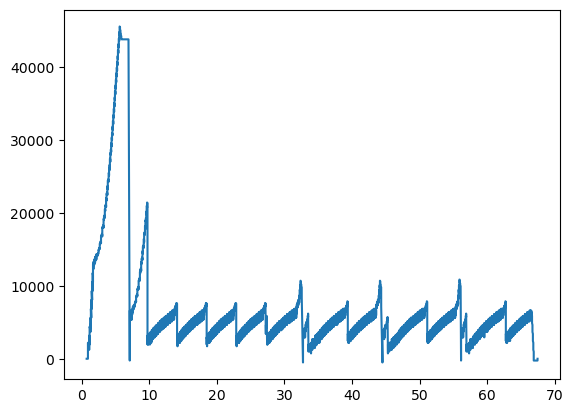

In [8]:
data, time, retrans = get_window("reno-51-0-50-200-2-aws-88-60",p="y",t=1)

### FFT Filter and features

In [9]:
import matplotlib.pyplot as plt
from scipy.fft import rfft, rfftfreq
from scipy.fft import irfft
import numpy as np
import statistics
from statistics import mean, pstdev
import pandas as pd

def smoothen(time, data, rtt):
    # Smoothening 
    left = 0
    right = 0
    run_sum = 0
    avg_data = []
    new_time = []
    roll_time = time
    roll_data = data
    while right < len(roll_time):
        while(right < len(roll_time) and (roll_time[right]-roll_time[left] < 2*rtt)):
            run_sum+=roll_data[right]
            right+=1
        new_time.append(float(roll_time[right-1]+roll_time[left])/2)
        avg_data.append(float(run_sum)/(right-left))
        run_sum-=roll_data[left]
        left+=1
    return new_time, avg_data


def get_fft(data):
    n = len(data)
    data_step = 0.002
    yf = rfft(data)
    xf = rfftfreq(n,data_step)
    return yf,xf

def get_fft_smoothening(data, time, ax,rtt,p):
    rtt=rtt
    yf, xf = get_fft(data)
    thresh  = (1/rtt)
    thresh_ind = 0
    for i in range(len(xf)) :
        freq = xf[i]
        if(freq > thresh):
            thresh_ind = i
            break
            
    yf_clean = yf
    yf_clean[thresh_ind+1:] = 0
    new_f_clean = irfft(yf_clean)
    start_len = len(time) - len(new_f_clean)

    plot_data = new_f_clean
#     if p=="y":
#         ax.plot(time[start_len:], plot_data, 'k', label='FFT smoothening', linewidth=1.5)

    plot_time = time[start_len:] 
    return plot_time, plot_data

def plot_d(ax, time, data, c, l, alpha=1):
    ax.plot(time, data, color=c, lw=2, label = l,alpha=alpha)


def plot_one_bt(f, p,t=1):
    print(f)
    fs = f.split("-")

    pre = int(fs[2])
    post = int(fs[3])
    rtt = float(((pre+post)*2))/1000
    ax = 0
    if t==1:
        data, time, retrans = get_window(f,"n",t,PATH)
    elif t==2:
        data, time, retrans, OOA, DA = get_window(f,"n",t,PATH)
    if p == 'y':
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        for t in retrans :
            plt.axvline(x = t, color = 'm',alpha=0.5)
        if t == 2:
            for t in OOA :
                plt.axvline(x = t, color = 'k', lw=2)
            for t in DA:
                plt.axvline(x = t, color = 'g', lw=0.5, alpha = 0.5)
        plot_d(ax,time,data, "r","Original")
    time, data = get_fft_smoothening(data, time, ax,rtt,"y")

    #         plot_d(ax,time,data,"b","FFT Smoothened" )
#         print(len(time), len(data))
    time, data = smoothen(time, data, rtt)
#         print(len(time), len(data))
    if p == 'y':
        plot_d(ax, time, data, "b", "Smoothened",alpha=0.5)
        ax.legend()
#             plt.savefig("./plots/"+f+".png")
        plt.show()
#     return time, data, grad_time, grad_data, rtt
#     print("Black : OOA, Green : DA, Magenta : RP")
    return time, data, retrans, rtt 


def get_time_features(retrans,time,rtt):
    time_thresh = 20*rtt
    features = []
    for i in range(1, len(retrans)):
        if retrans[i]-retrans[i-1] >= time_thresh:
            features.append([retrans[i-1], retrans[i]])
    # add a feature that finished when the experiment ends
    if len(retrans) > 0  and time[-1] - retrans[-1] > 20*rtt :
        features.append([retrans[-1],time[-1]])
    return features

def get_features(time, features):
    left = 0
    right = 0
    feature_index = 0
    in_feature = 0
    index_features = []
    while right < len(time) and feature_index < len(features): 
        if in_feature == 0 and time[right]>=features[feature_index][0]:
            in_feature = 1
            left = right
        elif in_feature == 1 and time[right] > features[feature_index][1]:
            in_feature = 0
            index_features.append([left, right-1])
            feature_index+=1
        right+=1
    if in_feature == 1:
        index_features.append([left, right-1])
    return index_features

def get_plot_features(curr_file, p):
    time, data, retrans, rtt = plot_one_bt(curr_file,p=p,t=1)
    time_features = get_time_features(retrans,time,rtt)
    features = get_features(time, time_features)    
    if p == 'y':
        fig, ax = plt.subplots(1,1, figsize=(15,8))
        plot_d(ax, time, data, "b", "Smoothened")
        for ft in features : 
#             print(time[ft[1]]-time[ft[0]])
            ax.plot(time[ft[0]:ft[1]+1], data[ft[0]:ft[1]+1], color = 'r')
        plt.show()
    return time, data, features


cubic-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41026', '41030'])
Port 41030


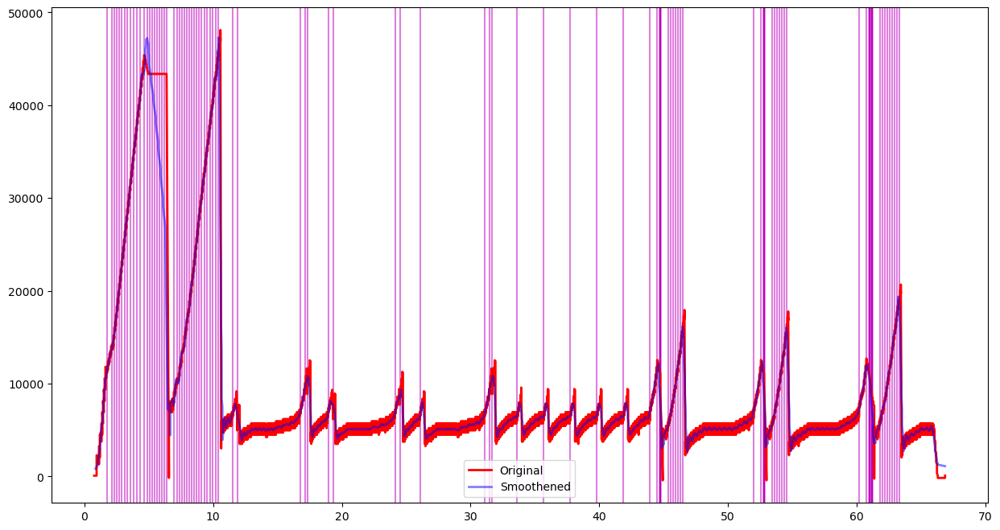

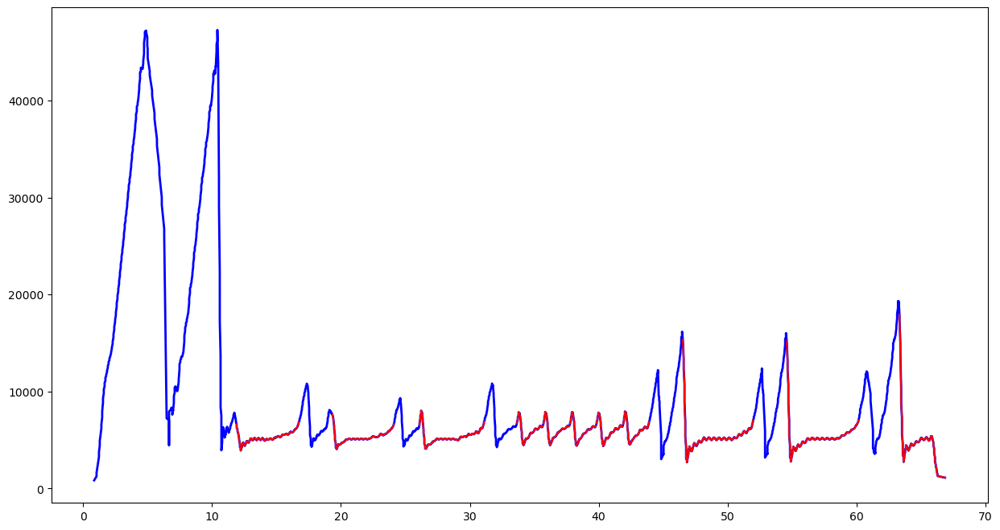

In [12]:
data, time, retrans = get_plot_features("cubic-51-0-50-200-2-aws-88-60",p="y")

### Sampling from the features to reduce dimensionality

In [36]:
import bisect
def lower_bound(arr, target):
    index = bisect.bisect_left(arr, target)
    return index

def sample_data_time(time, data, ss, m):
    curr_time, curr_data = adjust(time, data)
    tp = curr_time[len(curr_time)-1] - curr_time[0]
    step = tp/m
    samp_time = [curr_time[0] + i*step for i in range(m)]
    x = np.random.uniform(0,math.pi,ss)
    tr_x = np.cos(x)
    tr_x += 1
    tr_x *= (m-1)/2
    ind = [int(round(e, 0)) for e in tr_x]
    sort_ind = sorted(ind)
    tr_time = [samp_time[i] for i in sort_ind]
    new_time = []
    new_data = []
    for t in tr_time :
        i = lower_bound(curr_time, t)
        temp_t = 0
        temp_d = 0
        if round(t,6) == round(curr_time[i],6):
            temp_t = curr_time[i]
            temp_d = curr_data[i]
        else : 
            if i == 0 :
                temp_t = curr_time[i]
                temp_d = curr_data[i]
            elif i == len(curr_time)-1 :
                temp_t = curr_time[i]
                temp_d = curr_data[i]
            else :
                temp_t = (curr_time[i-1] + curr_time[i])/2
                temp_d = (curr_data[i-1] + curr_data[i])/2
        new_time.append(temp_t)
        new_data.append(temp_d)
    new_data.insert(0,curr_data[0])
    new_data.append(curr_data[-1])
    new_time.insert(0,curr_time[0])
    new_time.append(curr_time[-1])
#     return curr_time, curr_data
    return new_time, new_data

def adjust(time, data):
    start = data.index(min(data[:int(len(data)/2)]))
    end = data.index(max(data[int(len(data)/2):]))
#     print("Difference in max and min ", end-start)
    if end - start <= 0: 
        return time, data
    new_time = time[start:end+1]
    new_data = data[start:end+1]
    return new_time, new_data

# Taking 100 as the threshold is fine 
# Now we have to see how the graphs look if we use it. 
# var = ["reno", "cubic", "bbr"]
def getRed(files,ss=125,p="y", ft_thresh=100):
    results = []
    for file in files :   
        f_split = file.split("-")
        v = f_split[0] + "-" + f_split[1]
        rtt = float((int(f_split[2]) + int(f_split[3]))*2)/1000
        bdp = float(rtt*1000*int(f_split[4])*int(f_split[5]))/8
        print(file)
        print("RTT",rtt,"BDP",bdp)
        time, data, features = get_plot_features(file, p=p)
        count = 1
        for ft in features : 
            if count > ft_thresh:
                break
            curr_time = time[ft[0]:ft[1]+1]
            curr_data = data[ft[0]:ft[1]+1]
            tr_time, tr_data = sample_data_time(curr_time, curr_data, ss, 1000)
            tr_time_pd = pd.DataFrame(tr_time)
            tr_data_pd = pd.DataFrame(tr_data)
            tr_time = list(tr_time_pd.rolling(25, center=True).mean().dropna()[0])
            tr_data = list(tr_data_pd.rolling(25, center=True).mean().dropna()[0])
            print("Feature Length ", len(tr_data))
            if p == "y" :
                plt.plot(curr_time, curr_data, c='b', alpha = 0.5, lw = 5)
                plt.plot(tr_time, tr_data, c='r', alpha = 1)
                plt.scatter(tr_time, tr_data, c='k')
#                 plt.scatter(tr_time, tr_data, c='r', s=10)
                plt.title(v)
                plt.show()
            results.append(
                {v+"_"+"data"+"_"+str(count):tr_data,
                     v+"_"+"time"+"_"+str(count):tr_time,
                        v+"_"+"rtt"+"_"+str(count):rtt, 
                             v+"_"+"bdp"+"_"+str(count):bdp})
            count+=1
    return results
# results = getRed(var)

#### ss - sample size, ft_thresh = no of features to extract

cubic-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41026', '41030'])
Port 41030


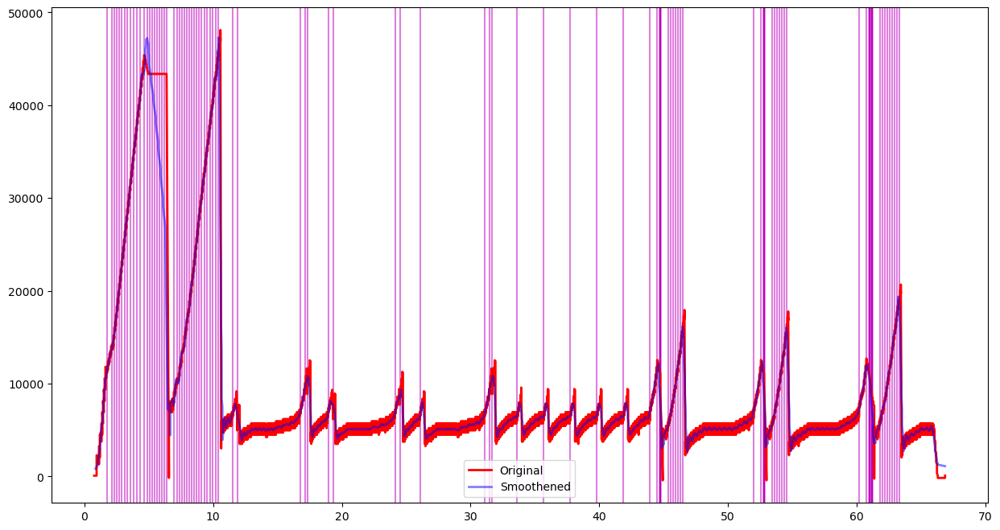

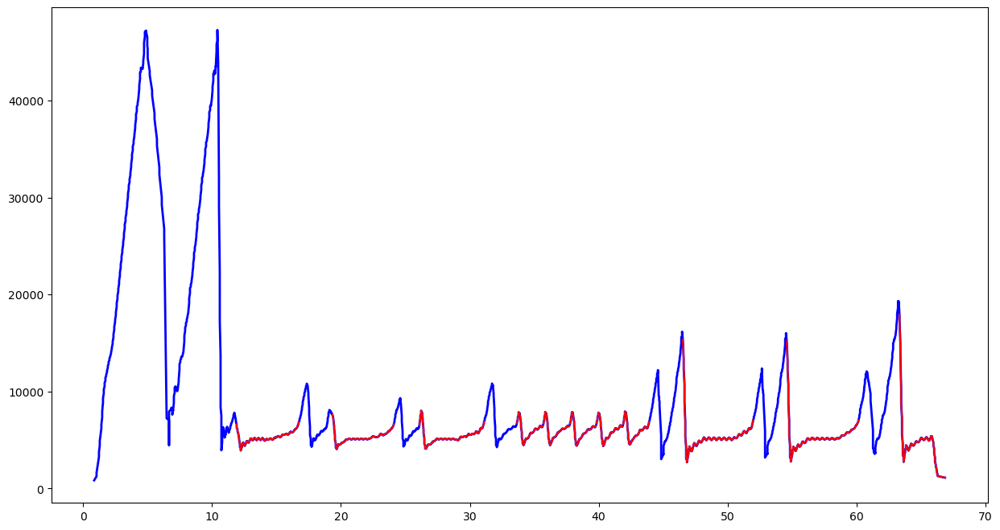

Feature Length  203


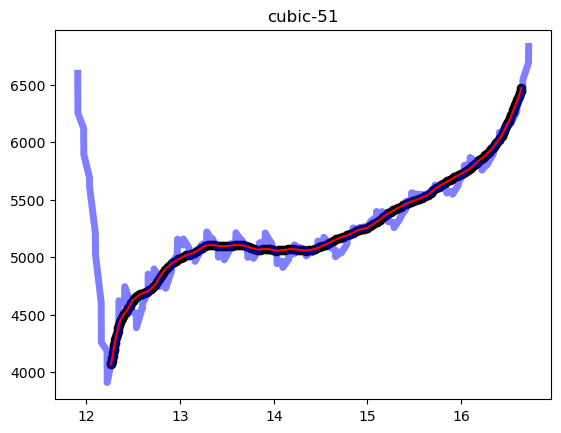

In [40]:
results = getRed(["cubic-51-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1)

### Fitting polynomail to get the values, and normalizing

In [48]:
from sklearn.metrics import mean_squared_error as mse
def get_degree(time,data, p="n", max_deg=3,cc="default"):
    print("Degree to fit",max_deg)
    p_net = []
    mse_l = []
    fit_net = []
    for d in range(1,max_deg+1):
        p_temp = np.polyfit(time,data, d)
        # No need of the constant term
        p_net.append(p_temp[0:-1])
        fit_net.append(np.polyval(p_temp,time))
        mse_l.append(mse(data,fit_net[-1]))
    if p =='y':
        plt.plot(time, data,c='k',label='Truth')
        for d in range(max_deg-1, max_deg):
            plot_label = "degree"+str(d)
            plt.plot(time, fit_net[d],label="degree" + str(d+1))
        plt.legend()
        plt.show()
    return max_deg,p_net[max_deg-1], mse_l

def normalize(time, data, rtt, bdp):
    new_time = time - min(time)
    new_data = data - min(data)
    new_time = (new_time/rtt)
    new_data = (new_data/max(new_data))*10
    return new_time, new_data
    
from statistics import mean 
def get_feature_degree(files,ss=225,p='n',ft_thresh=3,max_deg=3):
    results = getRed(files,ss,p=p,ft_thresh=ft_thresh)
    errors = []
    mp = {}
    cc_mp = {}
    count_features = 0
    for item in results :
        for ele in list(item.keys()):
            name_list = ele.split("_")
            cc = name_list[0]
            name = name_list[0] + name_list[-1]
            if "data" in ele :
                curr_data = np.array(item[ele])
            if "time" in ele :
                curr_time = np.array(item[ele])
            if "rtt" in ele :
                curr_rtt = item[ele]
            if "bdp" in ele :
                curr_bdp = item[ele]
        curr_time, curr_data = normalize(curr_time, curr_data, curr_rtt, curr_bdp)
        count_features += 1
        print("Name :",name)
        degree, coeff, error_item = get_degree(curr_time, curr_data,p=p,max_deg=max_deg,cc=cc)
        # Adding time feature here
#         coeff_list = list(coeff)
#         coeff_list.append(abs(curr_time[-1]-curr_time[0]))
#         coeff = np.array(coeff_list)
#         print(coeff)
#         print(cc)
#         cc_curr = cc.split("-")[0]
        # Adding another check for scalable and yeah
#         if cc_curr in ['scalable','yeah']:
#             # Look at the fifth coefficient
#             if round(coeff[0],6) < 0.000015:
#                 print(coeff[0])
#                 continue
#         coeff.append(abs(curr_time[-1]-curr_time[0]))
        mp[name] = {'d':degree, 'coeff':coeff, 'error':error_item, 'data':curr_data, 'time':curr_time}
        if cc not in cc_mp :
            cc_mp[cc] = []
        cc_mp[cc].append(mp[name])
    return cc_mp

def getCC(files,cc_mp, p="n"):
    # experiment change start
    cc_coeff = {}
    for file in files :
#         file = v + "-0-50-1000-2"
        curr_file = file
        f_split = file.split("-") 
        cc = f_split[0]
        version = f_split[1]
        v = cc+"-"+version
        if cc not in cc_coeff:
            cc_coeff[cc] = []
    # experiment change end
        time, data, retrans, rtt = plot_one_bt(curr_file, p)
        count = 0
        temp = []
        if v not in cc_mp.keys():
            continue
        n = math.ceil(float(len(cc_mp[v]))/3)
        for item in cc_mp[v]:
            time = item['time']
            data = item['data']
            deg = item['d']
            temp.append(item['coeff'])    
            xlim = 0
            ylim = 0
            t = 1
            while time[-1] > t:
                t*=2
            xlim = t
            while data[-1] > t:
                t*=2
            ylim = t
            lim = max(xlim, ylim)
            print(lim)
            names = []
            bars=[]
            for i in range(1,deg+1):
                bars.append(i)
                names.append(str(i))
#             print(names)
#             print(item['error'])
            count+=1
            if p == 'y':
                print([round(x,5) for x in item['coeff']])
                plt.plot(time,data)
                plt.plot(time, np.polyval(item['coeff'],time))
                plt.xlim(0,lim)
                plt.ylim(0,lim)
                plt.title(str(count)+" " + cc)
                plt.show()
#                 Showing the coefficient magnitude on a bar plot
#                 plt.figure().set_figwidth(4)
#                 plt.figure().set_figheight(2)
#                 plt.bar([i for i in range(1,deg+2)], item['coeff'])
#                 plt.show()
#                 Showing the change in error magnitute on a bar plot
                plt.figure().set_figwidth(4)
                plt.figure().set_figheight(2)
                plt.bar(bars, item['error'][0:deg], tick_label=names)
                plt.show()
        cc_coeff[cc].append(temp)
    return cc_coeff 

cubic-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41026', '41030'])
Port 41030


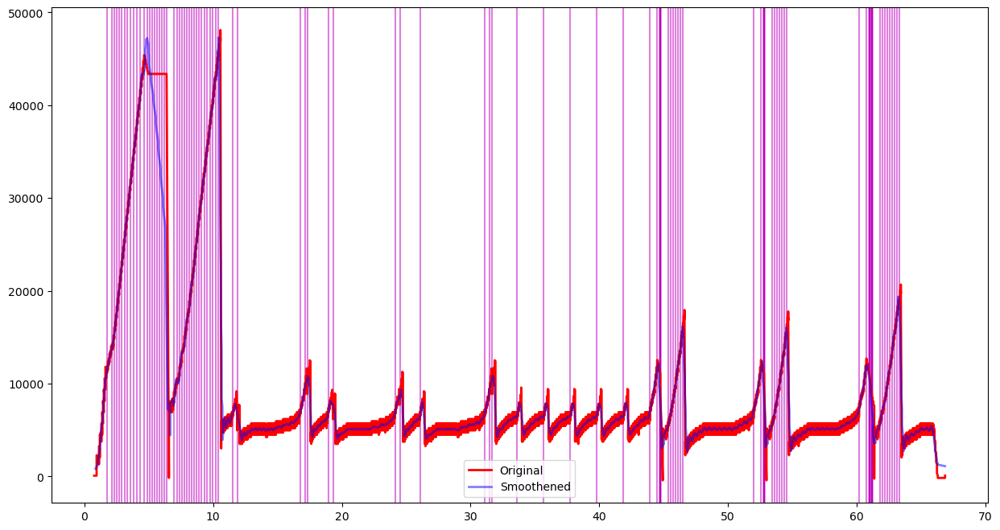

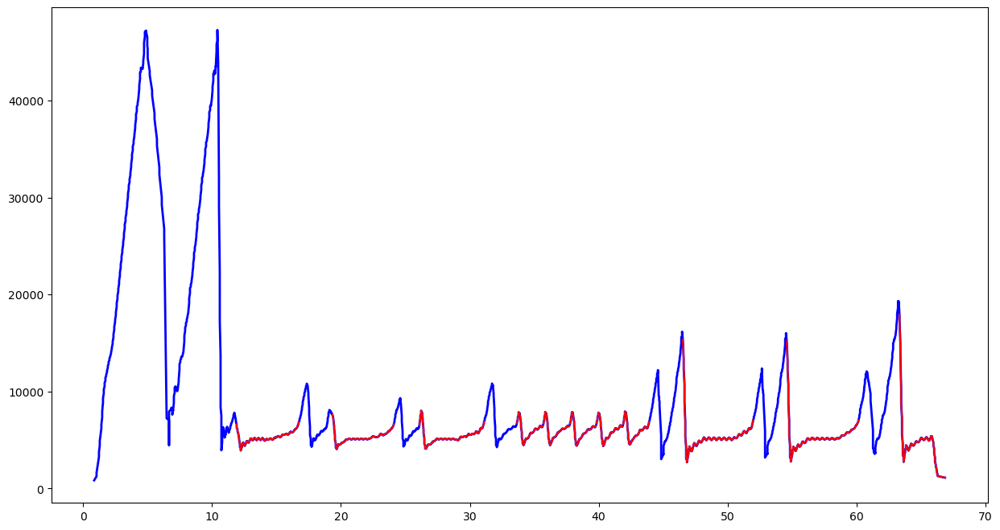

Feature Length  203


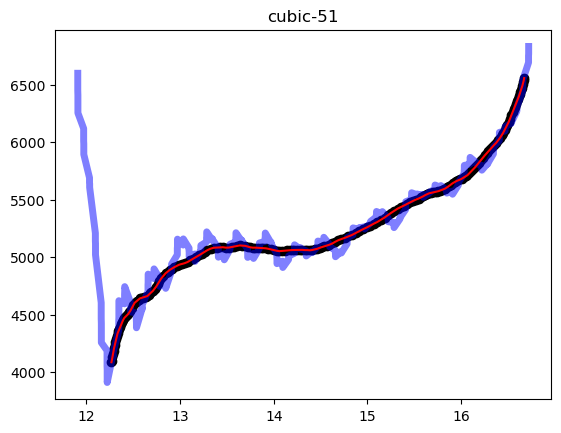

Name : cubic-511
Degree to fit 2


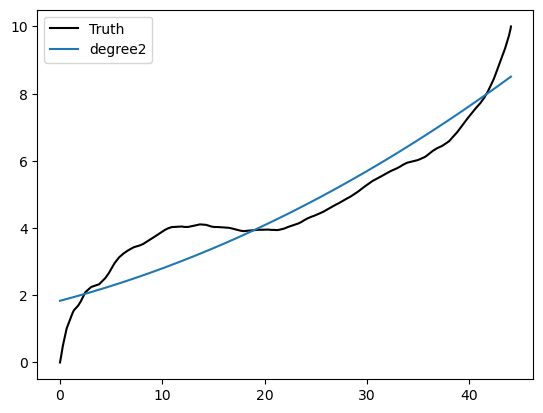

In [50]:
cc_mp = get_feature_degree(["cubic-51-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1,max_deg=2)

cubic-51-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41026', '41030'])
Port 41030


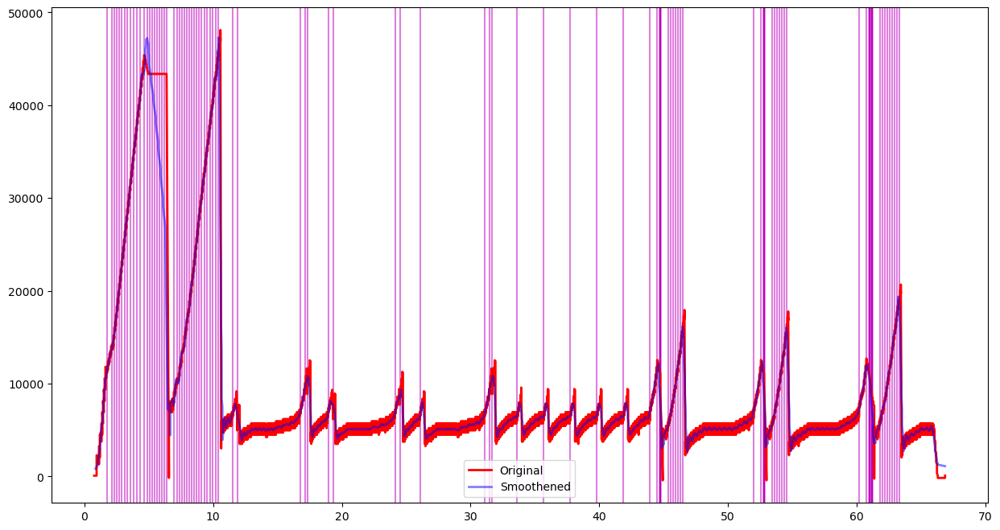

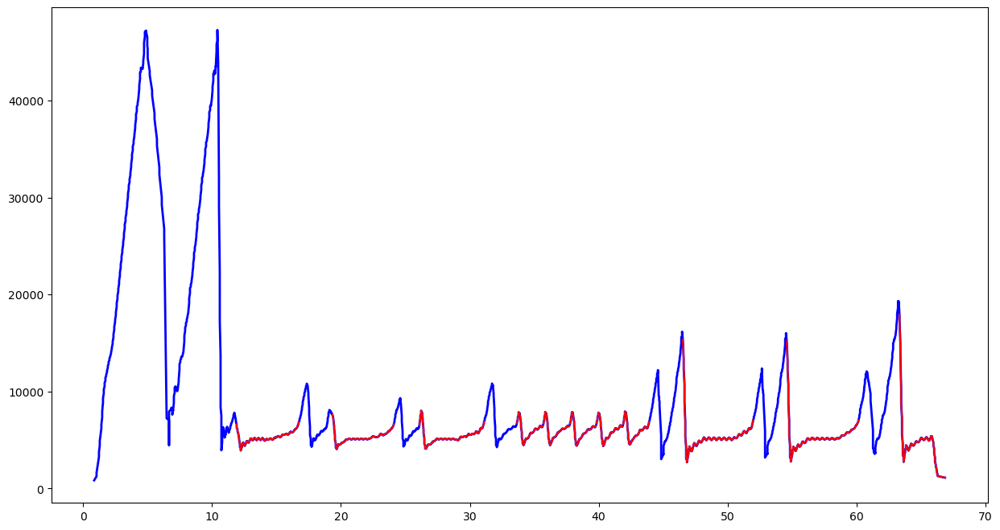

Feature Length  203


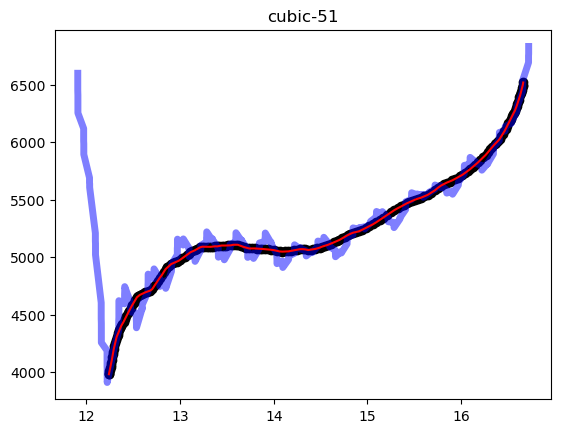

Name : cubic-511
Degree to fit 3


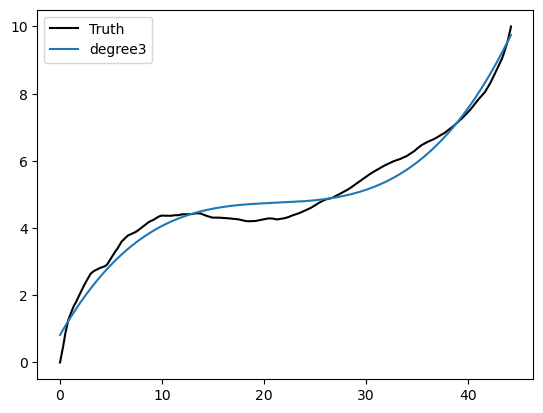

In [49]:
cc_mp = get_feature_degree(["cubic-51-0-50-200-2-aws-88-60"],ss=225,p="y",ft_thresh=1,max_deg=3)

### Making groups according to the degree

In [52]:
ccs = ['bic', 'dctcp', 'highspeed', 'htcp', 'lp', 'nv', 'scalable', 'vegas', 'veno', 'westwood', 'yeah', 'cubic', 'reno']

In [57]:
def get_degree_all(time,data, p="n", max_deg=3):
    p_net = []
    mse_l = []
    fit_net = []
    for d in range(1,max_deg+1):
        p_temp = np.polyfit(time,data,d)
        p_net.append(p_temp)
        fit_net.append(np.polyval(p_temp,time))
        mse_l.append(mse(data,fit_net[-1]))
    if p =='y':
#         print("1 ", p1, "MSE ", mse(data, fit_l))
        plt.plot(time, data,c='k',label='Truth')
#         plt.plot(time, fit_l)
        for d in range(max_deg-1, max_deg):
            plot_label = "degree"+str(d)
            plt.plot(time, fit_net[d],label="degree" + str(d+1))
        plt.legend()
        plt.show()
    return max_deg,p_net, mse_l

In [62]:
total = 51

In [58]:
degree_check = []
for cc in ccs:
    for i in range(1,total):
        degree_check.append(cc+"-"+str(i)+"-0-50-200-2-aws-88-60")
results = getRed(degree_check,ss=225,p="n",ft_thresh=1)
nmp = {}
for item in results :
    for ele in list(item.keys()):
        name_list = ele.split("_")
        name= name_list[0]
        if "data"==name_list[1] :
            curr_data = np.array(item[ele])
        if "time"==name_list[1] :
            curr_time = np.array(item[ele])
        if "rtt"==name_list[1] :
            curr_rtt = item[ele]
        if "bdp"==name_list[1] :
            curr_bdp = item[ele]
    curr_time, curr_data = normalize(curr_time, curr_data, curr_rtt, curr_bdp)
    max_deg,p_net,mse_l = get_degree_all(curr_time, curr_data, p='n',max_deg=3)
    nmp[name] = {
        'data':curr_data,
        'time':curr_time,
        "max_deg":max_deg,
        "p_net":p_net,
        "mse_l":mse_l
    }

bic-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56518', '56520'])
Port 56520
Feature Length  203
bic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42624', '42626'])
Port 42626
Feature Length  203
bic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58296', '48886'])
Port 48886
Feature Length  203
bic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52340', '52350'])
Port 52350
Feature Length  203
bic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-5-0-50-200-2-aws-88-60-tcp.csv...

All Ports :  dict_keys(['48326', '48330'])
Port 48330
Feature Length  203
bic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58644', '58652'])
Port 58652
Feature Length  203
bic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33766', '33780'])
Port 33780
Feature Length  203
bic-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50248', '55394'])
Port 55394
Feature Length  203
bic-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44280', '44294'])
Port 44294
Feature Length  203
bic-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-46-

All Ports :  dict_keys(['49450', '49452'])
Port 49452
Feature Length  203
dctcp-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39754', '39770'])
Port 39770
Feature Length  203
dctcp-32-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-32-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-32-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40630', '40636'])
Port 40636
Feature Length  203
dctcp-33-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-33-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-33-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57094', '57100'])
Port 57100
Feature Length  203
dctcp-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38022', '38034'])
Port 38034
Feature Length  203
dctcp-35-0-50-200-2-aws-88-60


All Ports :  dict_keys(['46744', '54606'])
Port 54606
Feature Length  203
highspeed-19-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-19-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52550', '52566'])
Port 52566
Feature Length  203
highspeed-20-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36632', '36646'])
Port 36646
Feature Length  203
highspeed-21-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-21-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-21-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60020', '60032'])
Port 60032
Feature Length  203
highspeed-22-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-22-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-22-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34214', '34218'])
Port 34218
Fe

All Ports :  dict_keys(['36498', '36502'])
Port 36502
Feature Length  203
htcp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51246', '51252'])
Port 51252
Feature Length  203
htcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33750', '33762'])
Port 33762
Feature Length  203
htcp-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51136', '51140'])
Port 51140
Feature Length  203
htcp-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41808', '41824'])
Port 41824
Feature Length  203
htcp-9-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-9-

All Ports :  dict_keys(['39388', '39404'])
Port 39404
Feature Length  203
htcp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40406', '40408'])
Port 40408
Feature Length  203
htcp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54078'])
Port 54078
Feature Length  203
htcp-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53034', '53036'])
Port 53036
Feature Length  203
htcp-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39082', '39084'])
Port 39084
Feature Length  203
htcp-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

Feature Length  203
lp-33-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-33-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-33-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39846', '39850'])
Port 39850
Feature Length  203
lp-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56854', '56868'])
Port 56868
Feature Length  203
lp-35-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55090', '55094'])
Port 55094
Feature Length  203
lp-36-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39386', '39402'])
Port 39402
Feature Length  203
lp-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-37-0-50-200-2-

All Ports :  dict_keys(['51538', '51552'])
Port 51552
Feature Length  203
nv-22-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-22-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-22-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51006', '51012'])
Port 51012
Feature Length  203
nv-23-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-23-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-23-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37770', '37778'])
Port 37778
Feature Length  203
nv-24-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59714', '59720'])
Port 59720
Feature Length  203
nv-25-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54174', '51886'])
Port 51886
Feature Length  203
nv-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-26-0-50-200-2-aws

All Ports :  dict_keys(['48614', '48620'])
Port 48620
scalable-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40992', '40994'])
Port 40994
scalable-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57976', '57984'])
Port 57984
scalable-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52848', '52862'])
Port 52862
scalable-13-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54194', '54200'])
Port 54200
Feature Length  203
scalable-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-14-0-50-200-2

All Ports :  dict_keys(['41192', '41202'])
Port 41202
scalable-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39324', '39336'])
Port 39336
Feature Length  203
scalable-49-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-49-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-49-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54956', '54958'])
Port 54958
Feature Length  203
scalable-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43844', '43856'])
Port 43856
vegas-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58640', '58644'])
Port 58644
Feature Length  203
vegas-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.

All Ports :  dict_keys(['36204', '36206'])
Port 36206
Feature Length  203
vegas-35-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58718', '58726'])
Port 58726
Feature Length  203
vegas-36-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56882', '56892'])
Port 56892
Feature Length  203
vegas-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53978', '53984'])
Port 53984
Feature Length  203
vegas-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55852', '55862'])
Port 55862
Feature Length  203
vegas-39-0-50-200-2-aws-88-60


All Ports :  dict_keys(['40120', '40122'])
Port 40122
Feature Length  203
veno-23-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-23-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-23-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54446', '54456'])
Port 54456
Feature Length  203
veno-24-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32782', '37524'])
Port 37524
Feature Length  203
veno-25-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41390', '41404'])
Port 41404
Feature Length  203
veno-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-26-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-26-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51980', '34546'])
Port 34546
Feature Length  203
veno-27-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['37546', '37550'])
Port 37550
Feature Length  203
westwood-11-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33392', '33394'])
Port 33394
Feature Length  203
westwood-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55146', '55156'])
Port 55156
Feature Length  203
westwood-13-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45272', '45278'])
Port 45278
Feature Length  203
westwood-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39228', '39240'])
Port 39240
Feature Length

All Ports :  dict_keys(['47528', '47544'])
Port 47544
Feature Length  203
westwood-49-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-49-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-49-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54036', '54052'])
Port 54052
Feature Length  203
westwood-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41232', '41238'])
Port 41238
Feature Length  203
yeah-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48162', '48172'])
Port 48172
Feature Length  203
yeah-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45944', '45954'])
Port 45954
Feature Length  203
yeah-3-0-50-200-2-aws-88

All Ports :  dict_keys(['52920', '52932'])
Port 52932
Feature Length  203
yeah-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35500', '35512'])
Port 35512
Feature Length  203
yeah-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46220', '46232'])
Port 46232
Feature Length  203
yeah-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60944', '60946'])
Port 60946
Feature Length  203
yeah-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49524', '49536'])
Port 49536
Feature Length  203
yeah-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['51104', '51120'])
Port 51120
Feature Length  203
cubic-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-26-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-26-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50904', '50906'])
Port 50906
Feature Length  203
cubic-27-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58328', '58340'])
Port 58340
Feature Length  203
cubic-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59508', '59518'])
Port 59518
Feature Length  203
cubic-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46566', '46572'])
Port 46572
Feature Length  203
cubic-30-0-50-200-2-aws-88-60


All Ports :  dict_keys(['48536', '48550'])
Port 48550
Feature Length  203
reno-13-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54570', '54578'])
Port 54578
Feature Length  203
reno-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54434', '54438'])
Port 54438
Feature Length  203
reno-15-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43396', '43400'])
Port 43400
Feature Length  203
reno-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56626', '56632'])
Port 56632
Feature Length  203
reno-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

bic-31_data_1
bic-31_time_1
bic-31_rtt_1
bic-31_bdp_1
bic-32_data_1
bic-32_time_1
bic-32_rtt_1
bic-32_bdp_1
bic-33_data_1
bic-33_time_1
bic-33_rtt_1
bic-33_bdp_1
bic-34_data_1
bic-34_time_1
bic-34_rtt_1
bic-34_bdp_1
bic-35_data_1
bic-35_time_1
bic-35_rtt_1
bic-35_bdp_1
bic-36_data_1
bic-36_time_1
bic-36_rtt_1
bic-36_bdp_1
bic-37_data_1
bic-37_time_1
bic-37_rtt_1
bic-37_bdp_1
bic-38_data_1
bic-38_time_1
bic-38_rtt_1
bic-38_bdp_1
bic-39_data_1
bic-39_time_1
bic-39_rtt_1
bic-39_bdp_1
bic-40_data_1
bic-40_time_1
bic-40_rtt_1
bic-40_bdp_1
bic-41_data_1
bic-41_time_1
bic-41_rtt_1
bic-41_bdp_1
bic-42_data_1
bic-42_time_1
bic-42_rtt_1
bic-42_bdp_1
bic-43_data_1
bic-43_time_1
bic-43_rtt_1
bic-43_bdp_1
bic-44_data_1
bic-44_time_1
bic-44_rtt_1
bic-44_bdp_1
bic-45_data_1
bic-45_time_1
bic-45_rtt_1
bic-45_bdp_1
bic-46_data_1
bic-46_time_1
bic-46_rtt_1
bic-46_bdp_1
bic-47_data_1
bic-47_time_1
bic-47_rtt_1
bic-47_bdp_1
bic-48_data_1
bic-48_time_1
bic-48_rtt_1
bic-48_bdp_1
bic-49_data_1
bic-49_time_1


lp-10_data_1
lp-10_time_1
lp-10_rtt_1
lp-10_bdp_1
lp-11_data_1
lp-11_time_1
lp-11_rtt_1
lp-11_bdp_1
lp-12_data_1
lp-12_time_1
lp-12_rtt_1
lp-12_bdp_1
lp-13_data_1
lp-13_time_1
lp-13_rtt_1
lp-13_bdp_1
lp-14_data_1
lp-14_time_1
lp-14_rtt_1
lp-14_bdp_1
lp-15_data_1
lp-15_time_1
lp-15_rtt_1
lp-15_bdp_1
lp-16_data_1
lp-16_time_1
lp-16_rtt_1
lp-16_bdp_1
lp-17_data_1
lp-17_time_1
lp-17_rtt_1
lp-17_bdp_1
lp-18_data_1
lp-18_time_1
lp-18_rtt_1
lp-18_bdp_1
lp-19_data_1
lp-19_time_1
lp-19_rtt_1
lp-19_bdp_1
lp-20_data_1
lp-20_time_1
lp-20_rtt_1
lp-20_bdp_1
lp-21_data_1
lp-21_time_1
lp-21_rtt_1
lp-21_bdp_1
lp-22_data_1
lp-22_time_1
lp-22_rtt_1
lp-22_bdp_1
lp-23_data_1
lp-23_time_1
lp-23_rtt_1
lp-23_bdp_1
lp-24_data_1
lp-24_time_1
lp-24_rtt_1
lp-24_bdp_1
lp-25_data_1
lp-25_time_1
lp-25_rtt_1
lp-25_bdp_1
lp-26_data_1
lp-26_time_1
lp-26_rtt_1
lp-26_bdp_1
lp-27_data_1
lp-27_time_1
lp-27_rtt_1
lp-27_bdp_1
lp-28_data_1
lp-28_time_1
lp-28_rtt_1
lp-28_bdp_1
lp-29_data_1
lp-29_time_1
lp-29_rtt_1
lp-29_bdp_1


veno-19_data_1
veno-19_time_1
veno-19_rtt_1
veno-19_bdp_1
veno-20_data_1
veno-20_time_1
veno-20_rtt_1
veno-20_bdp_1
veno-21_data_1
veno-21_time_1
veno-21_rtt_1
veno-21_bdp_1
veno-22_data_1
veno-22_time_1
veno-22_rtt_1
veno-22_bdp_1
veno-23_data_1
veno-23_time_1
veno-23_rtt_1
veno-23_bdp_1
veno-24_data_1
veno-24_time_1
veno-24_rtt_1
veno-24_bdp_1
veno-25_data_1
veno-25_time_1
veno-25_rtt_1
veno-25_bdp_1
veno-26_data_1
veno-26_time_1
veno-26_rtt_1
veno-26_bdp_1
veno-27_data_1
veno-27_time_1
veno-27_rtt_1
veno-27_bdp_1
veno-28_data_1
veno-28_time_1
veno-28_rtt_1
veno-28_bdp_1
veno-29_data_1
veno-29_time_1
veno-29_rtt_1
veno-29_bdp_1
veno-30_data_1
veno-30_time_1
veno-30_rtt_1
veno-30_bdp_1
veno-31_data_1
veno-31_time_1
veno-31_rtt_1
veno-31_bdp_1
veno-32_data_1
veno-32_time_1
veno-32_rtt_1
veno-32_bdp_1
veno-33_data_1
veno-33_time_1
veno-33_rtt_1
veno-33_bdp_1
veno-34_data_1
veno-34_time_1
veno-34_rtt_1
veno-34_bdp_1
veno-35_data_1
veno-35_time_1
veno-35_rtt_1
veno-35_bdp_1
veno-36_data_1

reno-14_data_1
reno-14_time_1
reno-14_rtt_1
reno-14_bdp_1
reno-15_data_1
reno-15_time_1
reno-15_rtt_1
reno-15_bdp_1
reno-16_data_1
reno-16_time_1
reno-16_rtt_1
reno-16_bdp_1
reno-17_data_1
reno-17_time_1
reno-17_rtt_1
reno-17_bdp_1
reno-18_data_1
reno-18_time_1
reno-18_rtt_1
reno-18_bdp_1
reno-19_data_1
reno-19_time_1
reno-19_rtt_1
reno-19_bdp_1
reno-20_data_1
reno-20_time_1
reno-20_rtt_1
reno-20_bdp_1
reno-21_data_1
reno-21_time_1
reno-21_rtt_1
reno-21_bdp_1
reno-22_data_1
reno-22_time_1
reno-22_rtt_1
reno-22_bdp_1
reno-23_data_1
reno-23_time_1
reno-23_rtt_1
reno-23_bdp_1
reno-24_data_1
reno-24_time_1
reno-24_rtt_1
reno-24_bdp_1
reno-25_data_1
reno-25_time_1
reno-25_rtt_1
reno-25_bdp_1
reno-26_data_1
reno-26_time_1
reno-26_rtt_1
reno-26_bdp_1
reno-27_data_1
reno-27_time_1
reno-27_rtt_1
reno-27_bdp_1
reno-28_data_1
reno-28_time_1
reno-28_rtt_1
reno-28_bdp_1
reno-29_data_1
reno-29_time_1
reno-29_rtt_1
reno-29_bdp_1
reno-30_data_1
reno-30_time_1
reno-30_rtt_1
reno-30_bdp_1
reno-31_data_1

bic-1
loss [0.03146309898069992, 0.07500729520615179, 0.11445325015053198]
mse [0.0791898659998153, 0.0710408403357303, 0.07092439311877224]


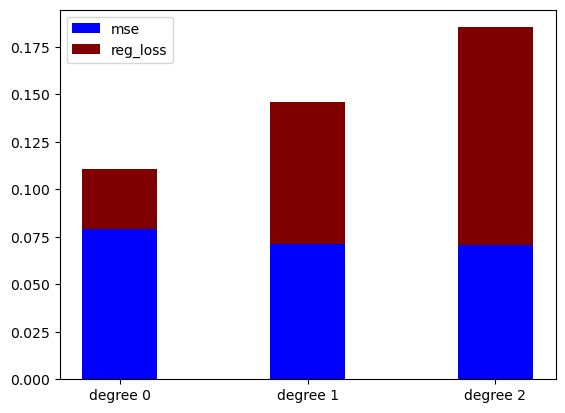

bic-2
loss [0.02999689339677053, 0.06598416423674983, 0.06289601693120421]
mse [0.07248877270979884, 0.07053316982991761, 0.03479675544942217]


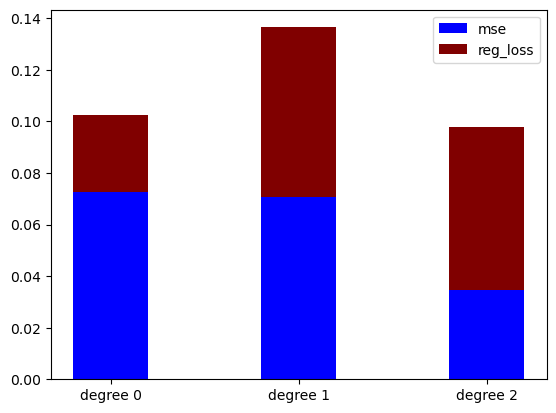

bic-3
loss [0.08879643711649479, 0.15190842218331652, 0.19550937517453662]
mse [0.14193173546841586, 0.10845259430086812, 0.07535848074198048]


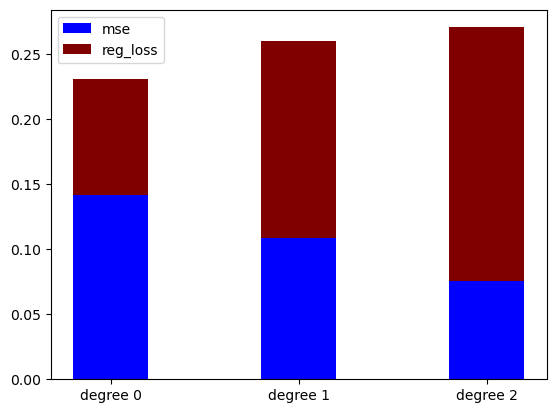

bic-4
loss [0.04554905934263176, 0.07330086928647181, 0.10414455129555972]
mse [0.03614195065934645, 0.017530099548669974, 0.01649513833570788]


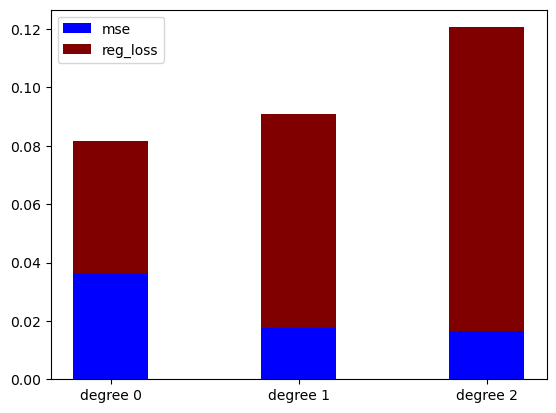

bic-5
loss [0.08344758832134383, 0.1564160315754017, 0.20849704456190965]
mse [0.13196602732553112, 0.12562989970533794, 0.09885012534400087]


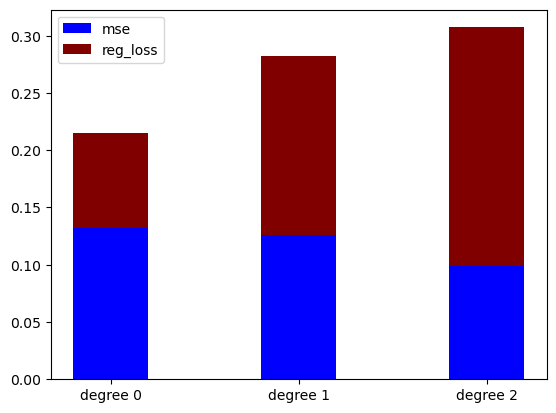

bic-6
loss [0.0240408596583008, 0.03206474810282696, 0.04851296724135973]
mse [0.05340301183212843, 0.04102046125203555, 0.04101558243553869]


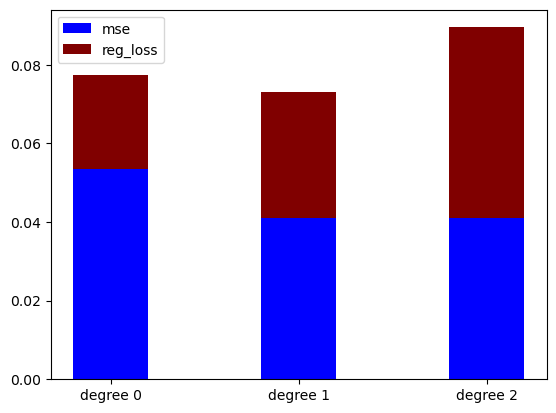

bic-7
loss [0.008794198870233305, 0.01330182388915311, 0.0029959228609347287]
mse [0.0464044143442839, 0.04570869497285436, 0.0398769399661478]


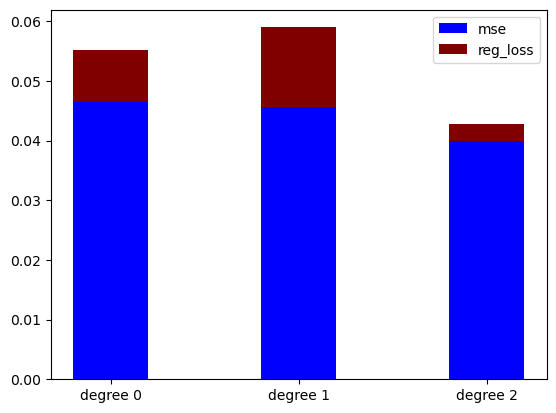

bic-8
loss [0.030785594006992864, 0.060681589131485726, 0.07342241482713895]
mse [0.05194477619981085, 0.05189683659060379, 0.040738776864743816]


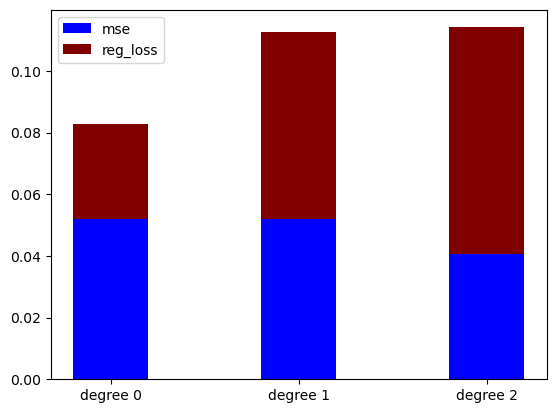

bic-9
loss [0.041994778061774644, 0.07719811620690313, 0.08945068693183489]
mse [0.07831614004378543, 0.07521917355495035, 0.053167929154039575]


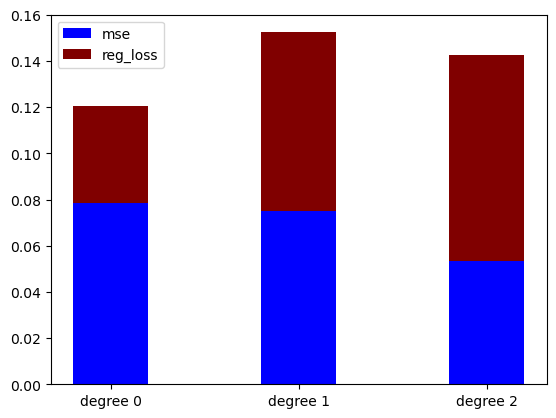

bic-10
loss [0.05359245294585029, 0.08424674905635943, 0.08618375665574984]
mse [0.0685804933975144, 0.04848372898794051, 0.01639247936929239]


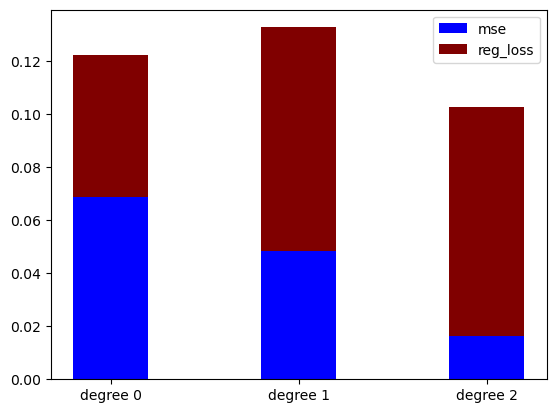

bic-12
loss [0.023343913822518877, 0.0434001865251368, 0.07685425500185136]
mse [0.023129375808841984, 0.02246862372296337, 0.01706463922299418]


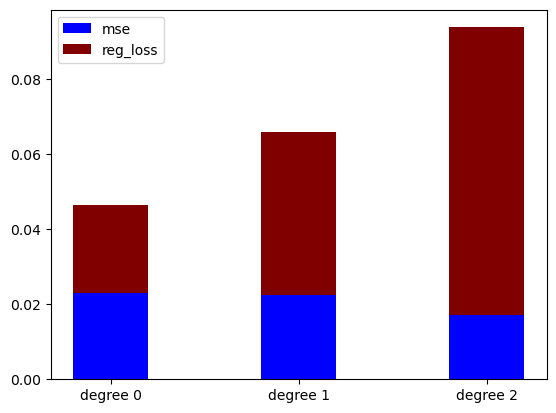

bic-13
loss [0.07634377819269711, 0.1533435176101774, 0.22991824081156154]
mse [0.0972814323168851, 0.09725931915582886, 0.097259050294768]


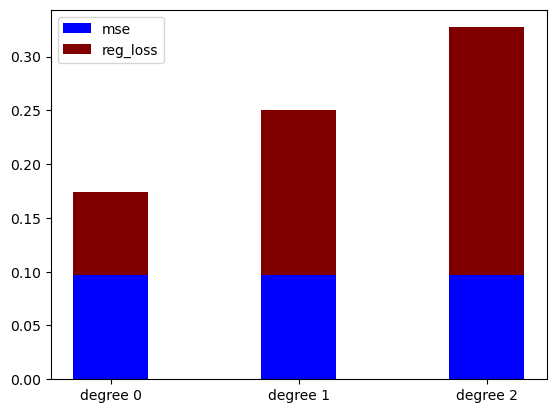

bic-14
loss [0.019114564413821696, 0.03482800072241544, 0.048727899288052004]
mse [0.03939893154038558, 0.03884174035510902, 0.038464838286281604]


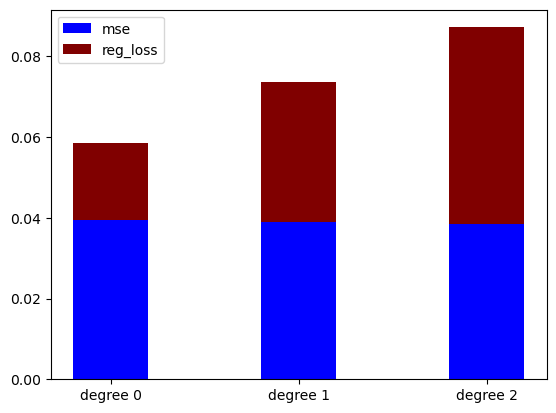

bic-15
loss [0.03966023119212076, 0.06844373151967435, 0.07497236235104339]
mse [0.038636685584487566, 0.034214017738819186, 0.019725491738993788]


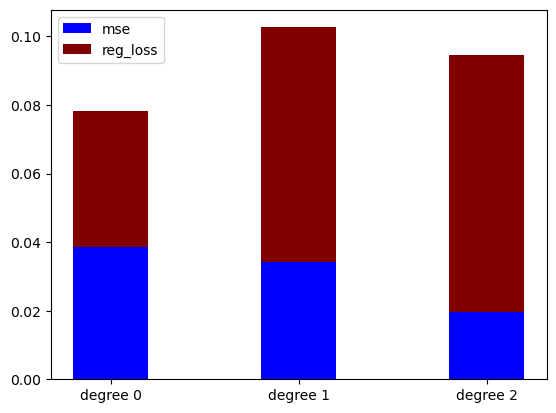

bic-16
loss [0.036705928247315486, 0.06518589752976611, 0.085478220886542]
mse [0.03179953574214099, 0.028876662258121046, 0.025347867441769513]


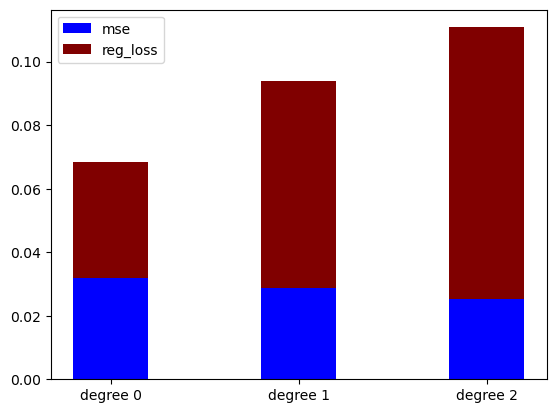

bic-17
loss [0.04199569168324714, 0.08013935669893545, 0.12705149316290454]
mse [0.03704878935488675, 0.03621919394947008, 0.034678309166654014]


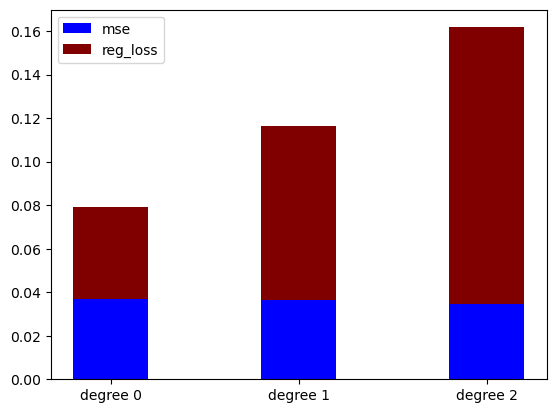

bic-18
loss [0.06320888406011337, 0.12971364689853232, 0.18503200832310818]
mse [0.07589473064848382, 0.07525584251250016, 0.07169628185213586]


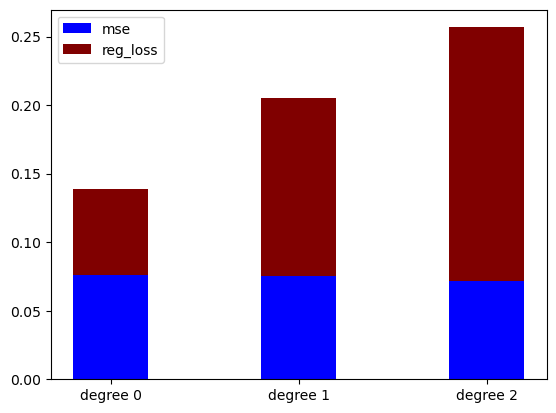

bic-19
loss [0.050318587281211, 0.08548383413272614, 0.13855684437392315]
mse [0.06105334465404349, 0.048481808014533265, 0.04540396302431154]


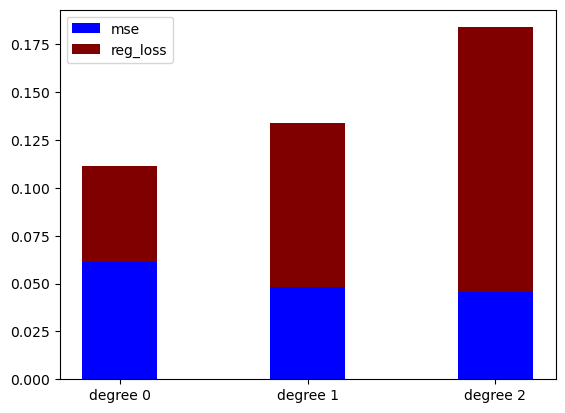

bic-21
loss [0.04880958341926946, 0.09106065980152075, 0.1282676656516927]
mse [0.06927738235517762, 0.06735476022419898, 0.06556854279881001]


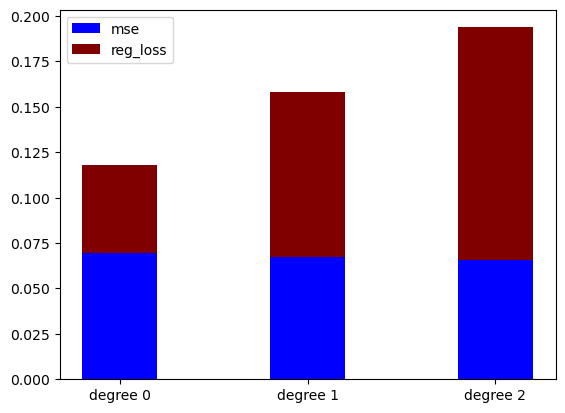

bic-22
loss [0.012921388076054875, 0.03371586266895077, 0.018772148502542343]
mse [0.09269657601549589, 0.09039140865343194, 0.07008961882965803]


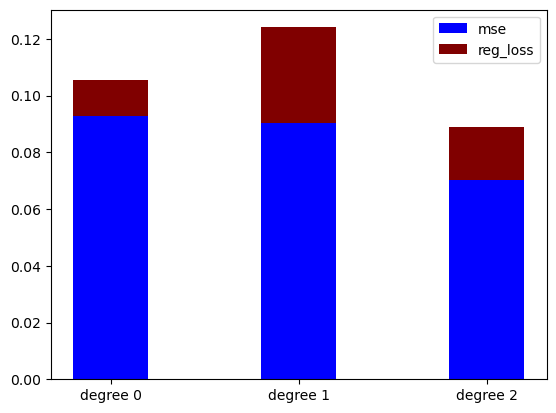

bic-23
loss [0.040552020642150764, 0.08087729099223552, 0.09284327609343995]
mse [0.09690539806007249, 0.09690216305689435, 0.07218485575345884]


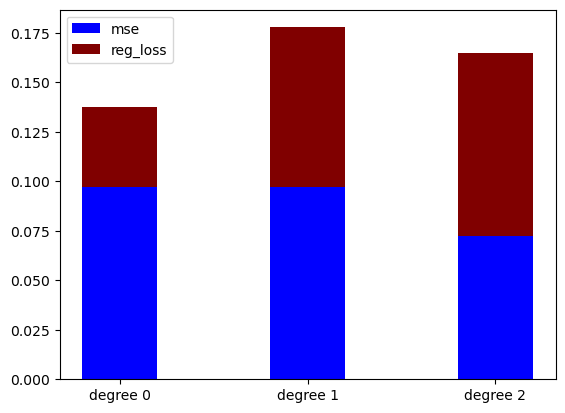

bic-24
loss [0.04978699189535045, 0.09983948498713889, 0.13615224189924643]
mse [0.06355248479402141, 0.06354904979782287, 0.05838959183591396]


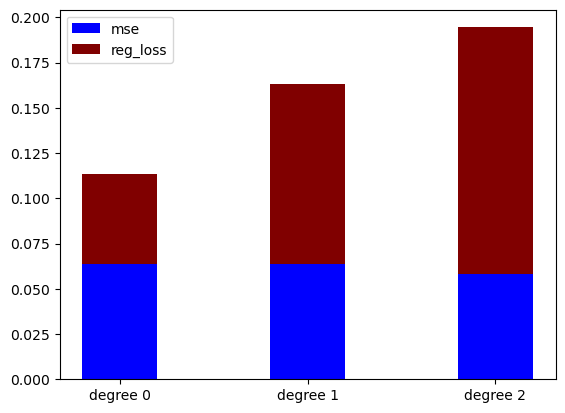

bic-25
loss [0.020171640681838295, 0.03951092123503902, 0.07005040619158169]
mse [0.042340008198631034, 0.04229861095509531, 0.038144026009478034]


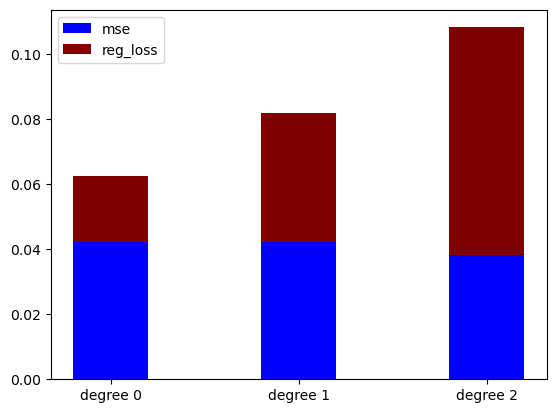

bic-26
loss [0.03865214137971258, 0.07634821926658833, 0.08971851669019004]
mse [0.05752992587835442, 0.05749866764665664, 0.04615724046974305]


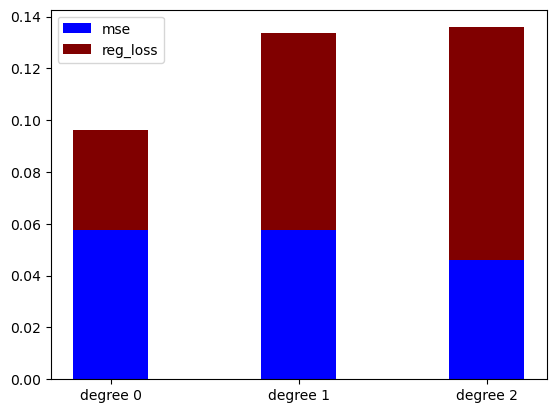

bic-27
loss [0.02160021009837039, 0.03268748571486157, 0.05297494956104201]
mse [0.04729804575734946, 0.043753814218302774, 0.04343122348567666]


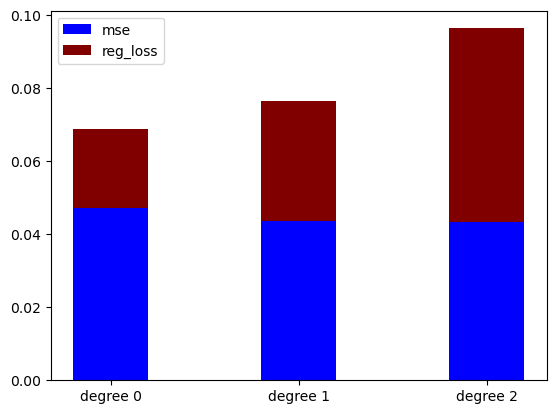

bic-28
loss [0.11365324003901296, 0.20850408238785825, 0.2758596074588226]
mse [0.2567445941154831, 0.23274643870421144, 0.1587581455152528]


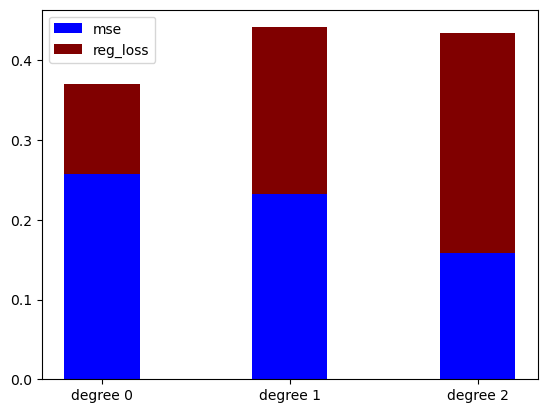

bic-29
loss [0.027821173028818248, 0.05511839272333929, 0.06279138528723097]
mse [0.02928119732976235, 0.029267509623187308, 0.019109316623632577]


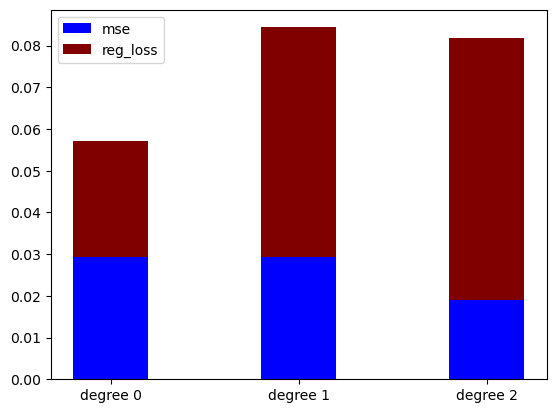

bic-30
loss [0.03581681038932173, 0.0708167263606107, 0.0808252636299167]
mse [0.05198994526188158, 0.05195082961149651, 0.03225151966719932]


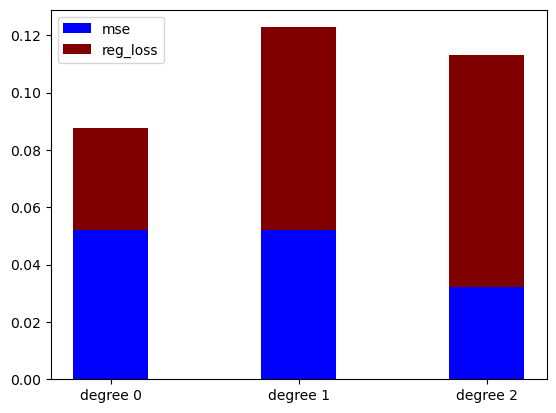

bic-31
loss [0.04552732087459413, 0.07752459873640909, 0.09535246563100802]
mse [0.056494348944905, 0.046035436860563994, 0.031168571438497567]


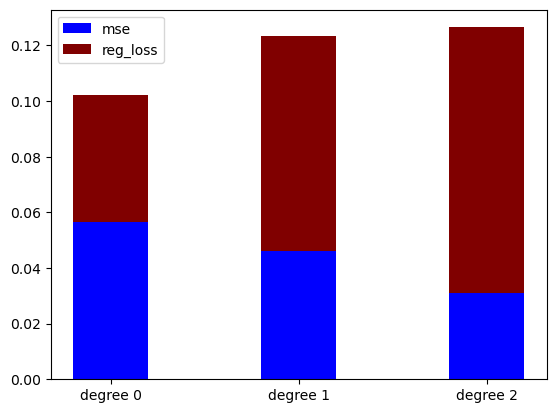

bic-32
loss [0.04356784457699986, 0.08272339215396765, 0.12249057610612901]
mse [0.05926740862580848, 0.058195813434145933, 0.05810775119564202]


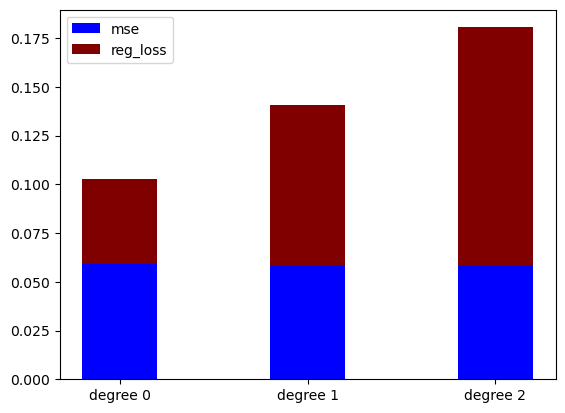

bic-33
loss [0.026115525730992763, 0.03421990974424405, 0.06343343685111834]
mse [0.04591585328748217, 0.030234177448877395, 0.026142360453393448]


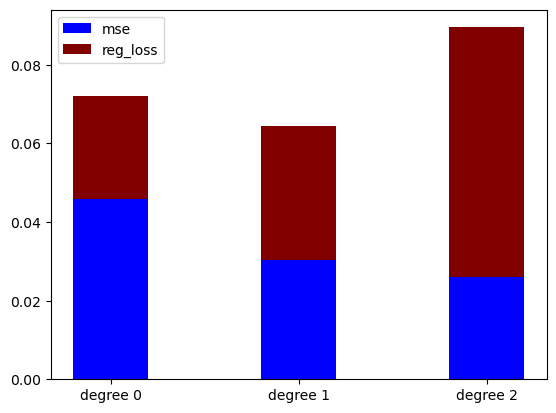

bic-34
loss [0.045462491351774034, 0.08781397336868968, 0.1184657959004877]
mse [0.06839031926852604, 0.06771391084943754, 0.06163173699475887]


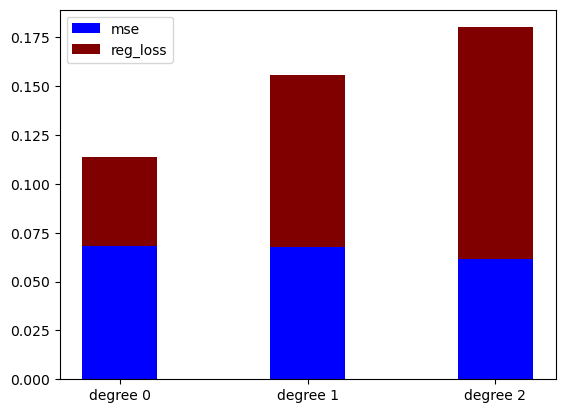

bic-35
loss [0.06771707715492518, 0.12436577207530056, 0.16726427515390038]
mse [0.08894465674599607, 0.08299714160823994, 0.06832456303043598]


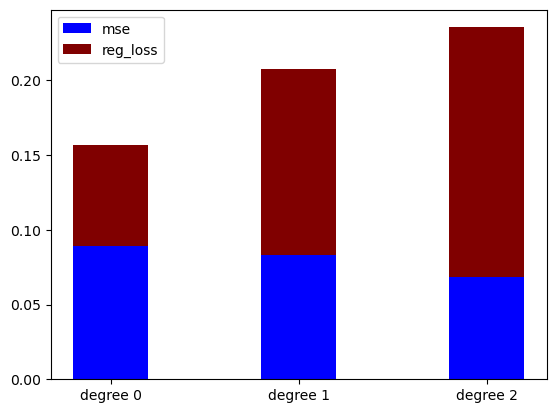

bic-36
loss [0.017006242034136143, 0.03474558885175915, 0.03635542742314743]
mse [0.03848310758201362, 0.03845395746577152, 0.028127495783730246]


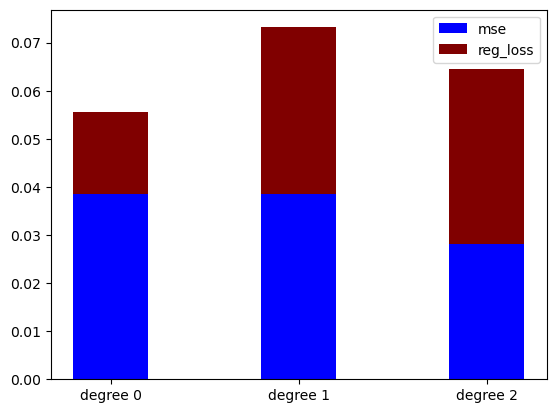

bic-37
loss [0.04043967039979402, 0.07247417177552712, 0.1080580096949896]
mse [0.06131261531006302, 0.058737250887935896, 0.05872663129653439]


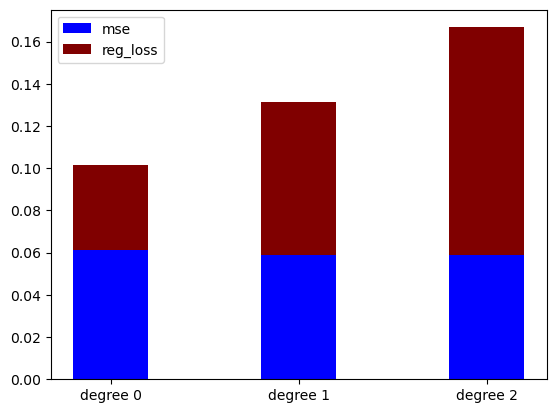

bic-38
loss [0.06506259874993686, 0.11010108985893297, 0.1407808597076868]
mse [0.06857870419912471, 0.046525363992059886, 0.02633199745236578]


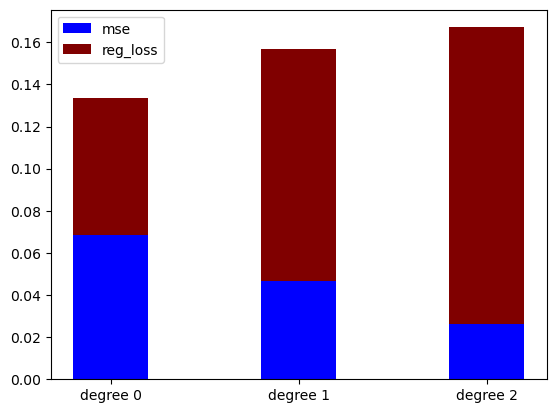

bic-39
loss [0.06469312981993666, 0.08390781864195404, 0.12222433680944465]
mse [0.13069553959597816, 0.0555782609594132, 0.055280824236864624]


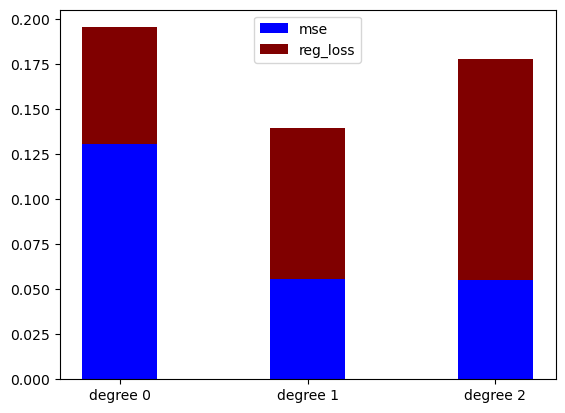

bic-40
loss [0.03072301395364357, 0.05203396505926679, 0.07130300848863647]
mse [0.03698550131531748, 0.03231187172875512, 0.030779909585828595]


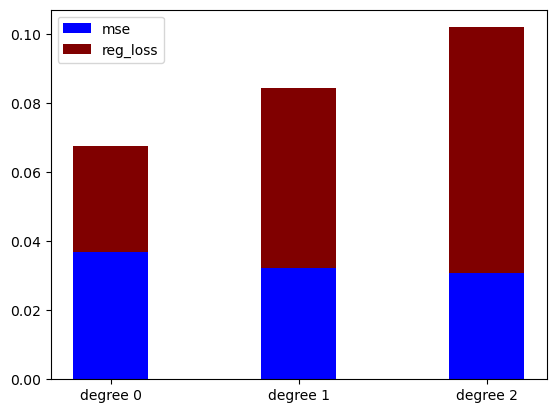

bic-41
loss [0.03524069346427012, 0.07028877137520126, 0.0893326541935497]
mse [0.041497663843267966, 0.041495737490726006, 0.03417388713204258]


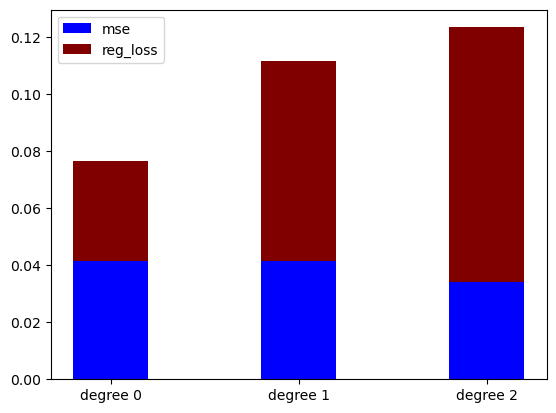

bic-42
loss [0.04254780212604706, 0.07348637302104091, 0.10554948224720098]
mse [0.037177075931052544, 0.030452655322939122, 0.029658322419070727]


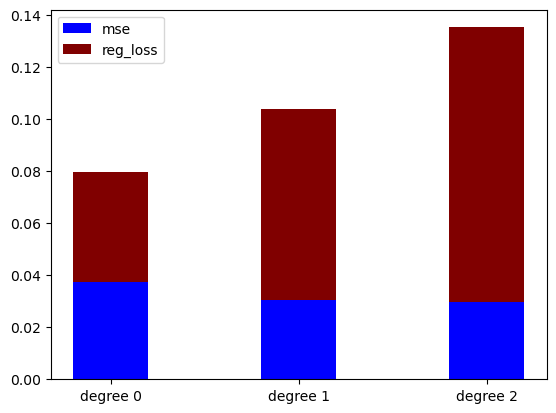

bic-43
loss [0.019354699909026215, 0.023227934435914168, 0.03151459197132215]
mse [0.0335232837906771, 0.023294070239938364, 0.02302646224151175]


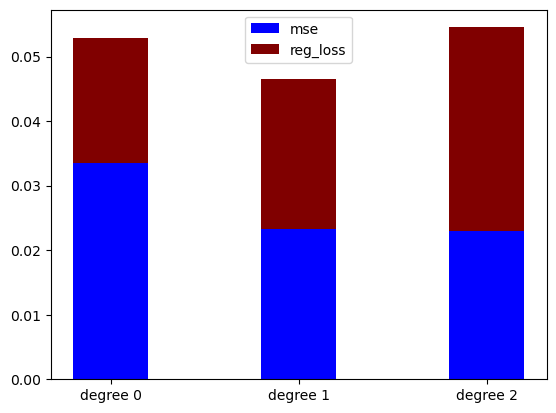

bic-44
loss [0.039825013325369016, 0.07970502609750767, 0.11513729457113597]
mse [0.06050446682283697, 0.06050427641790531, 0.05962239651504658]


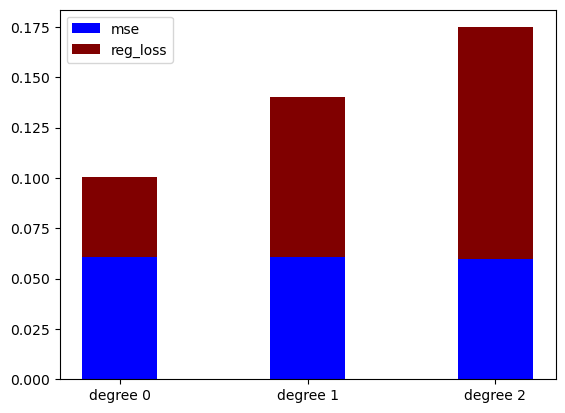

bic-45
loss [0.020962543978286542, 0.047848998516541744, 0.05071612022195864]
mse [0.04721508257986043, 0.046006105625719045, 0.03804089052602571]


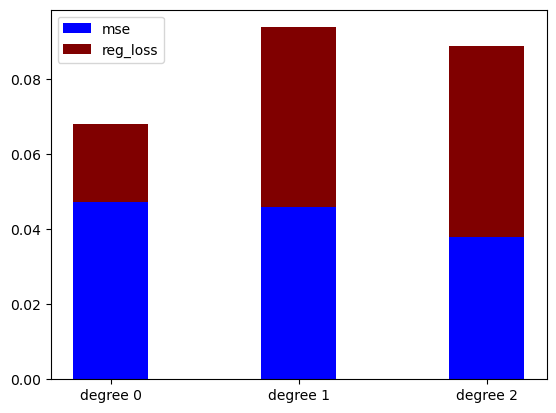

bic-46
loss [0.0499407885630244, 0.09309279920656838, 0.1088646905193394]
mse [0.10352914667734518, 0.10013789131131659, 0.05471981938537323]


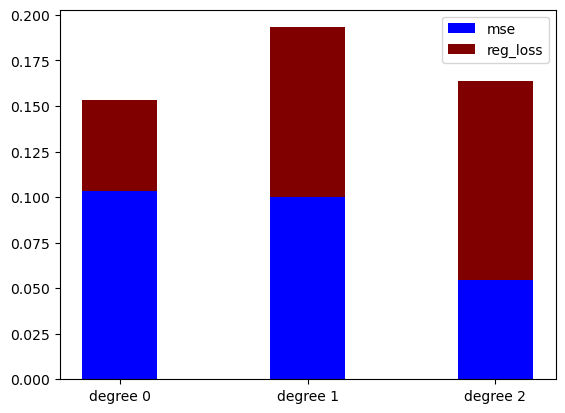

bic-47
loss [0.09595243091029965, 0.1762024817811717, 0.23407711093639716]
mse [0.19305084690281832, 0.17814990815201537, 0.1321470217624352]


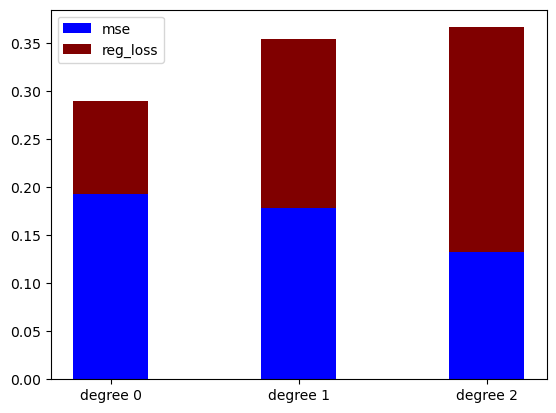

bic-48
loss [0.022034327810794643, 0.05186529628547662, 0.05350980334668352]
mse [0.04248786048914755, 0.03989410832618997, 0.026646536986529995]


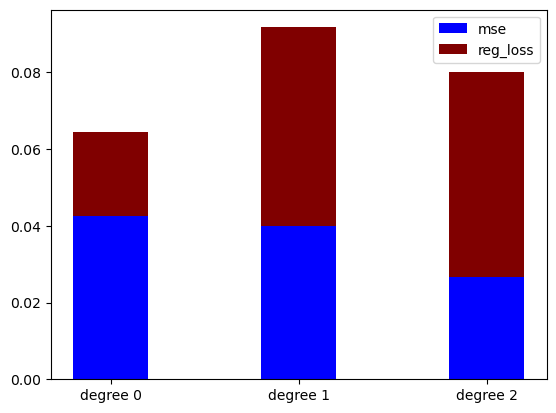

bic-49
loss [0.016886992913195363, 0.029528337279966302, 0.035761328166602]
mse [0.04650430877042897, 0.04550711187020839, 0.0431239675544597]


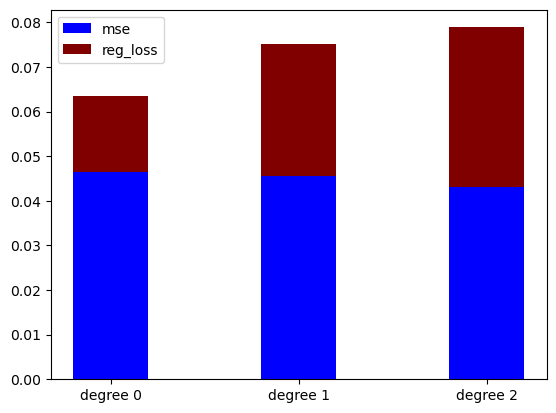

bic-50
loss [0.0436979801164972, 0.07522553092918877, 0.11955344480971436]
mse [0.0481448139260156, 0.0382717628386141, 0.036292722417735096]


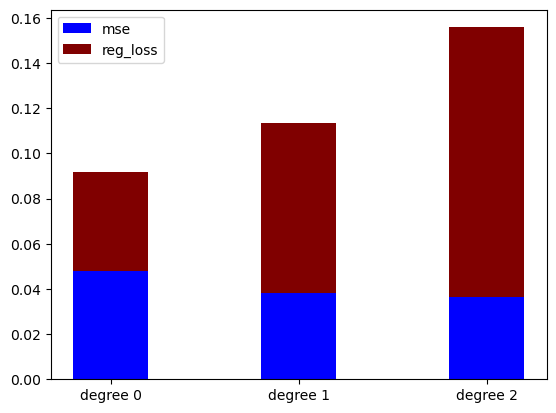

dctcp-1
loss [0.07407827587287401, 0.10741370596059681, 0.14232872234876]
mse [0.18876311777227436, 0.05705058163155804, 0.028458245903659293]


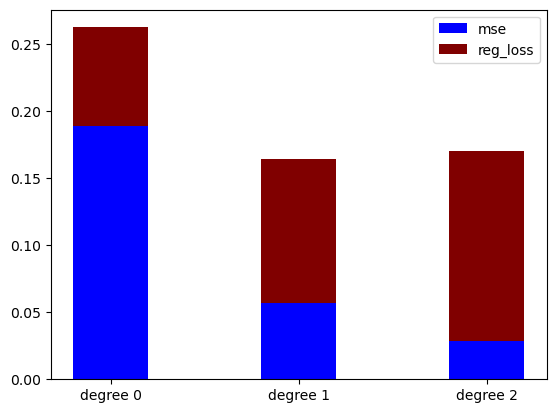

dctcp-2
loss [0.09449195623545181, 0.15182258705804258, 0.2085767351817679]
mse [0.17019606355262862, 0.06855630984127149, 0.049857605320600004]


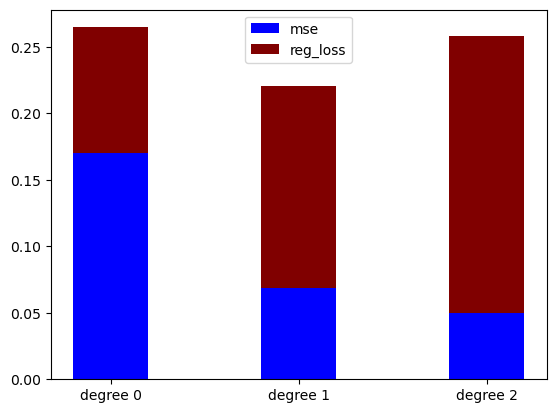

dctcp-3
loss [0.09633358974390947, 0.14594825629129374, 0.19898124557808505]
mse [0.20955387462604455, 0.0722518536900321, 0.05085877688978218]


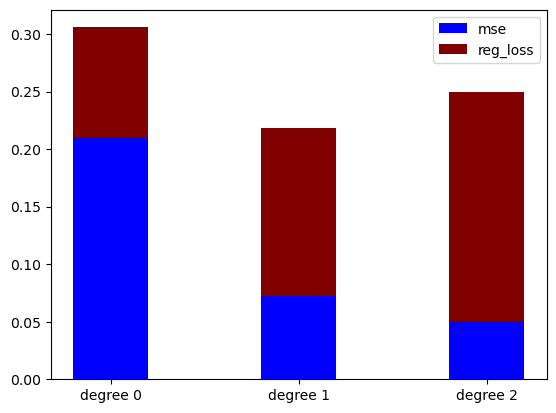

dctcp-4
loss [0.08361404842323043, 0.13637688235464657, 0.18730385153253692]
mse [0.08578407752347081, 0.03263311741114785, 0.022860110139507242]


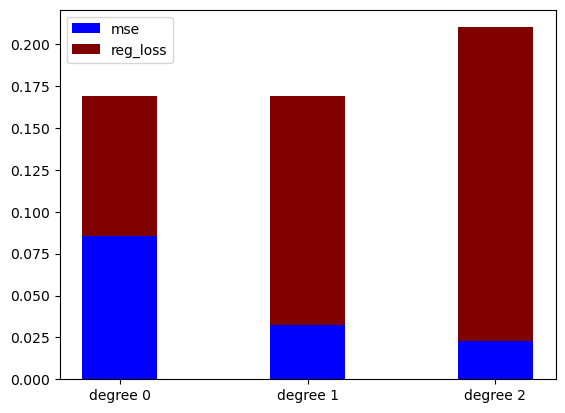

dctcp-5
loss [0.07569990876086224, 0.12166690091138413, 0.17624591444677168]
mse [0.08154979291350166, 0.023541185376946088, 0.021737081787166372]


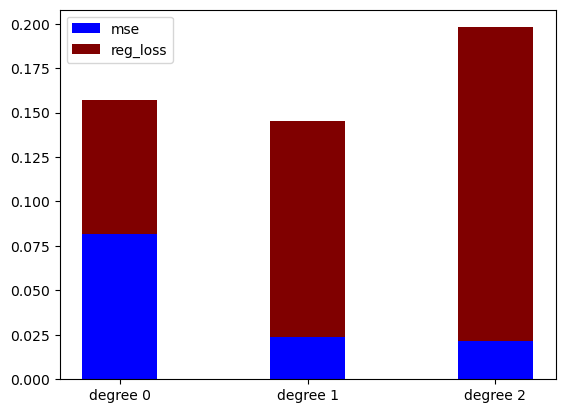

dctcp-6
loss [0.09329719012592184, 0.14641063641788352, 0.20680161924083898]
mse [0.11817839259611866, 0.044022425292407415, 0.03773170791482122]


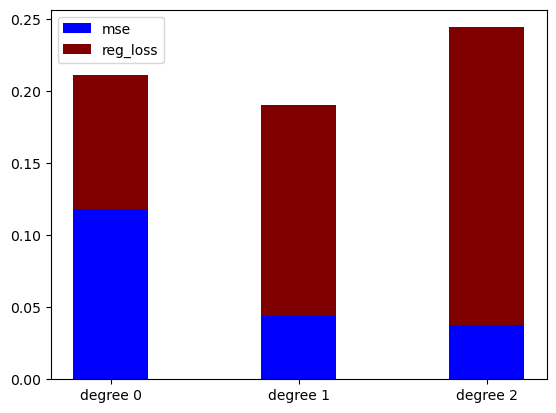

dctcp-7
loss [0.07734463760531918, 0.1192182445669155, 0.1683995290607515]
mse [0.09448957041341656, 0.02495090319906764, 0.019836430002881884]


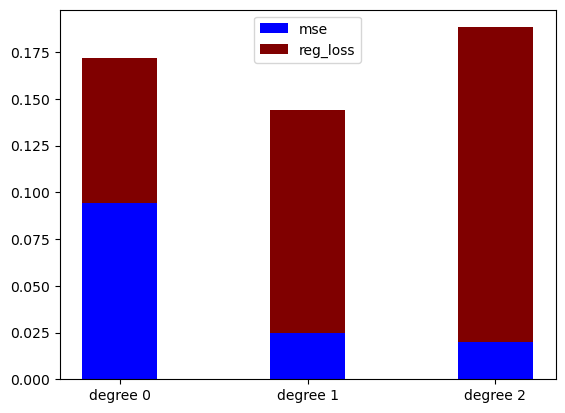

dctcp-8
loss [0.08401390728580324, 0.13121773627491237, 0.18459207304743558]
mse [0.10494071654834639, 0.02679167250718734, 0.02095493589438548]


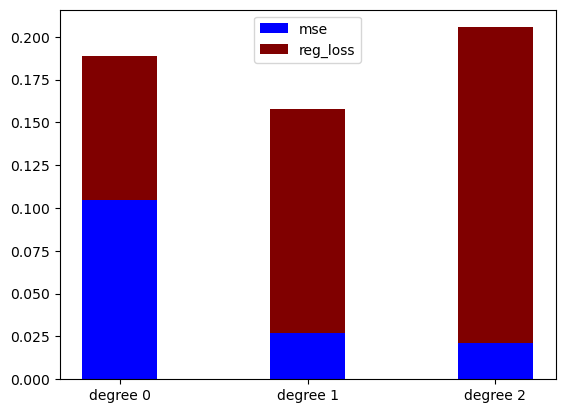

dctcp-9
loss [0.09404441948084062, 0.1525617741202723, 0.21080211597267473]
mse [0.16918747876695547, 0.07605896039628793, 0.057039430391883764]


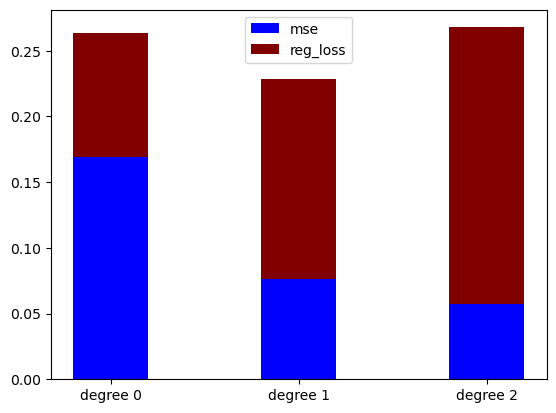

dctcp-10
loss [0.08098524121905754, 0.12141036626004059, 0.16393507295305612]
mse [0.11436378178179127, 0.025287551171633282, 0.014189231337067884]


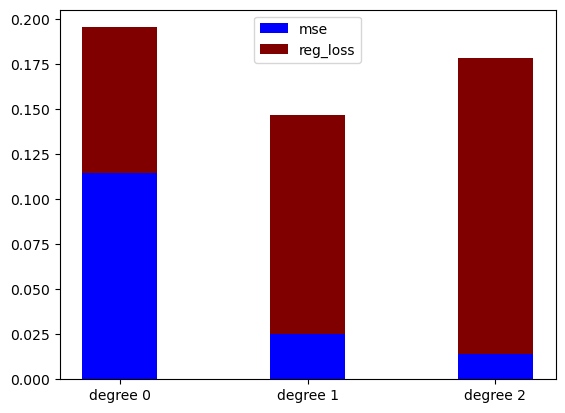

dctcp-11
loss [0.08965135875815303, 0.13705355621225887, 0.1845699342263376]
mse [0.1762969138448163, 0.05817875518609278, 0.037855495066667515]


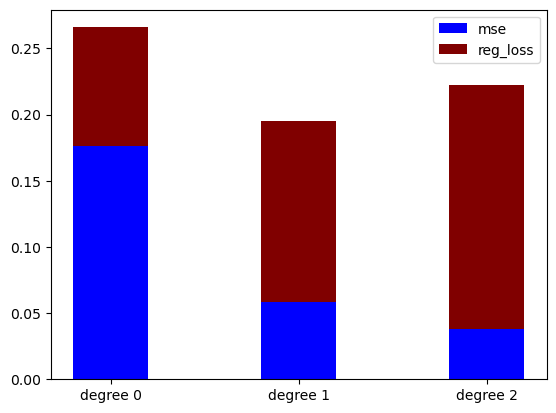

dctcp-12
loss [0.0873556749250777, 0.13323595194442261, 0.1785993515710679]
mse [0.17612593527303966, 0.05692656130234242, 0.033428418709724524]


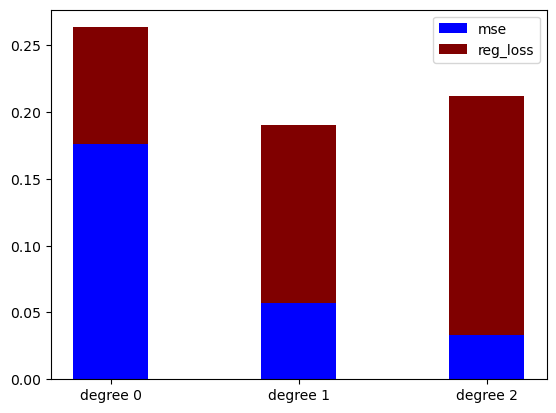

dctcp-13
loss [0.0762244191689082, 0.11423758681273369, 0.16084900095094434]
mse [0.09316670227279167, 0.017263946932711056, 0.013745921090419189]


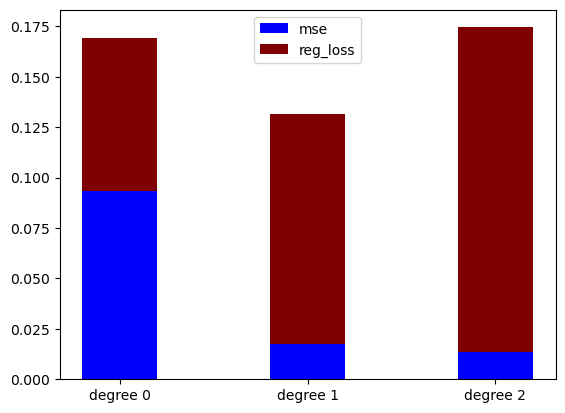

dctcp-14
loss [0.06694572684388815, 0.10240657770026723, 0.14371266062944196]
mse [0.06835859675040938, 0.01351544470433749, 0.009887821599663352]


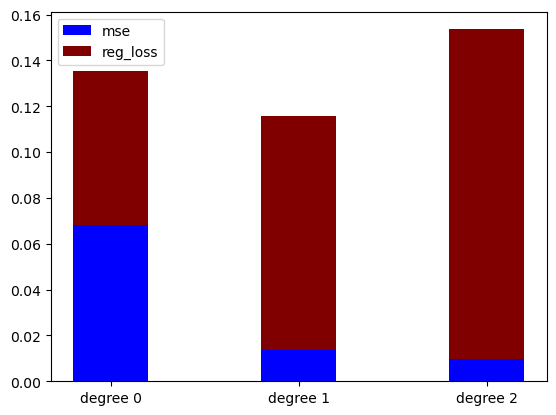

dctcp-15
loss [0.08443887930823224, 0.1321112180150558, 0.17447048520320085]
mse [0.20742584756473176, 0.09356542876041728, 0.05129203118253376]


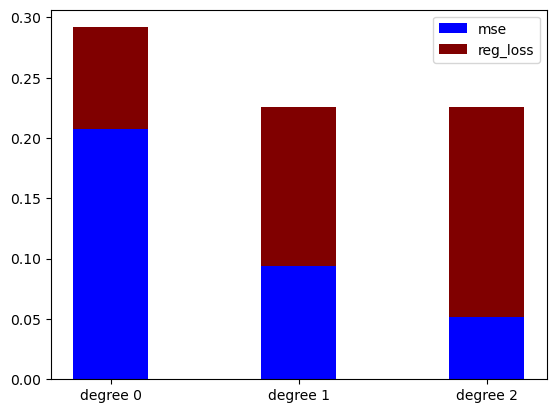

dctcp-16
loss [0.08304655050696214, 0.1267965494482205, 0.17932001849971121]
mse [0.16382555184638248, 0.04843901030048603, 0.038445025469350004]


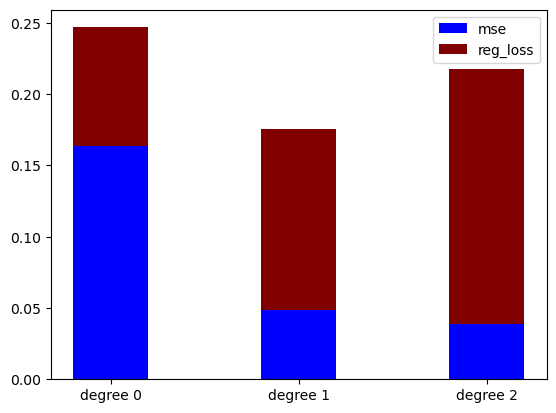

dctcp-17
loss [0.08560667533914827, 0.13367049506391046, 0.18334024919575898]
mse [0.1224337671388079, 0.035147346176519864, 0.023243452116992788]


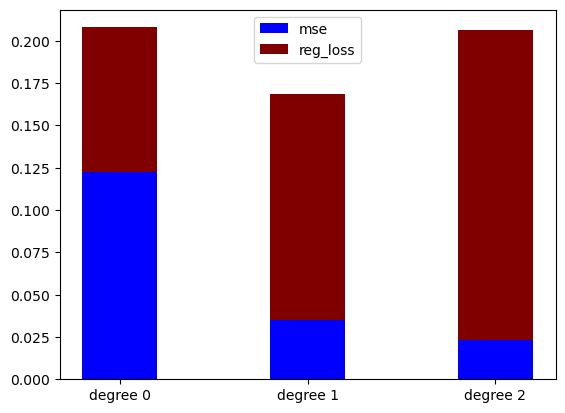

dctcp-18
loss [0.09457593170107546, 0.15377316154459436, 0.21835647344572637]
mse [0.13218007446640515, 0.05106638554021195, 0.04358197928197178]


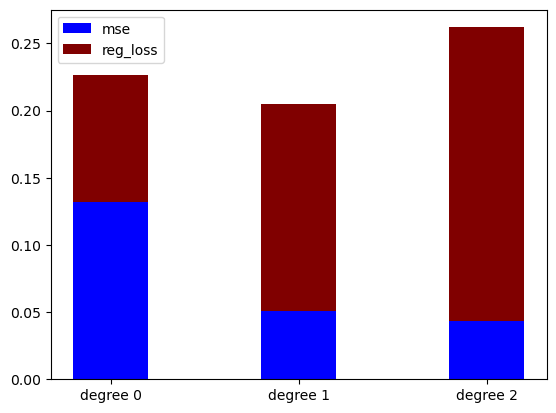

dctcp-19
loss [0.09371009395960009, 0.14783994461686492, 0.2042281164154842]
mse [0.21367800682629703, 0.08573190432181911, 0.0637795140542006]


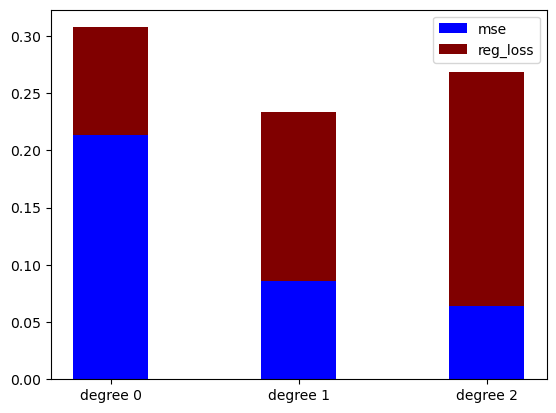

dctcp-20
loss [0.08537489524884462, 0.13468143250283257, 0.19198646298194988]
mse [0.12232238742037667, 0.03252556396173019, 0.028143731661495825]


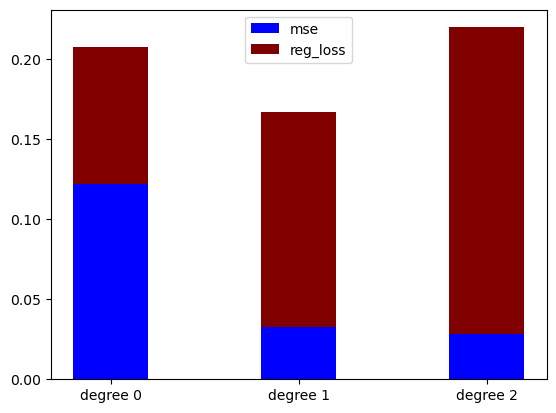

dctcp-21
loss [0.05622535126955615, 0.06725932971803276, 0.07795053265413784]
mse [0.1271409505721526, 0.023175553906612512, 0.0053909781291529655]


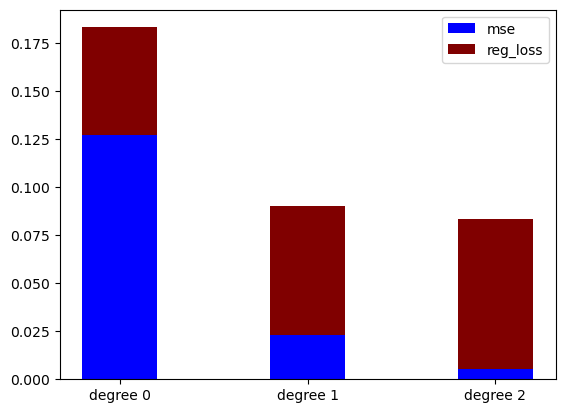

dctcp-22
loss [0.10038428666680582, 0.16380268325435088, 0.2262264245787936]
mse [0.18970017234464231, 0.08939042152154064, 0.06890172129533381]


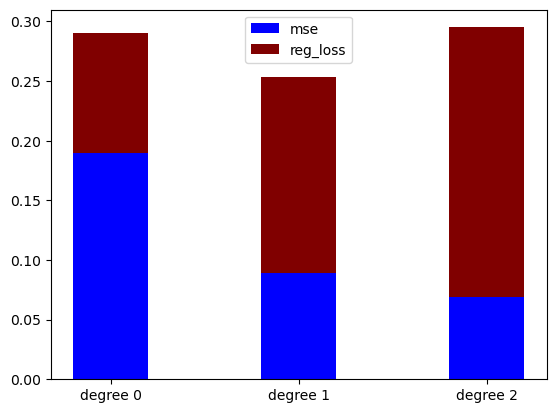

dctcp-23
loss [0.0781150440187592, 0.12965465944036075, 0.18404756501912814]
mse [0.0950822748862944, 0.03940539984856408, 0.0322064243800373]


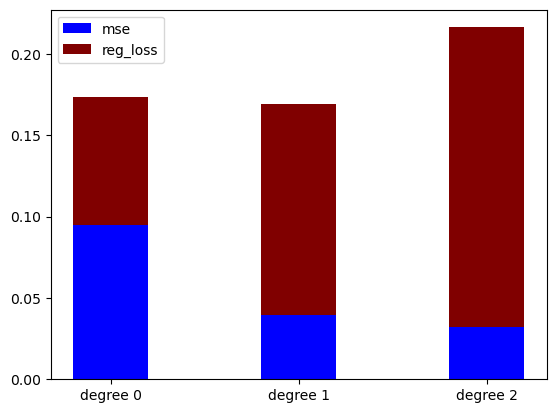

dctcp-24
loss [0.09157898204883189, 0.14467790140420705, 0.20209556074526758]
mse [0.1543456069682517, 0.054170711555142484, 0.0420543148177073]


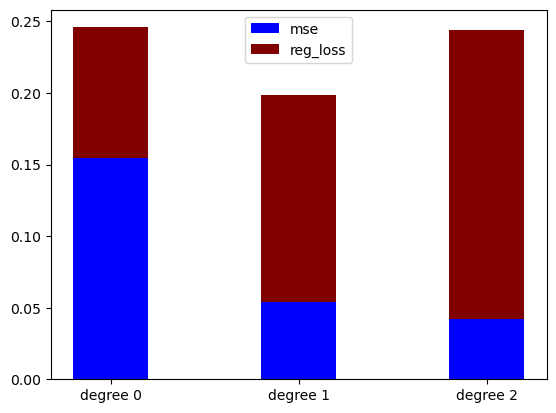

dctcp-25
loss [0.09052990105062342, 0.14426044647900924, 0.19764568672259397]
mse [0.14774273654638115, 0.05310625432099892, 0.03681525071871919]


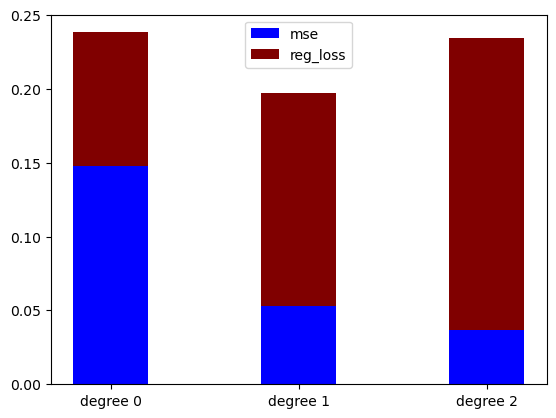

dctcp-26
loss [0.08933018931674515, 0.13888681890707882, 0.18356300563638162]
mse [0.16230353131881248, 0.0612639276319096, 0.0339973853505989]


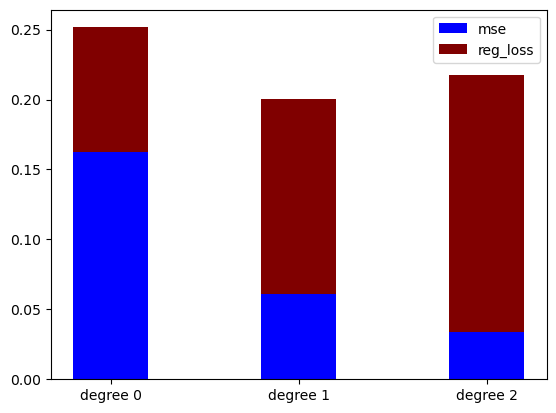

dctcp-27
loss [0.09120051705526006, 0.13931159713291602, 0.19258958629017386]
mse [0.1589358221690086, 0.050098038852017475, 0.03630925607283019]


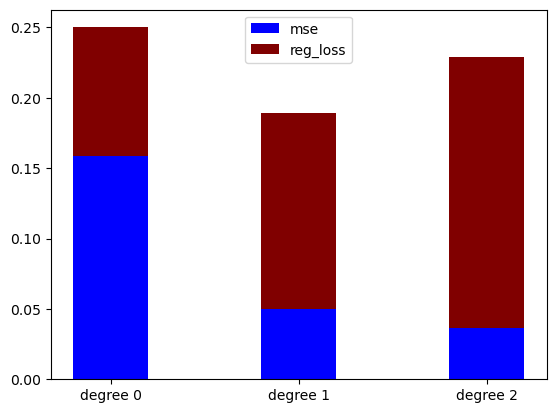

dctcp-28
loss [0.08990805170896611, 0.14695397172722383, 0.20716237798093956]
mse [0.10818141766672432, 0.040224114575076124, 0.03215074076173306]


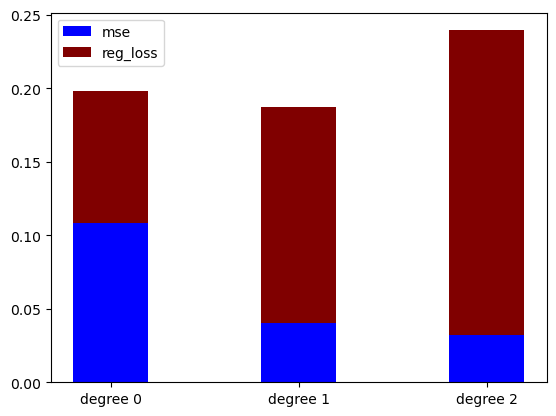

dctcp-29
loss [0.09414218883837884, 0.14316185704389275, 0.19327644635432117]
mse [0.22435062392390304, 0.07924106389753231, 0.0511765922748013]


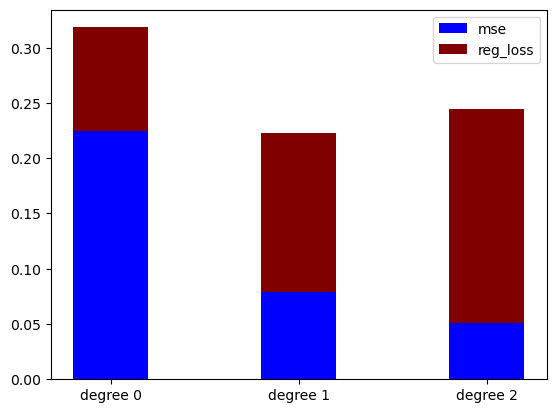

dctcp-30
loss [0.07147978884636863, 0.10274567659889607, 0.13780350175071052]
mse [0.08140068509168297, 0.015272047549734324, 0.009708246349560443]


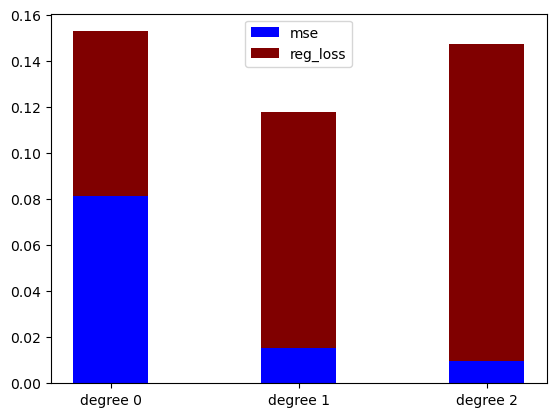

dctcp-31
loss [0.07589858581126088, 0.10368740751067294, 0.13635787275687059]
mse [0.23666904688744253, 0.06435964356925429, 0.024529445297798044]


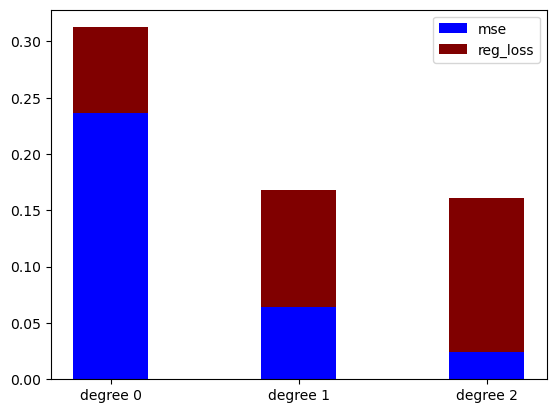

dctcp-32
loss [0.09563251645797526, 0.15427544232083173, 0.21729857830875174]
mse [0.1572010329208643, 0.0651996680326289, 0.0540226678168801]


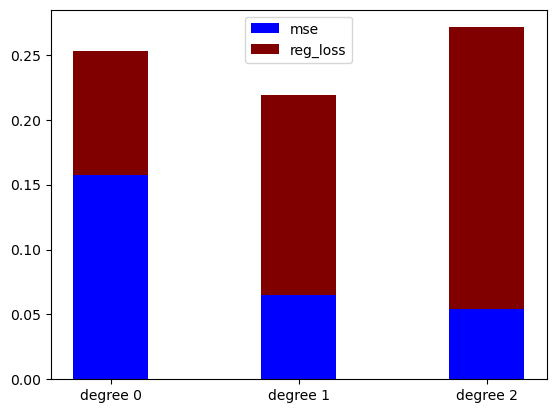

dctcp-33
loss [0.08545005673062453, 0.13294712953941695, 0.1789453178525212]
mse [0.1461303324501717, 0.04852340729808917, 0.030591801721731916]


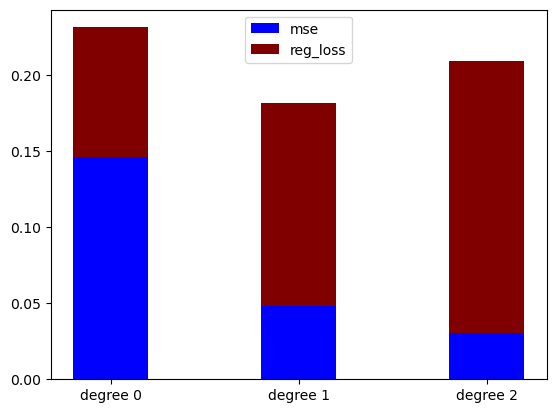

dctcp-34
loss [0.08180627750139381, 0.12789983848705785, 0.17820809937149792]
mse [0.16320097716436657, 0.053013734458120326, 0.037594932716726884]


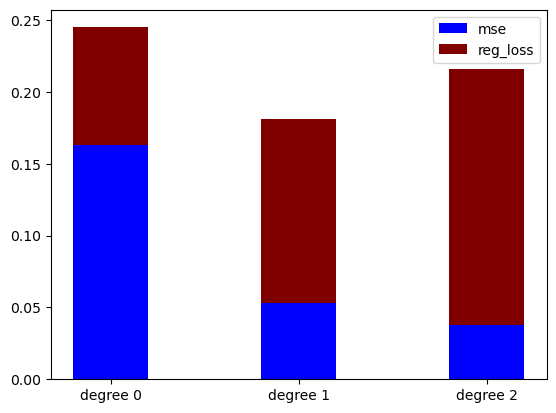

dctcp-35
loss [0.09076764761118888, 0.1466489481363769, 0.20867170905539859]
mse [0.1318803309527708, 0.0487638303448059, 0.04193200334494305]


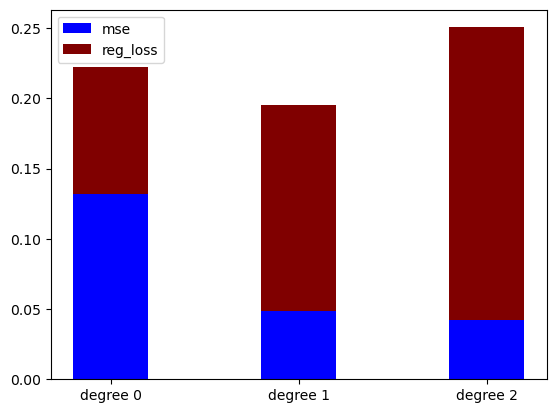

dctcp-36
loss [0.06517495246387717, 0.10388388670636575, 0.14807351350680598]
mse [0.05751412857171798, 0.013496032732792223, 0.010601828631336638]


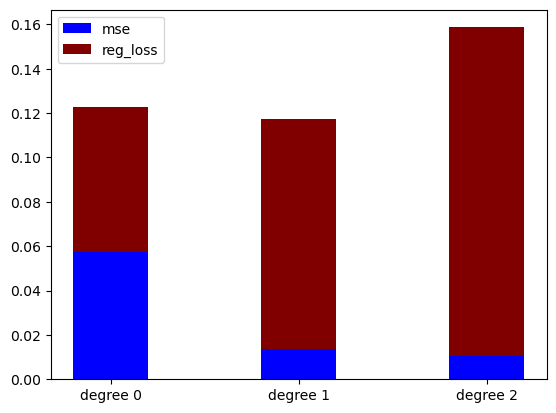

dctcp-37
loss [0.07424873881468406, 0.11829789253301037, 0.16615114219458887]
mse [0.10947869599691568, 0.03771368446227707, 0.02870553204055776]


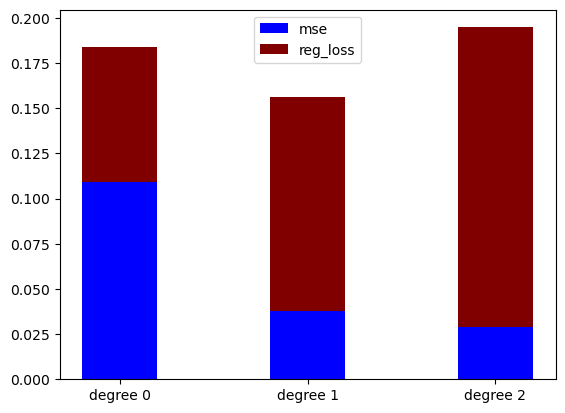

dctcp-38
loss [0.0784653107960705, 0.11931628519418598, 0.1664812117052308]
mse [0.1021574054551631, 0.022272904484229115, 0.015824384716190708]


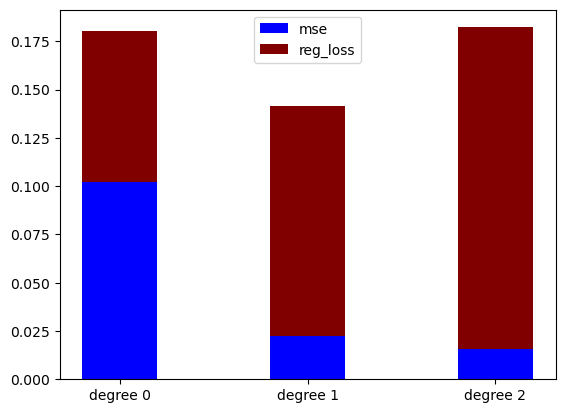

dctcp-39
loss [0.08731665989442272, 0.1346691873870199, 0.18855577389459774]
mse [0.11245032582120298, 0.028703721270509717, 0.023016159583268615]


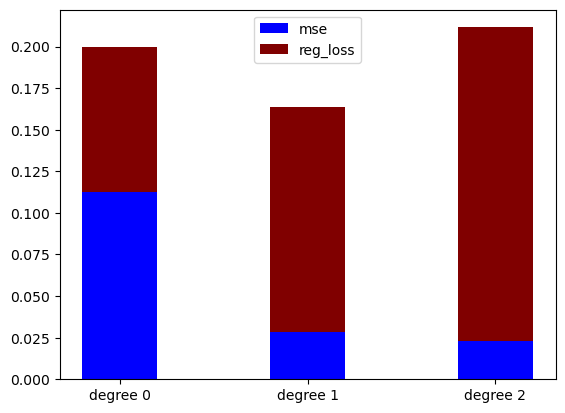

dctcp-40
loss [0.09629500525292498, 0.1588740781583285, 0.218327105607224]
mse [0.19680093653140007, 0.10074545190801212, 0.07635228561821959]


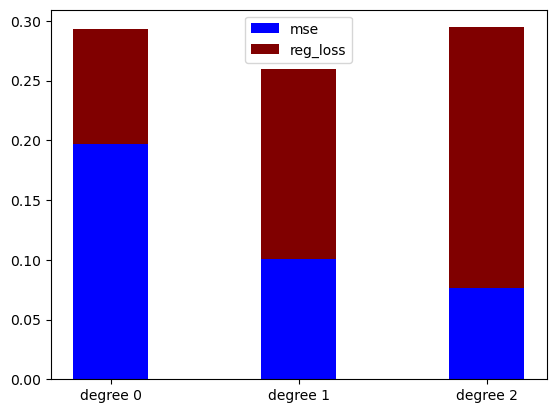

dctcp-41
loss [0.0906354401613961, 0.1397421666775801, 0.19487829316808059]
mse [0.15137267811891322, 0.04610108146991299, 0.03483235878249972]


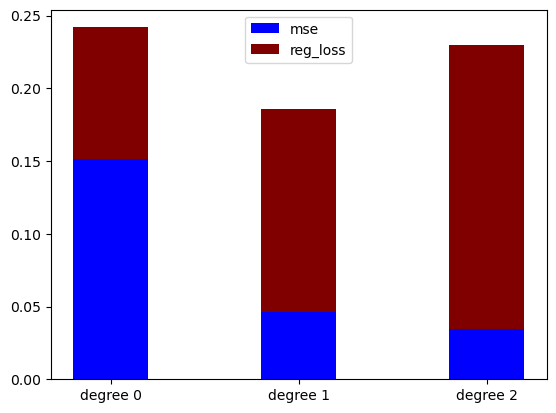

dctcp-42
loss [0.07293235514859231, 0.10938527156046013, 0.15086819829988316]
mse [0.07787663780431574, 0.018710812890215017, 0.013837124985260496]


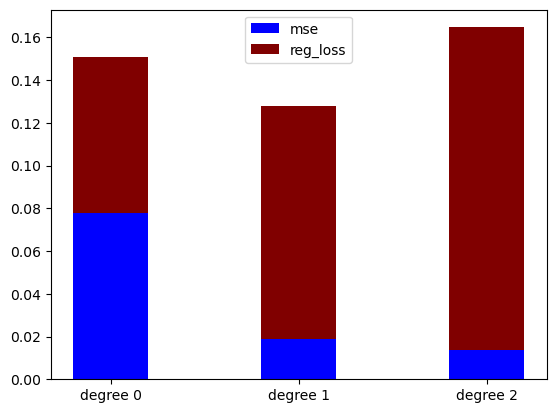

dctcp-43
loss [0.09625854836474737, 0.15164191457799986, 0.2036893751605808]
mse [0.18431263279126087, 0.06910128172124792, 0.0435408323732498]


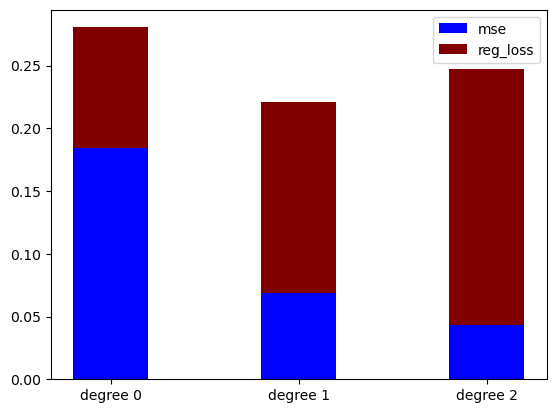

dctcp-44
loss [0.08620124061678623, 0.13975052266905016, 0.20245300876735683]
mse [0.09831477786735424, 0.03397710822768194, 0.031559525888261324]


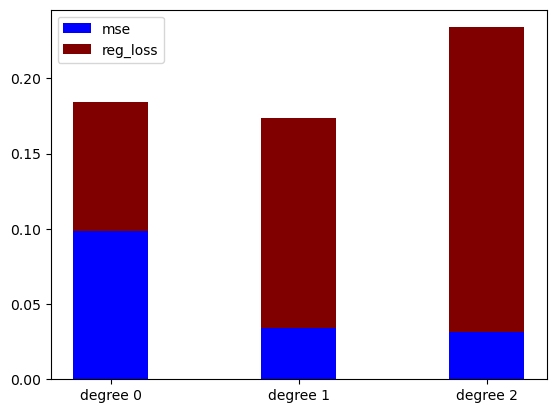

dctcp-45
loss [0.083197645987955, 0.10952555280159385, 0.14266742415228126]
mse [0.13092532503276078, 0.02279163930565789, 0.012740270941792564]


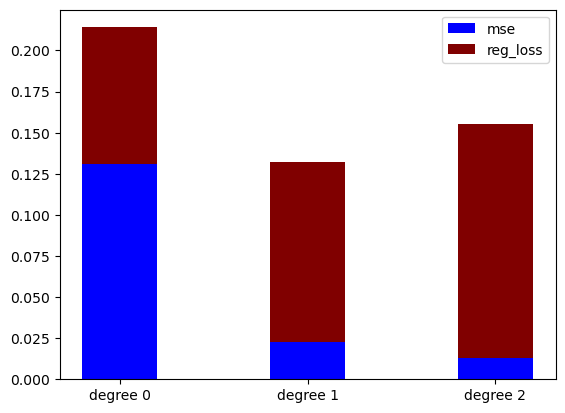

dctcp-46
loss [0.07827745017849373, 0.11746229510094977, 0.15605577692694442]
mse [0.24009738404004483, 0.08362706544538638, 0.03940449770526947]


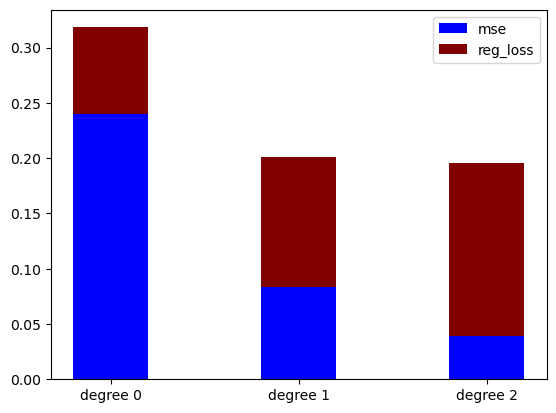

dctcp-47
loss [0.08624388981942532, 0.1292564149555501, 0.17376950696763155]
mse [0.12711402955366358, 0.03422819391788775, 0.018735577536623648]


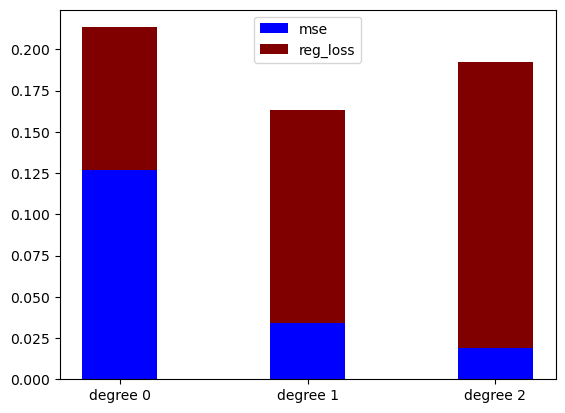

dctcp-48
loss [0.0879814343695246, 0.1333464379078887, 0.17532452325559703]
mse [0.18592004349852287, 0.06156623001385987, 0.032320835860717406]


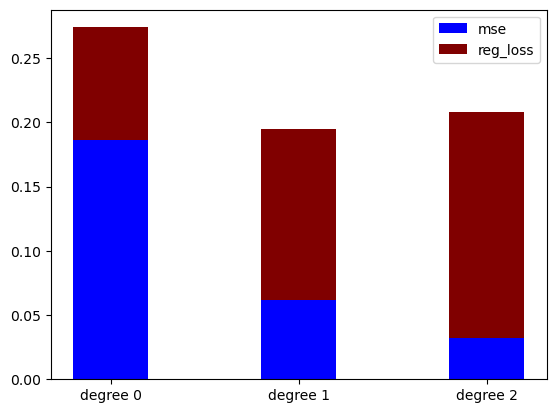

dctcp-49
loss [0.08530836262329934, 0.13772205489392636, 0.1878657999262192]
mse [0.15273417165110545, 0.059909527231315166, 0.03925987778239625]


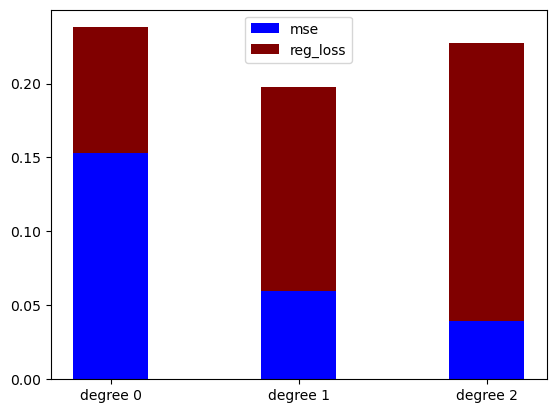

dctcp-50
loss [0.08425821178505151, 0.13461936203394484, 0.18986486403614408]
mse [0.16272227587084157, 0.06090464774286117, 0.04938644729437929]


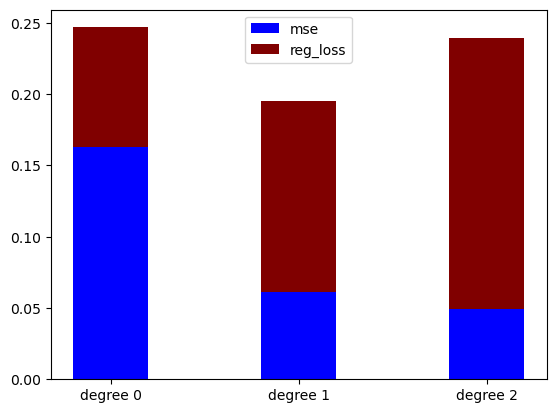

highspeed-1
loss [0.07922391057915319, 0.11825700885451128, 0.16120424728981497]
mse [0.1292101242612163, 0.02838942919418177, 0.015744301786721666]


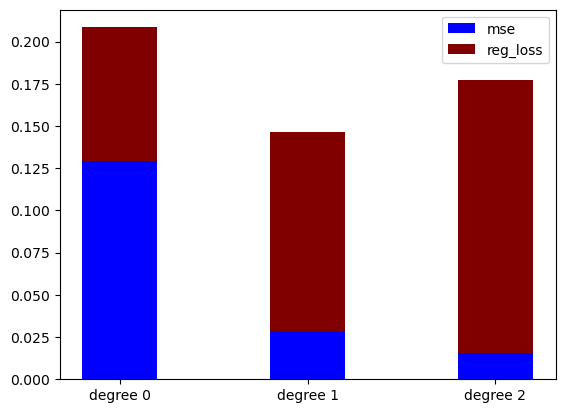

highspeed-2
loss [0.0757622391493696, 0.11447472397651899, 0.15724107704848864]
mse [0.08499054043197474, 0.019221941786744925, 0.012871205552949322]


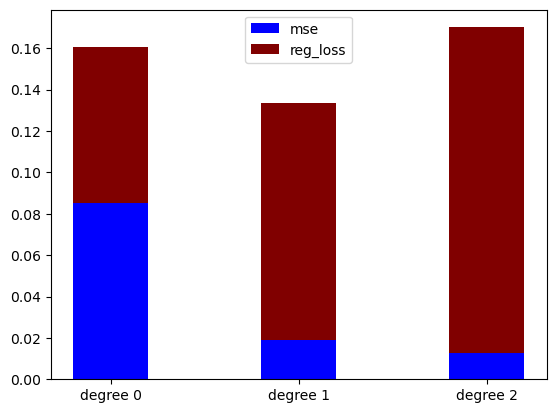

highspeed-3
loss [0.0861150232774564, 0.1412733516122752, 0.20029780161259036]
mse [0.09674488104793384, 0.04146451762375222, 0.035303779874764164]


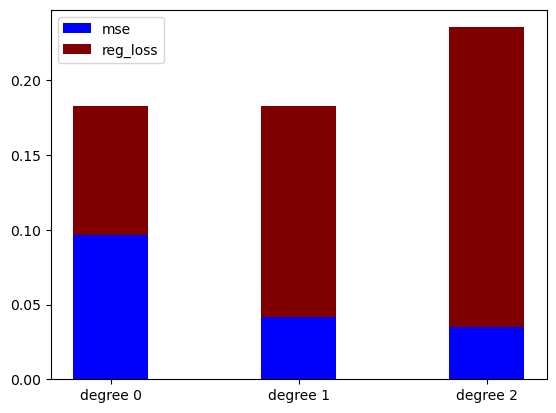

highspeed-4
loss [0.08553692081200906, 0.1318279412318144, 0.18172127917734104]
mse [0.10672998361726121, 0.031661421903080134, 0.02340579927483799]


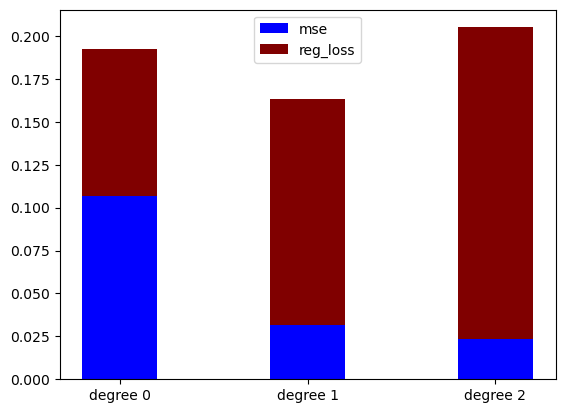

highspeed-5
loss [0.082129327553089, 0.12479859581325557, 0.17063585710485493]
mse [0.13883046830274137, 0.03377978554213375, 0.021685243515989477]


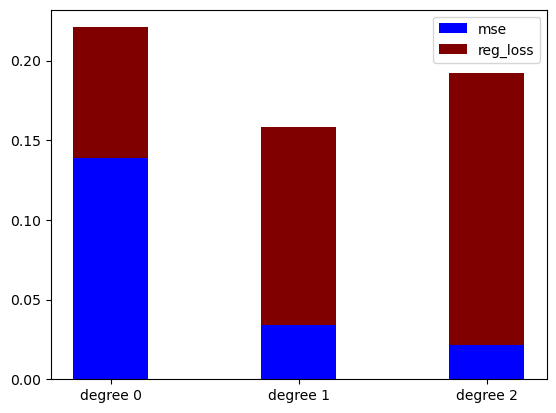

highspeed-6
loss [0.08719972251106689, 0.13572714323539944, 0.18476712478839558]
mse [0.11885804897131985, 0.033341340340138366, 0.02136983026743396]


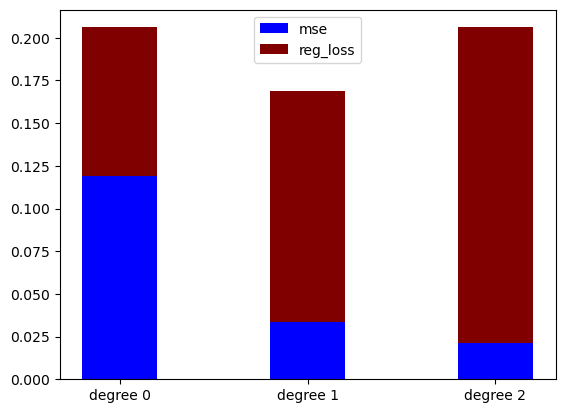

highspeed-7
loss [0.06398163872713629, 0.08913631777385529, 0.11657492315627015]
mse [0.11461912955345871, 0.028489490806373467, 0.01317332212044506]


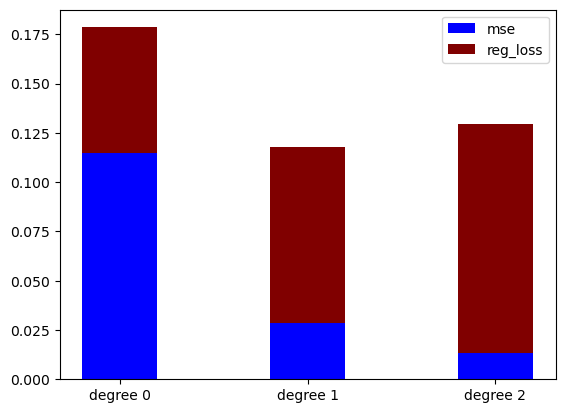

highspeed-8
loss [0.08070609250628379, 0.09403912680761328, 0.13732642267944092]
mse [0.3525937658671967, 0.02353513529442716, 0.022890812349961397]


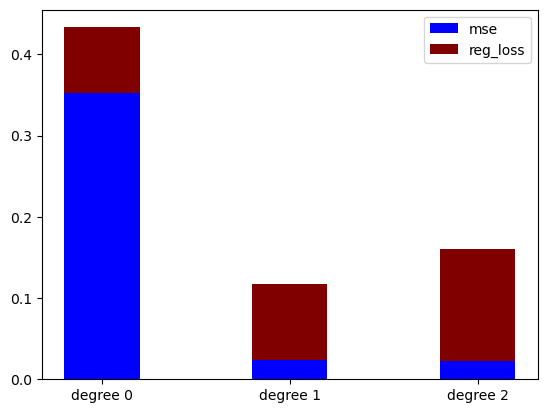

highspeed-9
loss [0.08720530249124994, 0.13614140608859837, 0.1823585839382567]
mse [0.16048092186955137, 0.05511811594891834, 0.03178122753367667]


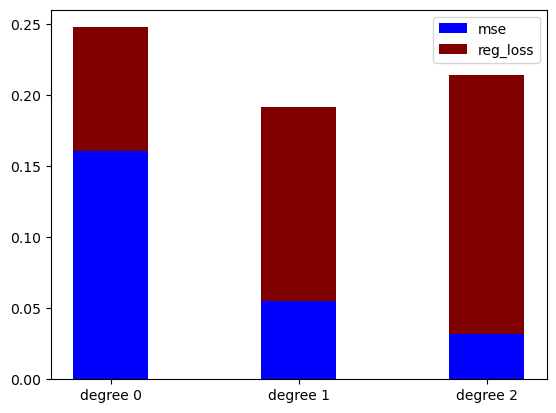

highspeed-10
loss [0.06611384412943375, 0.10326763176976517, 0.14506648285440718]
mse [0.06054626362649151, 0.01345553041362927, 0.010158527790463211]


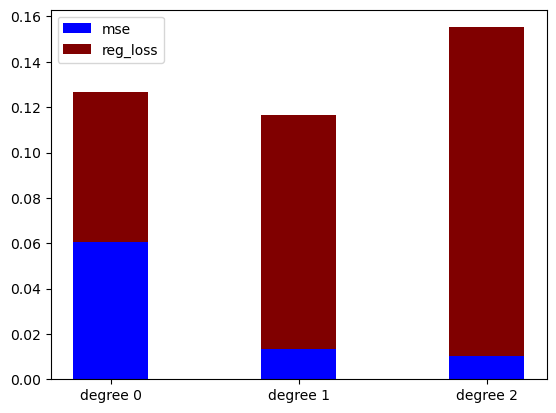

highspeed-11
loss [0.08385016980045812, 0.13114379620175592, 0.183430255710341]
mse [0.10493885279898825, 0.02908758577805142, 0.021886915276120515]


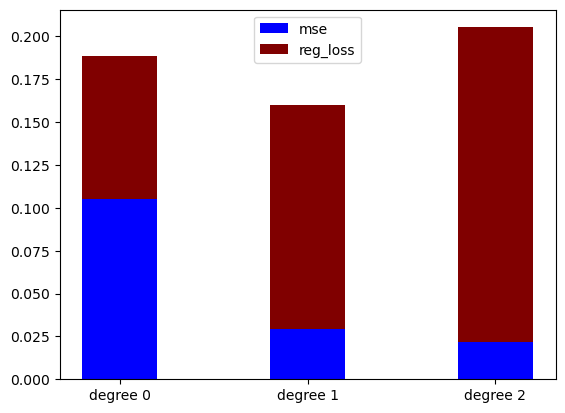

highspeed-12
loss [0.08527940126306262, 0.13134036766779525, 0.17625510883702156]
mse [0.17608748952286124, 0.0560780813277154, 0.030670011502287712]


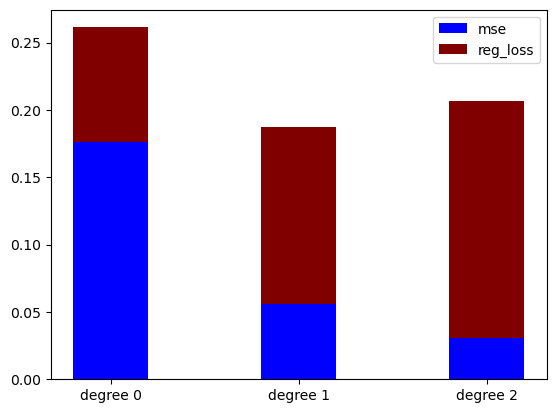

highspeed-13
loss [0.07032784733725438, 0.11021186359343477, 0.15494230431496844]
mse [0.08729932156095739, 0.021815632131420706, 0.016943863785738335]


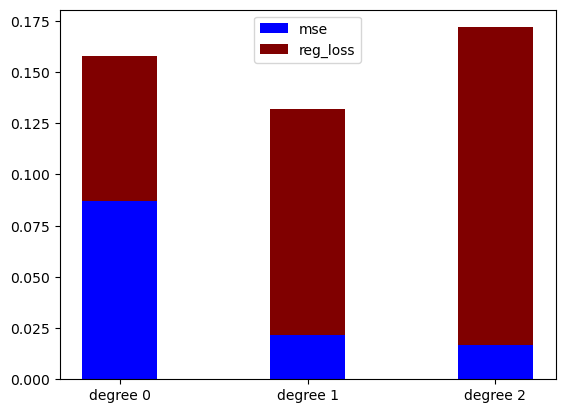

highspeed-14
loss [0.08958229285318363, 0.14249803195452201, 0.20191504690604845]
mse [0.11837962863621677, 0.03978793886585897, 0.03277674713056792]


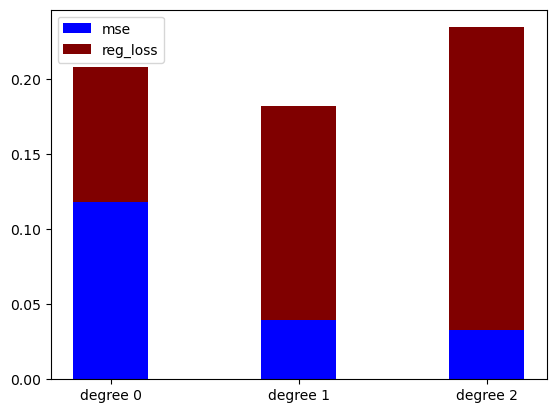

highspeed-15
loss [0.07511493611231888, 0.1120139895082205, 0.15555067924088187]
mse [0.09994806258394702, 0.017829299581178952, 0.012023293213107713]


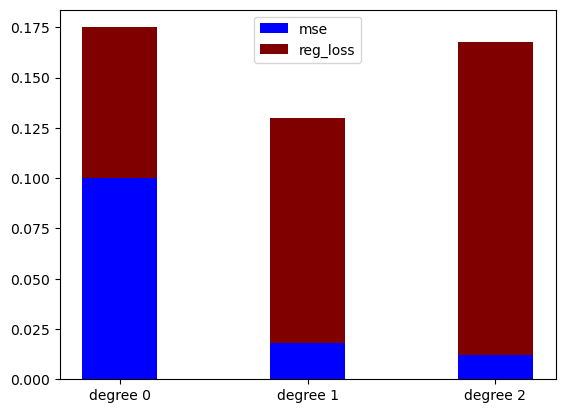

highspeed-16
loss [0.0874876431857306, 0.1360994406386608, 0.18348458170872686]
mse [0.2930273318418673, 0.12585834973275575, 0.07718042535221667]


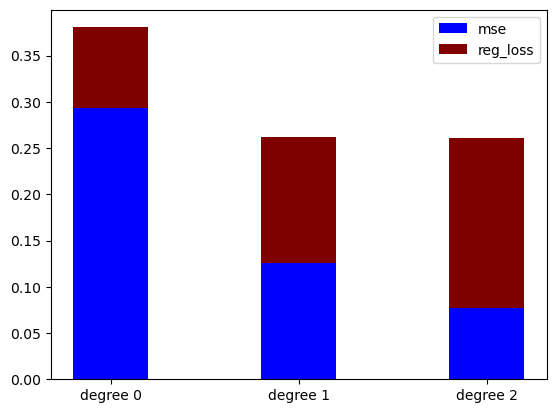

highspeed-17
loss [0.07901196799040272, 0.12506660184291366, 0.16546468406514714]
mse [0.11563657881723316, 0.04527597768566634, 0.02309349156479194]


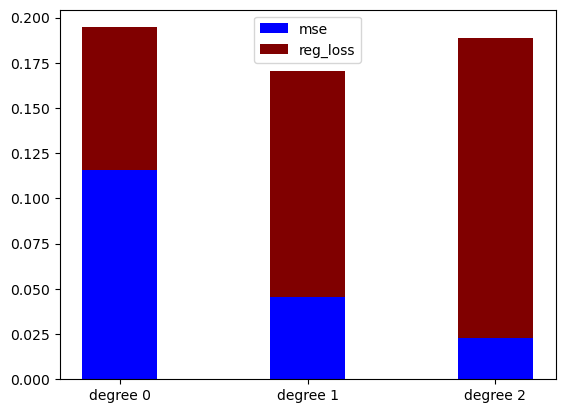

highspeed-18
loss [0.07504077555416189, 0.11454772450927252, 0.15390401620705652]
mse [0.10576389135106616, 0.023635223883437872, 0.011895808895200565]


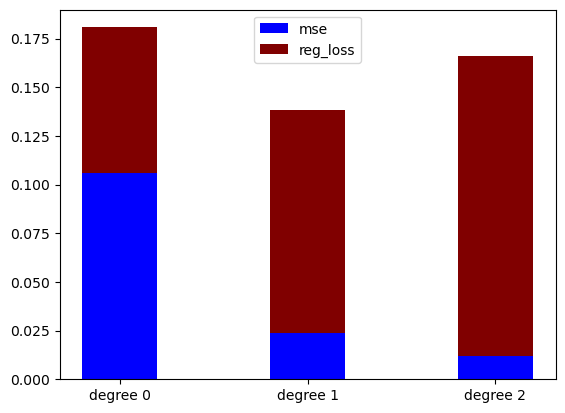

highspeed-19
loss [0.08335079744651669, 0.1213728163561636, 0.1562060783215888]
mse [0.11635440896737503, 0.027073413079584614, 0.013811581225117258]


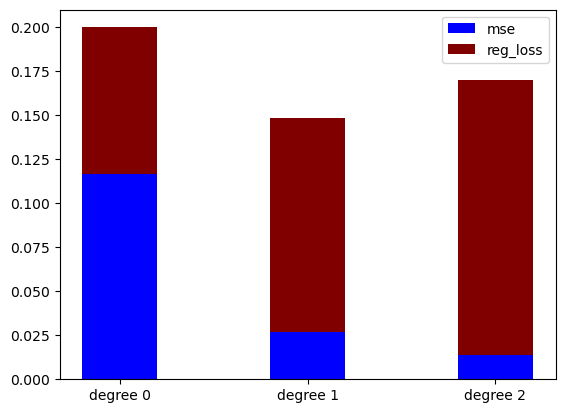

highspeed-20
loss [0.08080957846082154, 0.12290367830649228, 0.16725753267514762]
mse [0.13198203773191042, 0.032531204677121846, 0.019199354752197167]


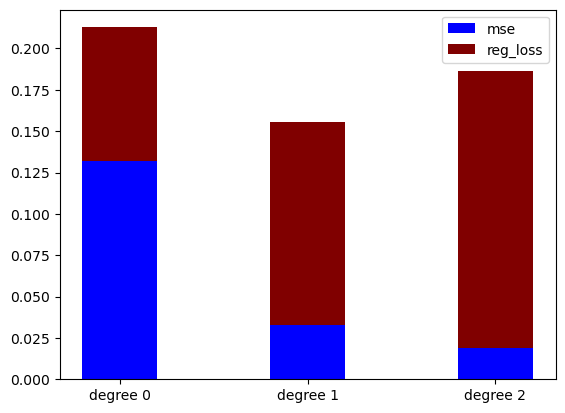

highspeed-21
loss [0.09032601683013453, 0.1362622416688459, 0.18161437199681735]
mse [0.1914780951228276, 0.06742943395663907, 0.04014317589672988]


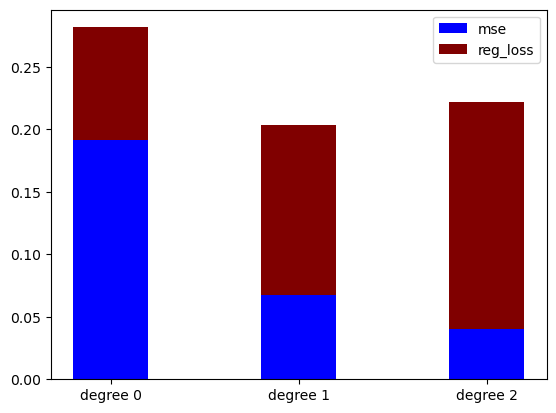

highspeed-22
loss [0.09358130048627512, 0.14493328010784542, 0.1908579051450977]
mse [0.1834637503189129, 0.07053109016705653, 0.0370788513147128]


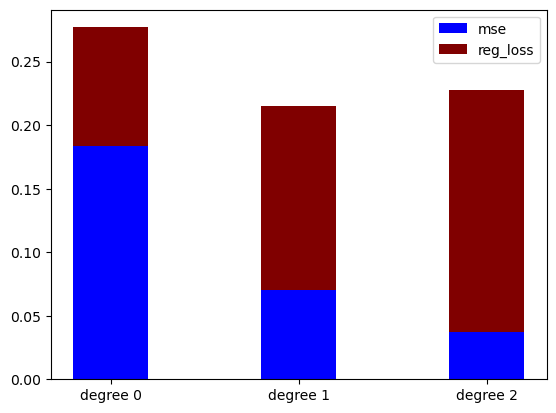

highspeed-23
loss [0.04709524673982955, 0.05649379449899908, 0.07595892210270039]
mse [0.07566961203095866, 0.004381467246702965, 0.0014541917233872443]


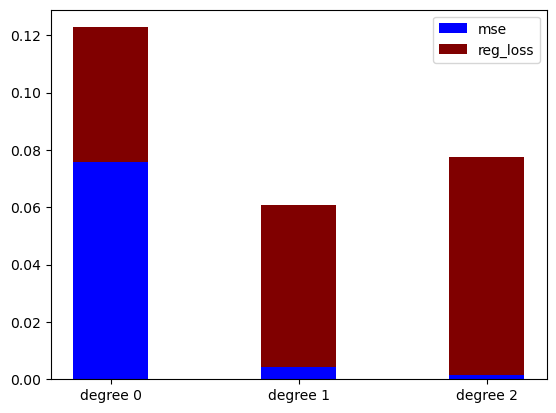

highspeed-24
loss [0.08083638737088836, 0.12703633619924554, 0.17800762331359432]
mse [0.102301043666493, 0.026594941236332353, 0.020416263237065125]


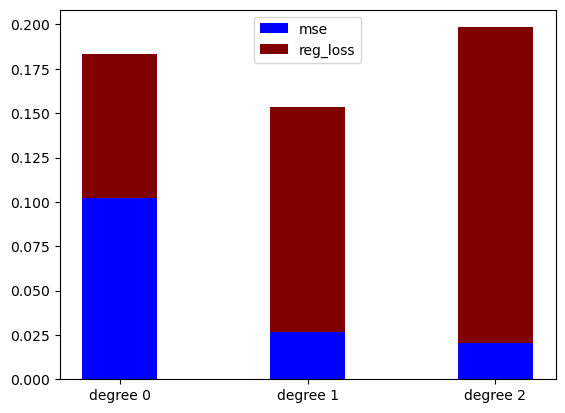

highspeed-25
loss [0.10656928674274047, 0.1763663663985113, 0.2479863874203736]
mse [0.16129543731373505, 0.07504458074135305, 0.05959161799858607]


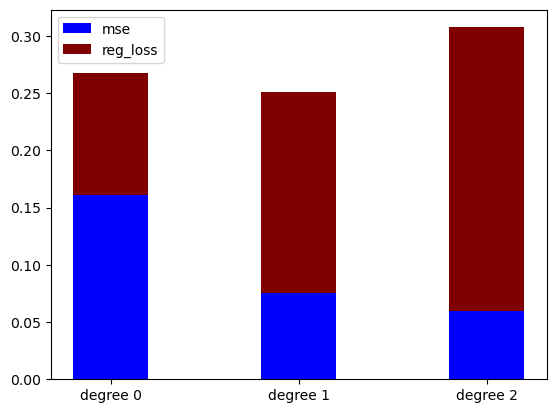

highspeed-26
loss [0.08326683557872877, 0.12943671126297646, 0.1808112359123598]
mse [0.12515535912367706, 0.032574186686596715, 0.0245273564534997]


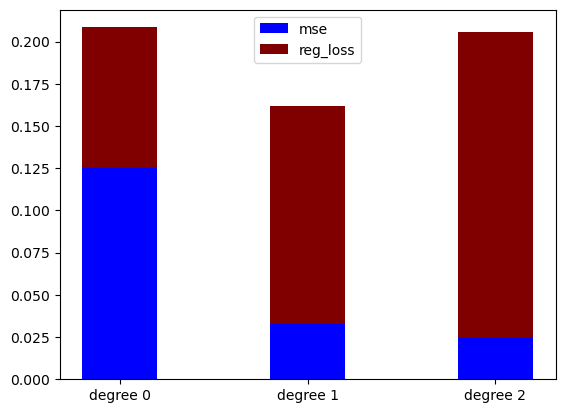

highspeed-27
loss [0.07914860574826431, 0.12033505099840885, 0.1684453366365133]
mse [0.09596050989201914, 0.023027642318735227, 0.01839368339156228]


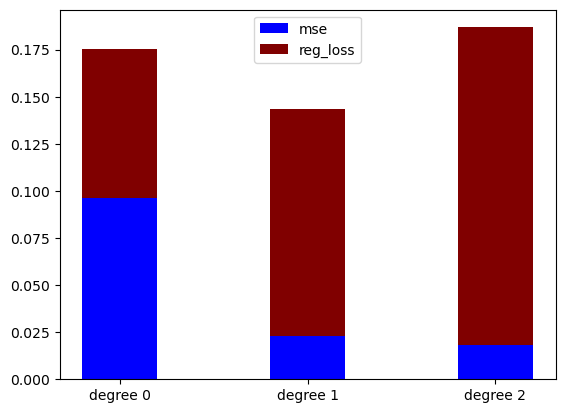

highspeed-28
loss [0.08435859219761122, 0.11756178146391127, 0.1501341715080986]
mse [0.15097629935780402, 0.03476324219125977, 0.014377089847422586]


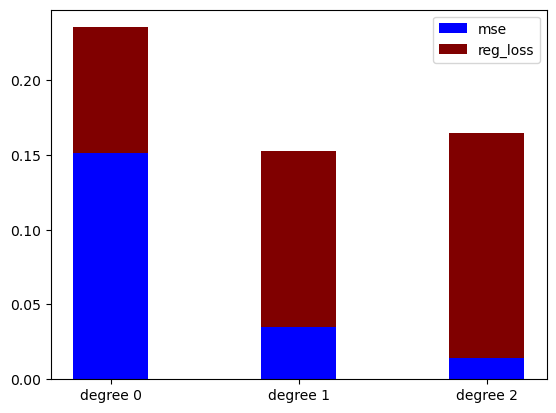

highspeed-29
loss [0.06650762170388523, 0.08074403869108368, 0.10100953970954228]
mse [0.10370962220450039, 0.011301781570920691, 0.0031032459184657294]


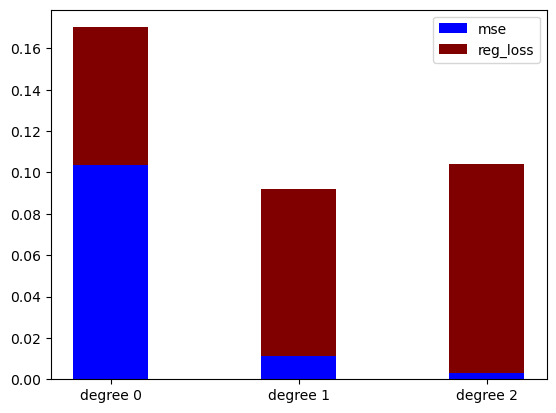

highspeed-30
loss [0.07091600773790281, 0.1121916218415662, 0.15885985988037843]
mse [0.07374662455653645, 0.018100772240665548, 0.01453755434097263]


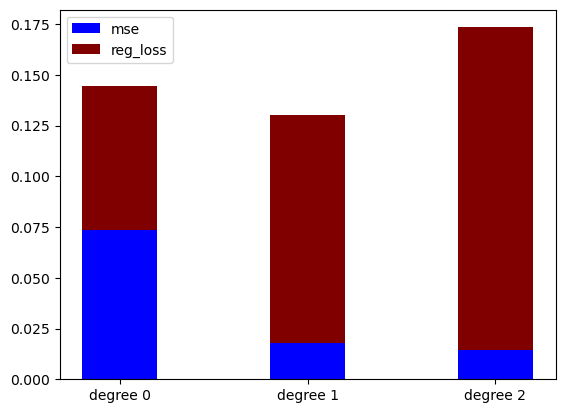

highspeed-31
loss [0.06671433988811053, 0.09442516422657082, 0.12783214232640006]
mse [0.07579217547463853, 0.010493941274583508, 0.005881665474436406]


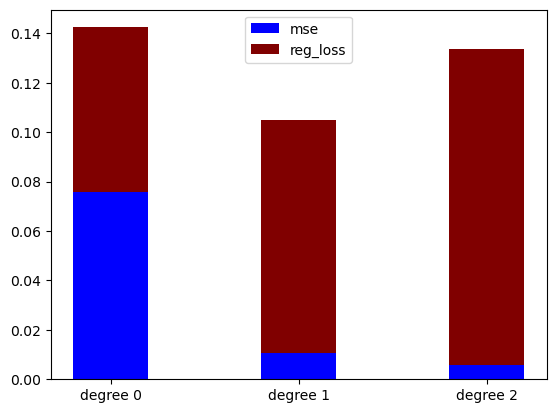

highspeed-32
loss [0.07649656555032715, 0.10765021128269861, 0.14406321658818913]
mse [0.26448723924381257, 0.07101445463738575, 0.03433634476804257]


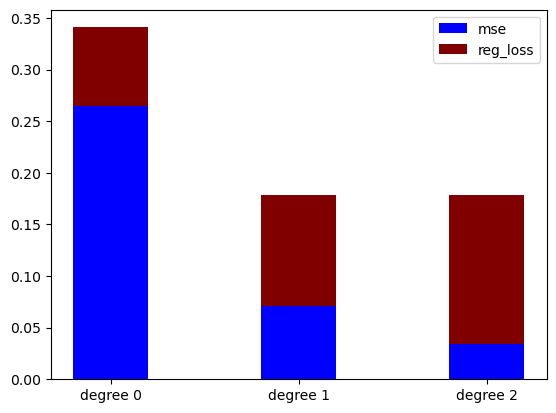

highspeed-33
loss [0.09018345852825942, 0.13706448399958432, 0.1854984888411007]
mse [0.1462376747713845, 0.044071546837450015, 0.02760793721558881]


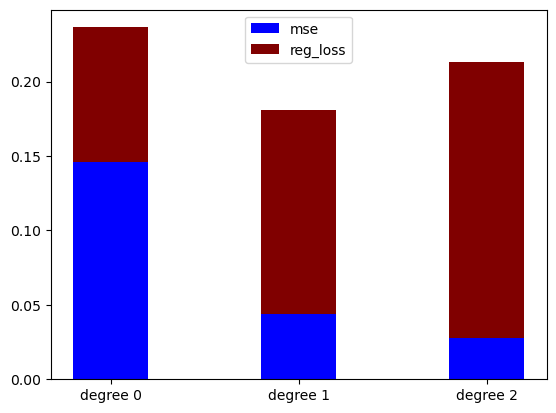

highspeed-34
loss [0.0945642741881712, 0.15474772554092708, 0.21699610589019117]
mse [0.1480869079649077, 0.0701705218953407, 0.0570846380070763]


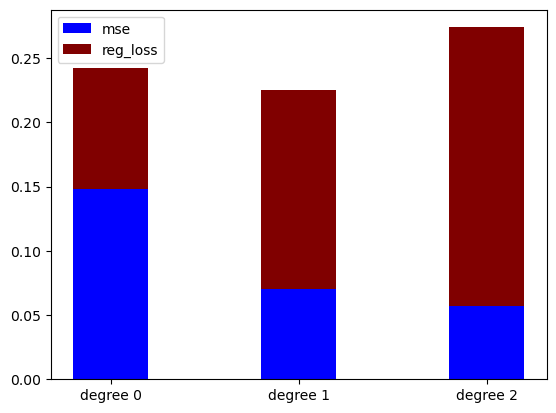

highspeed-35
loss [0.07840952735591605, 0.1210601971975227, 0.17145072889746482]
mse [0.11064217670115935, 0.0313064685506499, 0.025916266890389793]


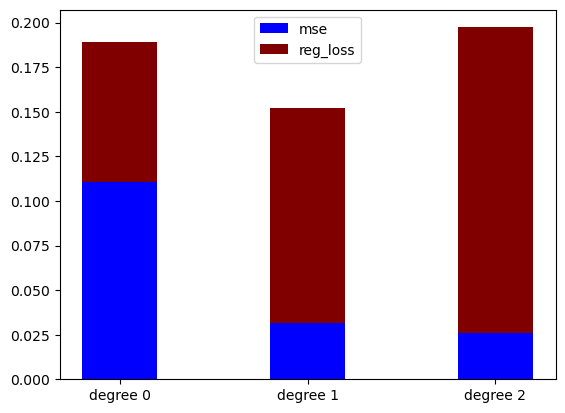

highspeed-36
loss [0.08016421427207292, 0.1241704912600285, 0.1714255152172046]
mse [0.09238980033682409, 0.024796191367483764, 0.017889868098630027]


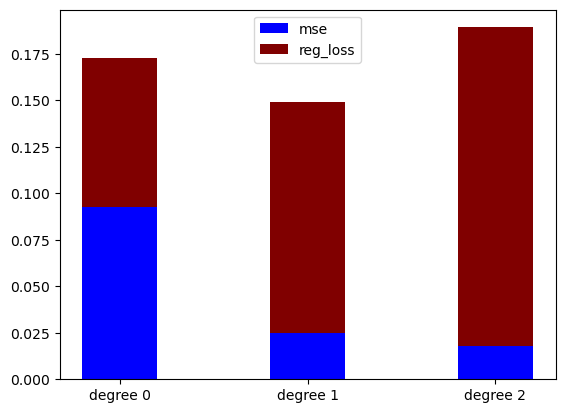

highspeed-37
loss [0.08640316013694127, 0.13165398291453545, 0.18201930452373238]
mse [0.16323942364617047, 0.05348938994528131, 0.03764896797516674]


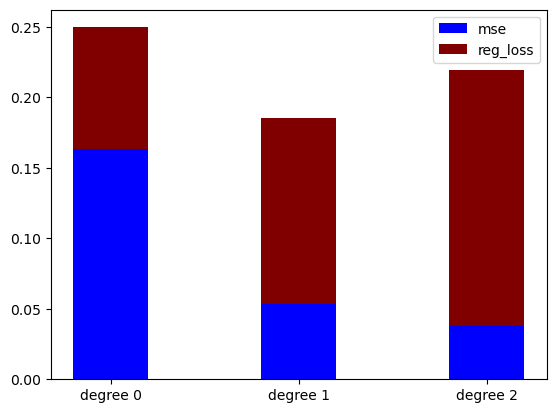

highspeed-38
loss [0.08278114874431129, 0.1294267242779675, 0.18089776754722733]
mse [0.11027421816799887, 0.03216350554163179, 0.024174355101714957]


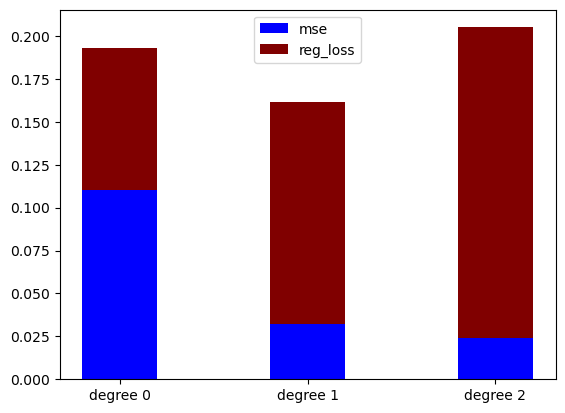

highspeed-39
loss [0.08161045677687409, 0.1174935575158541, 0.15403738479759488]
mse [0.13009750035651785, 0.02947438232578926, 0.013728817801719976]


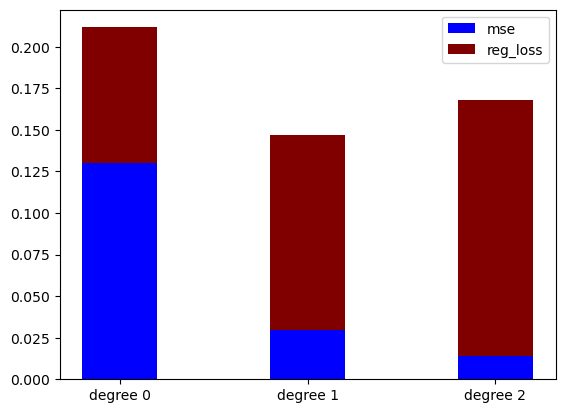

highspeed-40
loss [0.07748159564583584, 0.12414067095931146, 0.17101535651579744]
mse [0.08190460012384627, 0.02701159850338657, 0.0187188207829009]


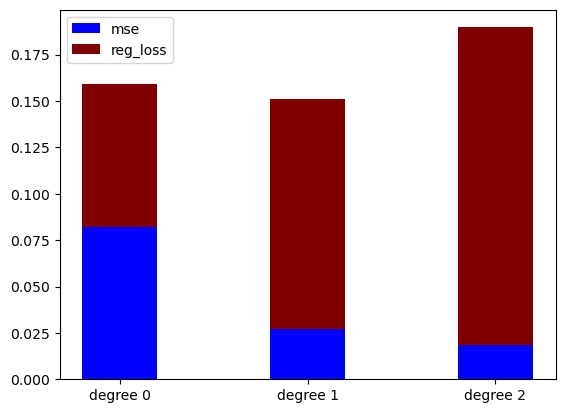

highspeed-41
loss [0.09317280644352366, 0.15028075859305823, 0.20906471577970243]
mse [0.21377806009136588, 0.09548052068710425, 0.07289714770187514]


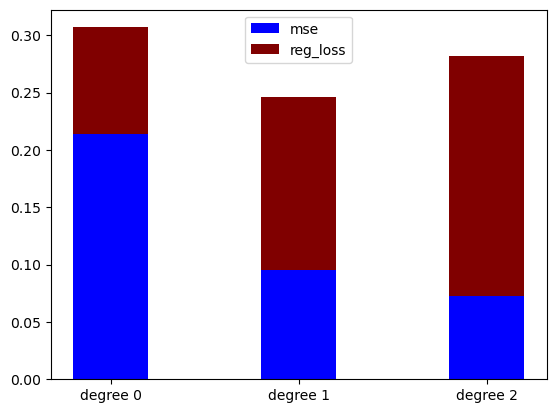

highspeed-42
loss [0.07069879256157757, 0.10519435313962473, 0.14199741314348807]
mse [0.07887993447089045, 0.01861304700533792, 0.011058279878050189]


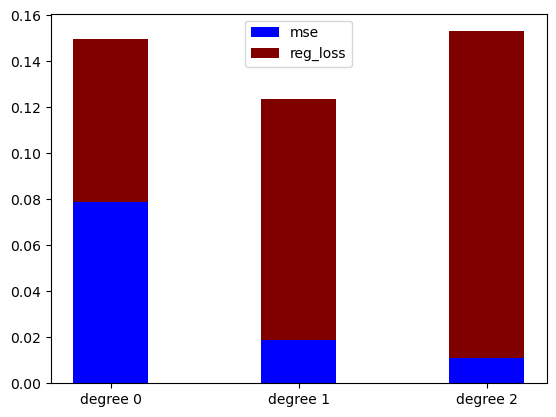

highspeed-43
loss [0.08281522724412446, 0.13426063596762328, 0.18607167835446137]
mse [0.09861163506381869, 0.033152753960697626, 0.02310946235809129]


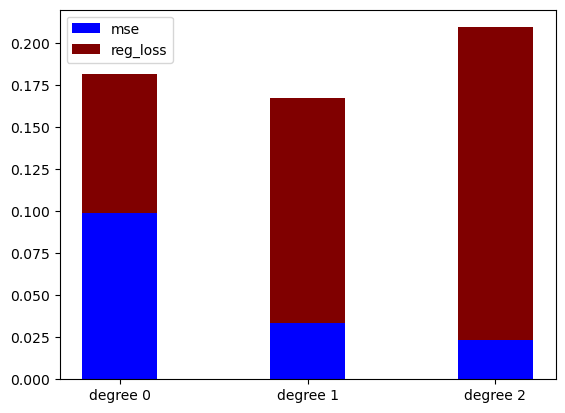

highspeed-44
loss [0.07967951446542276, 0.11234978891015901, 0.1465103496865833]
mse [0.1121963526311878, 0.024295536919391025, 0.012192454254287402]


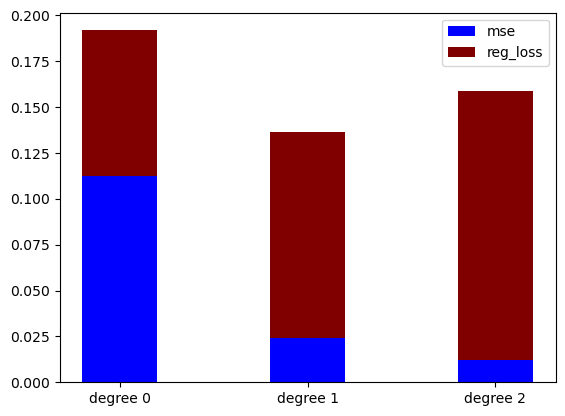

highspeed-45
loss [0.07465655304348726, 0.11505580533029203, 0.15773064845583012]
mse [0.09912982277871561, 0.022495839036930584, 0.014776973589033895]


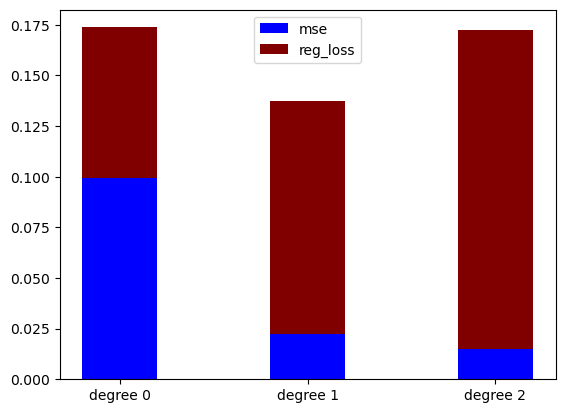

highspeed-46
loss [0.08929993095641031, 0.14045591282872535, 0.19283783022157525]
mse [0.11367880205072298, 0.036268504208055836, 0.0250985233480197]


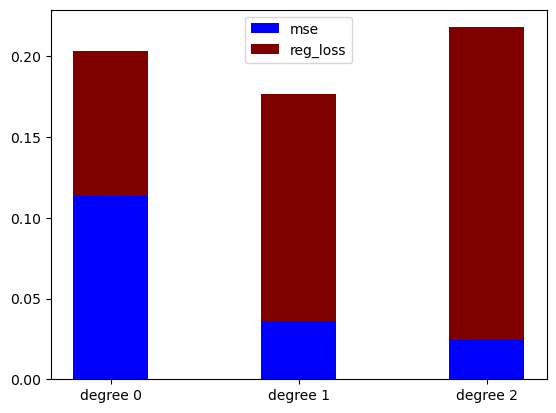

highspeed-47
loss [0.084754765256814, 0.12828854278201218, 0.17603392036236587]
mse [0.1648021554070715, 0.046316282588810535, 0.032148798682406714]


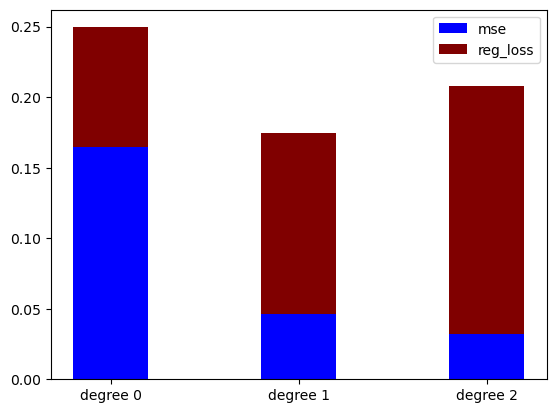

highspeed-48
loss [0.07833135128099722, 0.11961633203074236, 0.16874906120634306]
mse [0.09894625605080193, 0.02560598618287079, 0.02105425640169382]


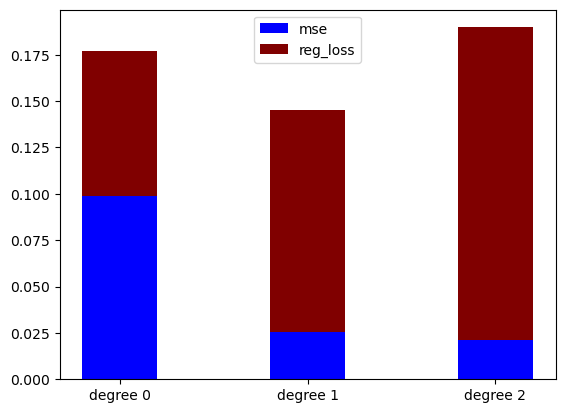

highspeed-49
loss [0.08687767512597995, 0.1373096487802223, 0.18833294870060507]
mse [0.13548189273458647, 0.04346051672016669, 0.029493697227382796]


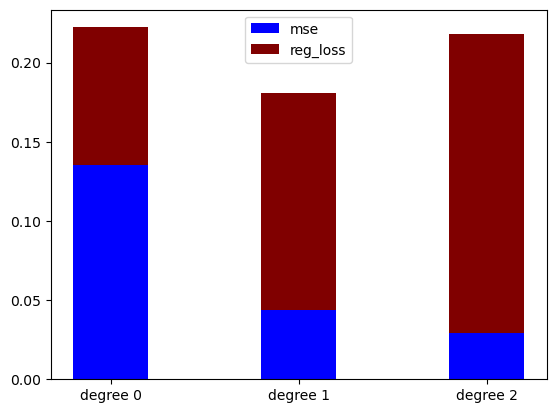

highspeed-50
loss [0.08965804921865918, 0.13741818358846009, 0.1869825027286015]
mse [0.12798024989704343, 0.03398090771826254, 0.021297297570368738]


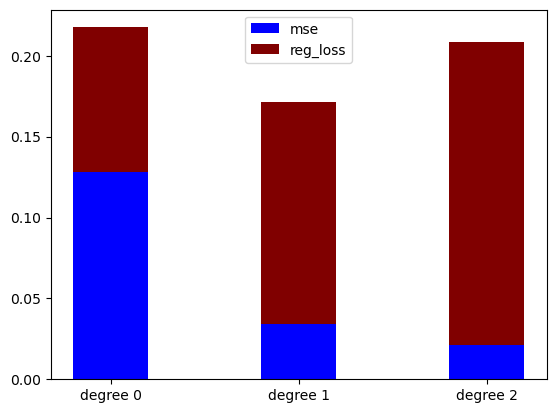

htcp-1
loss [0.07044244872010916, 0.17015198515841873, 0.23046036059469532]
mse [0.6130127374596646, 0.4799558993331922, 0.12993993637239598]


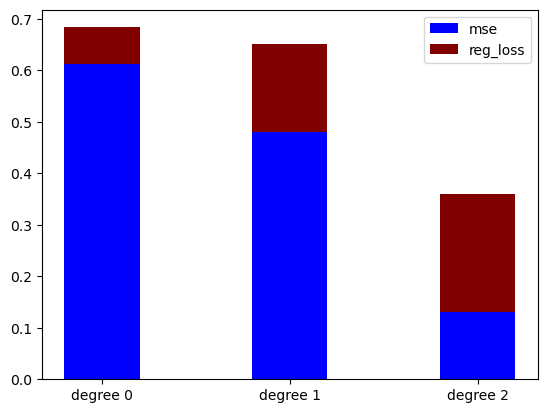

htcp-2
loss [0.06586362030197998, 0.18377779532002644, 0.23154239906231622]
mse [0.6167756655574991, 0.3930348707611551, 0.0574402774488254]


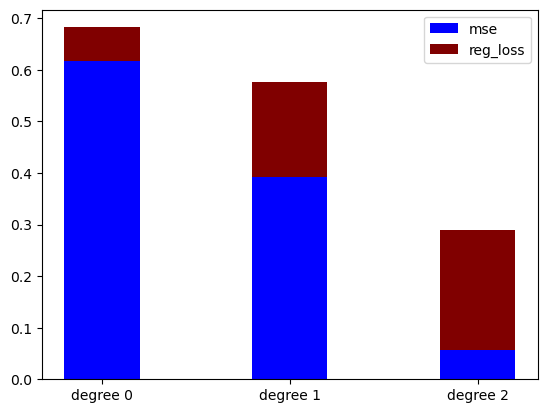

htcp-3
loss [0.06495994645526561, 0.15957371790659391, 0.2212704313908286]
mse [0.5500661013593849, 0.4426113416163432, 0.05817808855595883]


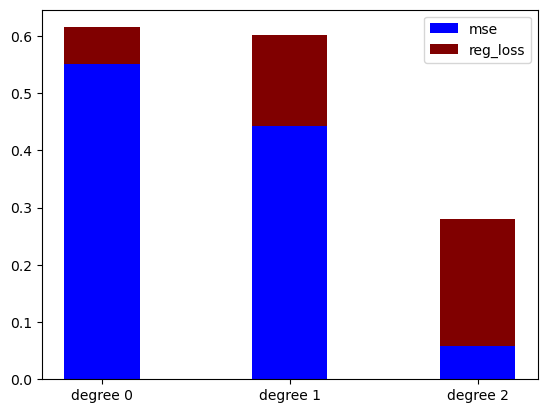

htcp-4
loss [0.10346553014580065, 0.24155764255410764, 0.32610773087620615]
mse [0.7617097362276694, 0.6334806453996165, 0.21344911203516648]


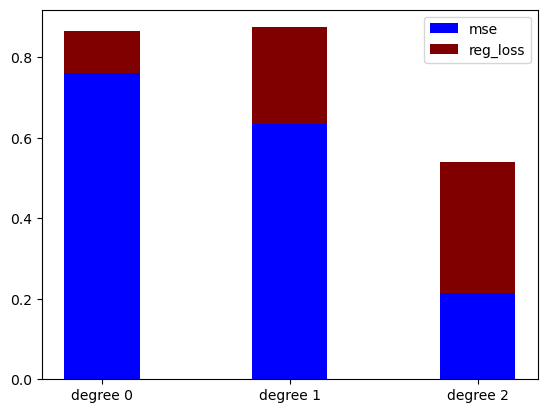

htcp-5
loss [0.08857414925381174, 0.23558648227641907, 0.31646172826678365]
mse [0.7523321681262979, 0.4534252689552654, 0.12510553468043925]


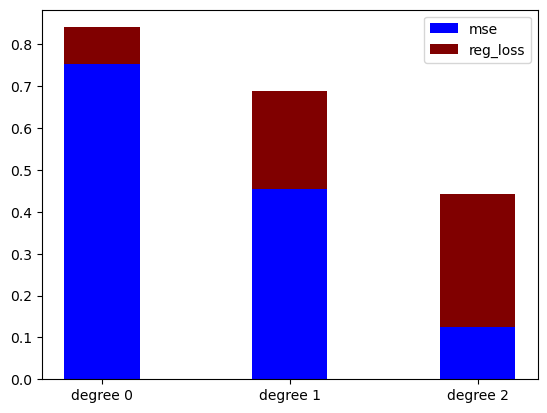

htcp-6
loss [0.07585239389222703, 0.1815114295318292, 0.2395845776269308]
mse [0.65797380663804, 0.5140491482876883, 0.20952395022248269]


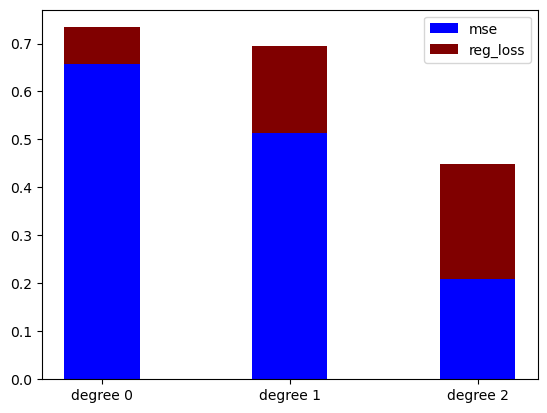

htcp-7
loss [0.07956023698771317, 0.20284857271778717, 0.2694825138467751]
mse [0.597198236718006, 0.4236799193229904, 0.07204549274346495]


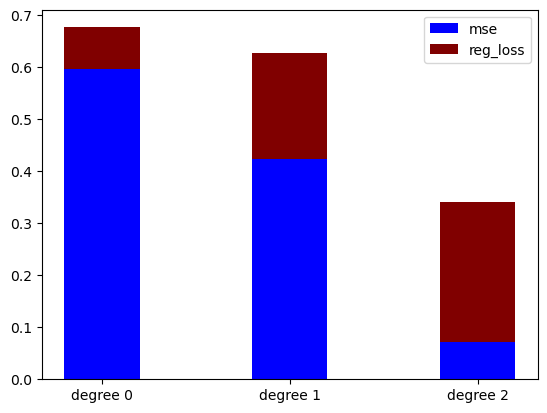

htcp-8
loss [0.09559482440826875, 0.2157480116399882, 0.29288072989299924]
mse [0.7715876968671468, 0.6953989275145038, 0.19134193341799988]


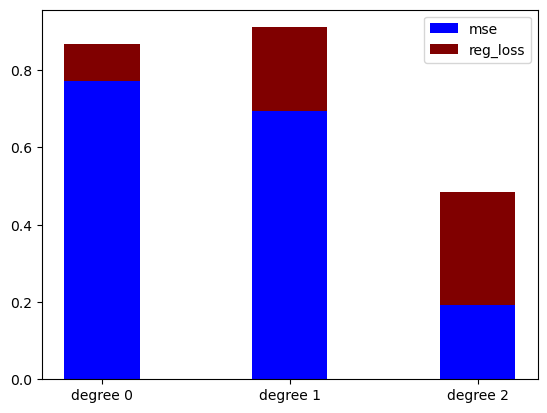

htcp-9
loss [0.08121212775853455, 0.1989690421620065, 0.27291786241580895]
mse [0.6171898425317023, 0.4264718284926278, 0.11919809557913069]


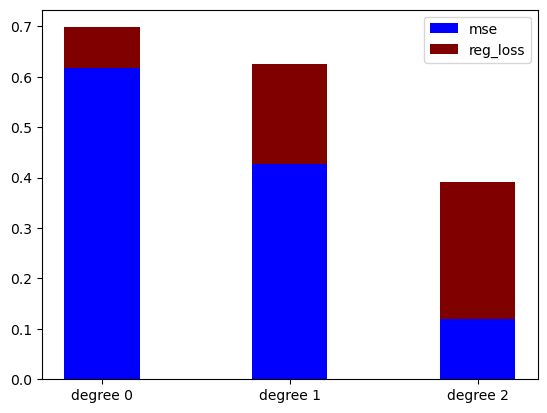

htcp-10
loss [0.12225706707541509, 0.2817199065001729, 0.38259906992918113]
mse [0.7028833514798433, 0.5561809667694082, 0.23634709751216781]


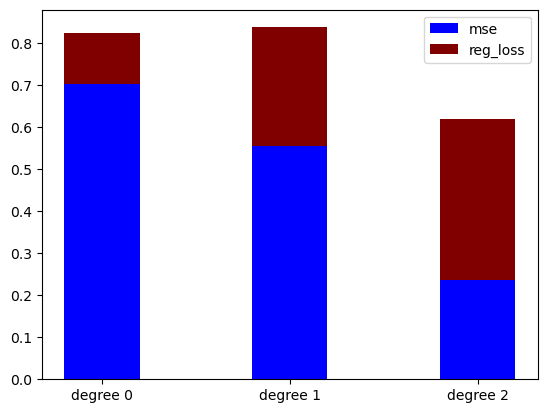

htcp-11
loss [0.08438256793682733, 0.21918324232285227, 0.30486570931671697]
mse [0.7864997304118588, 0.4316933419244325, 0.15502692638250298]


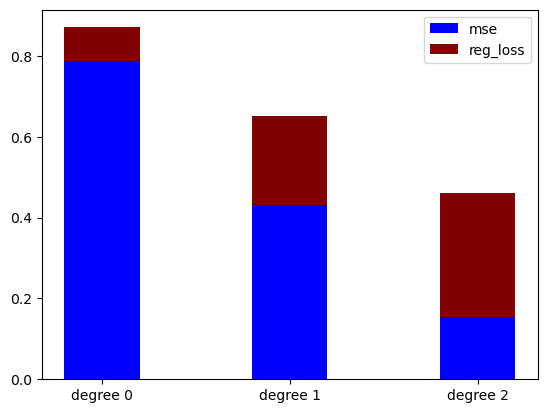

htcp-12
loss [0.07311208823111774, 0.17557985549636962, 0.24401094522041147]
mse [0.6213726603321218, 0.4976668311926684, 0.12616003990353267]


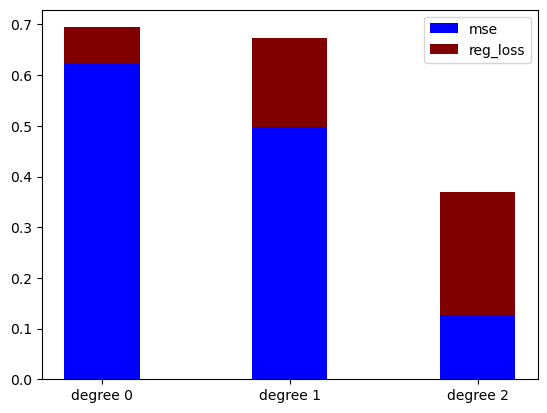

htcp-13
loss [0.07252950900876168, 0.19934674721564394, 0.25593235121058716]
mse [0.6672647116339051, 0.40108228094205206, 0.10280218182065701]


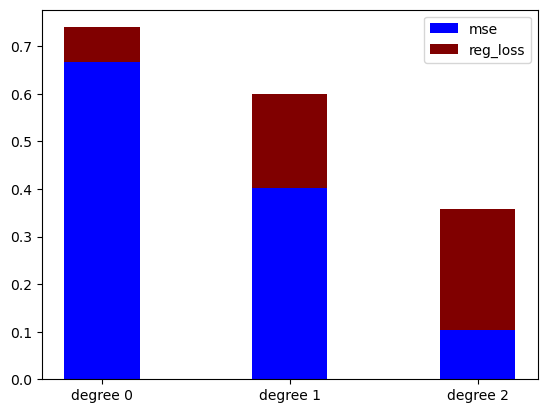

htcp-14
loss [0.09141043386919387, 0.22893249008649375, 0.3074852550793069]
mse [0.8257623382288923, 0.6009973803543389, 0.18386529633742402]


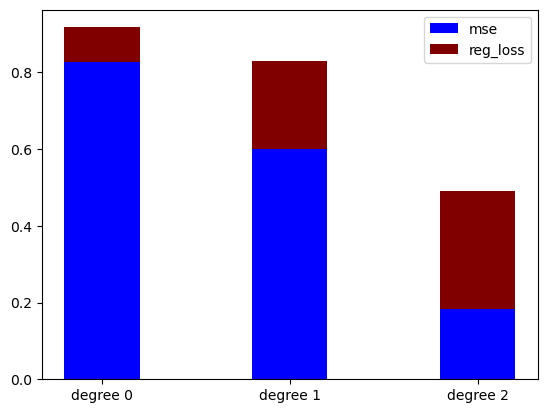

htcp-15
loss [0.05808444356119168, 0.147770262898927, 0.20075943985347244]
mse [0.518812266062756, 0.4022236367154517, 0.027577272940490543]


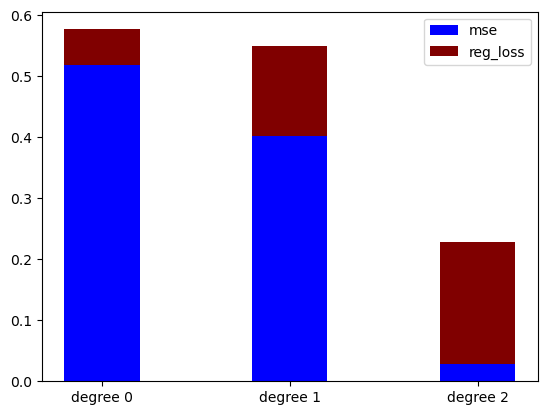

htcp-16
loss [0.06862419341105472, 0.16729971419635484, 0.2313506946606776]
mse [0.6463903797917497, 0.4949248125657683, 0.09778631895345972]


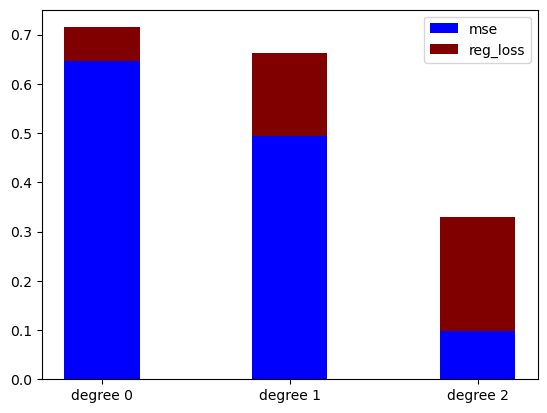

htcp-17
loss [0.06675337269160918, 0.15486172234252518, 0.20653008704357953]
mse [0.48029400255742705, 0.43183840485958025, 0.04994584943410609]


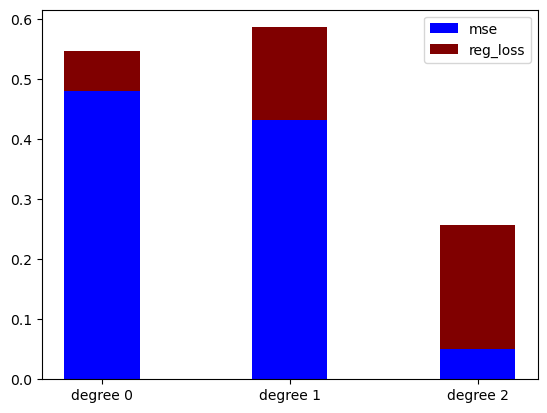

htcp-18
loss [0.07548372345332238, 0.17404781619394522, 0.23843148099837502]
mse [0.6152076050492775, 0.5329483332240883, 0.08486681168193701]


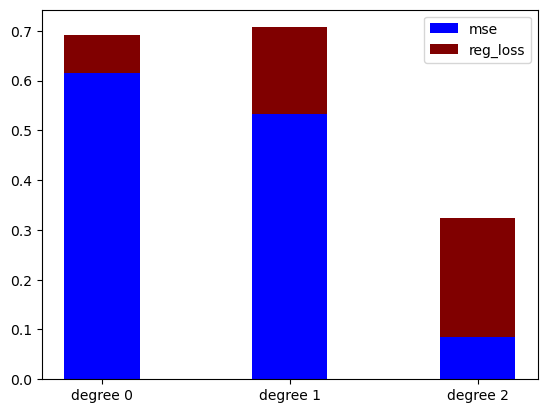

htcp-19
loss [0.07416245633308181, 0.1894766467896403, 0.24701109501251467]
mse [0.6869717651581562, 0.5078063572394875, 0.10454309452895154]


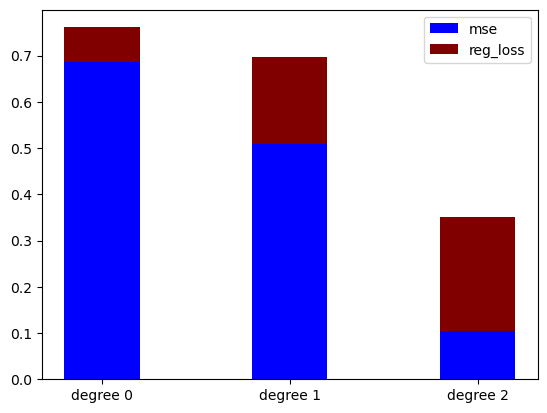

htcp-20
loss [0.08980734341589615, 0.20358404978183942, 0.2927321564451096]
mse [0.7410731601972682, 0.6437482016688801, 0.18211754069565808]


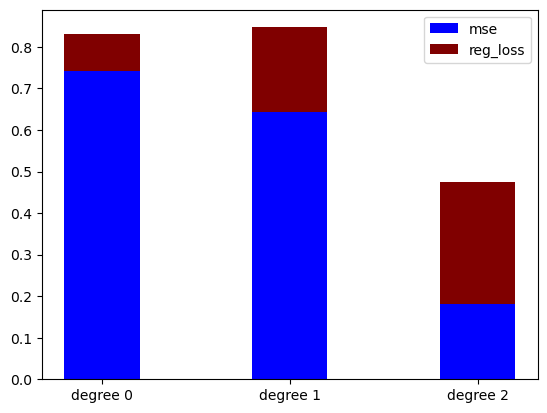

htcp-21
loss [0.10655330861609709, 0.26224519831362664, 0.3516410428226259]
mse [0.9465348231114588, 0.7321969893949587, 0.205189418542429]


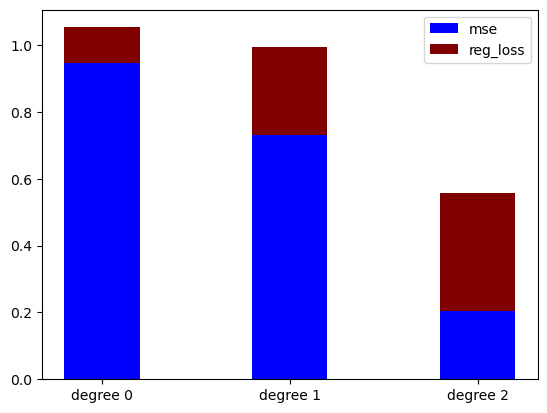

htcp-22
loss [0.09801700068585856, 0.231710380321278, 0.32182849979005795]
mse [0.7543048569822856, 0.5934824863391601, 0.19140371627378744]


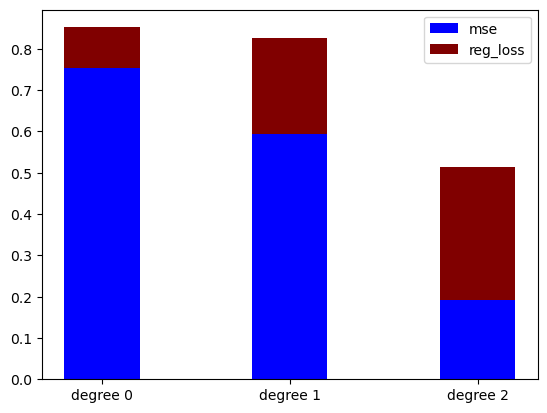

htcp-23
loss [0.06717177303862043, 0.18148299114996802, 0.2374740371121491]
mse [0.6679274771474146, 0.44530788628302925, 0.07724418063274557]


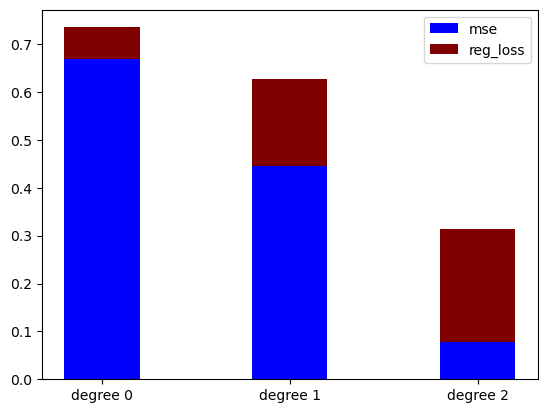

htcp-24
loss [0.0803987441109103, 0.2114043260900366, 0.2704334044860846]
mse [0.577168661523236, 0.35831703328355424, 0.13007276356115205]


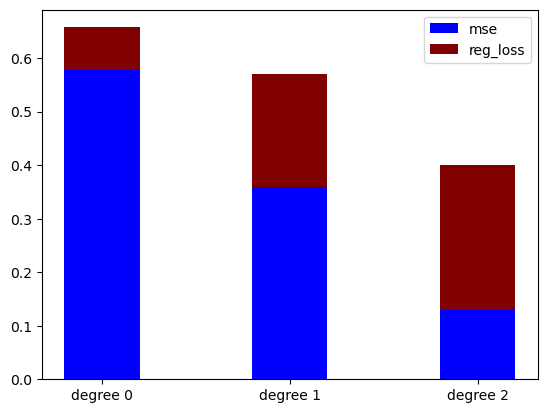

htcp-25
loss [0.027468841360501386, 0.10264152555841846, 0.13913608557790189]
mse [0.4136408810782909, 0.13366824023494958, 0.008971920736967471]


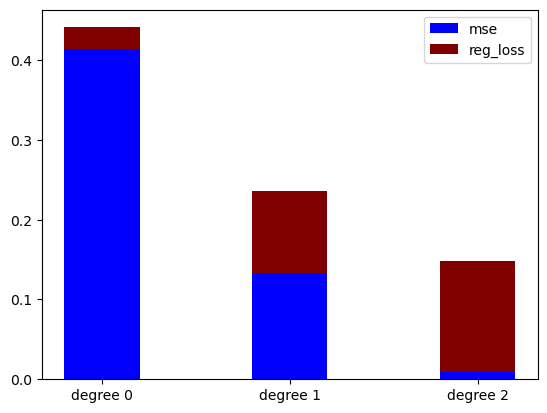

htcp-26
loss [0.014939753038772596, 0.11792062005471171, 0.1521508335279389]
mse [0.8266351497906672, 0.11885440791186894, 0.03197913635332013]


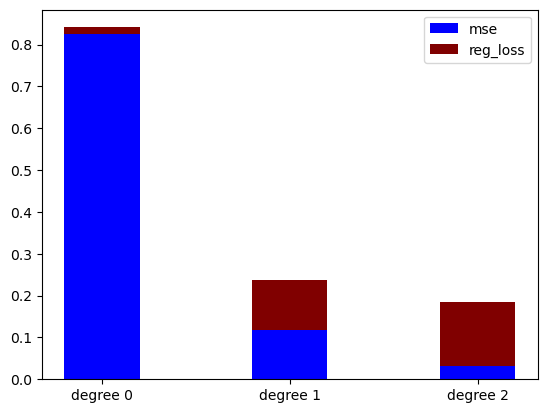

htcp-27
loss [0.0692819287185268, 0.19782357303402118, 0.24742817608309828]
mse [0.6327115328354149, 0.3482587443102552, 0.08317637600967227]


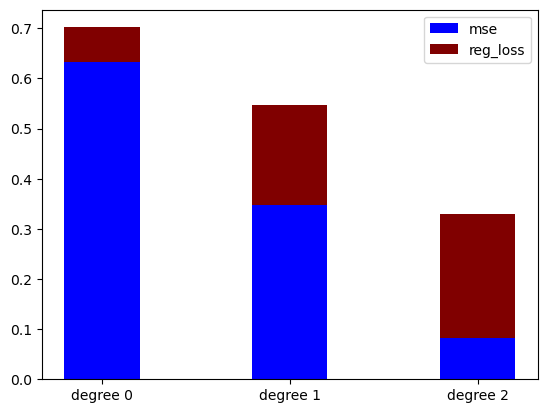

htcp-28
loss [0.06686259793654178, 0.1607816038025736, 0.23081336621258766]
mse [0.6577379081798806, 0.5017144646845555, 0.10613847870611251]


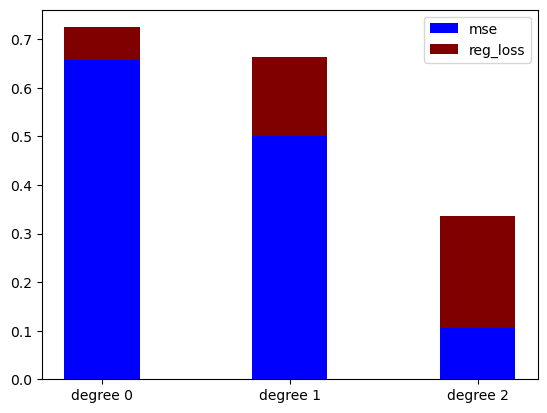

htcp-29
loss [0.1183012719846775, 0.2750702373581719, 0.3756961400793757]
mse [0.6985008976542314, 0.548982186025619, 0.2044417682757431]


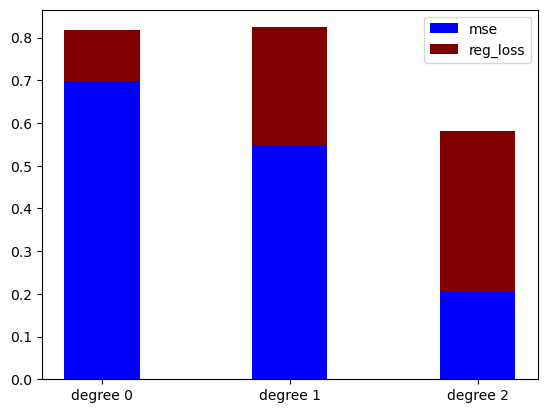

htcp-30
loss [0.07081197955606218, 0.16658468781415414, 0.23972415823446103]
mse [0.6254690855582646, 0.5257468265843684, 0.10134963590318856]


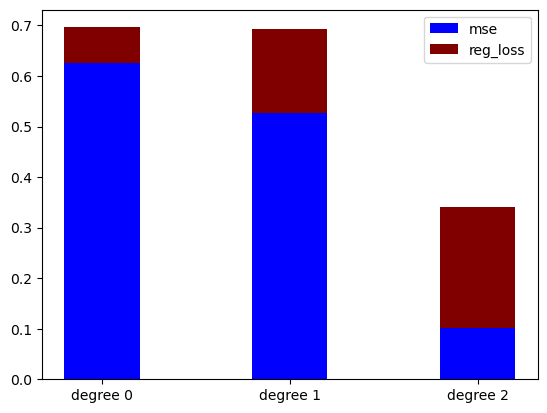

htcp-31
loss [0.07881364015490293, 0.20562313427776405, 0.2528886124656924]
mse [0.6034695488421946, 0.43587868714051503, 0.07983025722997024]


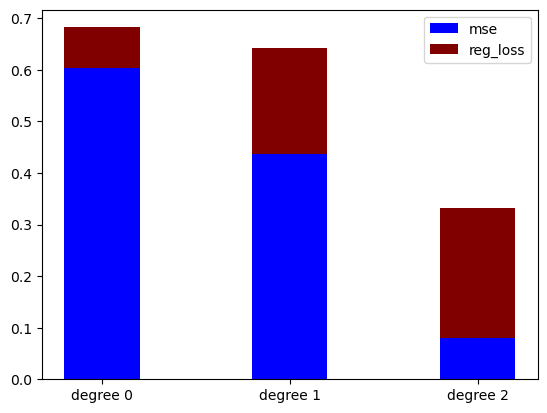

htcp-32
loss [0.060729560881287094, 0.1558349985447301, 0.203671904777314]
mse [0.5639265927079636, 0.41937351149502655, 0.08214615720325909]


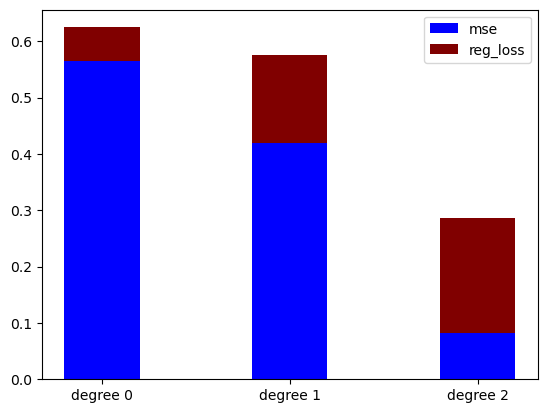

htcp-33
loss [0.09836598594235352, 0.22164948367100323, 0.3129419023185043]
mse [0.7130755184198784, 0.6179707181692019, 0.21700167450726057]


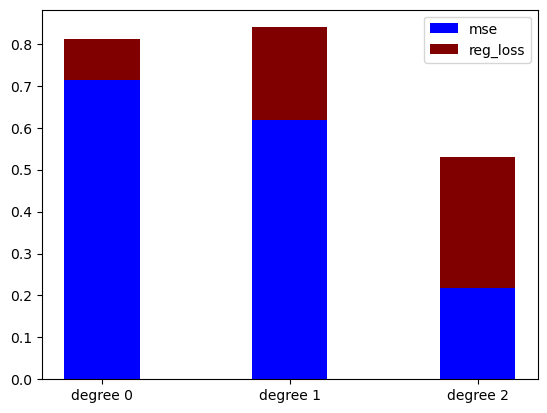

htcp-34
loss [0.0815943211375727, 0.21299369962334028, 0.27773036576977544]
mse [0.6046367097583092, 0.3927902736716727, 0.12307731617286186]


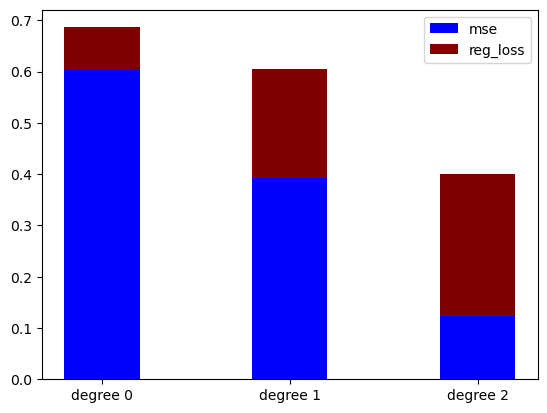

htcp-35
loss [0.0696323258372002, 0.1838681182731643, 0.23644549700945397]
mse [0.511917760876531, 0.3477646332940829, 0.05122895010269461]


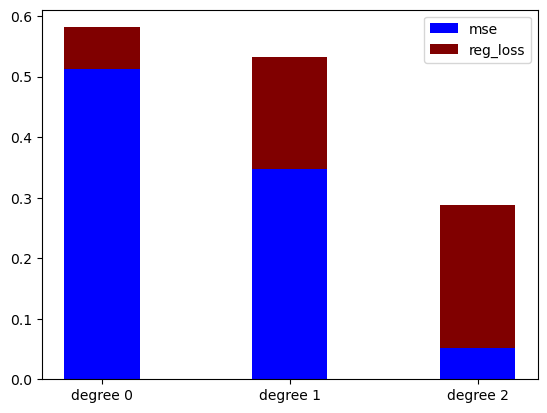

htcp-36
loss [0.055253837589919086, 0.15193583875250044, 0.1967051994760988]
mse [0.6293388444794372, 0.4587282587027462, 0.05043549213031468]


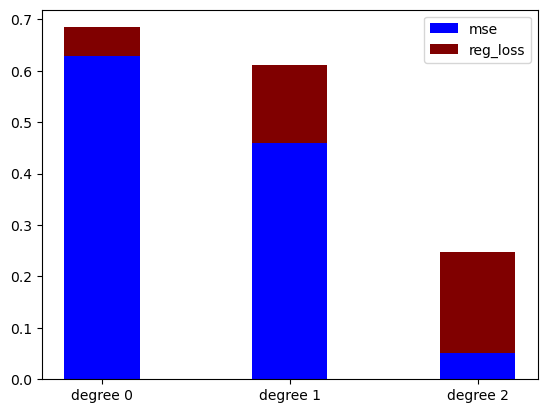

htcp-37
loss [0.06741026568696828, 0.15883150073101093, 0.2290901493852703]
mse [0.615363814371782, 0.5033853674564907, 0.1211439380890363]


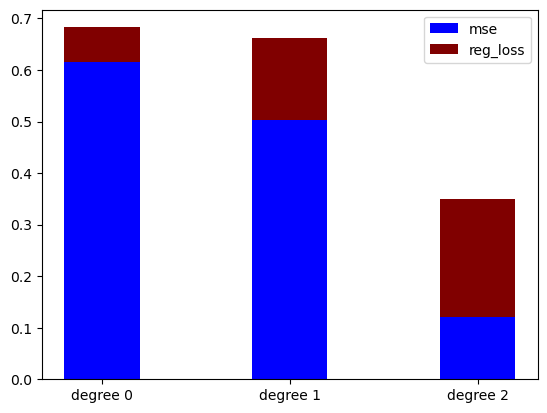

htcp-38
loss [0.07922440850366348, 0.19172352915563248, 0.2489929836192789]
mse [0.6382627066113521, 0.49470938730351843, 0.14870224881627703]


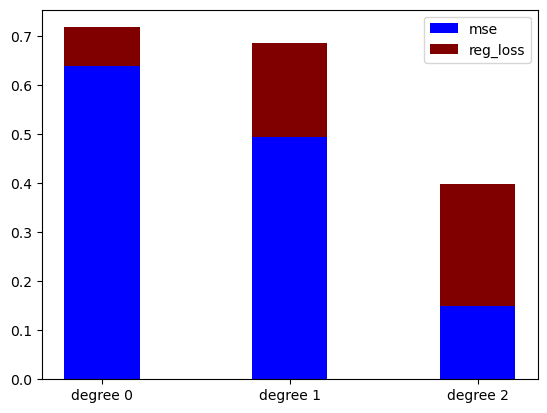

htcp-39
loss [0.0844334056296861, 0.2061650477122552, 0.28202935315550376]
mse [0.6358120708245704, 0.5023719025974737, 0.11829904296183948]


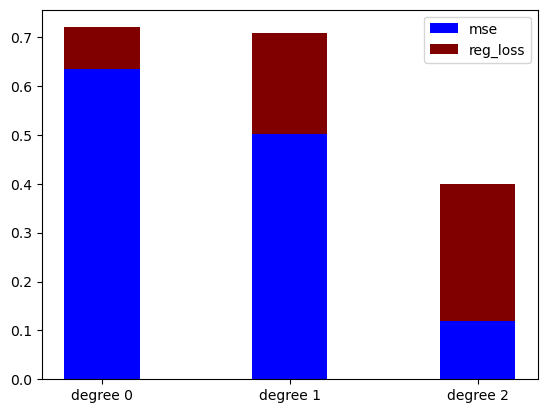

htcp-40
loss [0.0961365755300298, 0.21568407140500706, 0.2825730088121848]
mse [0.6156376526216435, 0.5626034361317022, 0.14780959685730632]


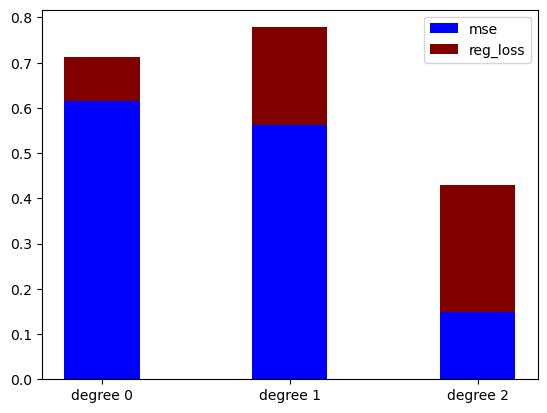

htcp-41
loss [0.12133114735396462, 0.2570842358082816, 0.375397463759082]
mse [0.886887580488301, 0.8446213038845714, 0.35754222606049757]


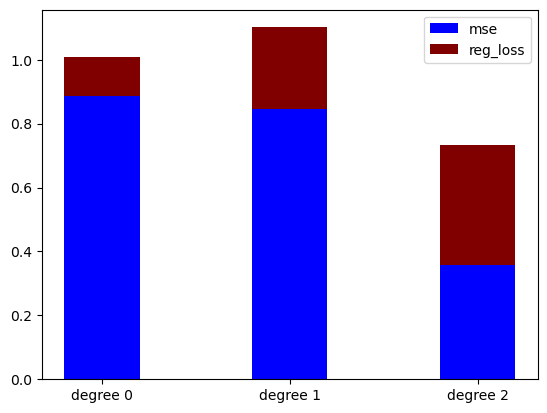

htcp-42
loss [0.07844204905381275, 0.19758313291721633, 0.27157710104941]
mse [0.6892641939152288, 0.4641944260191802, 0.1281701651201873]


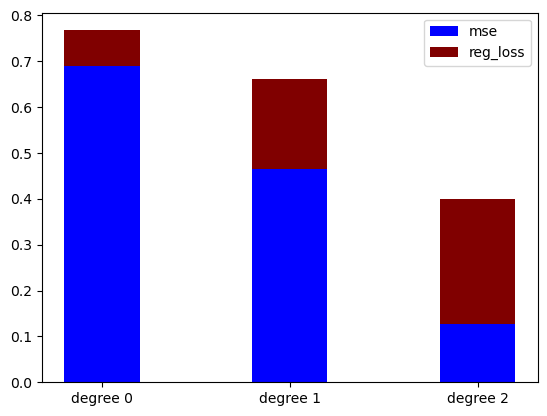

htcp-43
loss [0.06542200375265901, 0.18109102180681214, 0.22869140070995075]
mse [0.6176252778930019, 0.41403959469519636, 0.061084496162014244]


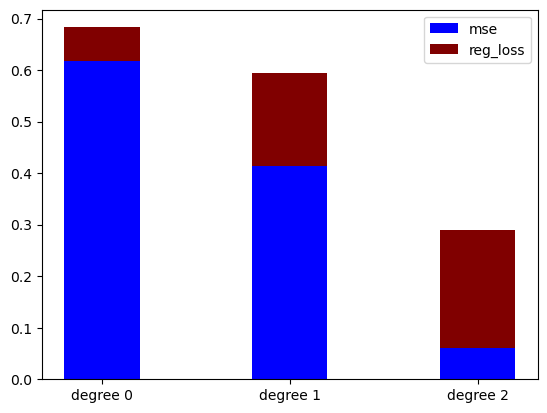

htcp-44
loss [0.08252985476979931, 0.21759304121652417, 0.2954263154552058]
mse [0.8086700656562716, 0.4688293052469327, 0.12893384314387588]


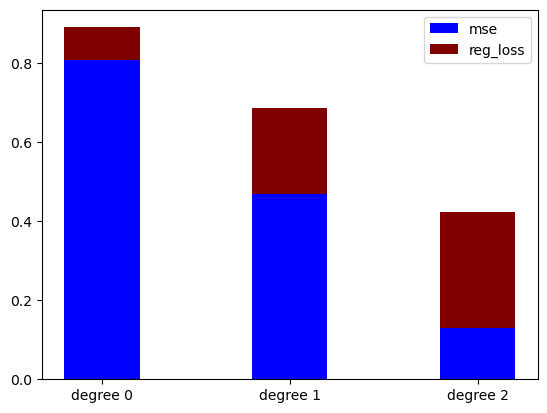

htcp-45
loss [0.09557282225292857, 0.22888290989384133, 0.2992856706719888]
mse [0.7099190183705361, 0.5564736489035489, 0.20540956950196557]


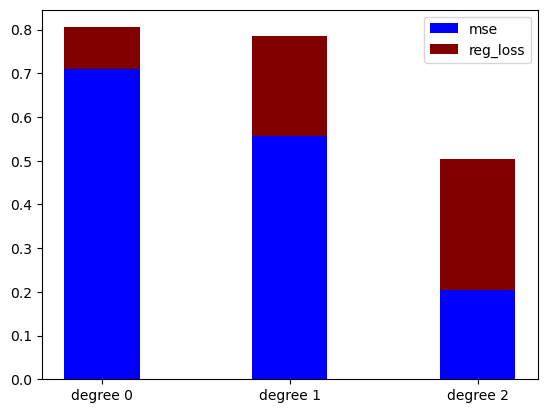

htcp-46
loss [0.06576209489138289, 0.15701328594202454, 0.2265505953628244]
mse [0.6224223580770306, 0.5096360377736319, 0.11791980679753886]


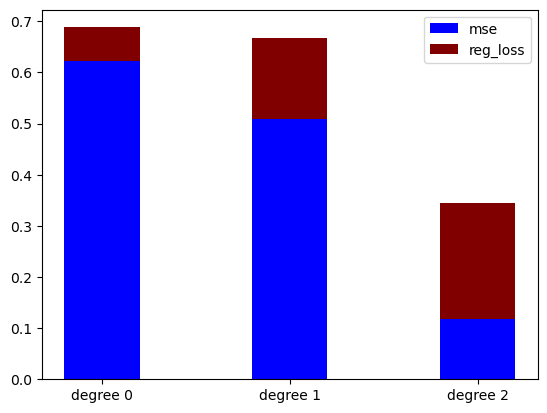

htcp-47
loss [0.07184659992265881, 0.17577467585081763, 0.24782889949699738]
mse [0.6619149794975805, 0.5061643512124819, 0.11510380555594829]


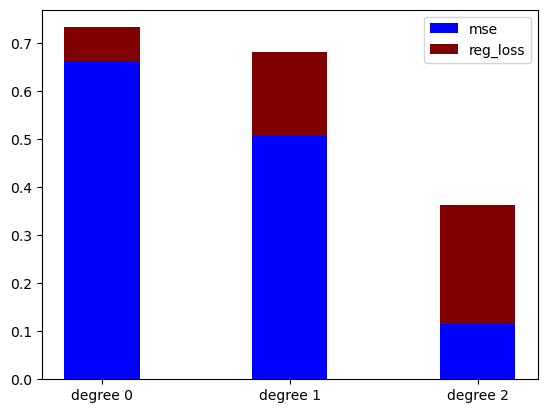

htcp-48
loss [0.08359791462578904, 0.2053261048080544, 0.2954243847897229]
mse [0.8121793524496732, 0.5717240414998999, 0.18167776748772108]


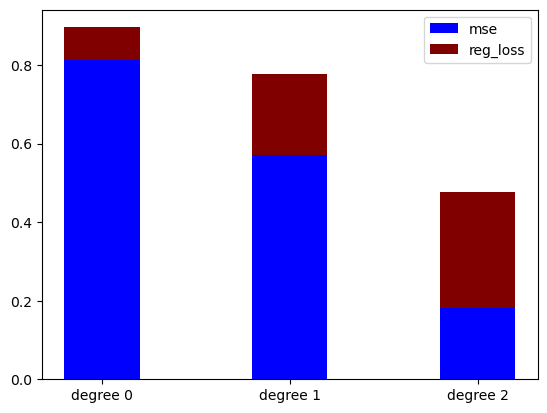

htcp-49
loss [-0.0035741405122265424, 0.10215993836567257, 0.1258313701695882]
mse [1.2289166070517579, 0.1371003234471613, 0.04742601701817476]


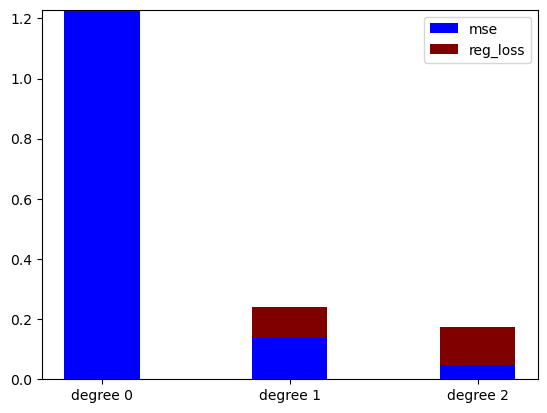

htcp-50
loss [0.11049115173697431, 0.2536750497197439, 0.35469267002197613]
mse [0.7130011027135885, 0.5740828516023293, 0.2760389996338892]


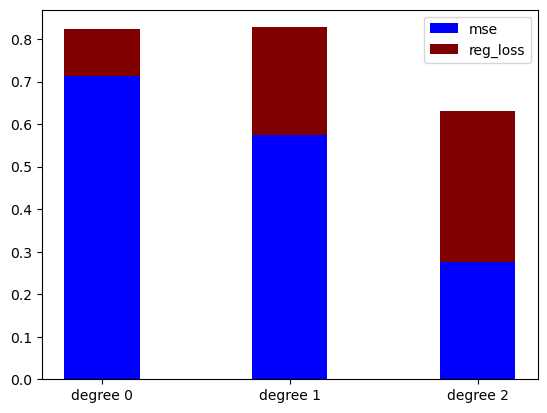

lp-1
loss [0.0789802288682712, 0.1247477555966627, 0.17529712657049643]
mse [0.10574276546791836, 0.029151069865256694, 0.02201241877219149]


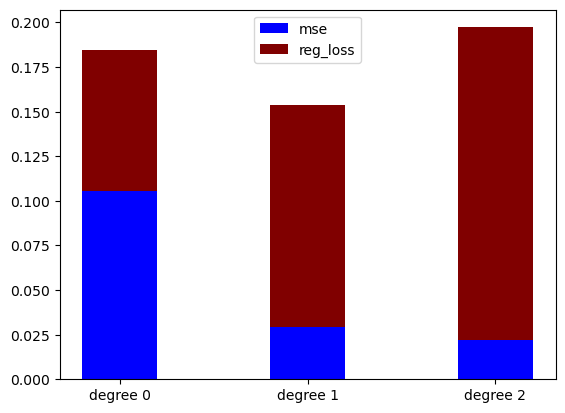

lp-2
loss [0.07983106571487943, 0.1254118835500568, 0.1724828765588051]
mse [0.10902337078299791, 0.0313642802557205, 0.019192273114577336]


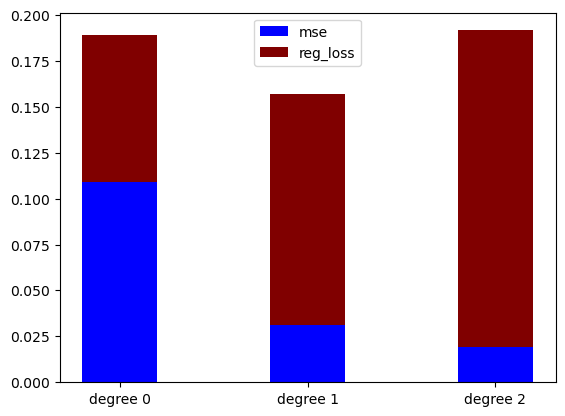

lp-3
loss [0.09417683974964004, 0.14486415724444118, 0.1964423516949333]
mse [0.20276953840494738, 0.06531428156987829, 0.04384401755485359]


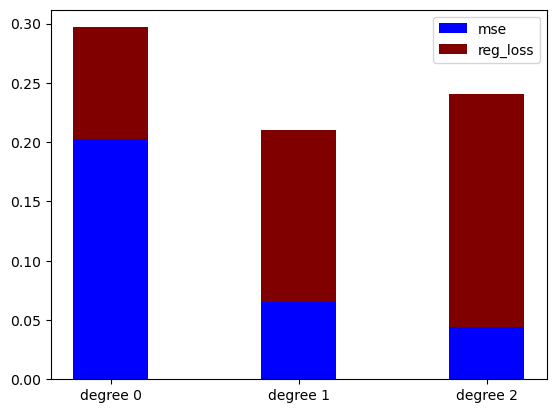

lp-4
loss [0.0793639433031474, 0.12605601241483452, 0.17775401312306238]
mse [0.11010021896201368, 0.034681912014512456, 0.027338992678289948]


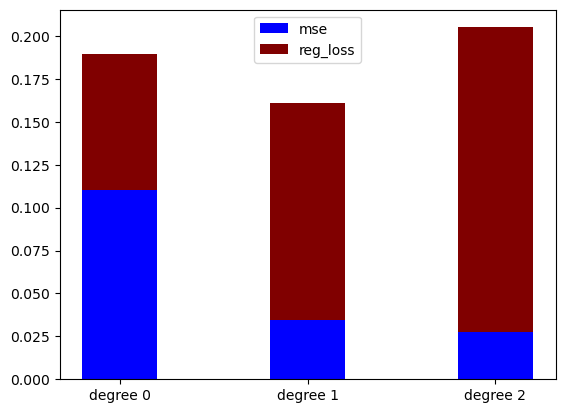

lp-5
loss [0.060394300600297816, 0.08696376089298724, 0.11607289205053561]
mse [0.09145909457813417, 0.02688558112349879, 0.01803623689267691]


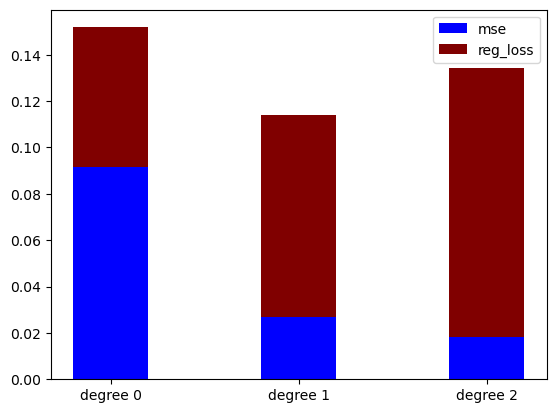

lp-6
loss [0.09172904915555445, 0.15296851255795504, 0.2221226534595378]
mse [0.08663461156558457, 0.038347545455048065, 0.036336298292506876]


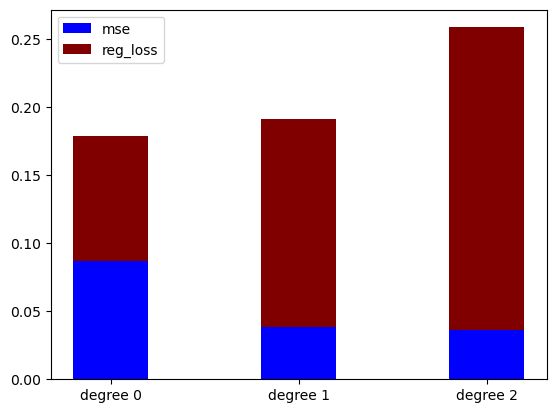

lp-7
loss [0.08387697314024989, 0.1274621507686084, 0.17526029011468594]
mse [0.14212545822811062, 0.03857177618498058, 0.02529384738833927]


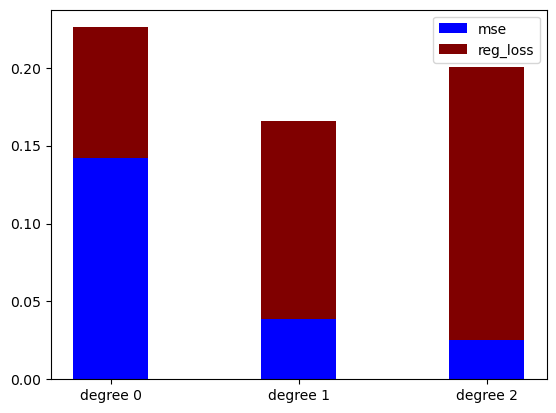

lp-8
loss [0.07437290927993509, 0.11879904674205394, 0.1724847626976805]
mse [0.09405251342290925, 0.02678547455568944, 0.024929930498522965]


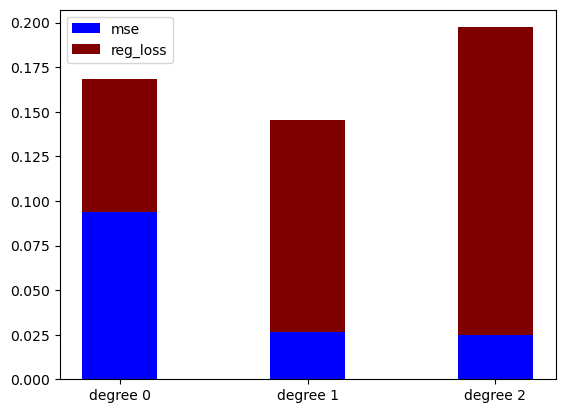

lp-9
loss [0.08011545980063178, 0.1285490127154116, 0.1810517603826512]
mse [0.1046049537630934, 0.03671595254622792, 0.029322039144397297]


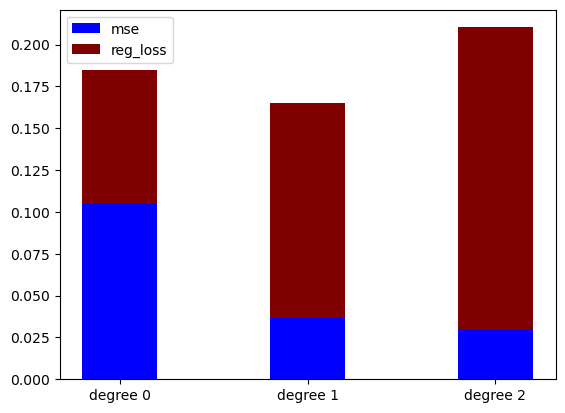

lp-10
loss [0.08757403985086884, 0.12809998070835005, 0.17932134165307448]
mse [0.22294458998219902, 0.05858964139139399, 0.044587987549028825]


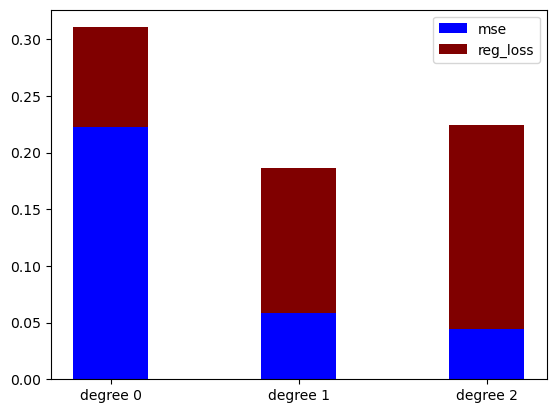

lp-11
loss [0.0914122987981219, 0.13540401079764586, 0.17753634929599968]
mse [0.3237261527519456, 0.12889738972415438, 0.08344819951392515]


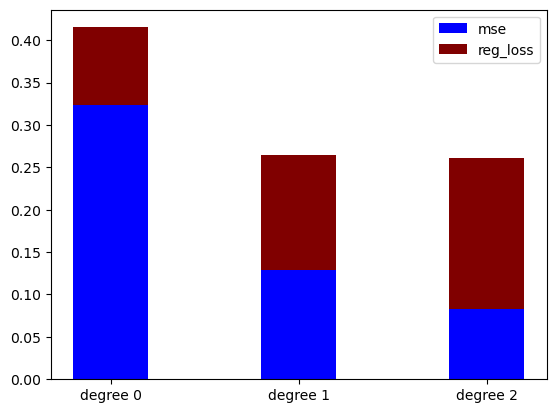

lp-12
loss [0.08225142390990382, 0.12449839267730452, 0.17069786006742196]
mse [0.14156721562354205, 0.037782072046255125, 0.026749589255445502]


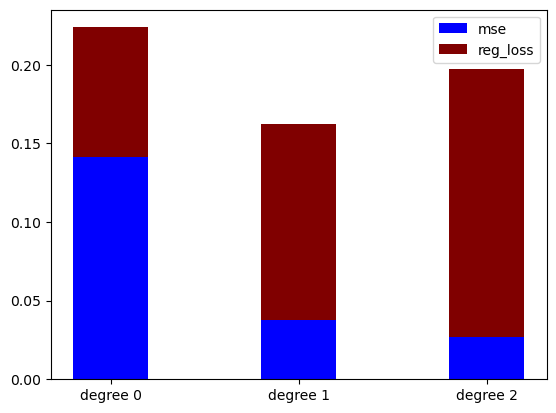

lp-13
loss [0.05896362893781183, 0.07826291708030281, 0.1054234079484588]
mse [0.07610858156130264, 0.007583063478099902, 0.003843740576311559]


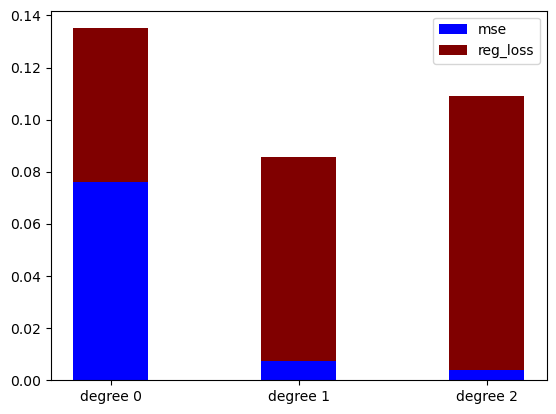

lp-14
loss [0.08303985797343559, 0.133690856620169, 0.18104971013763216]
mse [0.12110379080569708, 0.05332361499424928, 0.03674055178522508]


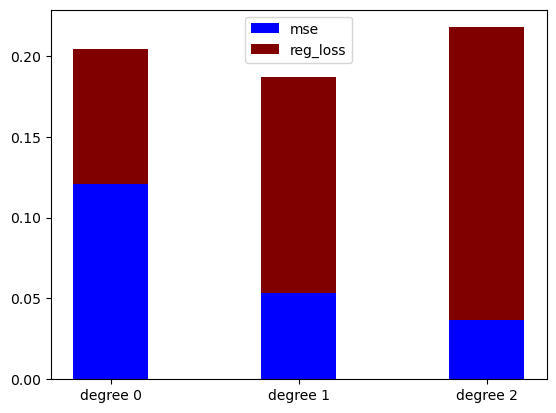

lp-15
loss [0.09175861329983107, 0.14314981519980324, 0.19984853391792157]
mse [0.15527016407155697, 0.05049616774683645, 0.03880198229306854]


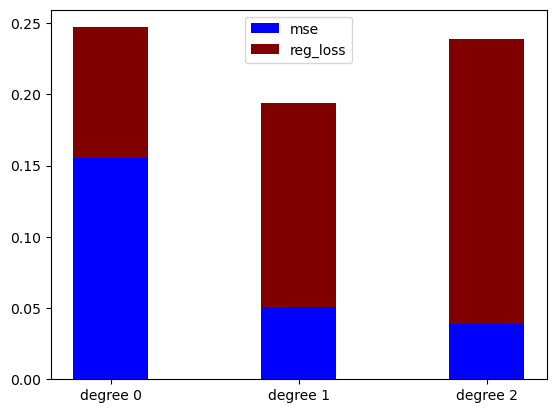

lp-16
loss [0.061980793643866355, 0.07926227895693944, 0.10040840688393621]
mse [0.1105083015629464, 0.015378599305002046, 0.0028162727746409654]


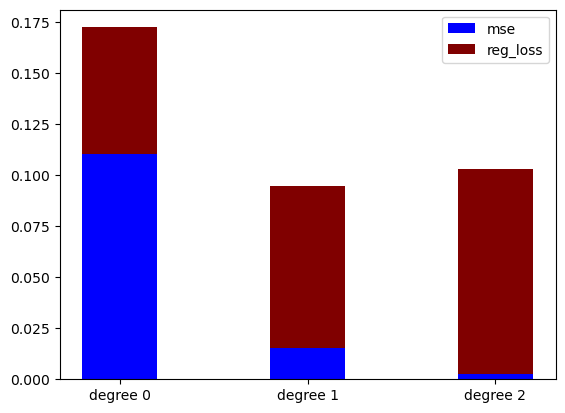

lp-17
loss [0.08357665482010929, 0.13589243258115266, 0.1937122554487578]
mse [0.11919338969786898, 0.04498839356875093, 0.038148811683322154]


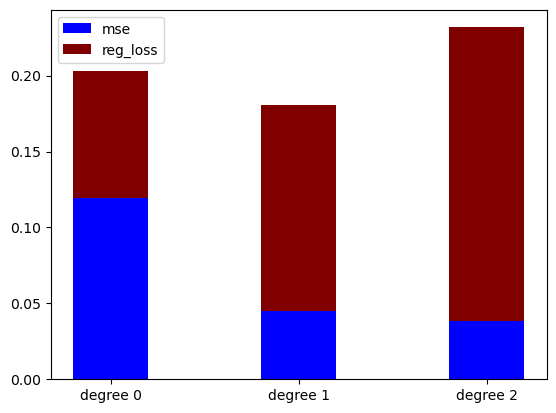

lp-18
loss [0.09710759146981118, 0.15002174204925572, 0.20112612423490708]
mse [0.14653823858119344, 0.054436682072812055, 0.03666207216905376]


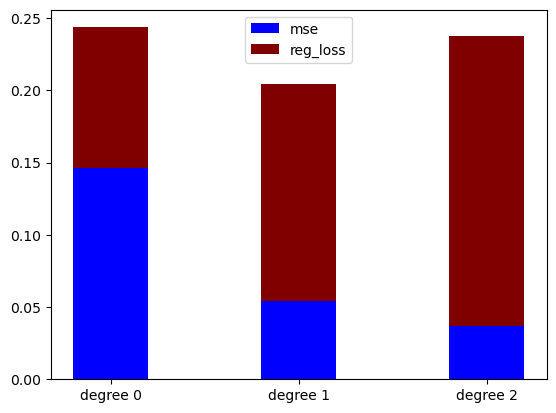

lp-19
loss [0.08332499569880443, 0.13579526717356055, 0.1923780251769875]
mse [0.11746359659057168, 0.04170399462918268, 0.03507685894563981]


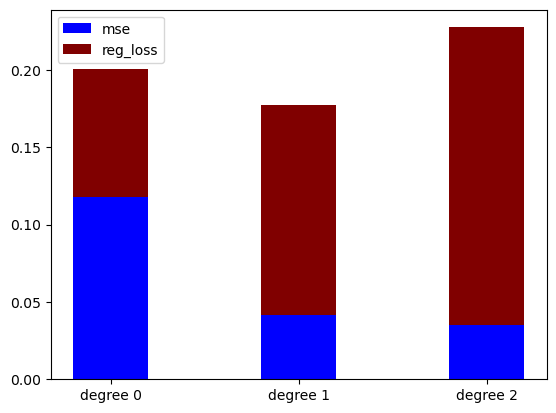

lp-20
loss [0.06721362329819279, 0.10703817516062791, 0.15357028744752643]
mse [0.07827569271447002, 0.017975603962525996, 0.015532559789910345]


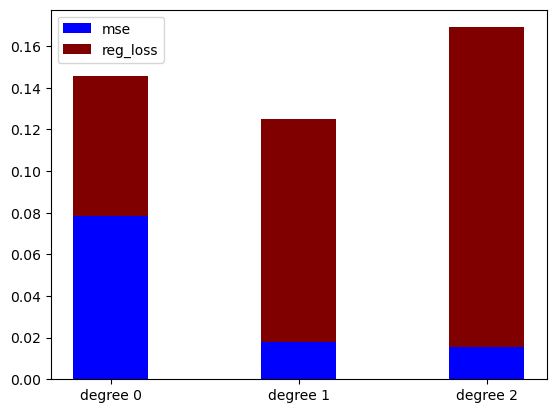

lp-21
loss [0.07051352954876963, 0.10750851427224209, 0.1468171455878661]
mse [0.08562411047813707, 0.018663581500682595, 0.011619960938736542]


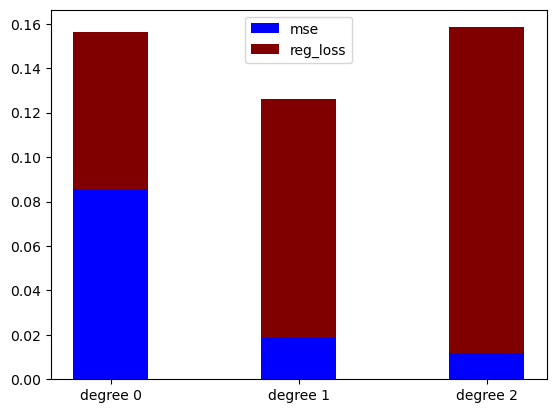

lp-22
loss [0.07302640797468994, 0.111155703565735, 0.15875497319918483]
mse [0.0812083746335236, 0.01652514683482212, 0.014017667143676532]


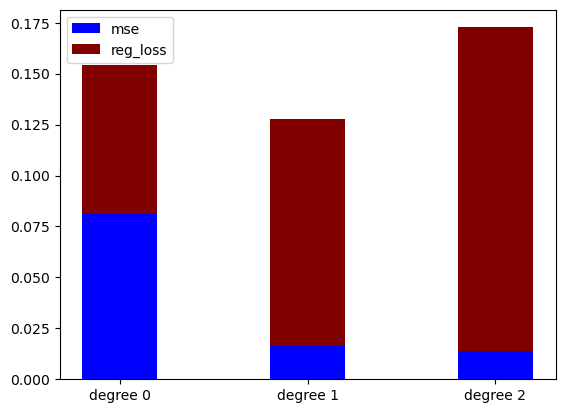

lp-23
loss [0.060162945987444906, 0.08958254421203392, 0.1274438356884311]
mse [0.06734298583305888, 0.009301692549588476, 0.007564508863446539]


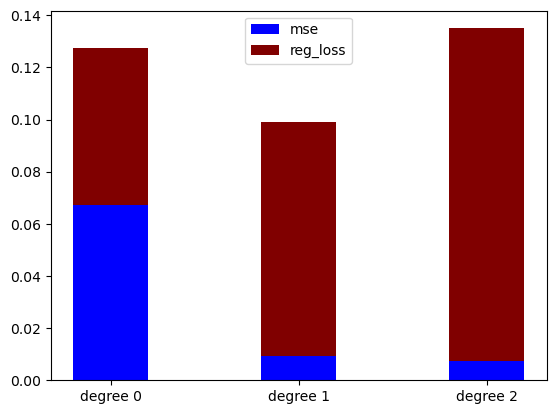

lp-24
loss [0.06610650948409531, 0.09328752127121906, 0.12376621305420628]
mse [0.14384177844986584, 0.03447500560845903, 0.01869208507362381]


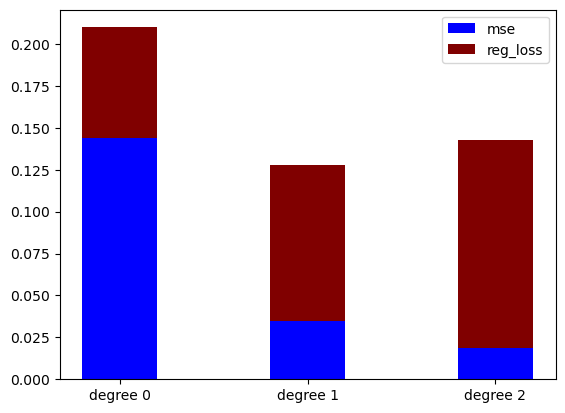

lp-25
loss [0.07764406921027547, 0.12182775790432868, 0.17042878524477137]
mse [0.09746857399219101, 0.02694402448964473, 0.020585721479576085]


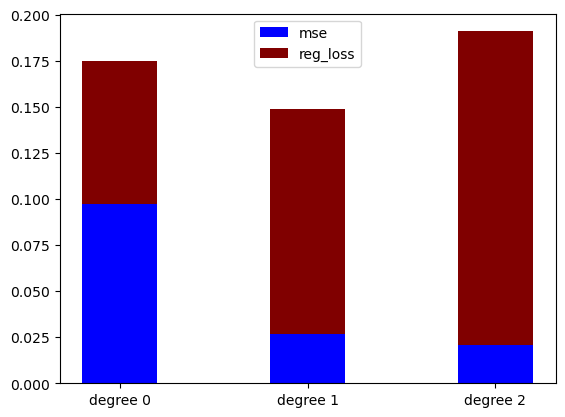

lp-26
loss [0.09766094206442605, 0.15180641732071903, 0.2109583245415676]
mse [0.16463815711988192, 0.05713919708506748, 0.04515569991063075]


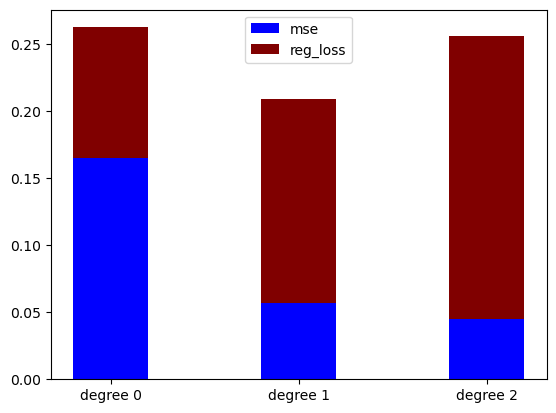

lp-27
loss [0.0839463387857009, 0.12477243034605033, 0.165372133541252]
mse [0.210516722262807, 0.06299508940185783, 0.033439039014525274]


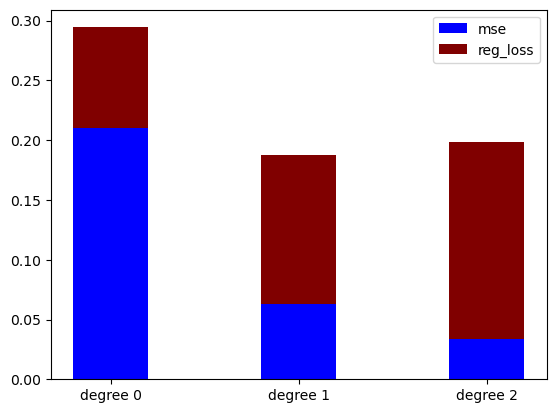

lp-28
loss [0.07586259658166458, 0.12004611376745511, 0.1693831284997315]
mse [0.09513463122093908, 0.02276561709948556, 0.017704779907211407]


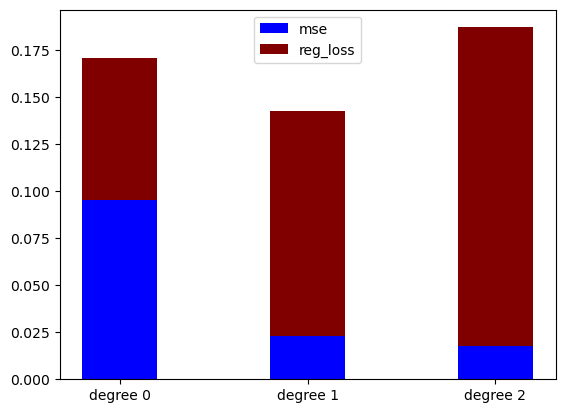

lp-29
loss [0.08890243579298104, 0.14021714697874385, 0.19250693007794367]
mse [0.11231673958880792, 0.03505666546328423, 0.025353709016068385]


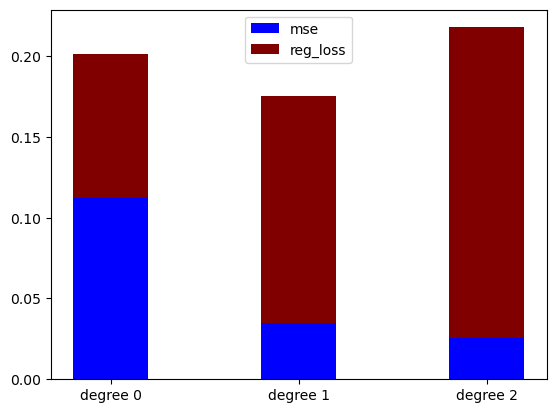

lp-30
loss [0.09280577867408746, 0.14291156756533183, 0.19474273349843754]
mse [0.16499741348648198, 0.060024236094059644, 0.0403345616275045]


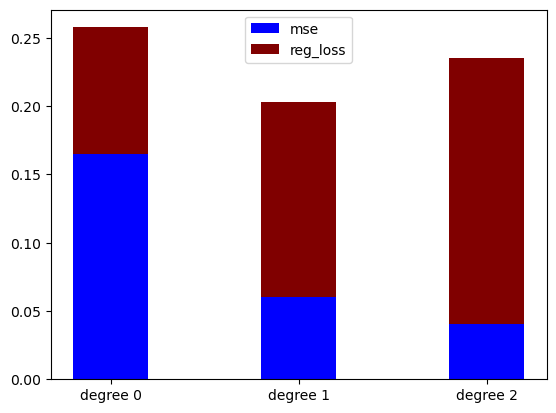

lp-31
loss [0.10190371011783934, 0.1575034014667753, 0.21079726778582186]
mse [0.33116253079433455, 0.15661955174782782, 0.11294662726308312]


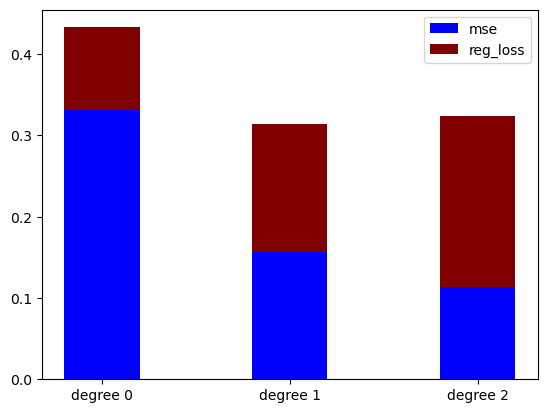

lp-32
loss [0.0759576221984183, 0.1118675523010853, 0.15280417604710883]
mse [0.10739466266295633, 0.0237502715199412, 0.014277885720378898]


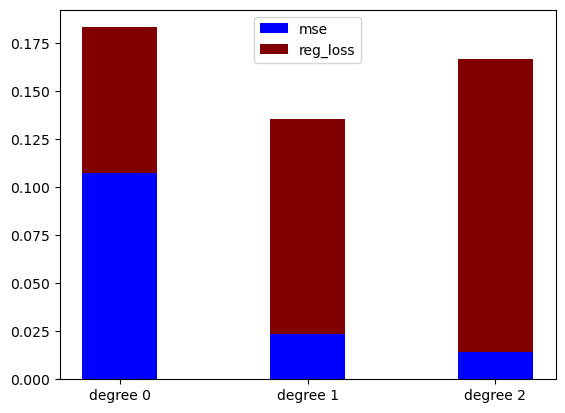

lp-33
loss [0.10240586782341582, 0.16551366325767064, 0.2252270453466863]
mse [0.14901752587829148, 0.06353406621194908, 0.04392238442198327]


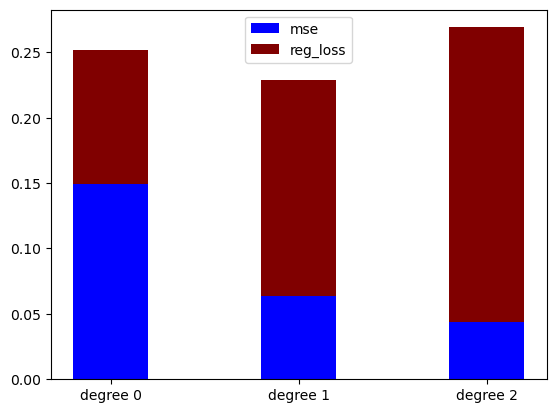

lp-34
loss [0.07813898215510723, 0.12336748996187011, 0.16501733342186575]
mse [0.14823922029380798, 0.05661813813416082, 0.03311647272722526]


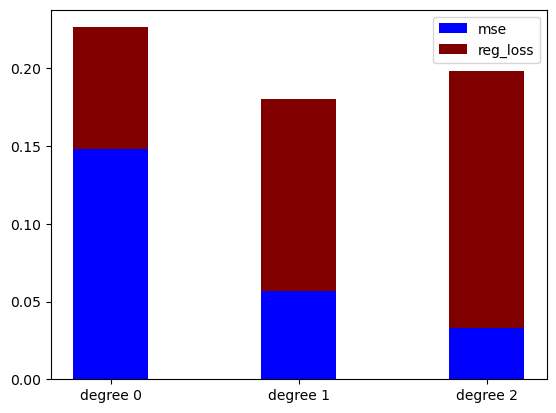

lp-35
loss [0.0647545176124295, 0.10249908966338556, 0.15117070593136098]
mse [0.052072953050230776, 0.015173906287480027, 0.01492528151777487]


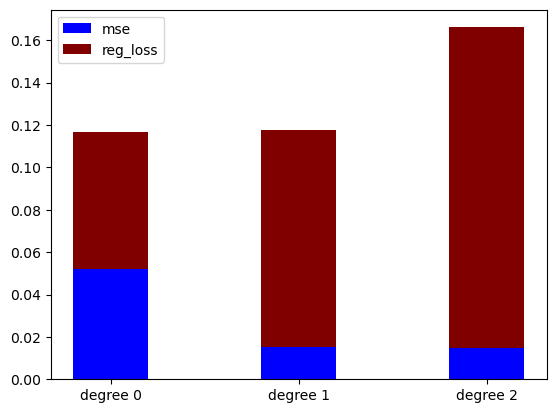

lp-36
loss [0.07942671255279438, 0.12204474624188372, 0.16192959472833673]
mse [0.11392602177310501, 0.03759507212232531, 0.019977979259784638]


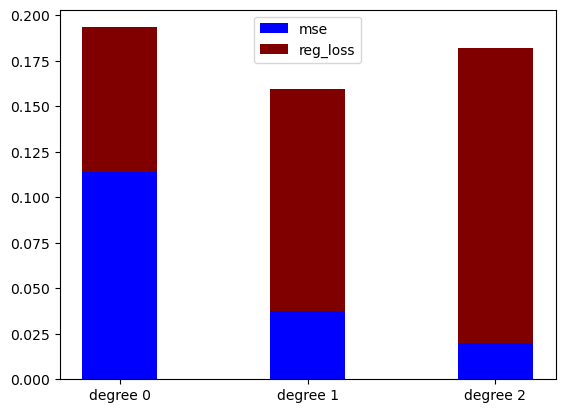

lp-37
loss [0.0768781509937145, 0.10649059507492838, 0.13515052986196724]
mse [0.12230647793223837, 0.025575205521809165, 0.008970918489015673]


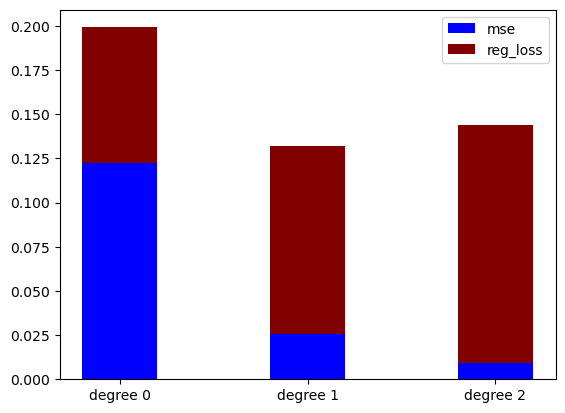

lp-38
loss [0.06667071792277042, 0.09673237300430265, 0.12484425750277812]
mse [0.1713406530092111, 0.06000138094311864, 0.0269518112422933]


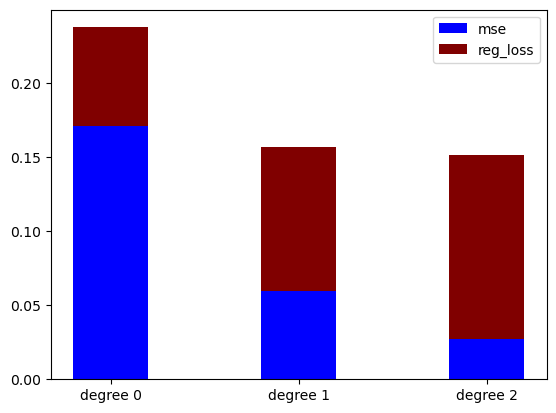

lp-39
loss [0.07343196386353072, 0.1078828313900192, 0.14540772412452416]
mse [0.1083463525466102, 0.029322764138290158, 0.018541059454116514]


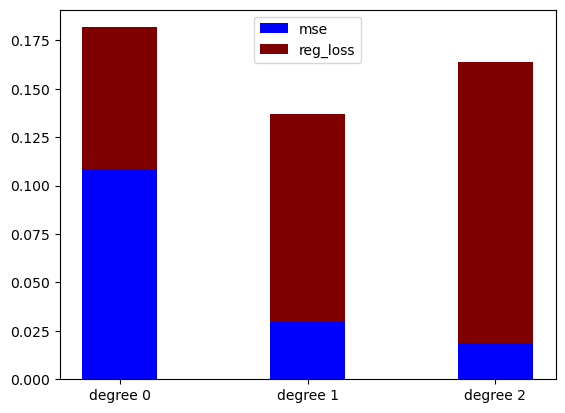

lp-40
loss [0.06351053906591908, 0.09016231495292115, 0.1182357086585991]
mse [0.14441440989889734, 0.037769009904316496, 0.018378180009955475]


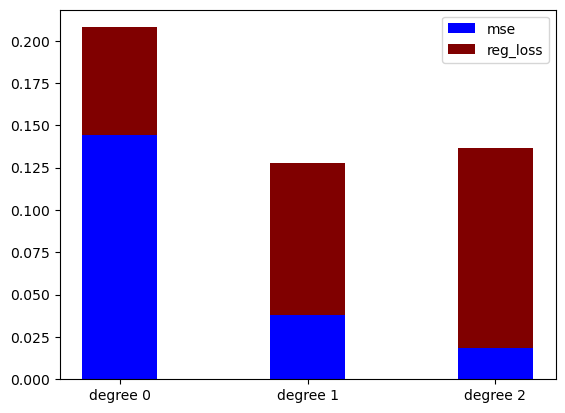

lp-41
loss [0.0766321404815353, 0.1251558959380216, 0.1795751064107548]
mse [0.09248708534286129, 0.03193481908277083, 0.02807196042688739]


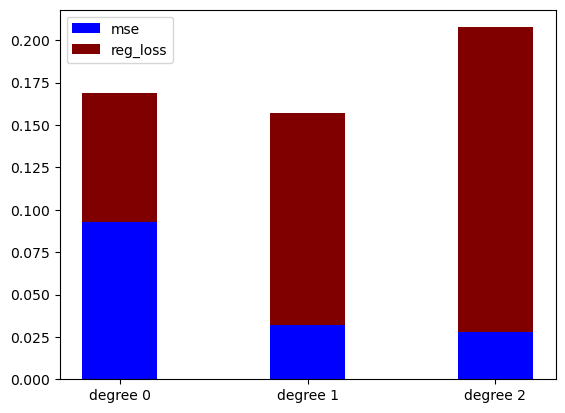

lp-42
loss [0.08347460878994267, 0.12668759326072743, 0.17318793313151223]
mse [0.09609002067431478, 0.027884037910992122, 0.019638560357300213]


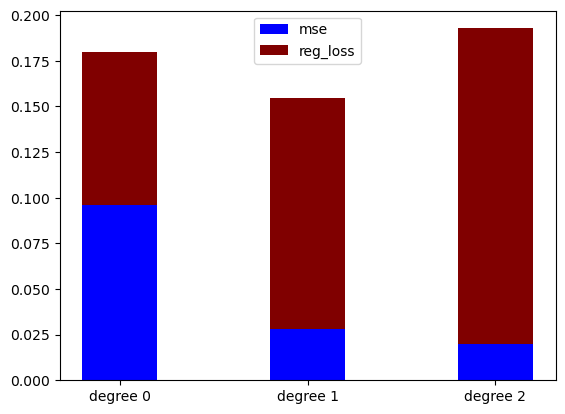

lp-43
loss [0.08731154080059701, 0.13177485829821475, 0.17727812795001685]
mse [0.14758247378968845, 0.04206142084264484, 0.025431504569918852]


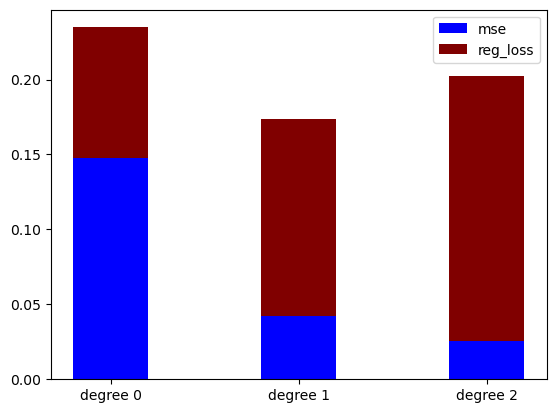

lp-44
loss [0.09928888673684112, 0.16046119390759273, 0.2164308100038479]
mse [0.20431088082621715, 0.09462853327895515, 0.06552274704397826]


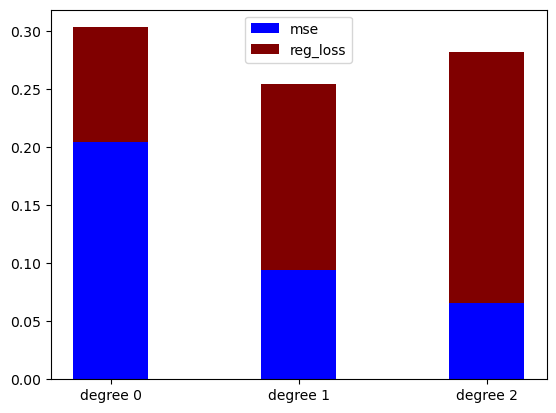

lp-45
loss [0.04927585589661976, 0.05628080305371546, 0.08371193582129927]
mse [0.08675238402999384, 0.00700694897007411, 0.006993008228586]


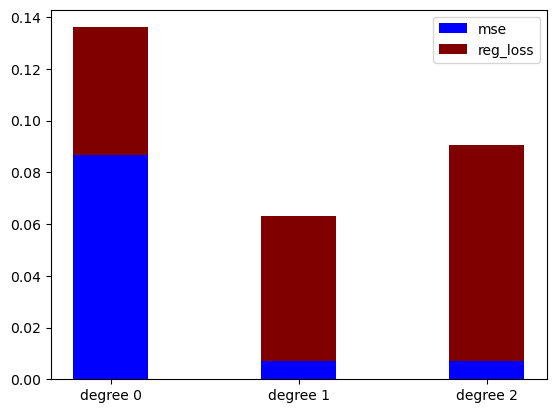

lp-46
loss [0.08408680845099732, 0.14200272658882765, 0.18853730386281098]
mse [0.11140226797870781, 0.07556139235837855, 0.05092887469717887]


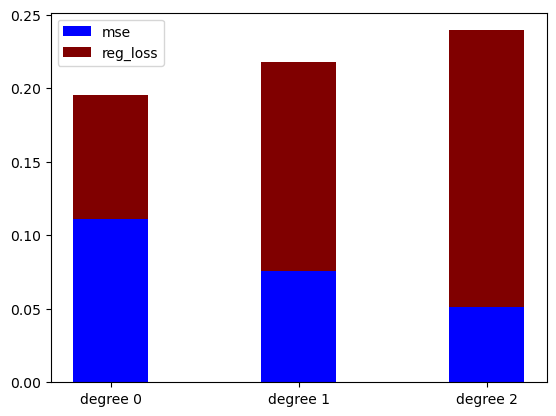

lp-47
loss [0.08916565929408196, 0.13842601462650087, 0.19288216951107043]
mse [0.1277233244405622, 0.033366056005530394, 0.024414113986079747]


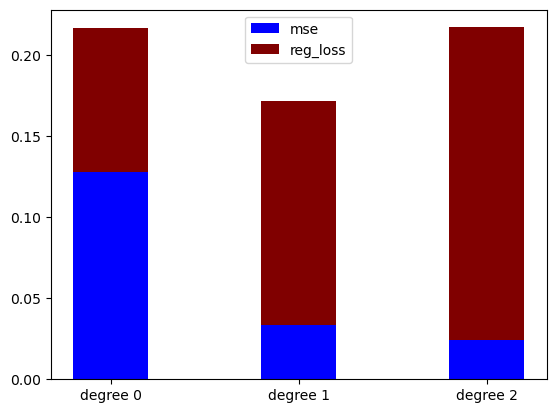

lp-48
loss [0.07015082161142576, 0.1058361070699963, 0.15024162188344625]
mse [0.06774704700408517, 0.0164761130640602, 0.013978633503951206]


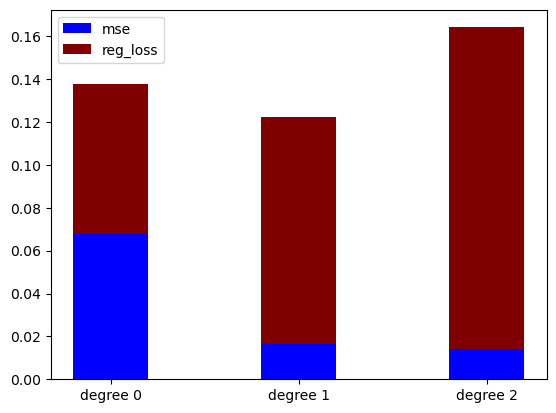

lp-49
loss [0.08349408625619562, 0.13925785769673601, 0.20060194472791615]
mse [0.1138519060877948, 0.05319993072273272, 0.04958025566855643]


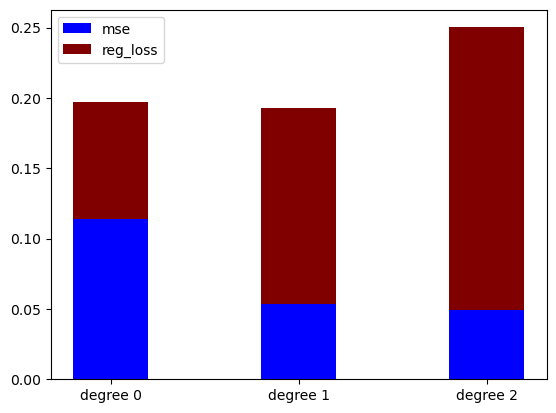

lp-50
loss [0.08039523596854337, 0.12424403883038178, 0.17514363950152526]
mse [0.09577668499570319, 0.024075934115205727, 0.01964268798143848]


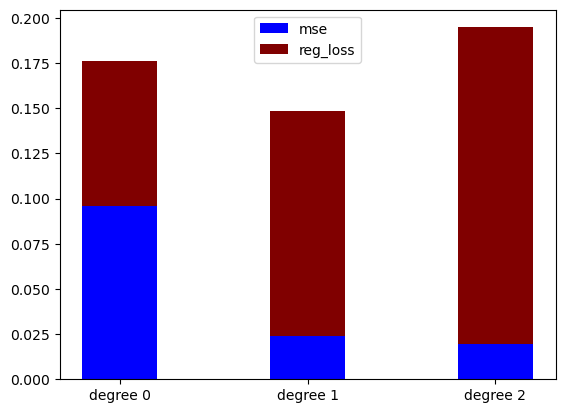

nv-1
loss [0.13486422513683546, -0.023756739043331677, -0.16669321033720488]
mse [3.7240662942407194, 0.7819054557085763, 0.44395931106499975]


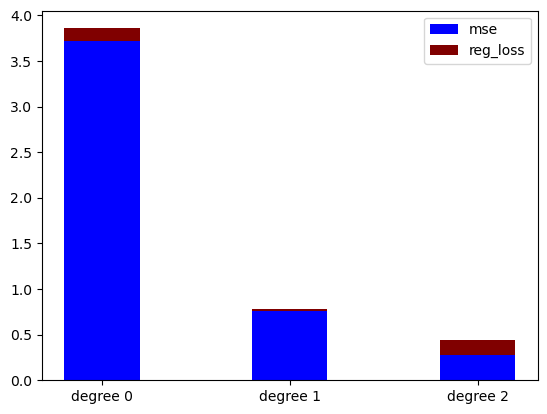

nv-2
loss [0.016461643435544942, 0.051406029224395494, 0.08494234750447904]
mse [0.1362462840199947, 0.09823142172844349, 0.07402425777489408]


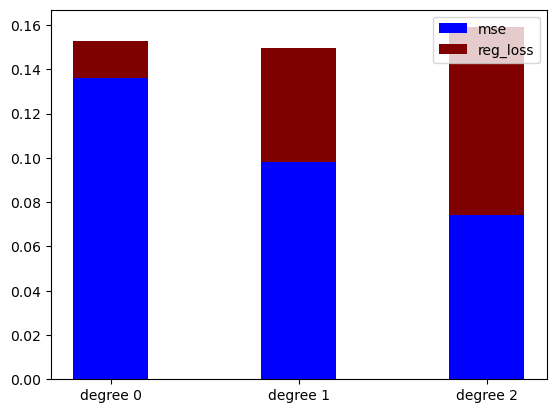

nv-3
loss [0.030663657985981897, 0.07695922677594288, 0.11310736799429569]
mse [0.04040025193092552, 0.0217455925064688, 0.020712191699499907]


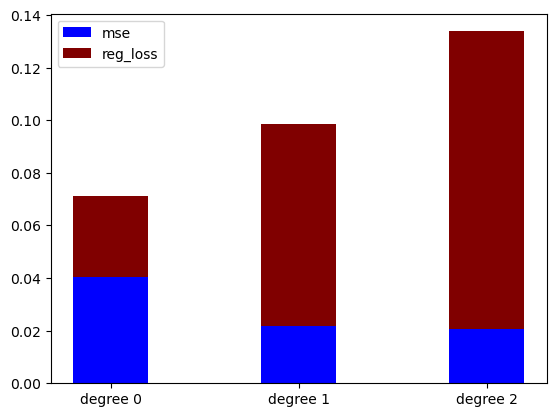

nv-4
loss [0.15555647821024177, 0.669186586591153, 0.8646149991443114]
mse [8.313418870834479, 1.3444038011913264, 0.8104252125272245]


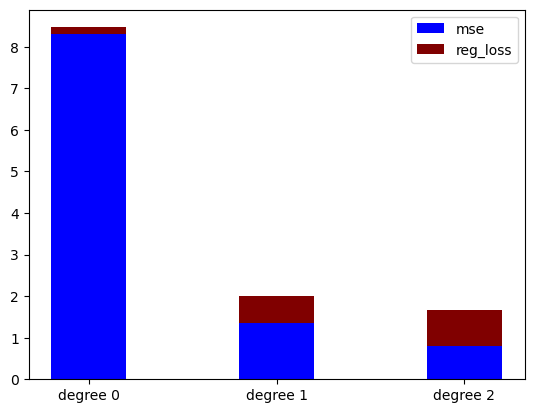

nv-5
loss [0.0925374818308135, 0.20587113932363074, 0.31281170280163545]
mse [0.2926876516417575, 0.24745297346711545, 0.242888177887502]


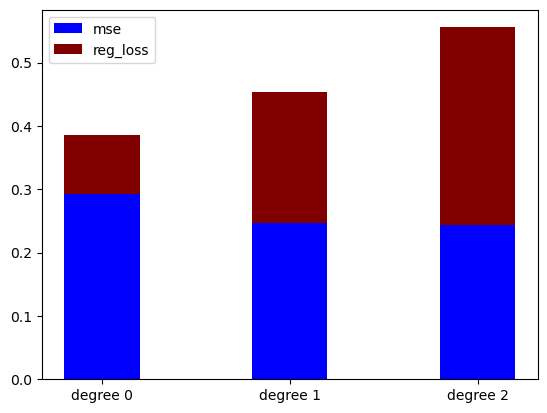

nv-6
loss [0.23278639020976463, 0.63263197433819, 0.8730394352633694]
mse [3.2756637225522676, 1.44884425275727, 1.251400354824249]


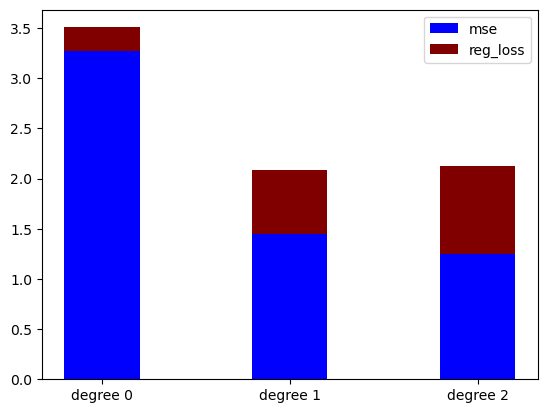

nv-7
loss [0.11846325397652223, 0.4588552942411693, 0.5985610001078782]
mse [3.576415979541287, 1.5625354929956319, 1.385427818620849]


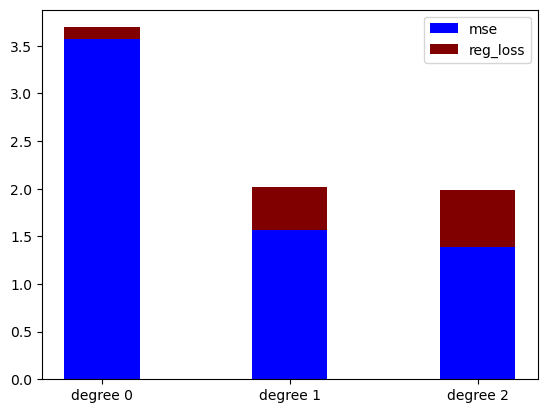

nv-8
loss [0.030031400672147497, 0.06876280371079521, 0.11113876229768388]
mse [0.0978877215584521, 0.09051844991778961, 0.07408639420012615]


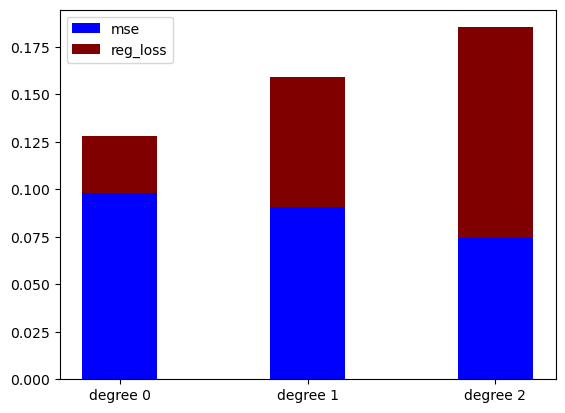

nv-9
loss [0.01739354554603689, 0.05430546262661398, 0.08766776076268967]
mse [0.10543394340238456, 0.06374986087455242, 0.05544307039716193]


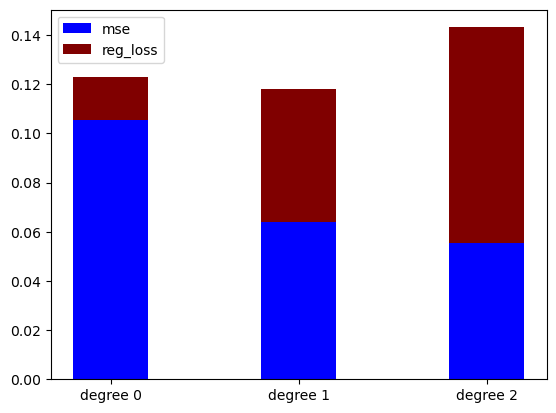

nv-10
loss [0.025174071173022894, 0.06404067692999457, 0.09768048996070539]
mse [0.09144850279024916, 0.06070652782805005, 0.05687962203890589]


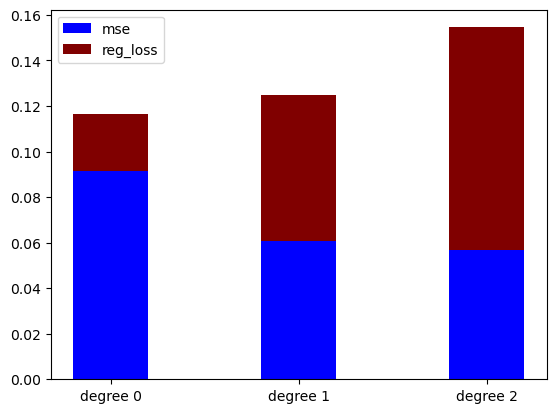

nv-11
loss [0.017081601628139292, 0.05207954855890835, 0.08508929503764057]
mse [0.14652194236248733, 0.10629076322891562, 0.08268018421398442]


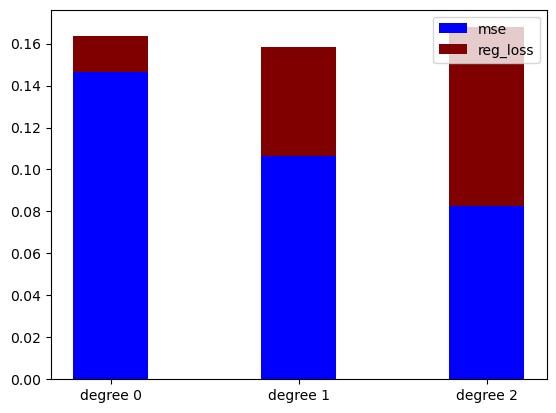

nv-12
loss [0.10149503886431177, 0.48276359948809777, 0.6449762947245468]
mse [3.7513210157923615, 1.527375970463999, 1.435962465650452]


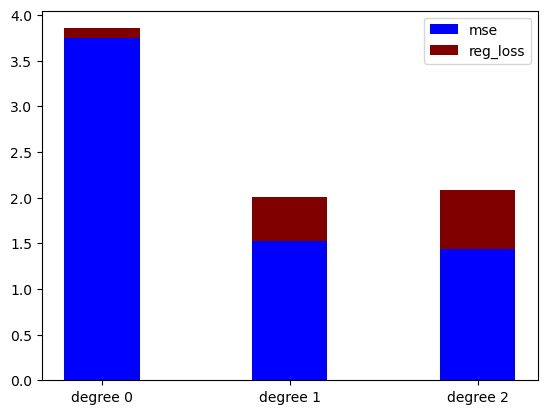

nv-13
loss [-0.01237730942101818, 0.027495374631854832, 0.00498977170689956]
mse [0.5513613049244019, 0.32592596392598777, 0.2000780153836308]


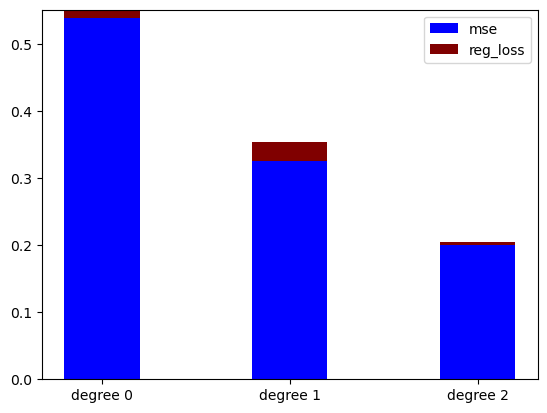

nv-14
loss [0.01900200336852028, 0.058005566946573044, 0.09662510620007862]
mse [0.16022146827384554, 0.10934388527847007, 0.08310300568710915]


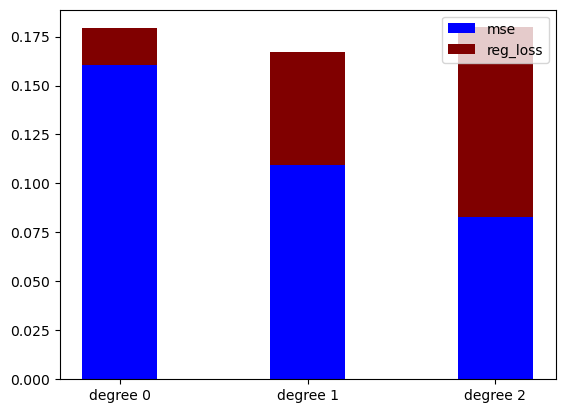

nv-15
loss [0.11257260663713374, 0.6070208223727713, 0.835957772365887]
mse [8.910972687854532, 1.9985202574768808, 1.8561135623539202]


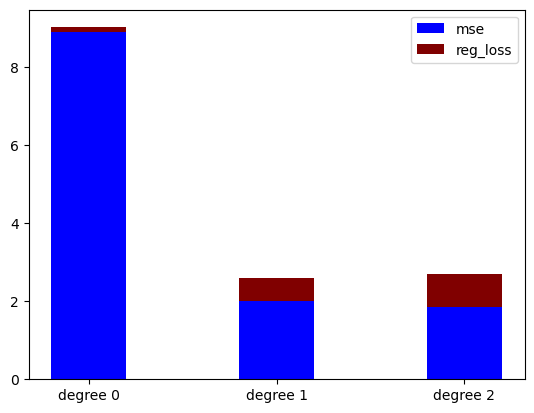

nv-16
loss [0.1413201361646799, 0.028043258622120107, -0.11056920882574142]
mse [4.522797218799324, 0.9641515245289296, 0.2768785620624775]


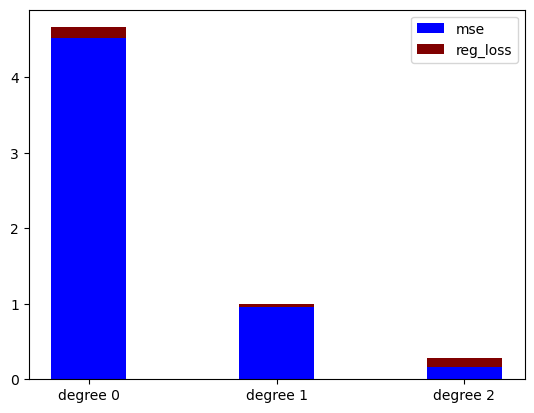

nv-17
loss [0.2565944272551463, 0.6301739000558658, 0.6795827291650556]
mse [2.725170483431693, 2.211034832664056, 0.8823670668480985]


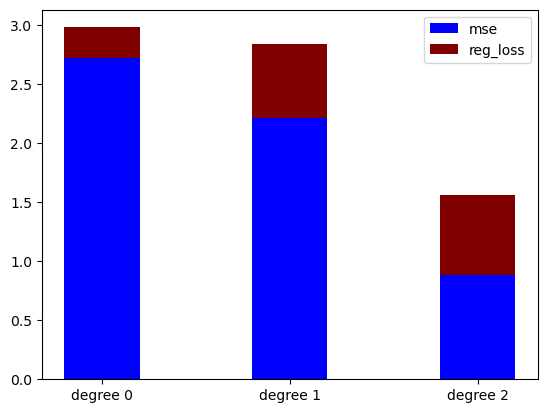

nv-18
loss [0.16904689397005535, 0.7565962736923434, 0.9547711502326115]
mse [10.171346938453562, 1.4746862314325737, 0.7675437021260395]


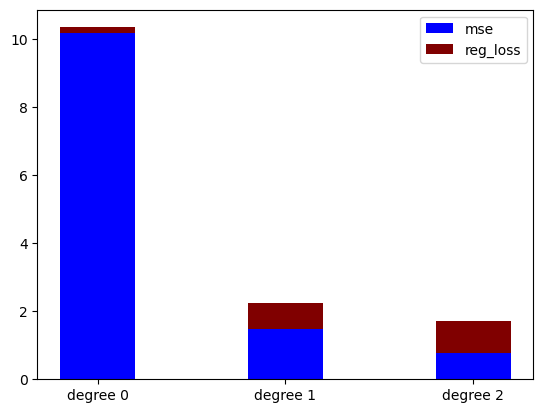

nv-19
loss [0.12745617546713367, 0.585107991038461, 0.7130562981125002]
mse [7.546879118078431, 1.5130652938456908, 0.589008133429354]


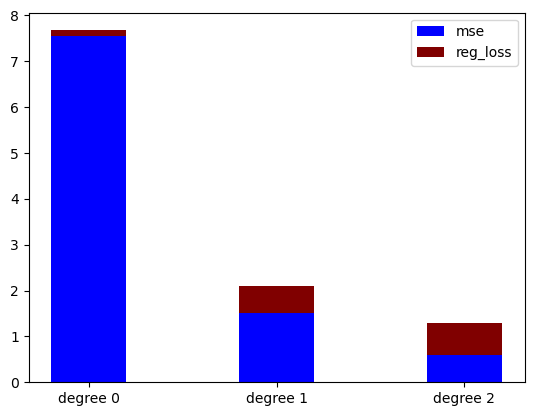

nv-20
loss [0.029664267146975856, 0.06957449629417954, 0.10448611620965963]
mse [0.08099695954867667, 0.06881382525229976, 0.068807986469785]


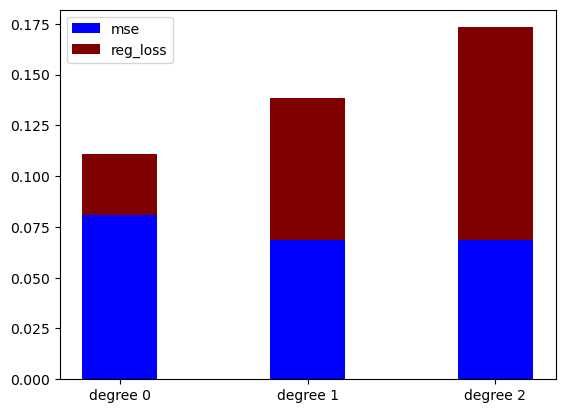

nv-21
loss [0.11193921144710538, 0.23718294490979996, 0.14035794206174143]
mse [1.6811099810989318, 1.6711916547122174, 0.06504918744252386]


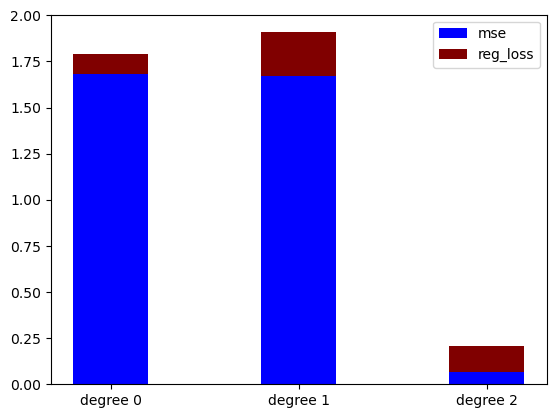

nv-22
loss [0.0414675561095259, 0.08652668655132188, 0.12924989568720222]
mse [0.05266485038811535, 0.04994635942580022, 0.049261452691252365]


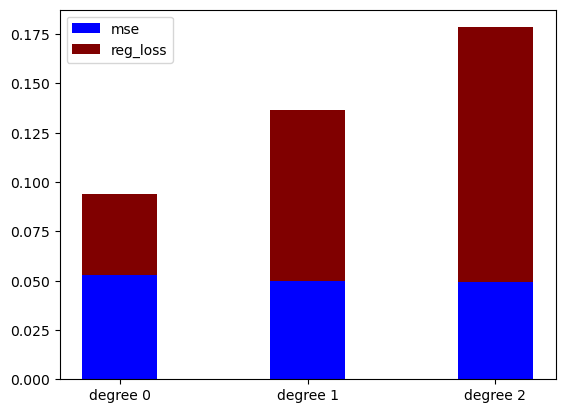

nv-23
loss [0.15612378680052305, 0.553119277864126, 0.7804668843582435]
mse [4.162926833004359, 1.8663846134316808, 1.8129547992959856]


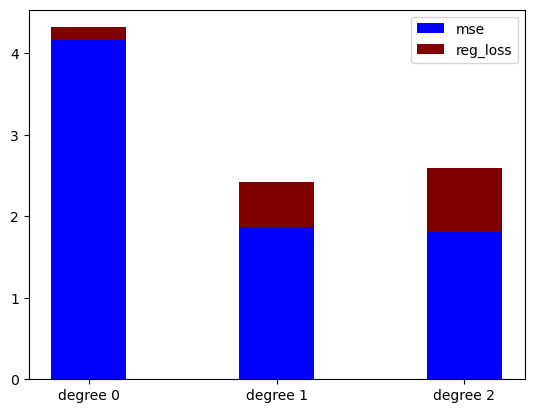

nv-24
loss [0.23366834454807833, 0.6451831911971716, 0.7556858889220591]
mse [3.654297839980627, 2.2381195096447097, 1.0928895478852934]


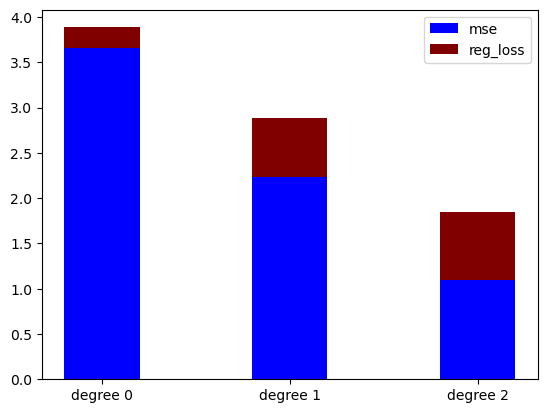

nv-25
loss [0.02705370752816172, 0.06503733640634977, 0.0978933920890059]
mse [0.06645837652252197, 0.05128082972645017, 0.05116011633749259]


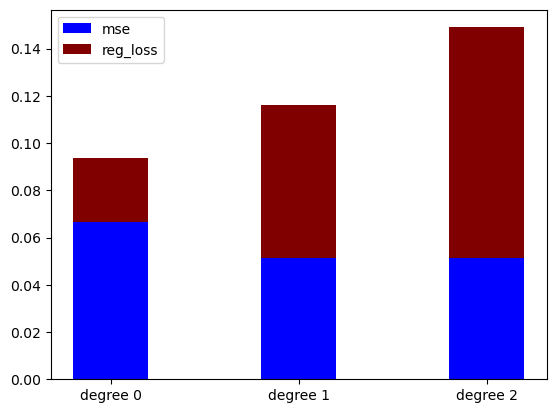

nv-26
loss [0.024933519366598798, 0.06327482610102655, 0.0979876277768732]
mse [0.07831409334037437, 0.05190453848033281, 0.04694616174924904]


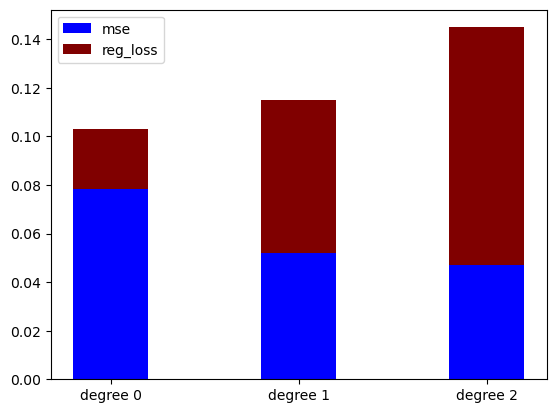

nv-27
loss [0.19363021562207092, 0.7176319308047808, 0.9495776989396101]
mse [8.526555648979954, 1.2096489109002901, 0.6777624964268263]


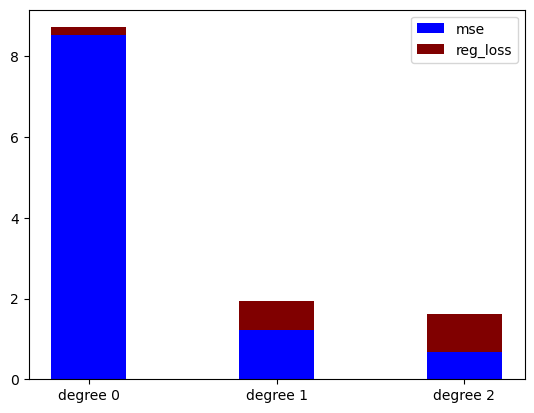

nv-28
loss [0.022002710527200195, 0.062425858903627444, 0.10288748301625839]
mse [0.11508457025375356, 0.07906693799257933, 0.05900886561081816]


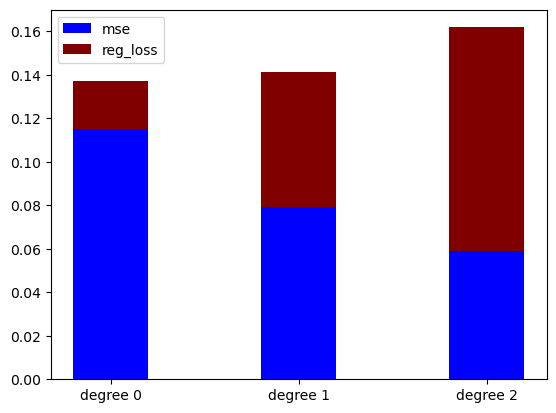

nv-29
loss [0.08156735063576165, 0.16124843346313977, 0.24176454178818585]
mse [0.18945335287726872, 0.18888304649057286, 0.18884224556036366]


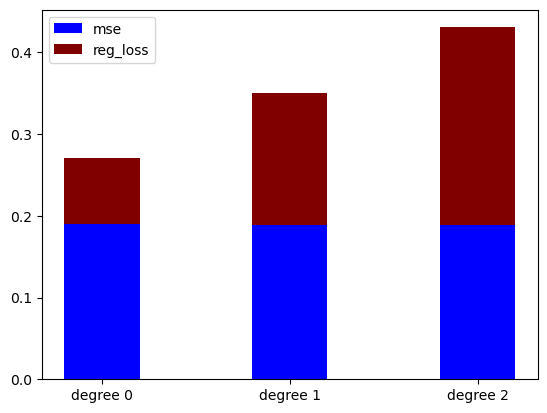

nv-30
loss [0.02511127355707985, 0.06186738657122093, 0.09389785565759139]
mse [0.09625639683279524, 0.06967503798470925, 0.0638973708371696]


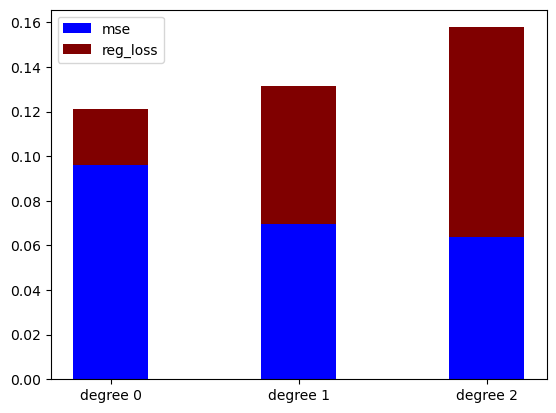

nv-31
loss [0.03232777294990027, 0.07256398230836635, 0.1159359581653222]
mse [0.1081473331789078, 0.10230408729998962, 0.09167053925584467]


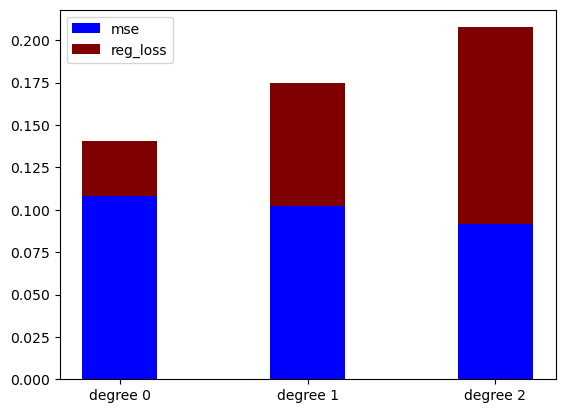

nv-32
loss [0.021591614895386996, 0.06274031739866821, 0.09719781064529168]
mse [0.10544867738820042, 0.07218931267299884, 0.07010291363628134]


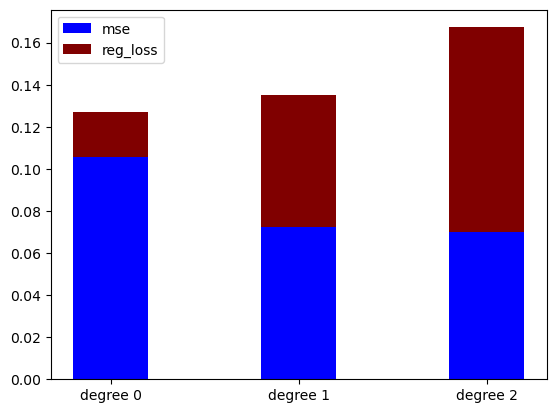

nv-33
loss [0.03003013340780122, 0.08259217861652543, 0.132422872305173]
mse [0.13005406581718182, 0.06667574604866115, 0.04690052684695362]


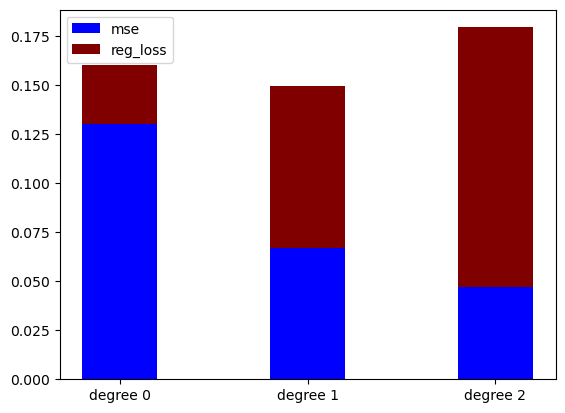

nv-34
loss [0.2381777101828227, 0.5546944877206531, 0.7142703594872416]
mse [1.5523829542430725, 1.206888783800444, 0.8516168712663491]


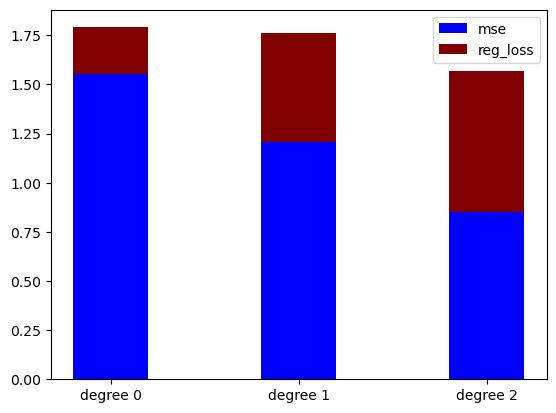

nv-35
loss [0.02272808293091575, 0.06164171372994334, 0.0938389371123472]
mse [0.08864753807913042, 0.05672643007449085, 0.05498214563336732]


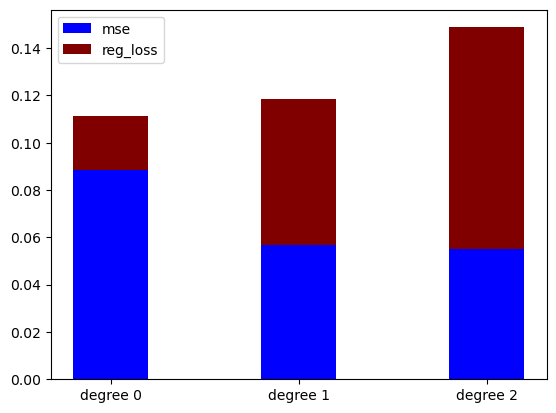

nv-36
loss [0.03200243659421713, 0.0705796763679739, 0.10685116513165838]
mse [0.0741854869150093, 0.06856854363440765, 0.06700758628872991]


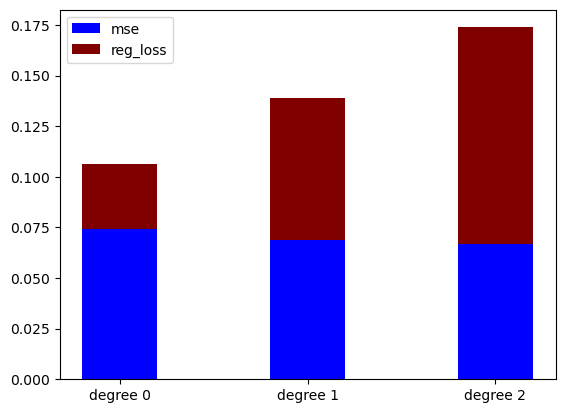

nv-37
loss [0.014775703485565703, 0.04824796774894099, 0.07766300810241844]
mse [0.11580578625775252, 0.0681074692534515, 0.051990971894007136]


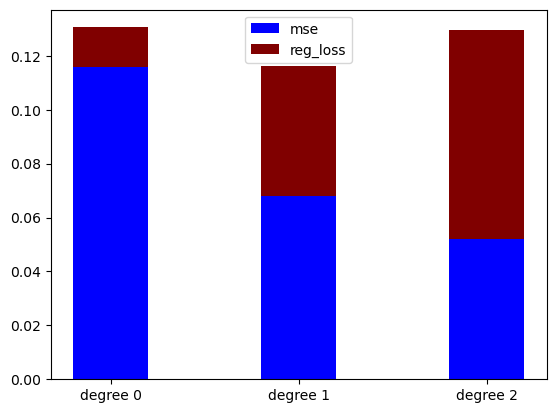

nv-38
loss [0.011833101235828801, 0.04487169703540642, 0.07459901900233072]
mse [0.08117088800136679, 0.04540888388350865, 0.039027093204329254]


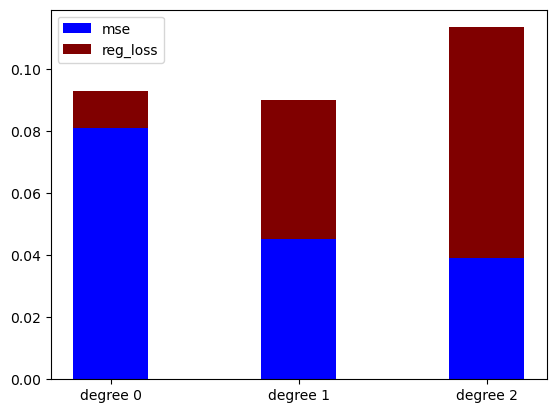

nv-39
loss [0.01347091106446293, 0.04787189097183928, 0.0777851937833942]
mse [0.1569362132075494, 0.10685218260986115, 0.07541712330025466]


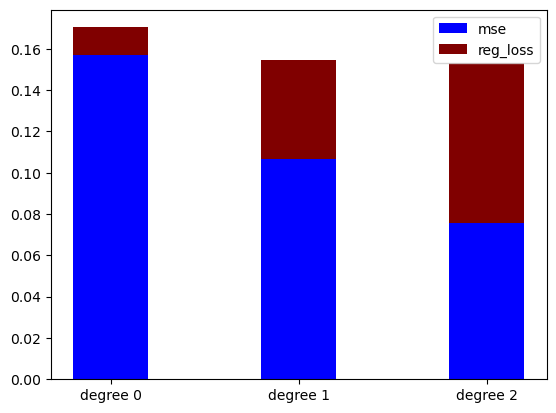

nv-40
loss [0.07321429106300043, 0.5138734050190433, 0.6479724028008325]
mse [7.9791230999625755, 2.197807850709734, 1.908647759185061]


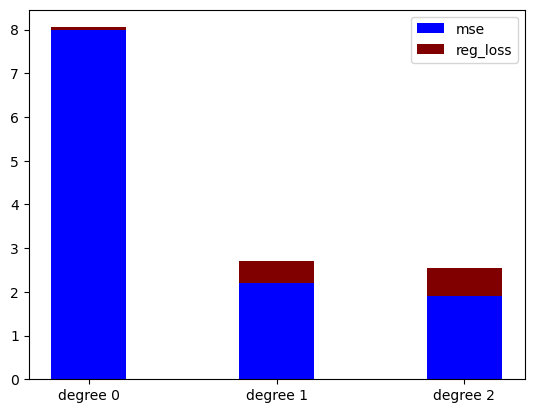

nv-41
loss [0.032583590664831054, 0.07276656544653158, 0.10974893239308266]
mse [0.07798735319881614, 0.06802843527290157, 0.06672655851163878]


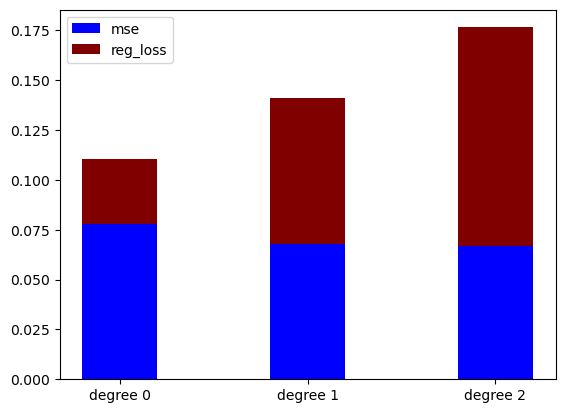

nv-42
loss [0.00927811313028504, 0.03810427433256386, 0.06504696679205059]
mse [0.08629343812192472, 0.050240184377599105, 0.039104316738580974]


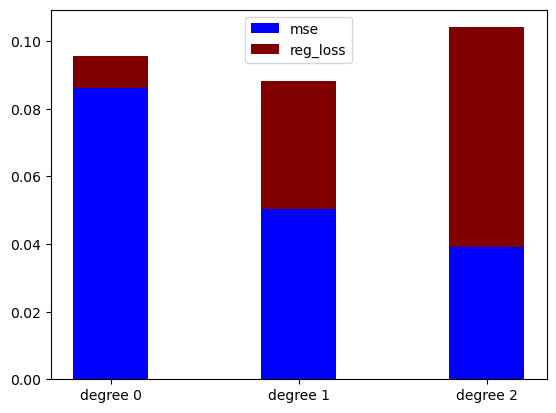

nv-43
loss [0.11631573172795236, 0.525055134177878, 0.7015719495004714]
mse [6.060693650705201, 1.4473739259650467, 1.2271269897261976]


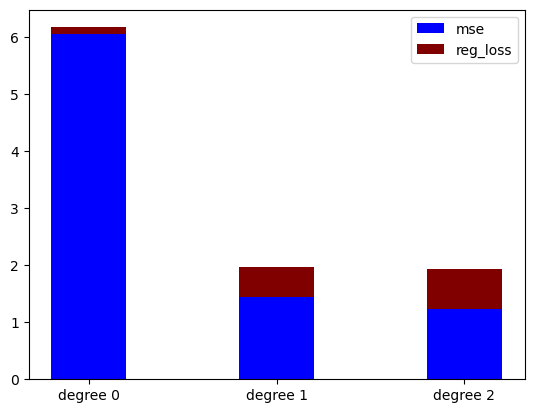

nv-44
loss [0.026953703149733624, 0.0620684039626114, 0.09484509183541023]
mse [0.07739649836019645, 0.06297721184048194, 0.05353621791206147]


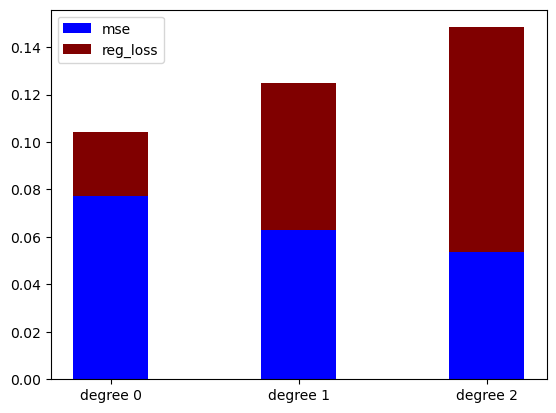

nv-45
loss [0.030736523649286186, 0.0702417998912617, 0.10507944517550803]
mse [0.08102417496625643, 0.07090186989742105, 0.07084721277068308]


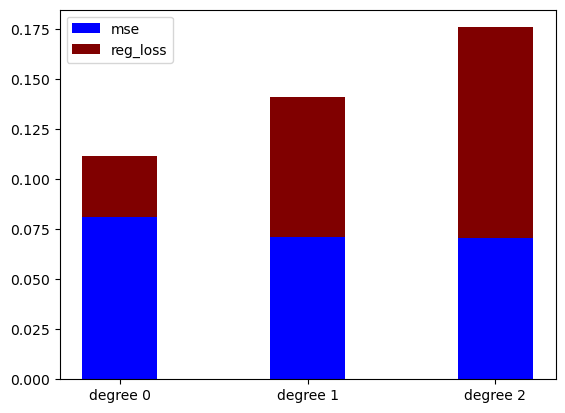

nv-46
loss [0.028418432852151367, 0.0647996377830861, 0.09737659695291165]
mse [0.08276697610228856, 0.06597621775731617, 0.0643661469868222]


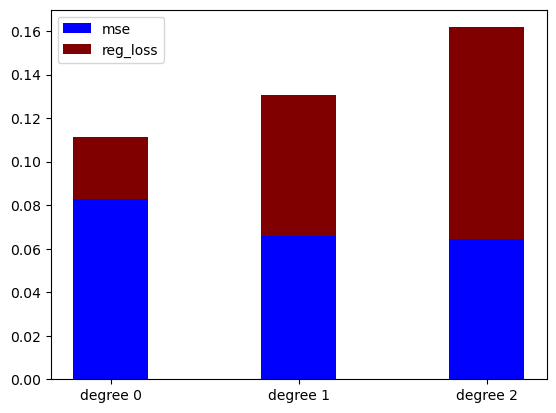

nv-47
loss [-0.051912823806460374, 0.04112412461222789, -0.0028494597693739855]
mse [2.9409587846822056, 0.6605274587175922, 0.09839268203151244]


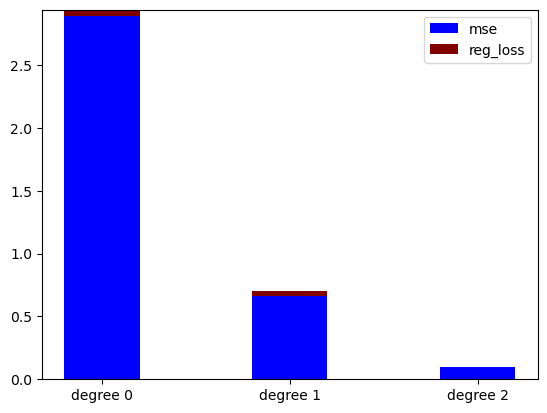

nv-48
loss [0.02345607650629142, 0.06438700747244609, 0.10155044116212622]
mse [0.1334580652525461, 0.09279997421896578, 0.07740020395889226]


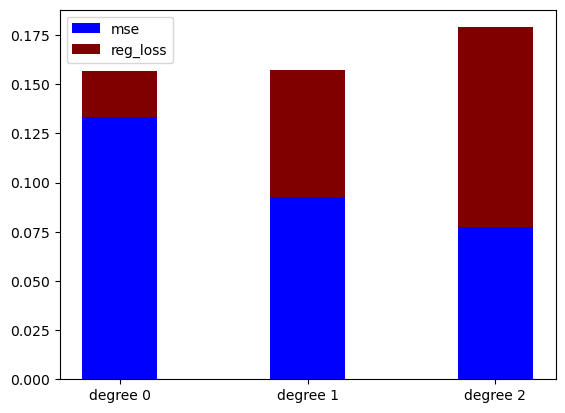

nv-49
loss [0.1586263452349902, 0.6956376067471524, 0.92128397530765]
mse [7.797680937747917, 0.9428022111472488, 0.565922363484977]


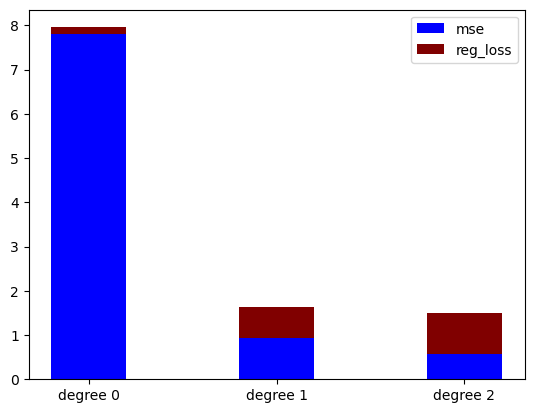

nv-50
loss [0.21984839940366713, 0.5969697938728972, 0.8089377399430625]
mse [2.670371335500668, 1.407901282268636, 1.1808514644185082]


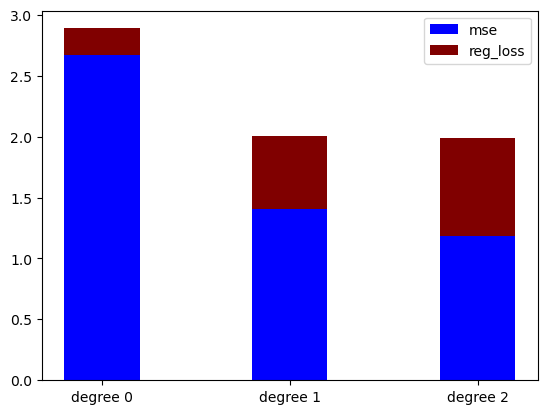

scalable-1
loss [0.08405813377677507, 0.14431553341297373, 0.19958248958252575]
mse [0.1065138057675451, 0.06946631481709212, 0.05031265213255869]


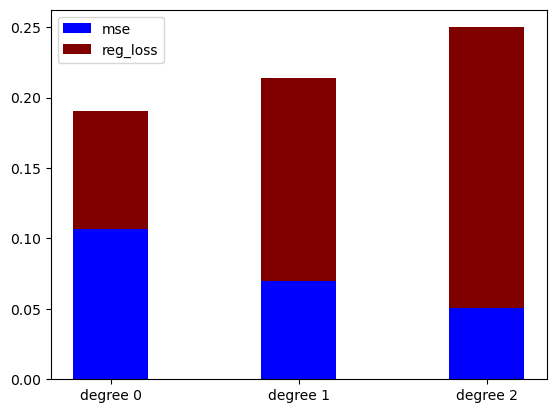

scalable-2
loss [0.10618319826304082, 0.197854822254585, 0.27697846071160653]
mse [0.21308720105303508, 0.1931312055811077, 0.13187216755210598]


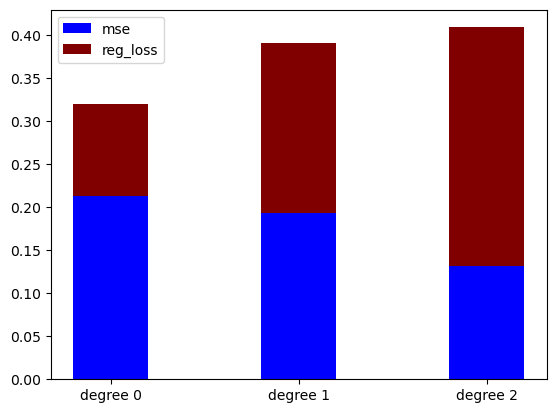

scalable-3
loss [0.07275688387086802, 0.12349996666545678, 0.16828153734553944]
mse [0.053811954508413355, 0.031203330243721236, 0.021808538480694577]


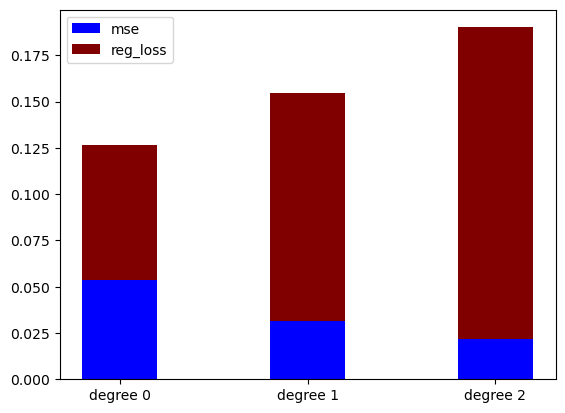

scalable-5
loss [0.08773434524980561, 0.14863769886265046, 0.2048575149042205]
mse [0.09992401520542028, 0.05778948552729983, 0.03950989929471759]


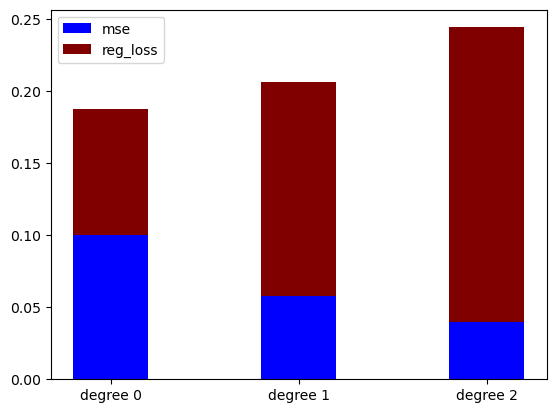

scalable-6
loss [0.08092330293733412, 0.1300424779192703, 0.18082365345808868]
mse [0.13591391895184238, 0.05461231663763148, 0.039353159305027405]


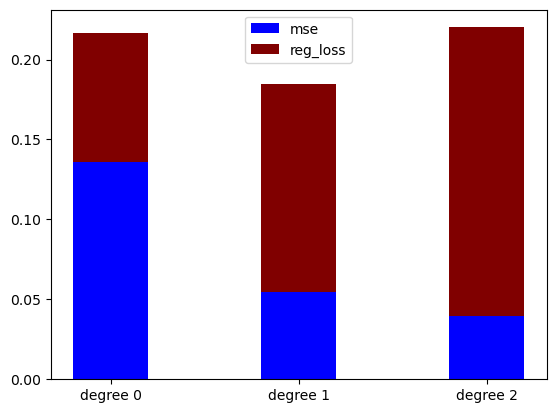

scalable-13
loss [0.0885724295270014, 0.14784098743418292, 0.20361988865006905]
mse [0.17096500195667277, 0.10128146032809127, 0.0681303601151879]


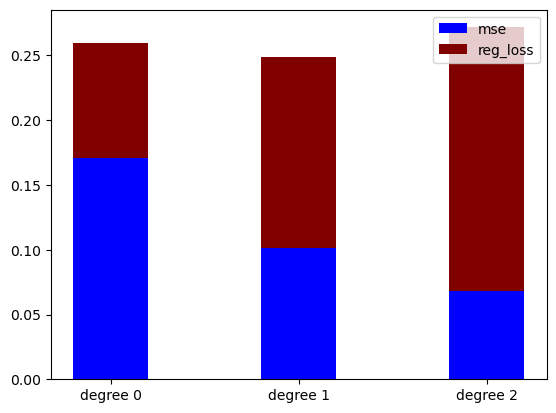

scalable-14
loss [0.13500088660545034, 0.24184670624750304, 0.33309191277898986]
mse [0.2607657231035057, 0.1987832383639671, 0.13579696970076208]


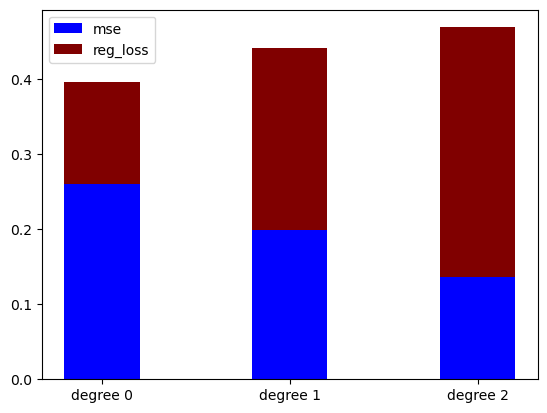

scalable-15
loss [0.09600799044155599, 0.16534536404482506, 0.22321091630622591]
mse [0.17298582660171696, 0.12127971379159841, 0.06446838396462277]


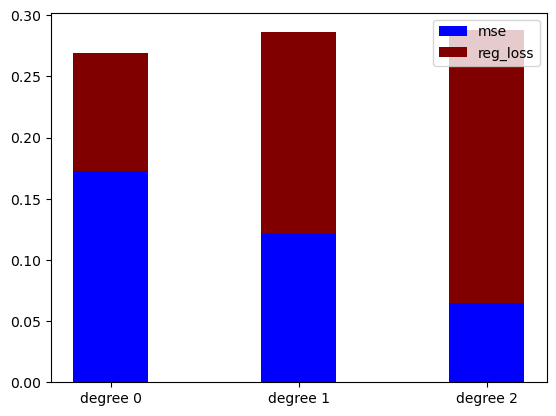

scalable-16
loss [0.09352817736024842, 0.17745055104298346, 0.2456317279603432]
mse [0.16007342428178203, 0.15214862698495082, 0.10594279668614837]


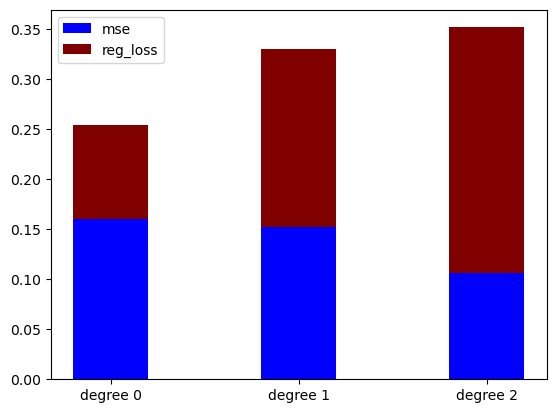

scalable-21
loss [0.09698255710036942, 0.16422004518311448, 0.2241582996945217]
mse [0.16154250481009794, 0.10062012522409215, 0.0634467418142738]


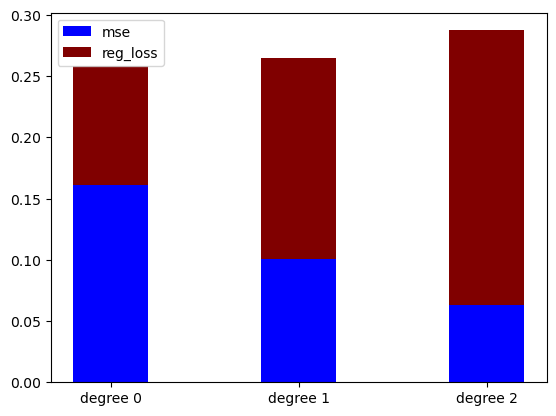

scalable-22
loss [0.20011025296713225, 0.4960062193656858, 0.9451558893348424]
mse [1.9816261771047154, 0.774040091410928, 0.13367868737135738]


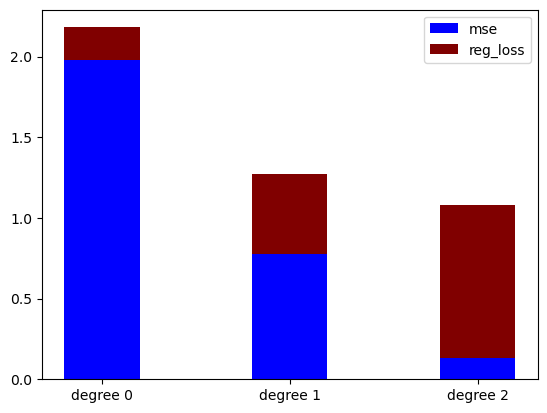

scalable-23
loss [0.07829989114003659, 0.13561960247785929, 0.19165242143468172]
mse [0.11917496302123885, 0.08189713447176902, 0.06875608217906155]


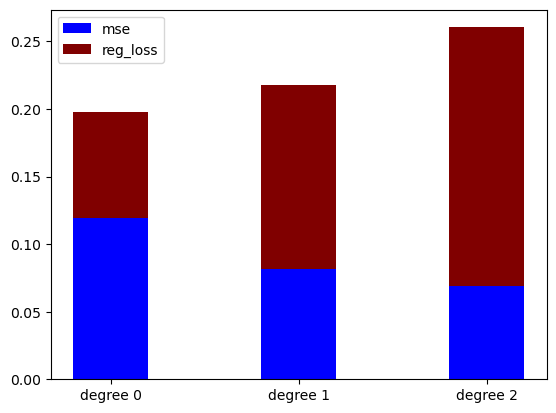

scalable-24
loss [0.09226343850652073, 0.16585001382387837, 0.23160881340707237]
mse [0.2850788174939099, 0.23929445632214036, 0.14389439844945245]


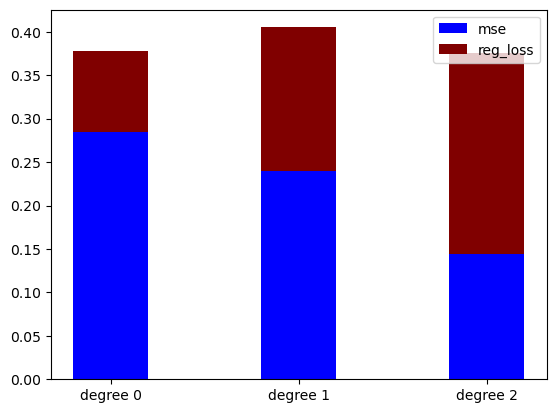

scalable-27
loss [0.10308443754986663, 0.17599842140807076, 0.24353841863831152]
mse [0.1965476661248011, 0.12362788448989, 0.06973026950515651]


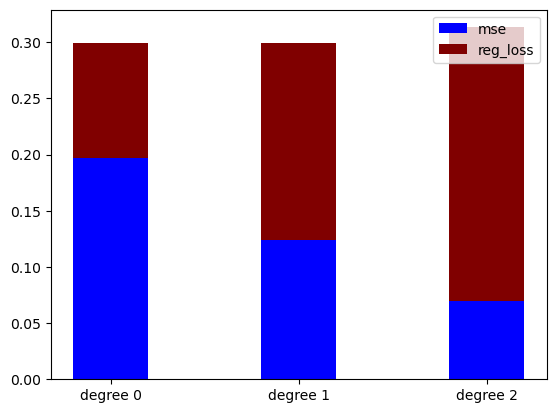

scalable-33
loss [0.08402134425119079, 0.14687485253432872, 0.20490924892052675]
mse [0.17277049626815014, 0.12165061153987596, 0.07077887685328402]


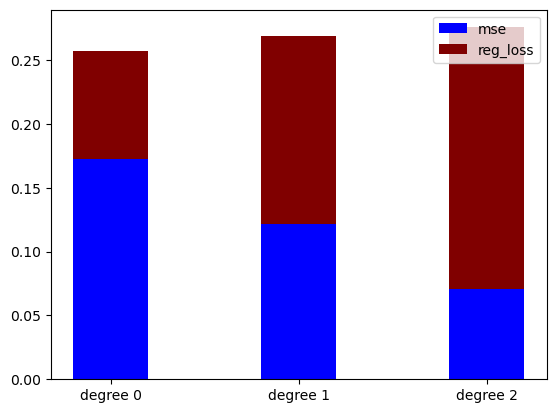

scalable-35
loss [0.08480845150934364, 0.14742282082293878, 0.20055625709253289]
mse [0.10714560359706321, 0.07343307766308185, 0.05055020086312976]


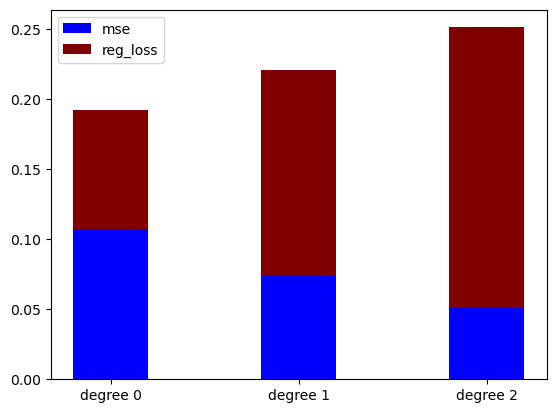

scalable-36
loss [0.08330633872933817, 0.1580851944199807, 0.21019082863283245]
mse [0.1267468523532993, 0.12170312795612281, 0.06371714602299293]


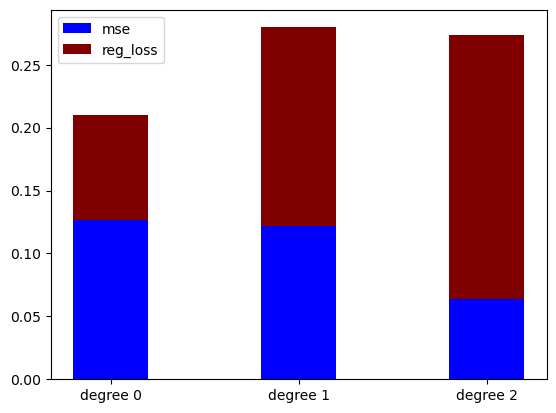

scalable-37
loss [0.08176133932596709, 0.14077272705108876, 0.1945830330815874]
mse [0.18150332335593714, 0.11696288909143308, 0.0771281094070125]


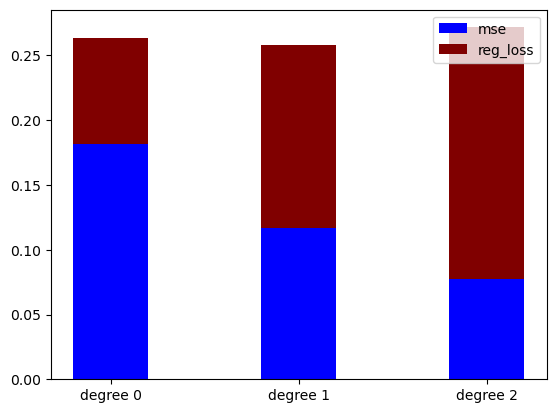

scalable-40
loss [0.09660942146873482, 0.17648165134371338, 0.24103335135516338]
mse [0.20068499102903078, 0.17352703866358413, 0.11055489653520036]


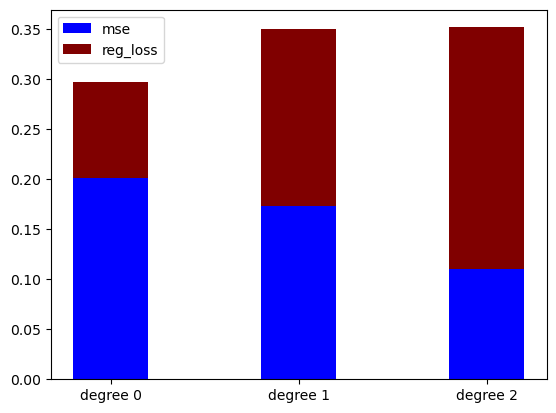

scalable-41
loss [0.08732768398730104, 0.15965996541458682, 0.2238332723245936]
mse [0.09662481226004814, 0.08074402152189564, 0.06251811714393345]


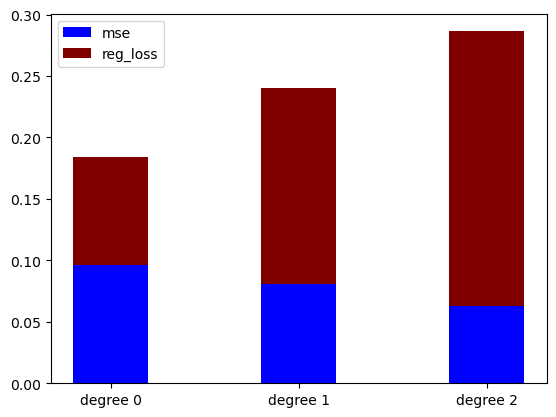

scalable-42
loss [0.09527436886426087, 0.1725258263552156, 0.23365983642750265]
mse [0.15089960359469687, 0.12714244880025624, 0.07053873624781885]


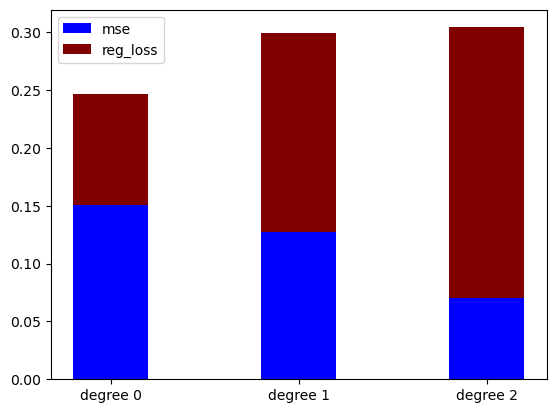

scalable-44
loss [0.08798718743739758, 0.14962928163471953, 0.20526898163160287]
mse [0.16165268488668635, 0.10535751627536992, 0.05279261801032583]


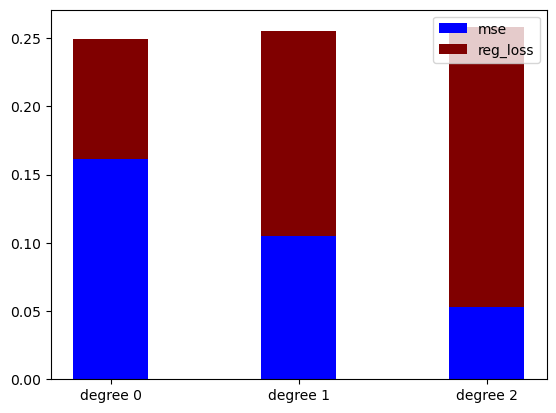

scalable-46
loss [0.07982207713958678, 0.1352547383161221, 0.1870379092845573]
mse [0.1169827043988666, 0.0677937259783734, 0.04224635739112319]


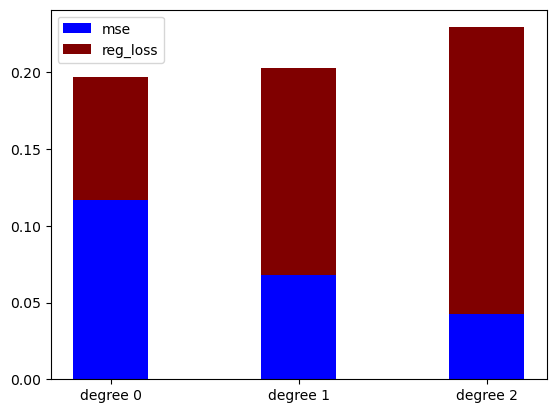

scalable-48
loss [0.08914103831461484, 0.1543783217377116, 0.21335996195250717]
mse [0.12665291532925296, 0.08294534045536993, 0.05866644229265274]


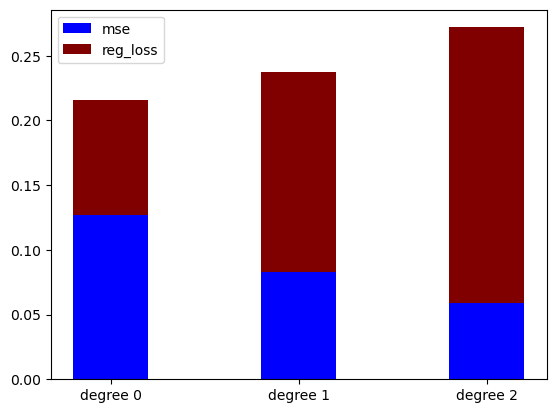

scalable-49
loss [0.08869322387628936, 0.1499307352708785, 0.21050243530228077]
mse [0.18053738096625052, 0.11876907774015708, 0.09464123382856658]


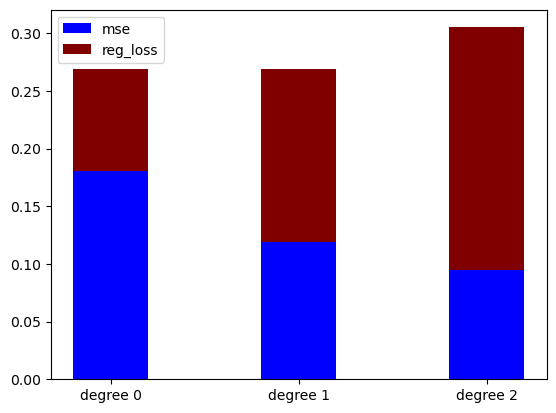

vegas-1
loss [0.36151178246326876, 0.622057373176657, 0.8004979990367304]
mse [1.9769898797712993, 1.5510488761694352, 1.233532365769275]


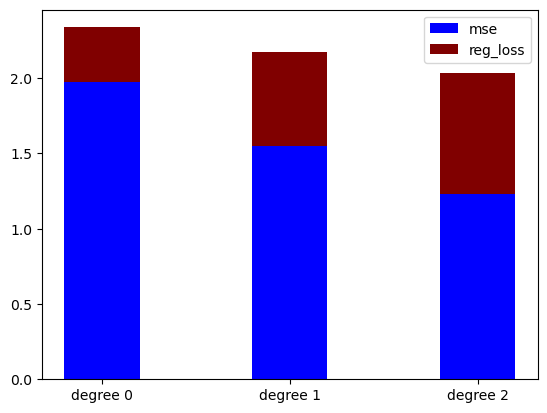

vegas-2
loss [0.3535651584777491, 0.6155925855308229, 0.7937227358376515]
mse [1.938075227425364, 1.5114231794723374, 1.1499101457832848]


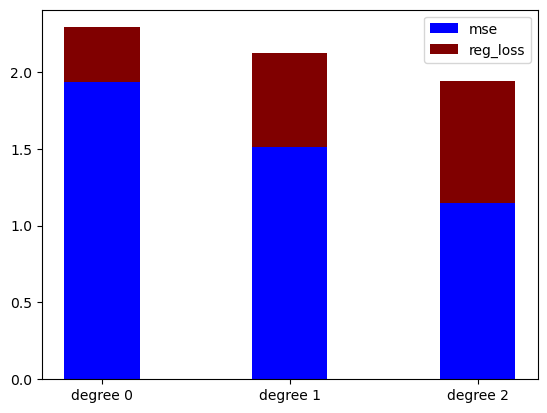

vegas-3
loss [0.40012738710224227, 0.6910784956766345, 0.9008243394005521]
mse [2.6988162857370015, 2.1281619894664434, 1.763078922947769]


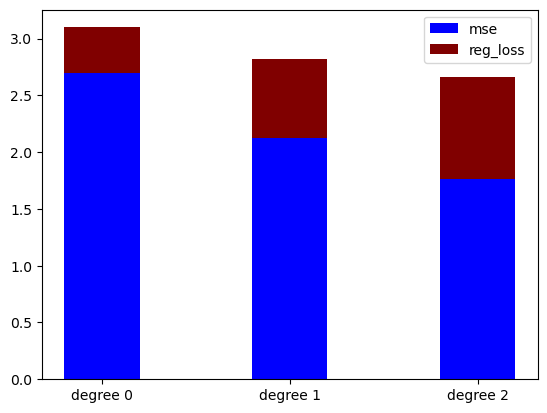

vegas-4
loss [0.36628707134983673, 0.6232390333701556, 0.7853465513541309]
mse [1.7478818856055784, 1.336733823614415, 0.9903789710235483]


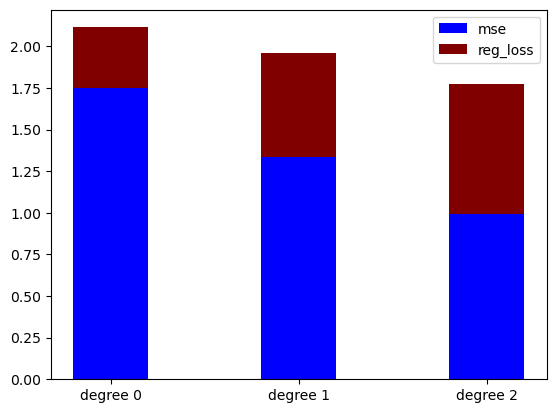

vegas-5
loss [0.3382922274451104, 0.5895615013137094, 0.7093242791760274]
mse [2.071766892425262, 1.7082338333632885, 1.1415952649424983]


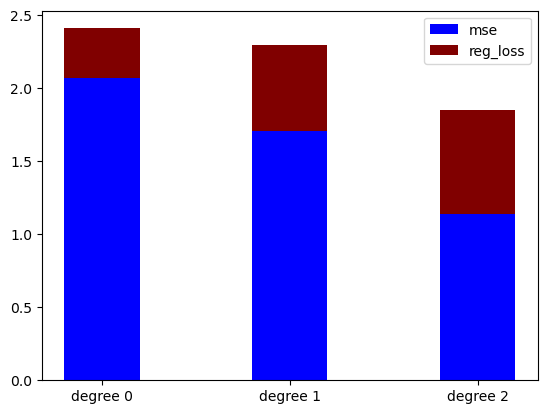

vegas-6
loss [0.342244236706131, 0.6509916774509188, 0.8416371951482864]
mse [1.2188047565154339, 1.1796378415442035, 0.9628116343590772]


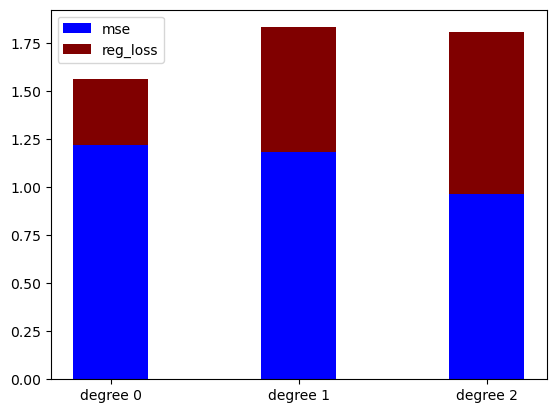

vegas-7
loss [0.310942746015289, 0.5945522236602553, 0.7703034820959593]
mse [0.8844619902390574, 0.8583867699272377, 0.6595399254194156]


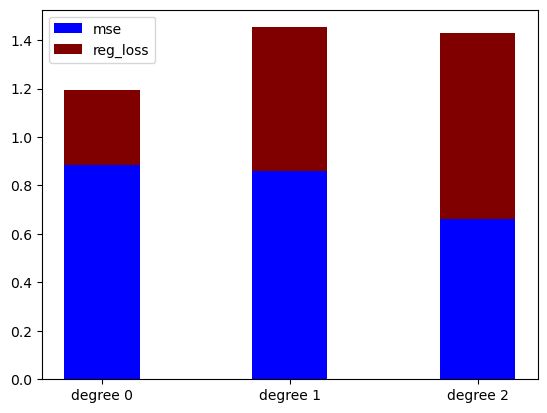

vegas-8
loss [0.36663739918476784, 0.66447381482386, 0.8350208140324238]
mse [1.5285392593678784, 1.3773405429033234, 1.0933857040508816]


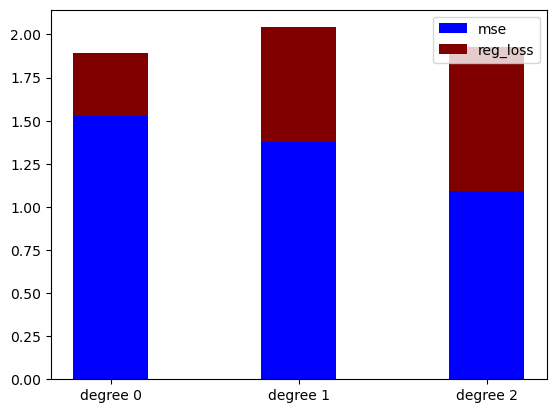

vegas-9
loss [0.36288221746913374, 0.6574212928030665, 0.9073773237452157]
mse [1.1903381931901196, 0.9842737997549295, 0.8733577653203815]


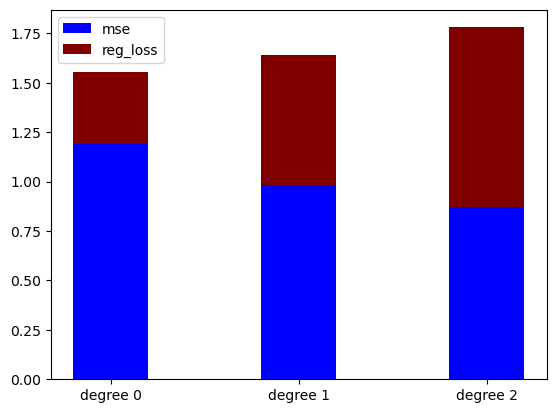

vegas-10
loss [0.3644373755529563, 0.65141028479769, 0.8476025964185738]
mse [1.378480629091467, 1.1563374756369733, 0.8844662749608442]


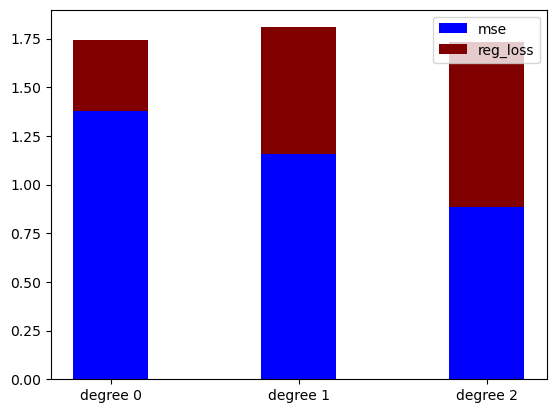

vegas-11
loss [0.3086453800008803, 0.5509409531795532, 0.6365395389843185]
mse [2.037479278708684, 1.8094746143772817, 1.0248367431781125]


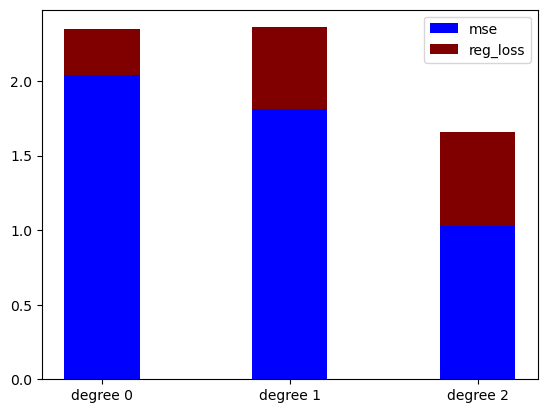

vegas-12
loss [0.3794949850573079, 0.6956525509802177, 0.9615452577329242]
mse [1.8615372937094654, 1.6652176697729102, 1.502776629327826]


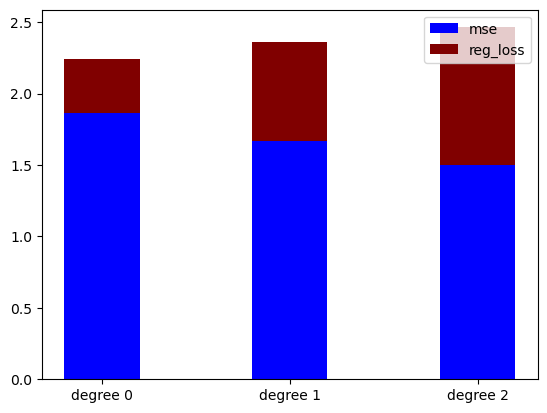

vegas-13
loss [0.3444552871606528, 0.5990152794178922, 0.7602449951330299]
mse [2.3871509204157926, 1.9646559910516872, 1.5254347857689563]


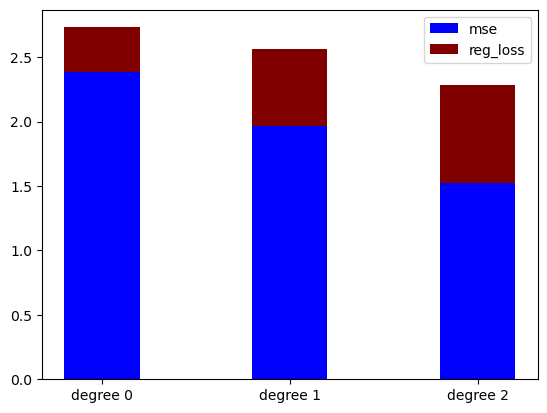

vegas-14
loss [0.3473168795104786, 0.6248519860544299, 0.8096935564085602]
mse [1.968964777868803, 1.6724737918584223, 1.2734681373260348]


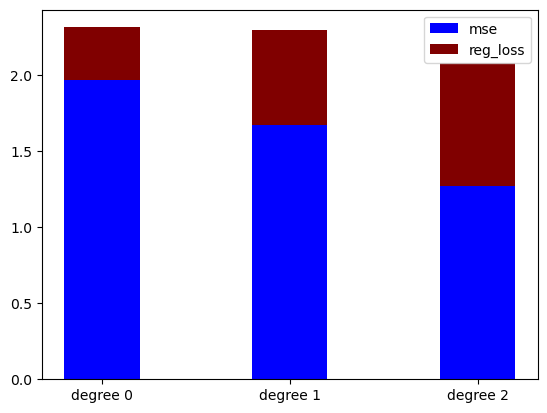

vegas-15
loss [0.3426817242328724, 0.5925599790138548, 0.7262076617700141]
mse [2.1056622923718087, 1.6737653867259692, 1.0875906705965939]


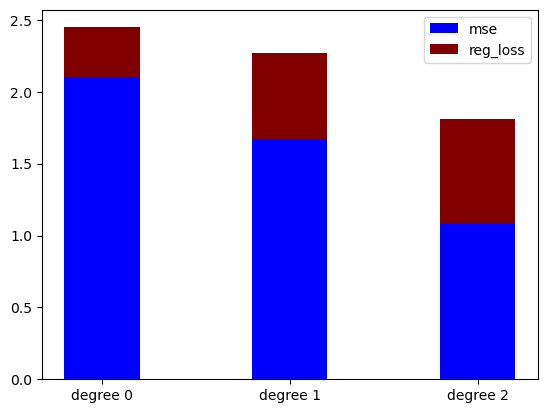

vegas-16
loss [0.30878825324591175, 0.6014628566259943, 0.7609086014084828]
mse [0.8578528480984224, 0.8482013751900673, 0.5920187312195831]


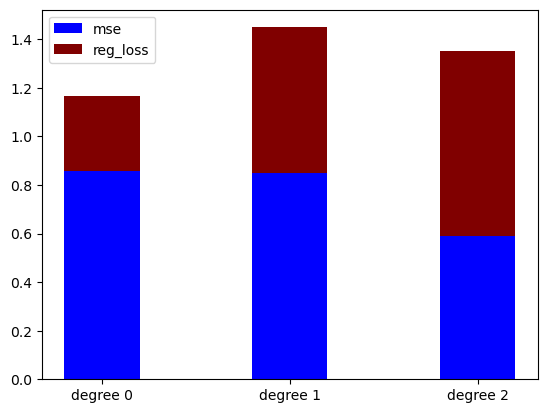

vegas-17
loss [0.3807923054501265, 0.6527619480521254, 0.874667038932201]
mse [1.582559527048543, 1.1290662651540846, 0.962733127377249]


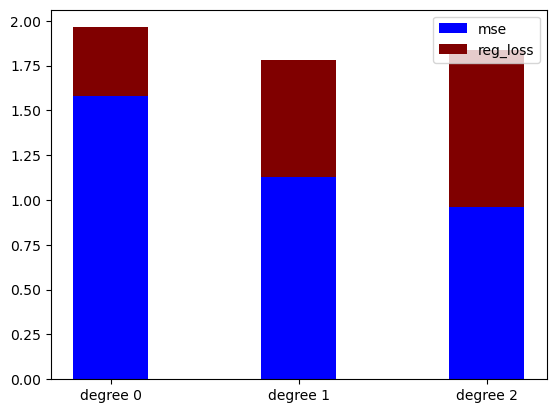

vegas-18
loss [0.3301476095302943, 0.5497299009807245, 0.6349875321959116]
mse [1.606091400313466, 1.2247513271394173, 0.7727830796486508]


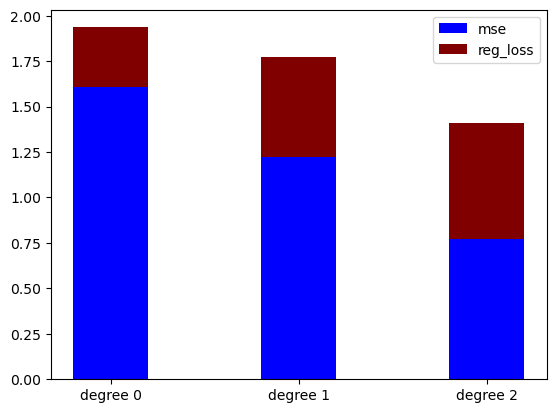

vegas-19
loss [0.3461344689268515, 0.603890956396559, 0.7708450119413819]
mse [1.5895826061738547, 1.275094725651655, 0.9531184040001804]


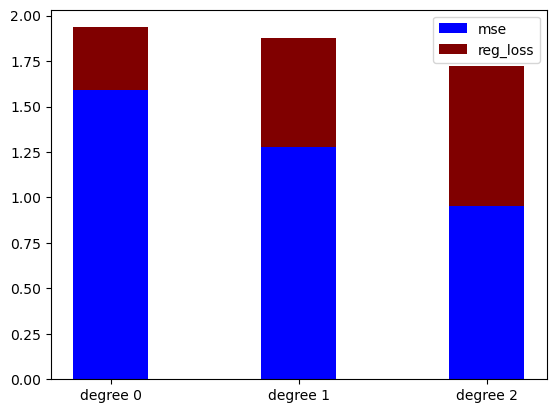

vegas-20
loss [0.41023213096552463, 0.7406935838453862, 1.0185768382189804]
mse [1.8513515092547503, 1.5832240336350472, 1.4414207621261994]


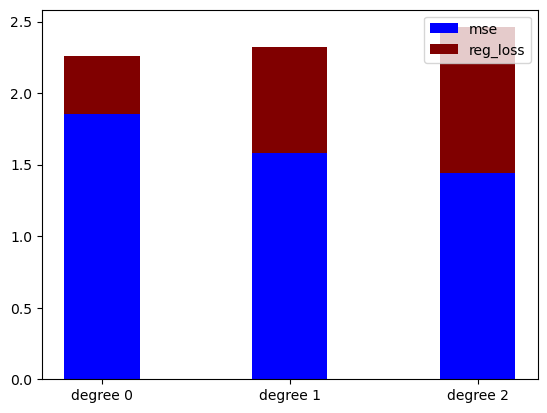

vegas-21
loss [0.3395221163433559, 0.5708396096311172, 0.6644309133462042]
mse [2.159075089375305, 1.666598803628604, 0.9884197219144087]


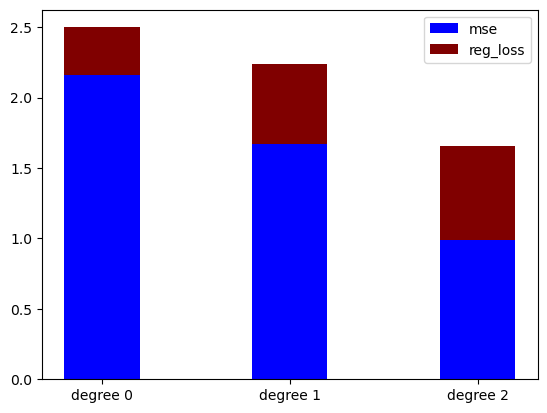

vegas-22
loss [0.3788566918130558, 0.6916185203046474, 0.9128183609052688]
mse [1.4397892022685141, 1.2608565052862348, 0.9878904350914333]


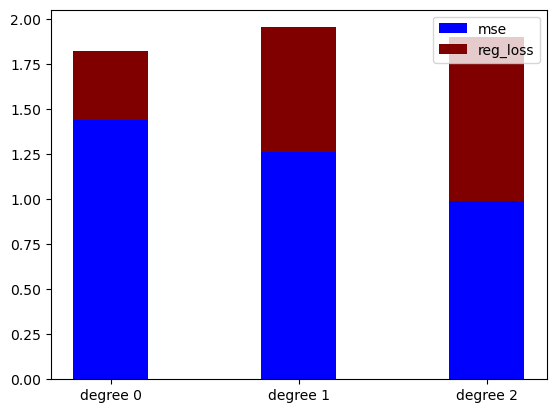

vegas-23
loss [0.28717278456175266, 0.544285481097221, 0.6920891422092836]
mse [1.0183848382525835, 0.9877937191513232, 0.7788979570724519]


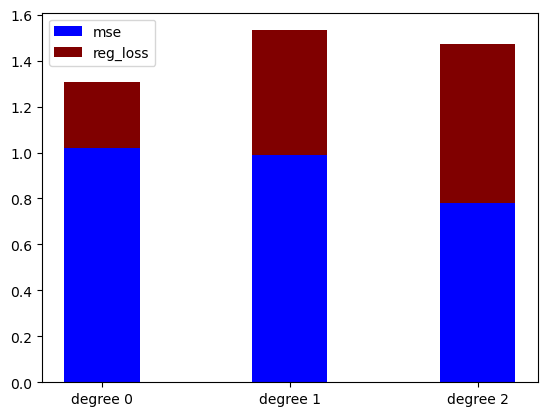

vegas-24
loss [0.3233820726889287, 0.544201270655166, 0.6897376058694076]
mse [2.127594690490701, 1.6006703122251926, 1.2373524840147025]


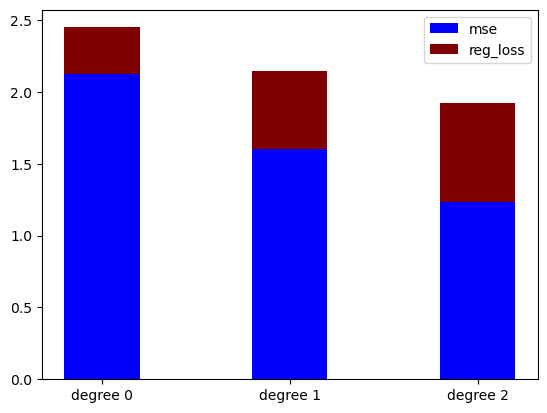

vegas-25
loss [0.345984069765662, 0.5921221453856076, 0.7494174247987666]
mse [2.052346779529801, 1.57528826255463, 1.1886026800174228]


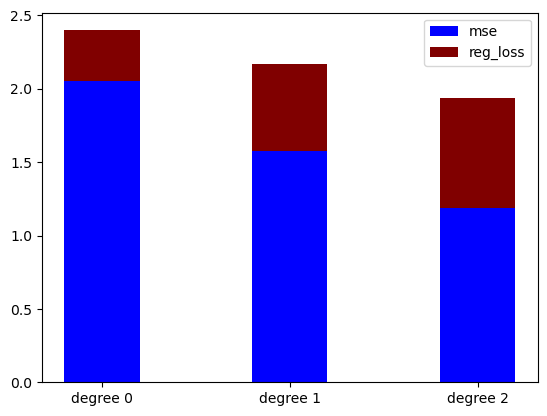

vegas-26
loss [0.34786033455814, 0.5724984772129776, 0.7482095736880613]
mse [2.277621156949976, 1.491101942614425, 1.1788469395511874]


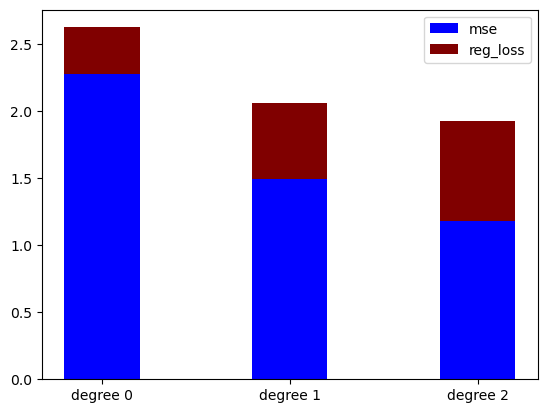

vegas-27
loss [0.32424196816413087, 0.6257239060505205, 0.8046502978777351]
mse [1.0507636176581487, 1.0331644876183337, 0.7726440496506696]


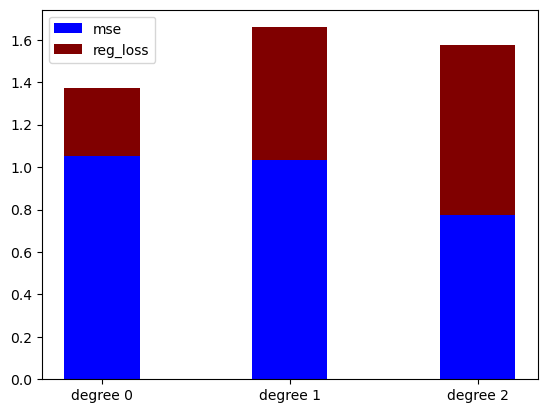

vegas-28
loss [0.33991741528719405, 0.5686874850715905, 0.6929131307295112]
mse [1.7629490099794496, 1.3044866070978531, 0.8494739494518964]


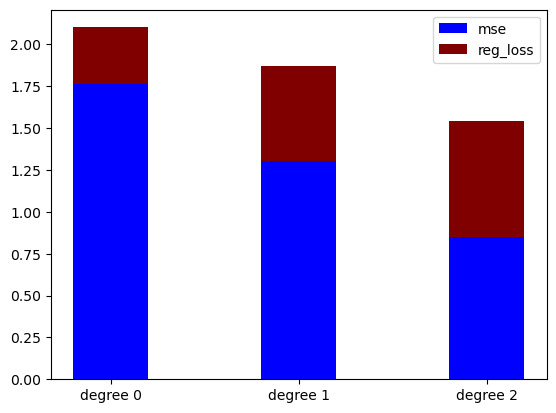

vegas-29
loss [0.39796773716520534, 0.6885937103684022, 0.8377706021813767]
mse [1.9006607639465625, 1.4998480973130153, 1.0004617109337686]


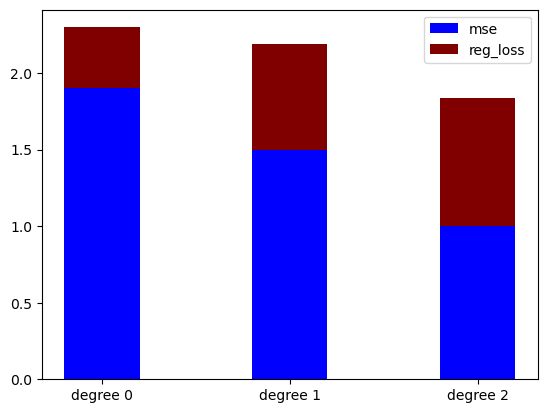

vegas-30
loss [0.3502861588653052, 0.6103338384919061, 0.7889043779216491]
mse [1.788776590225581, 1.3950896425469355, 1.0838544946375854]


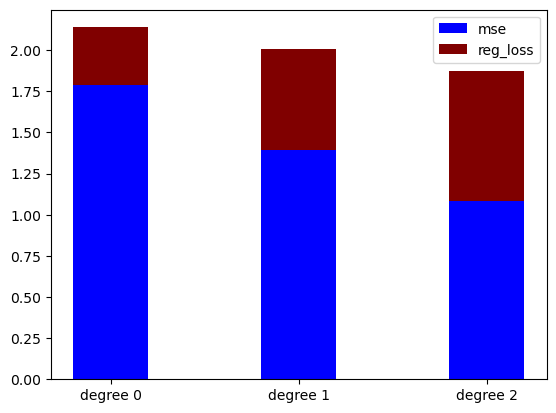

vegas-31
loss [0.4069551845775955, 0.7064013302994723, 0.9035162309889714]
mse [2.1787140018275353, 1.6715237410056065, 1.2731668512314636]


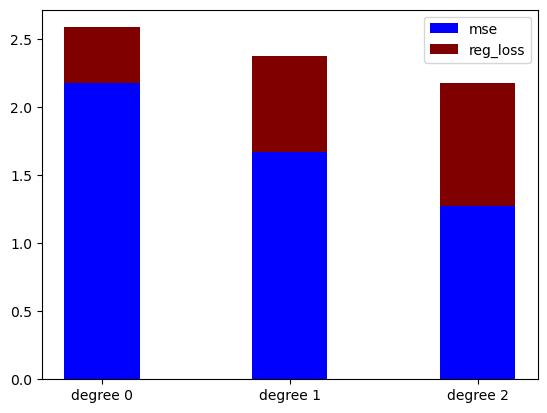

vegas-32
loss [0.33090304403214715, 0.5920345874182279, 0.7484336316533563]
mse [1.1446913094592934, 0.9843075055052698, 0.7254072728051213]


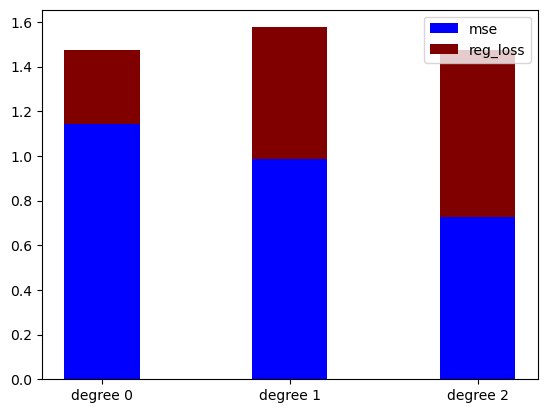

vegas-33
loss [0.36451146459237665, 0.6350958082110303, 0.8101660153339441]
mse [2.7292991376519535, 2.223266979708532, 1.6628826024377263]


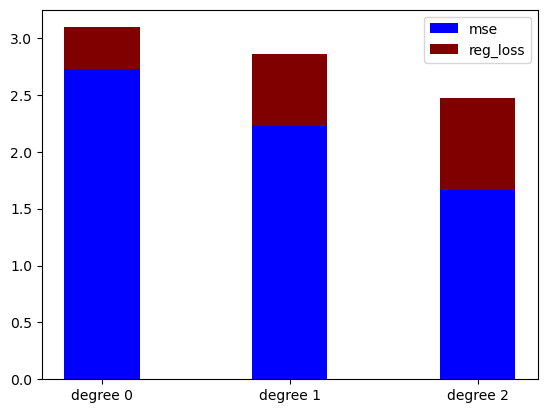

vegas-34
loss [0.3923738873630667, 0.6916649959109625, 0.8949803878009164]
mse [2.3799644402412947, 1.9566392014317946, 1.5373241387170462]


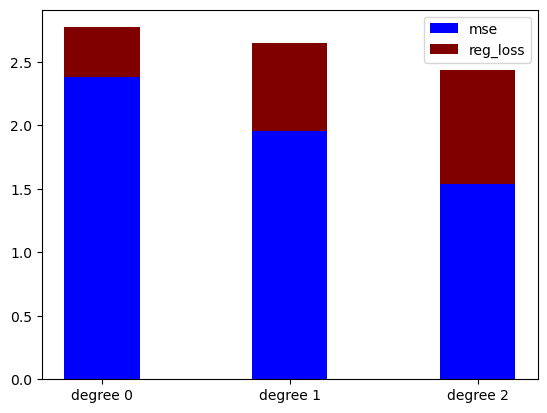

vegas-35
loss [0.3946360714099231, 0.7194097976863979, 0.9482024856155022]
mse [1.8109517332725467, 1.5621582077086222, 1.2649252661008206]


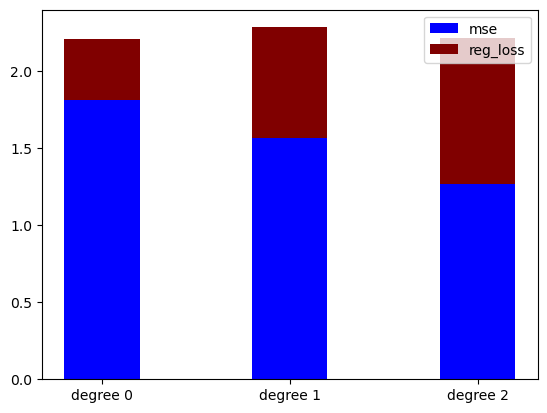

vegas-36
loss [0.37544361952681377, 0.636112418184997, 0.7629176369020776]
mse [2.247148444291579, 1.6780022145249633, 1.057047829883993]


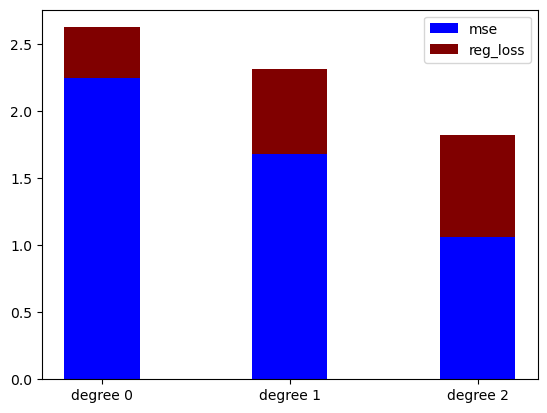

vegas-37
loss [0.3061855637915135, 0.5696267536596318, 0.7262953565860685]
mse [1.062524786987131, 1.005005876102162, 0.8287967834975335]


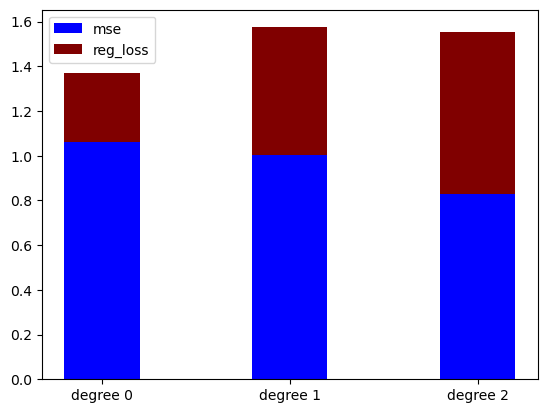

vegas-38
loss [0.326998283352694, 0.5649913555864735, 0.7130765430621473]
mse [1.7039691433835968, 1.334564226774813, 0.9710680557904049]


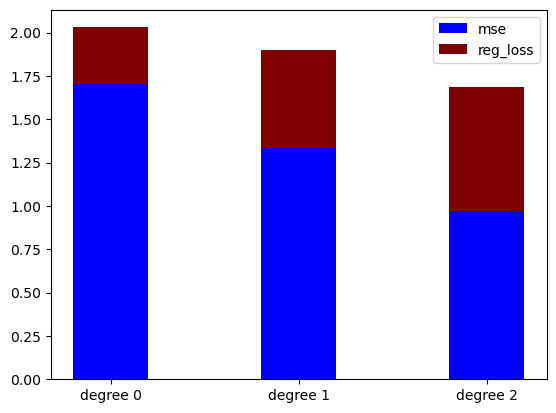

vegas-39
loss [0.3540556078824518, 0.5872673798514368, 0.7109066626906592]
mse [2.7943158916076585, 1.9965558113139399, 1.2653319376873826]


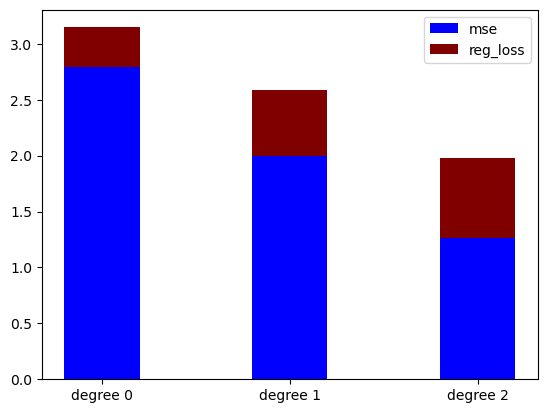

vegas-40
loss [0.3832235039209032, 0.6272902628823414, 0.748140514021745]
mse [2.0487562246257784, 1.4564832974030384, 0.9993460383270073]


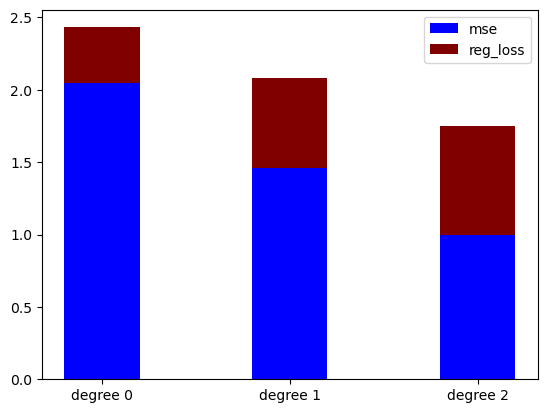

vegas-41
loss [0.38118731370232317, 0.6697469717592903, 0.8792245763722]
mse [1.9211259594356471, 1.5667116532015346, 1.3091292363769862]


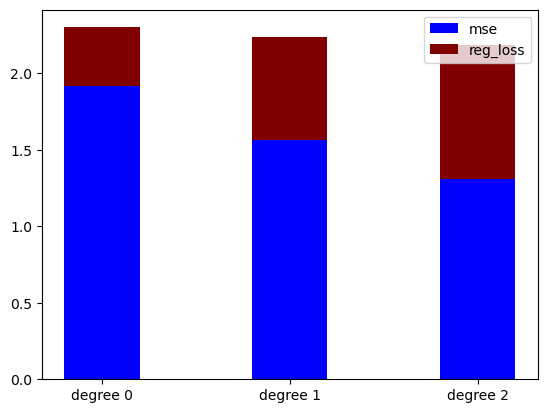

vegas-42
loss [0.3943806391812235, 0.6921346591854135, 0.9481313957109511]
mse [1.6035939584164713, 1.2911330581533975, 1.1856725494623235]


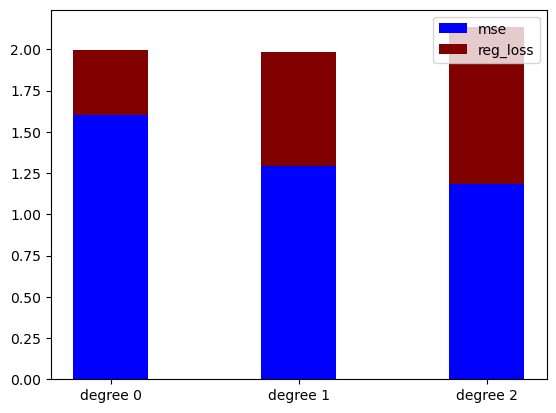

vegas-43
loss [0.3221936354054388, 0.6063042721164728, 0.7801179591132151]
mse [1.3868831176811647, 1.3278388388396363, 1.0176418086633245]


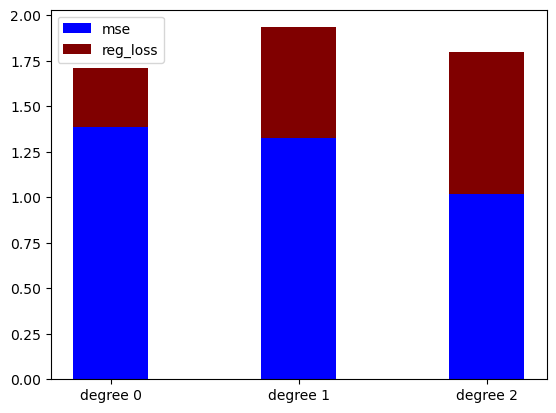

vegas-44
loss [0.3191233467029898, 0.5767432775017299, 0.7207062321140032]
mse [1.7618979672573587, 1.5801745080442815, 1.1846777177648287]


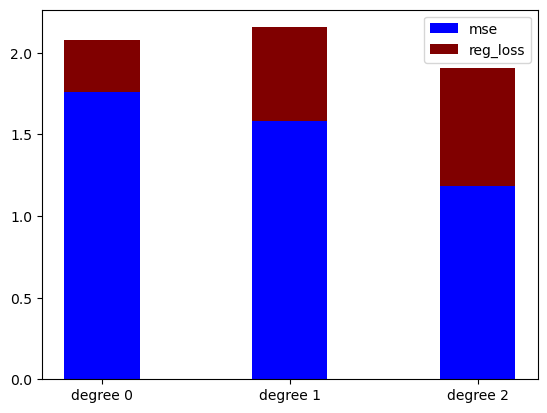

vegas-45
loss [0.3903858341493149, 0.686557297945615, 0.9191316995033205]
mse [2.0497513327405, 1.635558250958462, 1.3904090268866995]


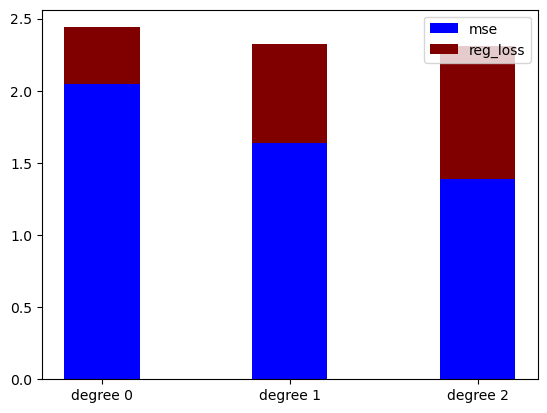

vegas-46
loss [0.40058937809262346, 0.7198019812577744, 0.9225352360028201]
mse [2.2388947443036433, 1.906069425073584, 1.4953479333275113]


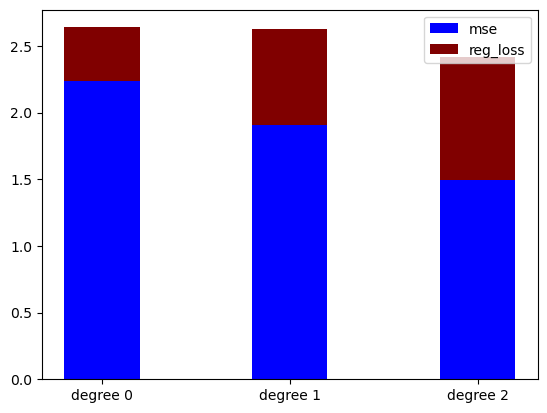

vegas-47
loss [0.36935151516269954, 0.6365858438966892, 0.802281855022466]
mse [1.6189118191375558, 1.2479036685739813, 0.9379205201180143]


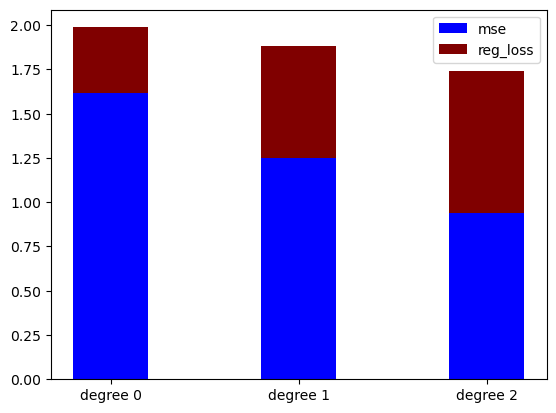

vegas-48
loss [0.3774389093837437, 0.6621666975981327, 0.8142934260311068]
mse [1.8906394210282824, 1.5668922944586867, 1.087292702416108]


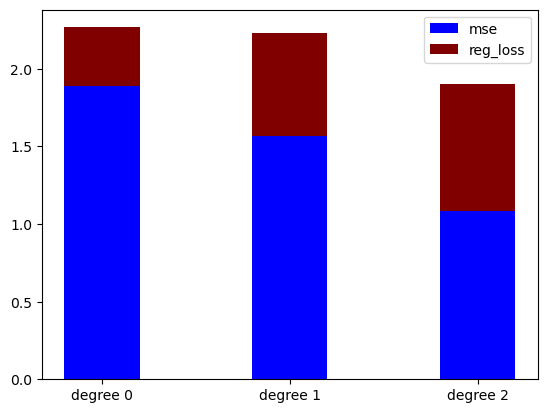

vegas-49
loss [0.3910673488135973, 0.7041883375609501, 0.9779480953479285]
mse [1.4718910363911917, 1.24702207671354, 1.1591736113602615]


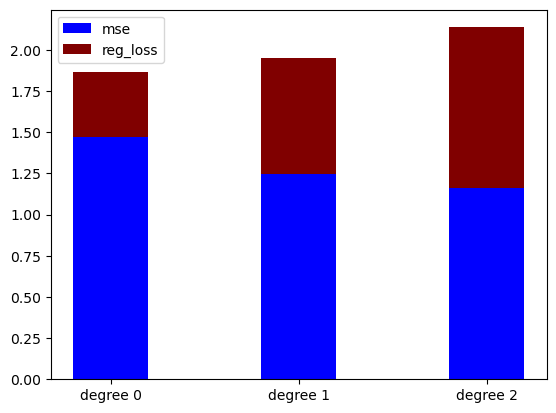

vegas-50
loss [0.3368250669263959, 0.5479845868087639, 0.6748292612782353]
mse [1.869191399283973, 1.2658953220384994, 0.8471905848223896]


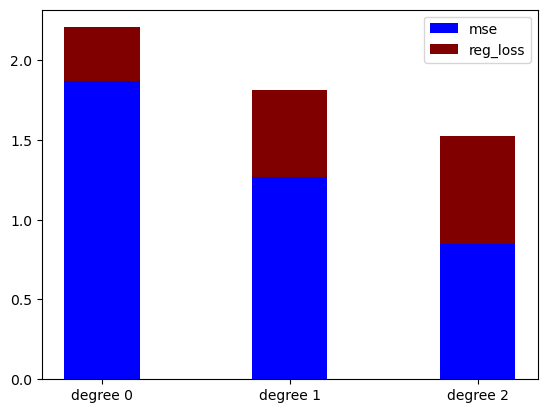

veno-1
loss [0.11906072729204252, 0.17065257146301135, 0.20959793621733855]
mse [0.6190236980581572, 0.2167119698960095, 0.08554693803889328]


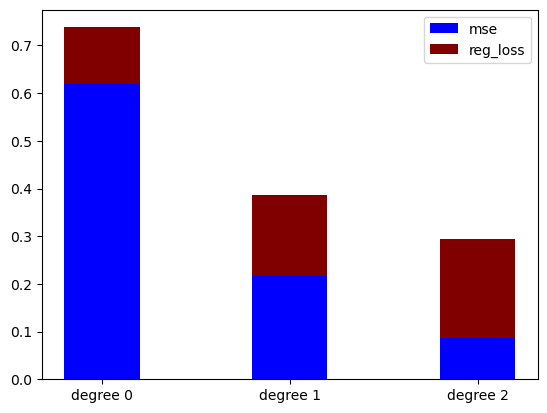

veno-2
loss [0.08675940887007112, 0.09567271079007332, 0.09334383698307465]
mse [0.3818719276562592, 0.08452546746531969, 0.01578497567409425]


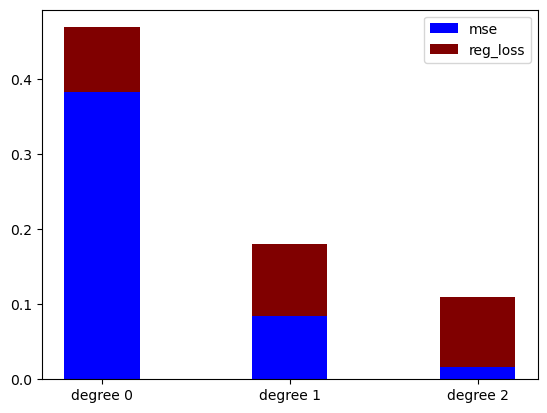

veno-3
loss [0.10288776511705303, 0.13596803644929759, 0.15570897535432274]
mse [0.4503240119539134, 0.11701357904252196, 0.022357147804011764]


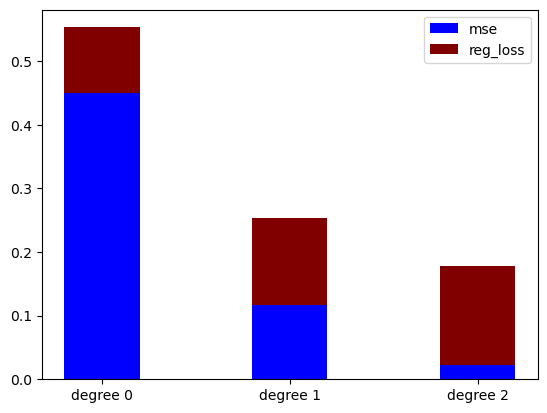

veno-4
loss [0.12255602207128147, 0.15467261944318317, 0.1624619041653401]
mse [0.45224062488184513, 0.1354395640590001, 0.03443085888297705]


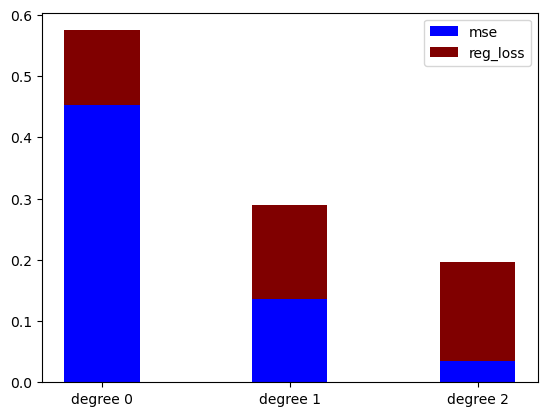

veno-5
loss [0.10696329134119997, 0.12876007779732257, 0.1265644676442543]
mse [0.3979010348785991, 0.1031981835890181, 0.019273825927071882]


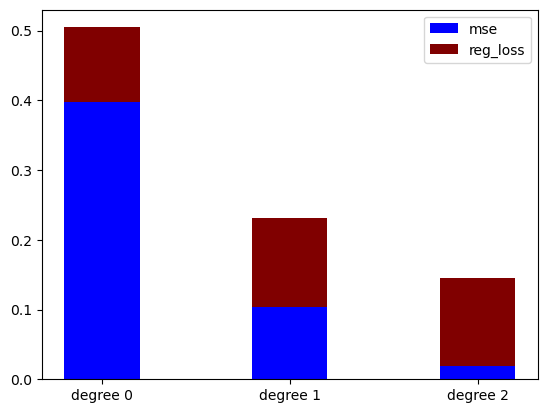

veno-6
loss [0.09458109775595008, 0.11579606062519794, 0.129742023716926]
mse [0.3386641813542554, 0.07118462138761732, 0.01421396917363206]


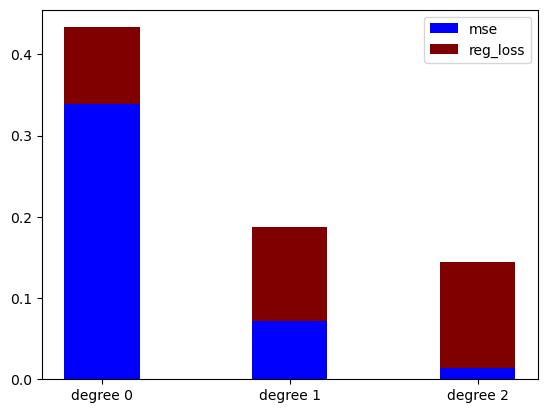

veno-7
loss [0.08712602432134134, 0.0936141748733191, 0.08722292245885921]
mse [0.42224965913772083, 0.09161014057417088, 0.013573943406806876]


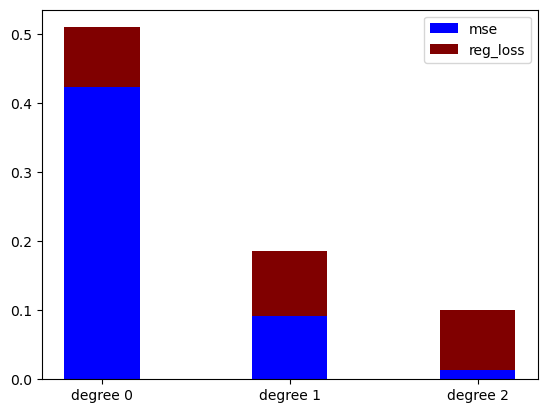

veno-8
loss [0.09928309071358771, 0.1426806941634761, 0.15479599897103946]
mse [0.17045324703998047, 0.07428647070135518, 0.029737885965104318]


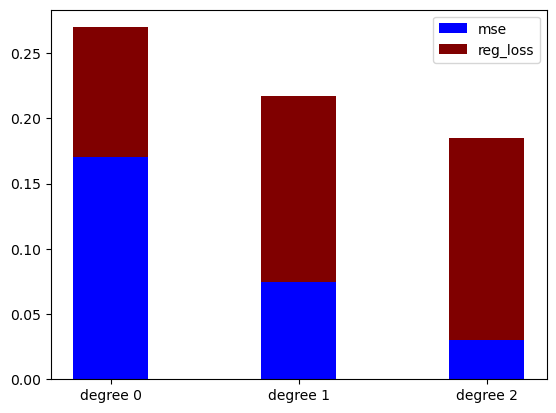

veno-9
loss [0.11516287711937677, 0.153370711520744, 0.1761368093634199]
mse [0.3768849503849598, 0.1008511715759589, 0.02365819392246728]


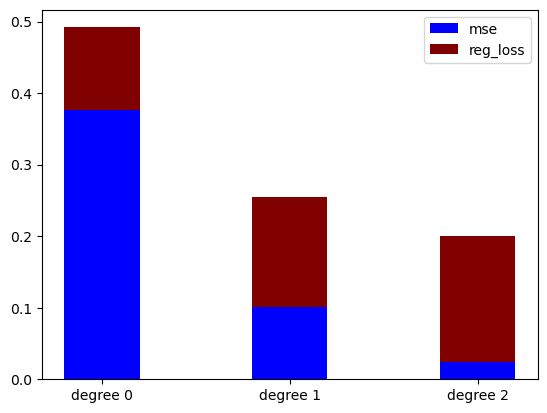

veno-10
loss [0.12645374972586812, 0.18194953208169354, 0.22439712322896688]
mse [0.4866384982630493, 0.14270064665781318, 0.04901514069585651]


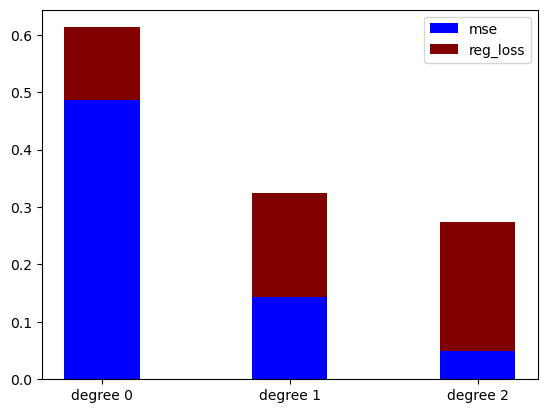

veno-11
loss [0.10331491070320534, 0.1250623281840857, 0.12709617421438868]
mse [0.42417403252060315, 0.10817983029996275, 0.015054505305487813]


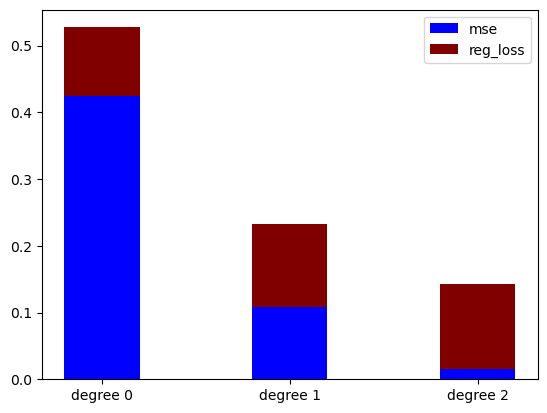

veno-12
loss [0.11522814001037947, 0.16037451949000428, 0.1823341800279938]
mse [0.34761205379289706, 0.11627749703436166, 0.029175957572291304]


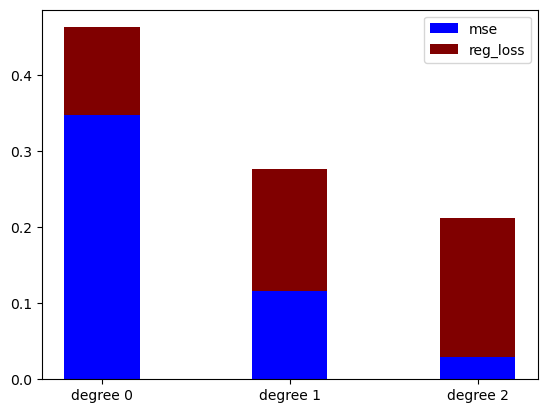

veno-13
loss [0.11013380812853311, 0.15861562769974435, 0.20067713853675961]
mse [0.4516267275801947, 0.12111149141168506, 0.0448757157298322]


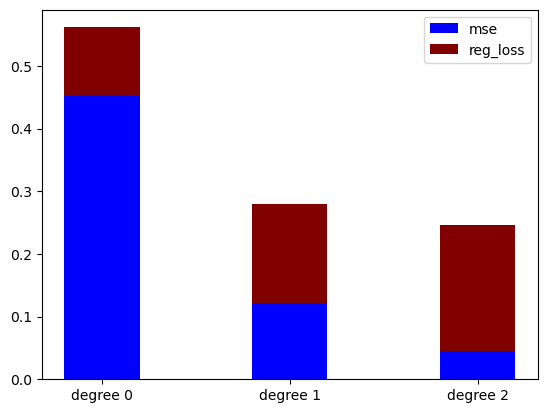

veno-14
loss [0.10778852870774498, 0.140164948802548, 0.16142895028008197]
mse [0.443634776558176, 0.10844230568842222, 0.026951403930320986]


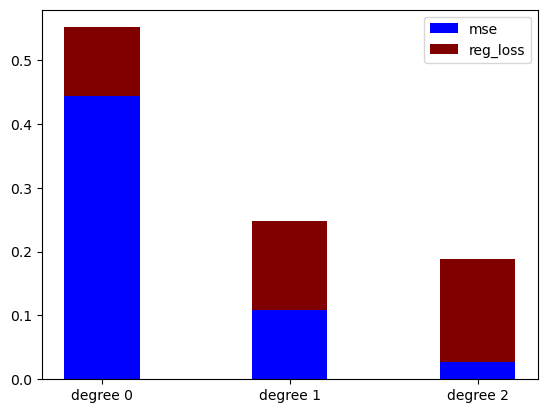

veno-15
loss [0.11114559034505148, 0.1457283807240163, 0.17199675189815028]
mse [0.6226919201102784, 0.14229481741770764, 0.02846234371011713]


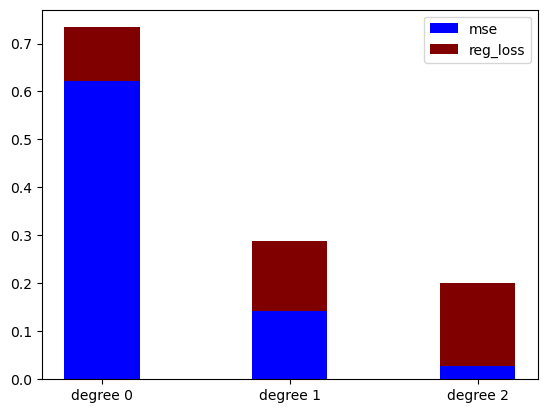

veno-16
loss [0.10438390372012413, 0.1317963875820517, 0.13662059984052952]
mse [0.4121831213757625, 0.11642558124268934, 0.02472663837986482]


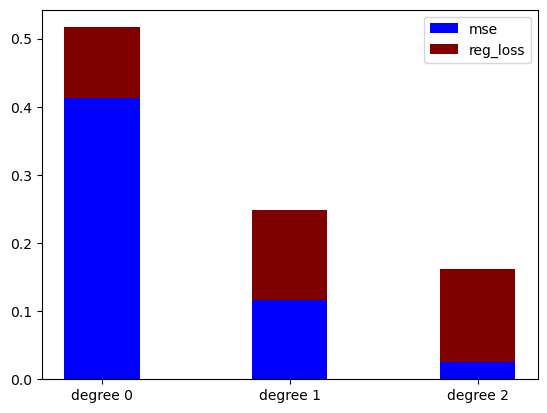

veno-17
loss [0.11660761289613764, 0.1676480793726418, 0.20597124535380856]
mse [0.4077984450949557, 0.11672331727827794, 0.037416796550800824]


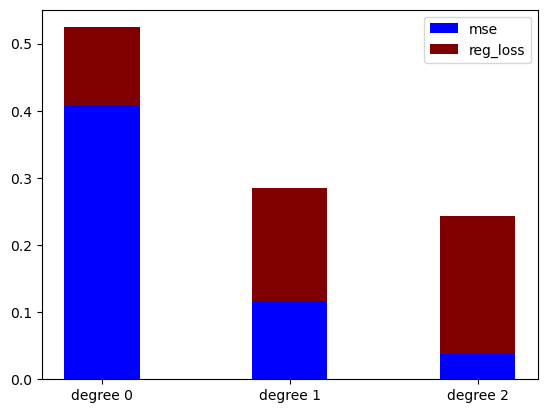

veno-18
loss [0.11525476404833548, 0.14442264409450298, 0.1532987489934334]
mse [0.4249023527995051, 0.10581887987560565, 0.022323571477386204]


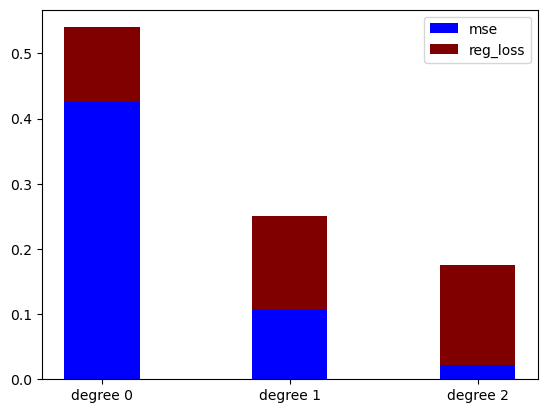

veno-19
loss [0.1231838481559682, 0.16293868046943966, 0.18323887277070278]
mse [0.4523235313370771, 0.12485030334490793, 0.037218984454827866]


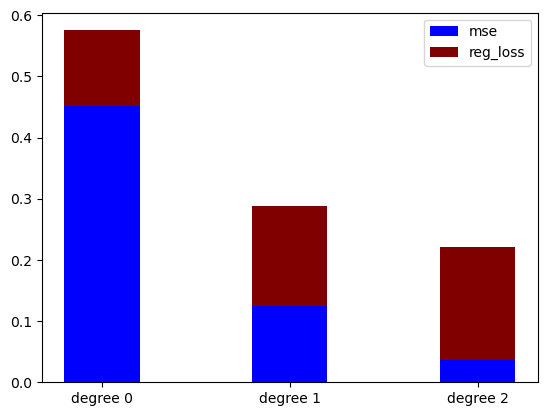

veno-20
loss [0.11396595000367389, 0.15295685820468585, 0.1714909723215348]
mse [0.39479748731388015, 0.1152770107420648, 0.025187299413978105]


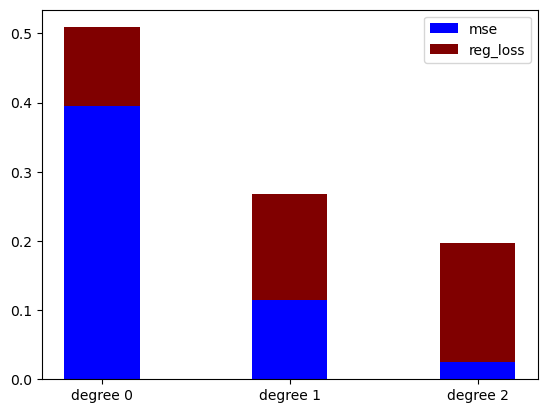

veno-21
loss [0.11858720690765841, 0.15854253485256245, 0.185473731874516]
mse [0.4013644019252051, 0.10507278615073586, 0.03354435942611774]


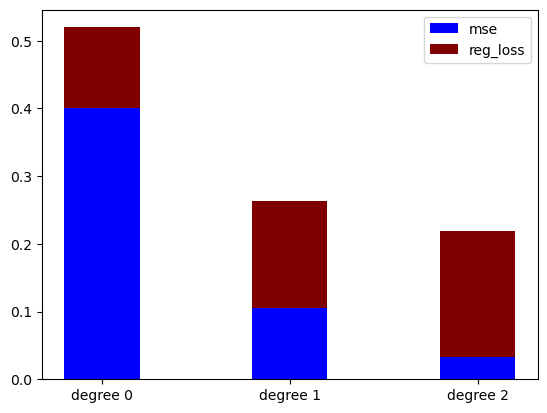

veno-22
loss [0.12037677137788268, 0.15980310267541986, 0.17721661337613773]
mse [0.4377692986267471, 0.13081628588097471, 0.03203199638812399]


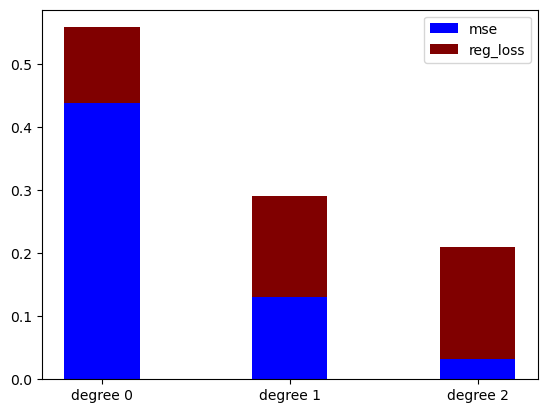

veno-23
loss [0.10248894700681477, 0.12812074293799966, 0.1312751592948566]
mse [0.4151838987533906, 0.1150735338541278, 0.02295994847816615]


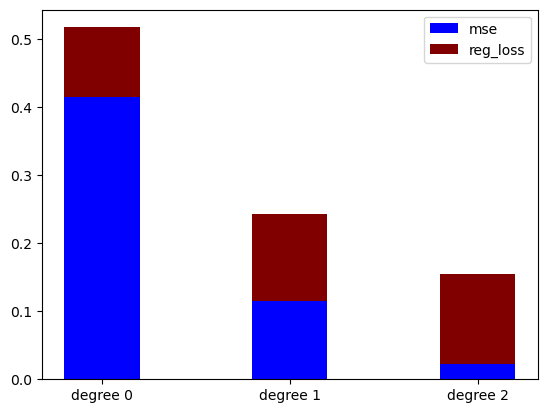

veno-24
loss [0.11324132933145498, 0.14819874314061346, 0.15690189640850047]
mse [0.40511583346733887, 0.12235728787389781, 0.024737347892249798]


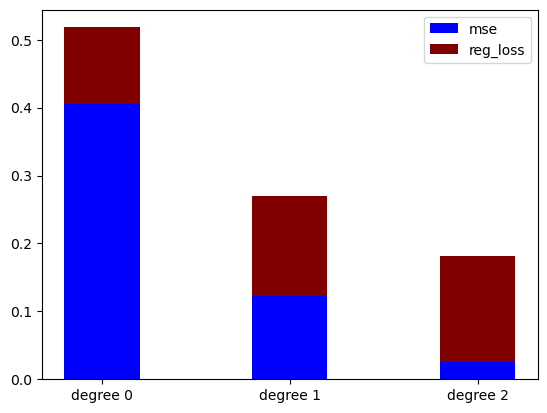

veno-25
loss [0.1177649528780169, 0.16839770746406527, 0.190577604864518]
mse [0.39289550015304275, 0.16726532929477925, 0.047866809980458204]


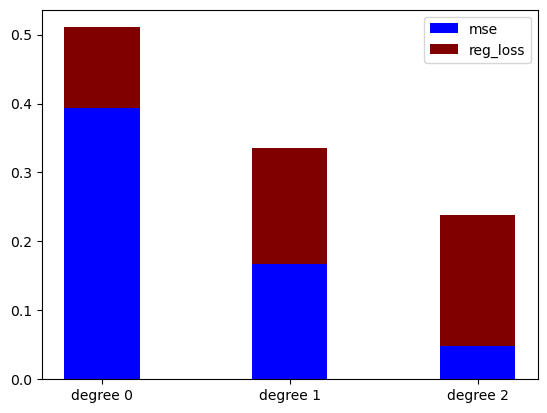

veno-26
loss [0.11653082071624882, 0.15375718775771086, 0.17133205977939325]
mse [0.43484829971727995, 0.1214088244187211, 0.025395381620010572]


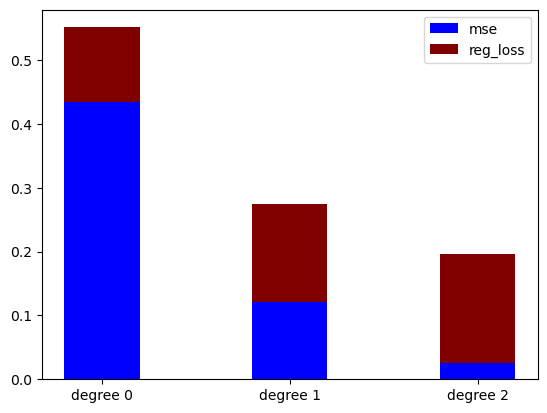

veno-27
loss [0.12245034437325669, 0.16117427337186127, 0.16324754808055542]
mse [0.38393557650643073, 0.13007485638830554, 0.03073264406107105]


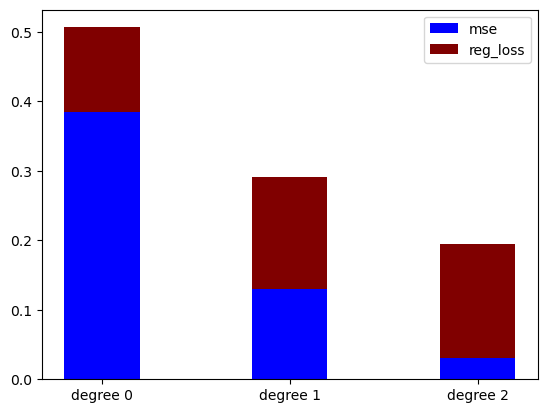

veno-28
loss [0.09072242273883535, 0.12700918980886153, 0.1393577767153332]
mse [0.20131623168798093, 0.07835212107827487, 0.02563214118100504]


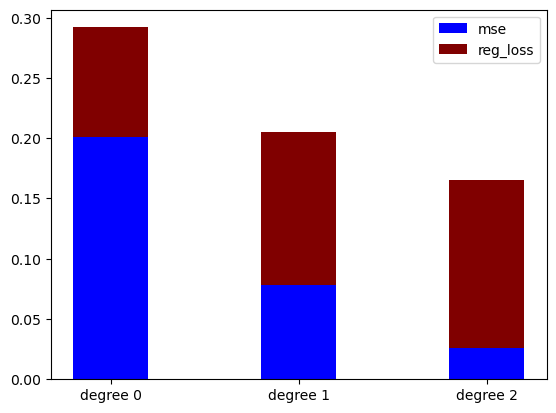

veno-29
loss [0.12493179178673704, 0.16871232869374464, 0.19676106150718561]
mse [0.5637490061994234, 0.16127035546951704, 0.043690208240350976]


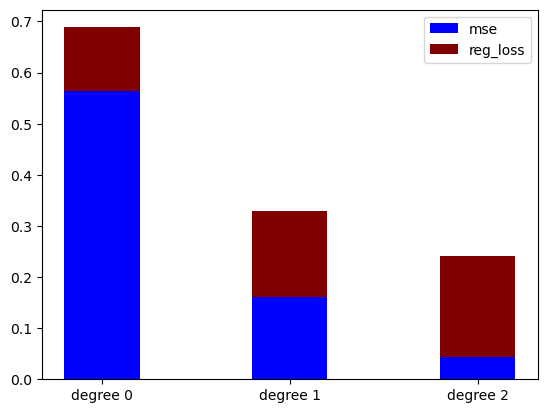

veno-30
loss [0.11487254011323211, 0.1477247171262095, 0.1650638399726746]
mse [0.45042527545089717, 0.11632166381869151, 0.024486072161170668]


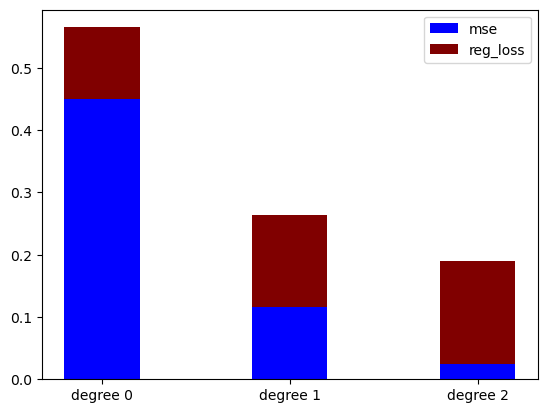

veno-31
loss [0.11101778961779687, 0.15352680818877215, 0.18630203087092673]
mse [0.30013396998333247, 0.09374805018132325, 0.03709707182744084]


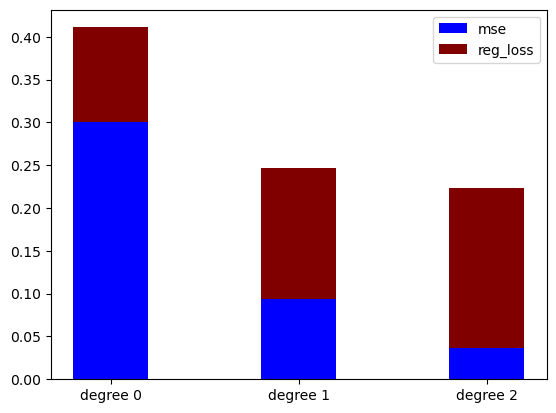

veno-32
loss [0.12205155536908026, 0.1741335715118434, 0.20345588635382195]
mse [0.42270776420617207, 0.14190105538465878, 0.03960382219571703]


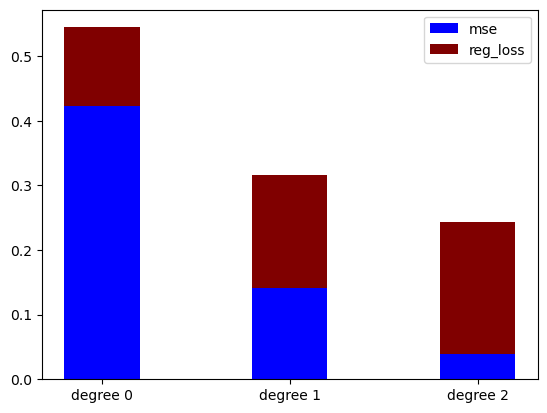

veno-33
loss [0.12645549644150647, 0.16550544621294053, 0.18252016598176002]
mse [0.47888390263238956, 0.1399913300141873, 0.03415992856202228]


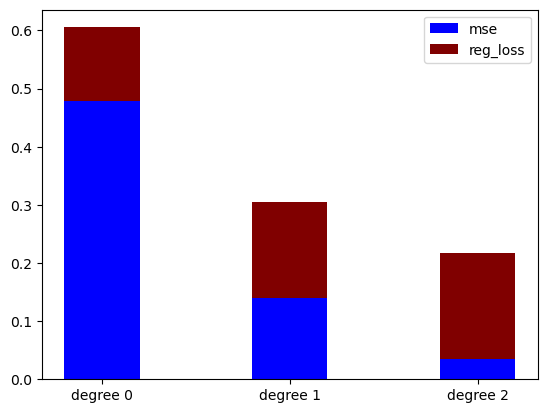

veno-34
loss [0.12151877691392042, 0.15502505586270657, 0.16351393192839234]
mse [0.5037565805010915, 0.1457353510827644, 0.030020622594045743]


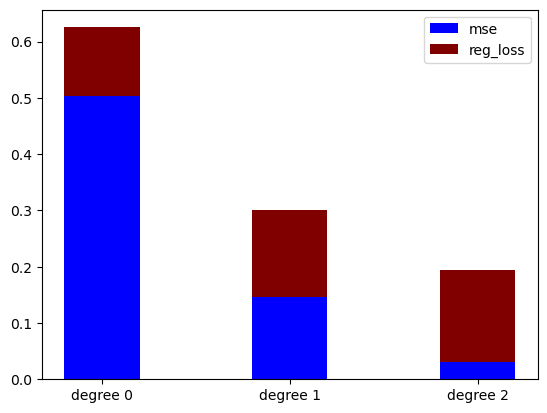

veno-35
loss [0.11208385583057759, 0.15458032709976482, 0.16972537702289447]
mse [0.39303424327344844, 0.1259303418845384, 0.03189329576820616]


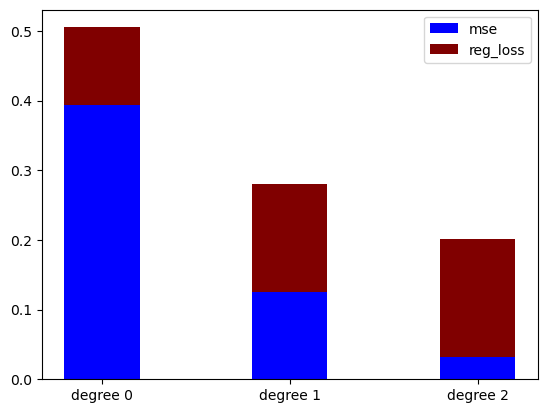

veno-36
loss [0.09236283069133577, 0.12753292039587857, 0.1532285005215911]
mse [0.2665538187010295, 0.07384294129590764, 0.02049519021325364]


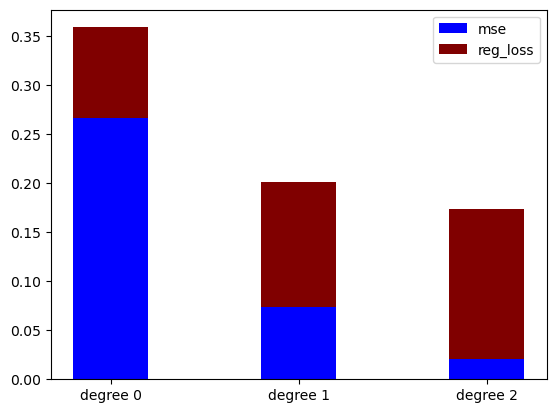

veno-37
loss [0.09994854339108533, 0.1291589046218978, 0.1545842500196697]
mse [0.3533109354621711, 0.07669265398422194, 0.014927244091223785]


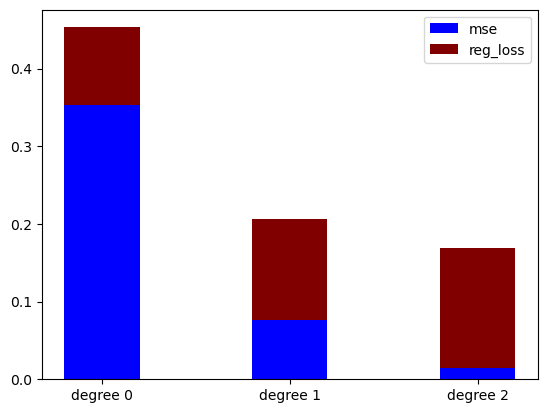

veno-38
loss [0.11724747299622268, 0.15985631018367638, 0.1861904478601496]
mse [0.43218558068801055, 0.11870383337766348, 0.027860302651558037]


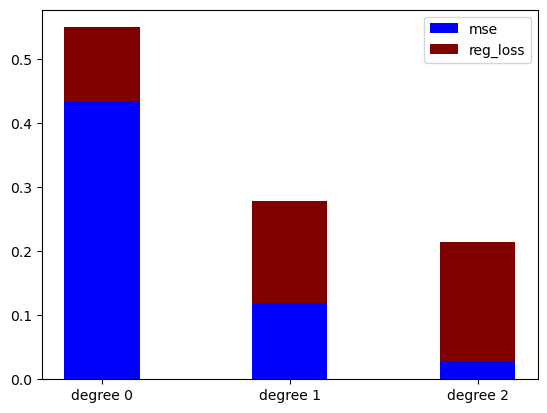

veno-39
loss [0.12356117515934013, 0.1709533347762341, 0.19672404334369104]
mse [0.4507335991761905, 0.1362389465739345, 0.04276368636951584]


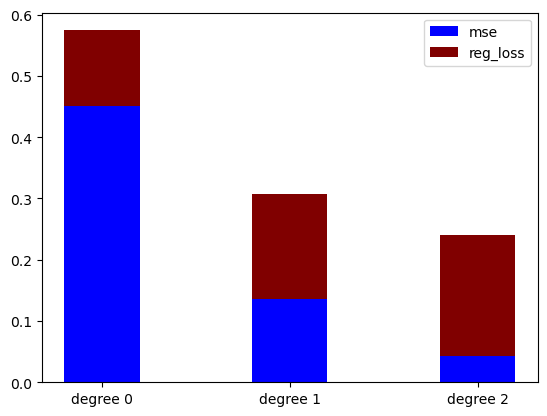

veno-40
loss [0.11503061211851083, 0.1639248512740758, 0.1868797813294669]
mse [0.40924409817778606, 0.1312067204817212, 0.030473942326142697]


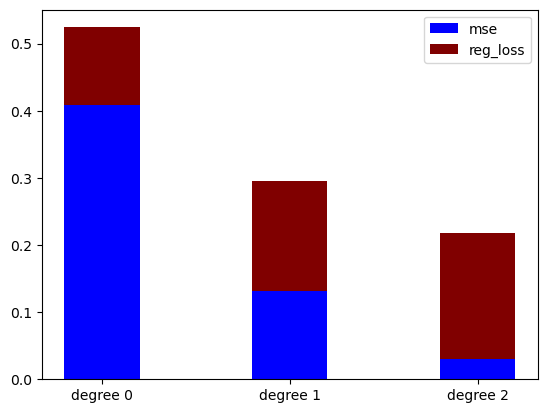

veno-41
loss [0.11970268000277709, 0.1589791974227738, 0.17595612013857875]
mse [0.43895045353020545, 0.12798123199871467, 0.02910994916465217]


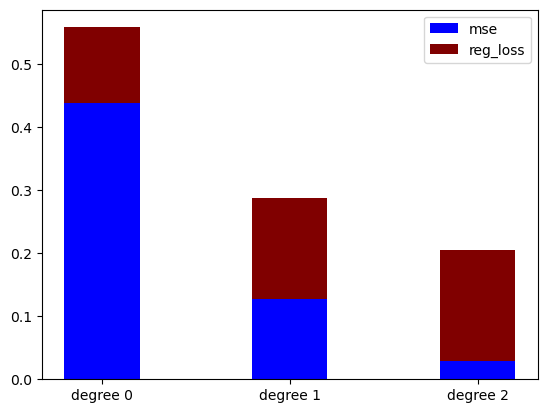

veno-42
loss [0.11971990463717078, 0.1547264459316433, 0.17081660038994123]
mse [0.4614095782014675, 0.12719313582295647, 0.02508700104398782]


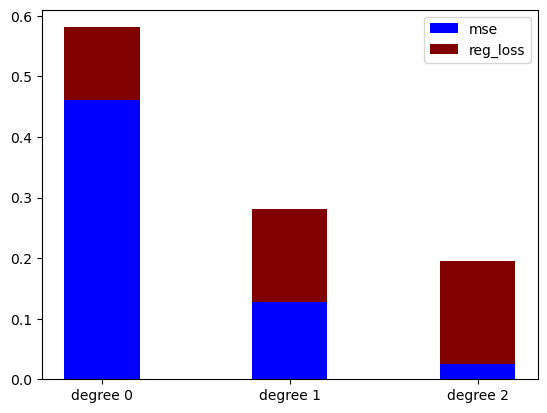

veno-43
loss [0.12235787466472779, 0.1742401252129357, 0.20705318335640688]
mse [0.5079588485192094, 0.16434171912438664, 0.05126013930323207]


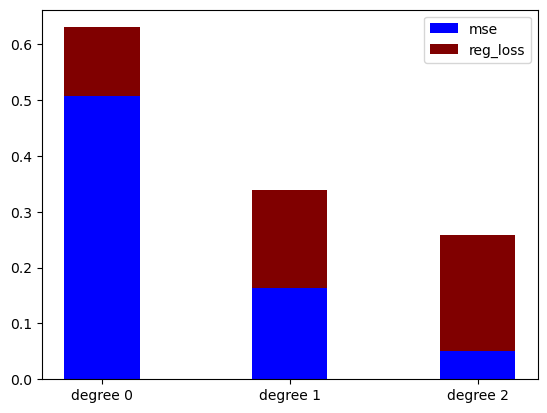

veno-44
loss [0.11165652129187538, 0.14172646170772302, 0.14961440883262275]
mse [0.35588412128807956, 0.09979276350026535, 0.021693589422417264]


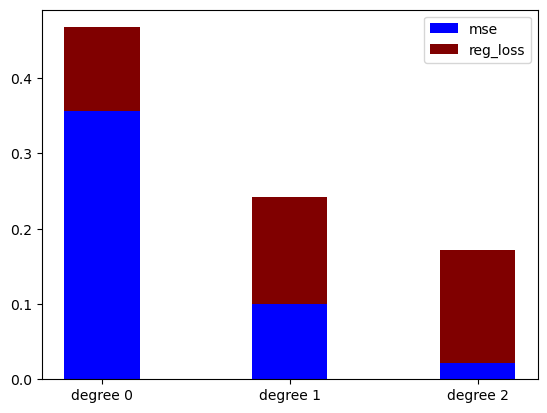

veno-45
loss [0.12820697569807493, 0.16820585315237085, 0.18511627611367168]
mse [0.5579056562395835, 0.15530503860695086, 0.0388293111678504]


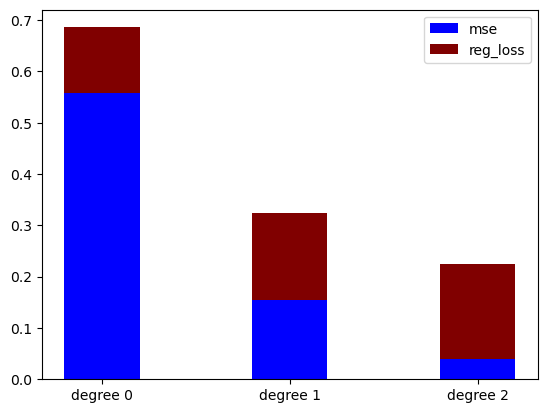

veno-46
loss [0.09968725937082107, 0.1263904308867941, 0.14056344358448694]
mse [0.38695954580570446, 0.09419938812839548, 0.016996796845528375]


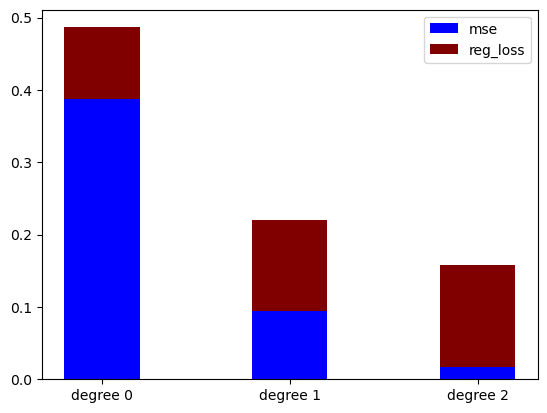

veno-47
loss [0.10719110142341792, 0.138570210975289, 0.13805578871439303]
mse [0.29655583539085445, 0.09168974295065961, 0.018801341917938967]


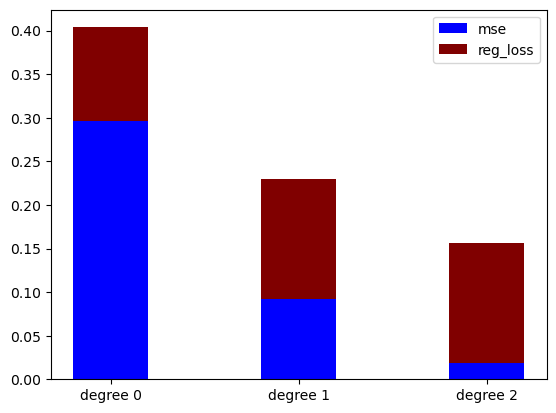

veno-48
loss [0.10961888961406006, 0.15225941690238504, 0.1837615251961564]
mse [0.40178981686079107, 0.10692964271312538, 0.028672523024354885]


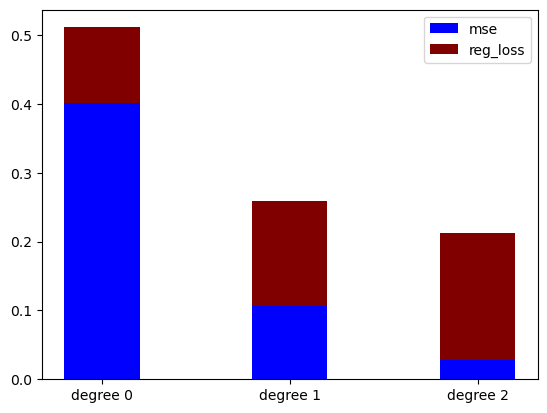

veno-49
loss [0.09832503406708143, 0.12455969596130326, 0.13527619475282404]
mse [0.3736256410379892, 0.09957917478596737, 0.017373440554396682]


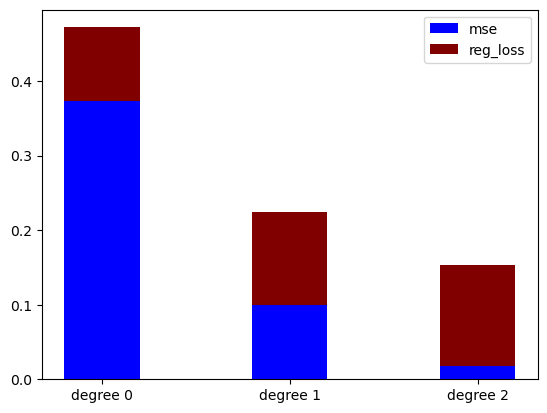

veno-50
loss [0.12605770359025198, 0.17923663044403812, 0.21448760856054128]
mse [0.4860058698753728, 0.14691057156203735, 0.042313509360839316]


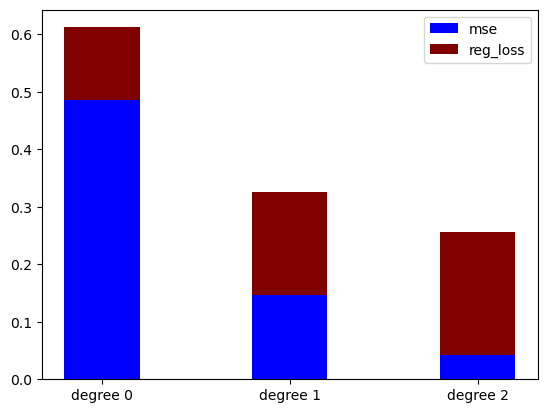

westwood-1
loss [0.1493783216328194, 0.25015956331461814, 0.3365554941231445]
mse [0.3417037886684677, 0.21182648397378645, 0.16892614184773036]


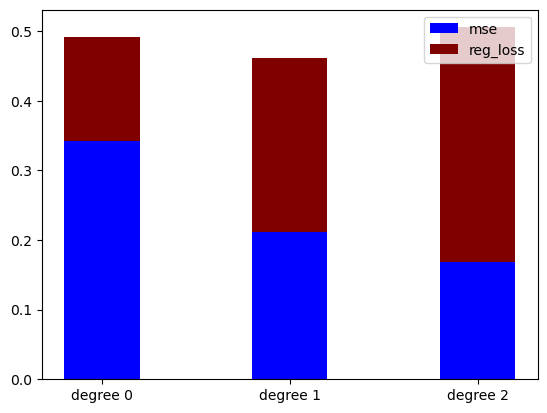

westwood-2
loss [0.15253830938353483, 0.23612316972578246, 0.30333562631966493]
mse [0.3899034381629316, 0.18521220076868675, 0.11659089680971636]


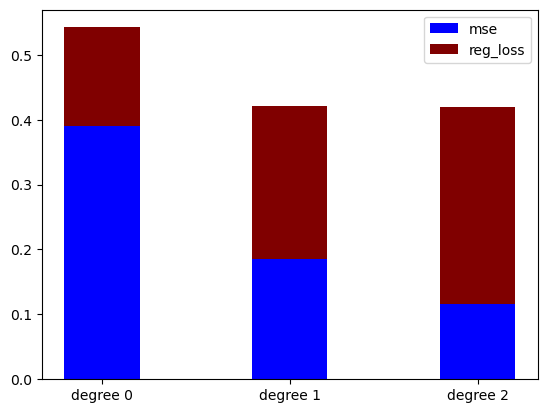

westwood-3
loss [0.16122878629444343, 0.2573617748965791, 0.33745496640925127]
mse [0.4465290198070422, 0.26368930391179657, 0.19938554380534035]


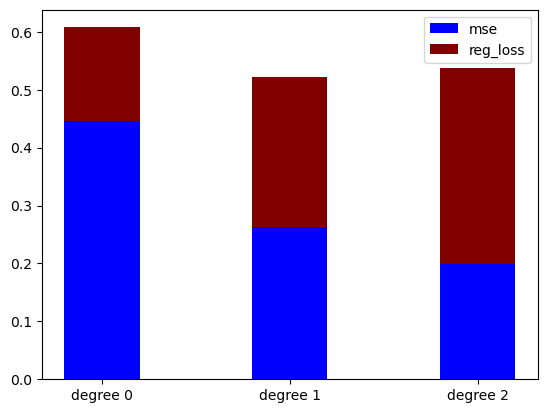

westwood-4
loss [0.16881270128440687, 0.2942485202039878, 0.4046056190845235]
mse [0.4916897132301496, 0.3713765172095568, 0.32008924764548136]


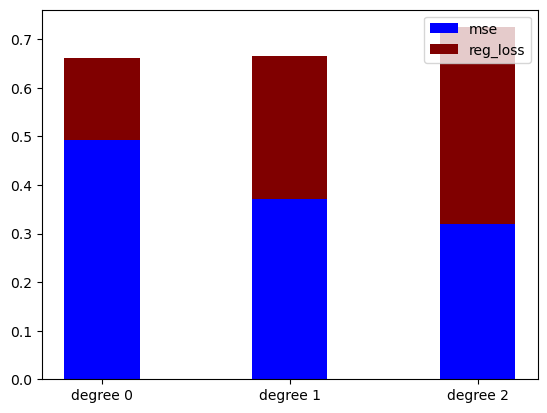

westwood-5
loss [0.15773536523621165, 0.25905993403178995, 0.3529072685419353]
mse [0.43162426139080734, 0.26093729725870796, 0.2164614891081805]


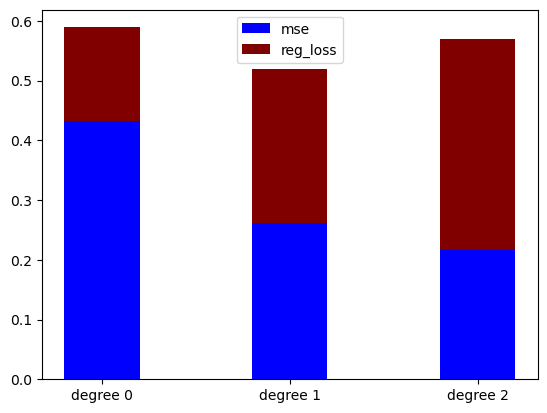

westwood-6
loss [0.15012365923030624, 0.2329031738550809, 0.29973260095513665]
mse [0.6202317416217836, 0.3292936557762133, 0.22248840083381086]


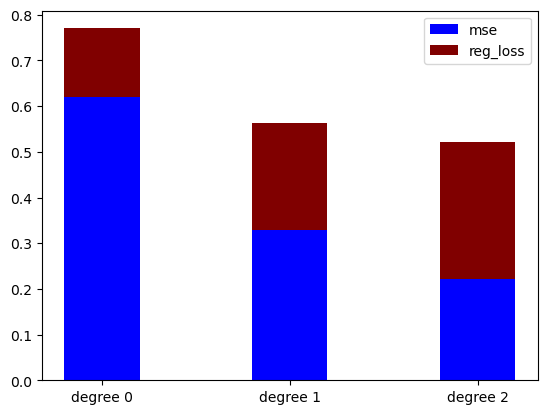

westwood-7
loss [0.07210068416823506, 0.10385504604270301, 0.13516638606807635]
mse [0.13308929279617518, 0.03872132774225709, 0.01879110895677179]


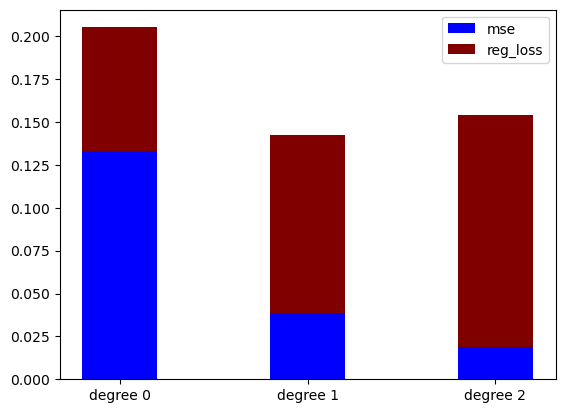

westwood-8
loss [0.16334801048494063, 0.25883815650804426, 0.3327770539043914]
mse [0.5280337447216762, 0.2965635314201338, 0.20672759260679657]


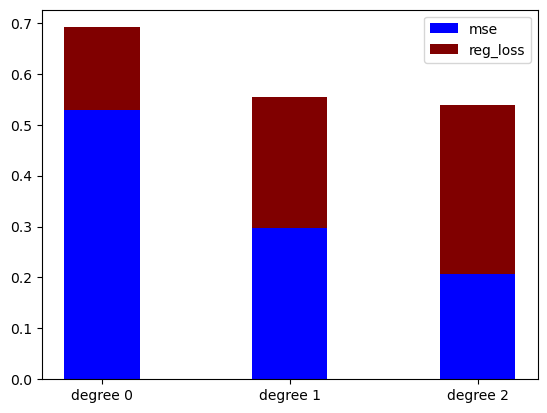

westwood-9
loss [0.164504088286342, 0.2808953828320865, 0.38924169312436946]
mse [0.3680476799458527, 0.24555617352874243, 0.21313252869619906]


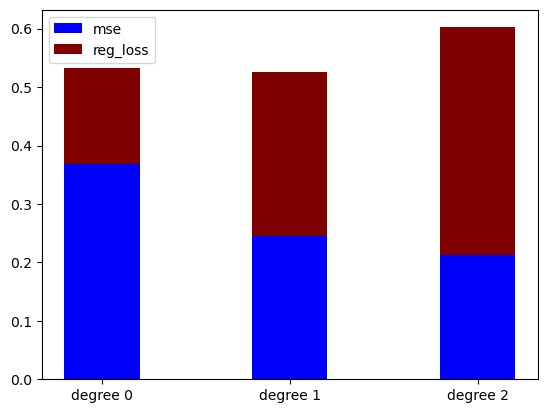

westwood-10
loss [0.1578829392834638, 0.2580100295967639, 0.34454590702055826]
mse [0.4437281589020147, 0.2712193567901026, 0.21105054166817555]


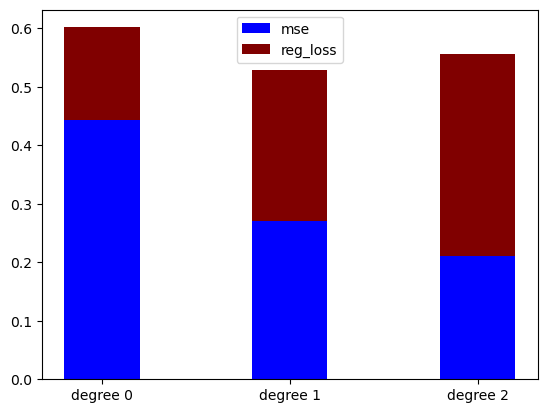

westwood-11
loss [0.15980127260415208, 0.2588748125917727, 0.33337376573905364]
mse [0.6251396391959557, 0.37837933958323755, 0.2626287967680028]


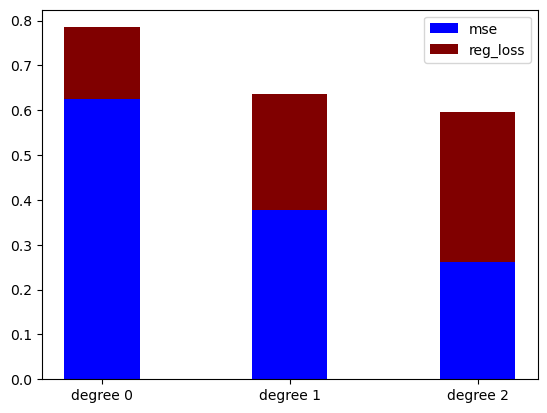

westwood-12
loss [0.1483012654425295, 0.23164160420312882, 0.3068841553909882]
mse [0.3577676359556197, 0.1630959303651447, 0.11664737939799286]


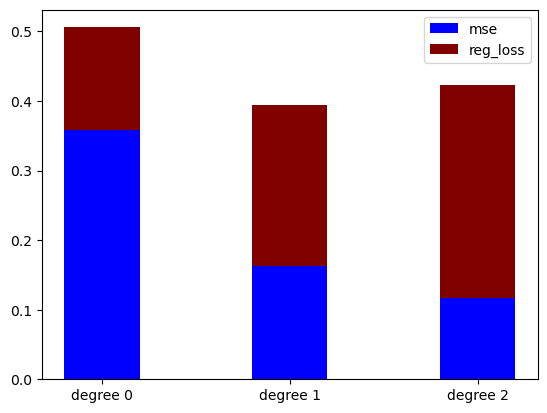

westwood-13
loss [0.06987141592287309, 0.0986470048521439, 0.13056325055206908]
mse [0.1745902985639196, 0.04693412919063316, 0.02413219317602168]


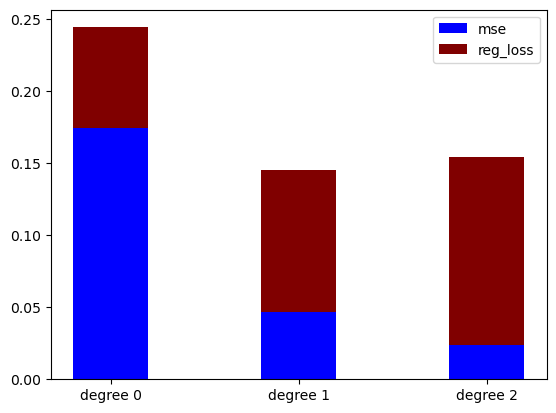

westwood-14
loss [0.15383248485406759, 0.25391354049029574, 0.33312590314736185]
mse [0.5419428778392753, 0.3515640986437961, 0.2597674088573117]


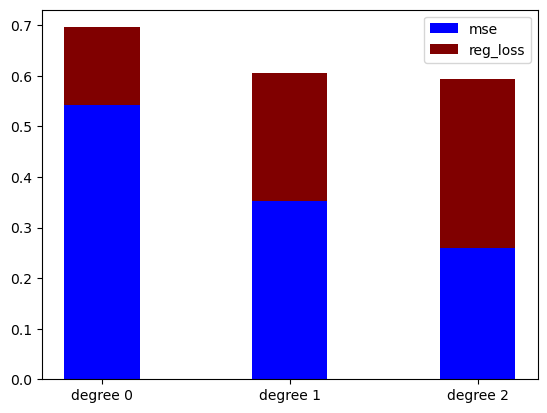

westwood-15
loss [0.15697805268535042, 0.24897098332084666, 0.3233986841546087]
mse [0.5358596284042906, 0.31138097774154944, 0.21951699270901892]


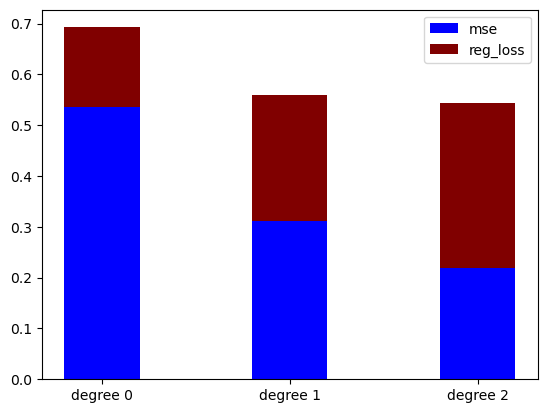

westwood-16
loss [0.1541656344179392, 0.2447727317304217, 0.3199629350432132]
mse [0.7964891521554083, 0.4927029829944466, 0.3713564148834467]


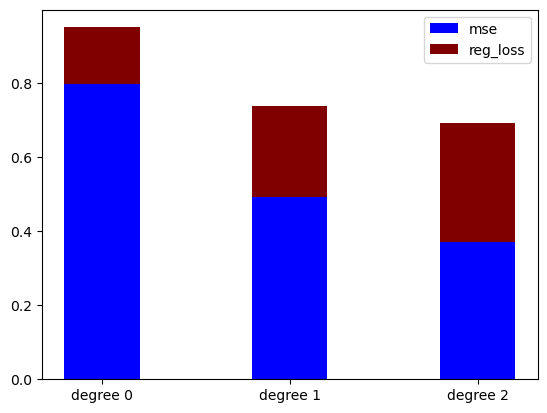

westwood-17
loss [0.15680676847239117, 0.25761077009362254, 0.3492871040330027]
mse [0.5314405204745998, 0.3388007301860675, 0.2829813192237858]


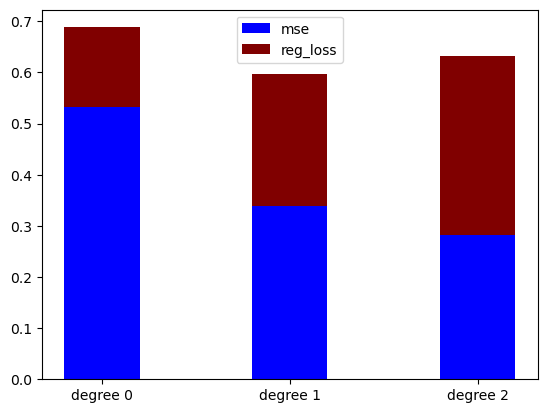

westwood-18
loss [0.15567333043757942, 0.24660456973702138, 0.31874404051175054]
mse [0.5520909373309325, 0.31819514513377567, 0.22785786991305887]


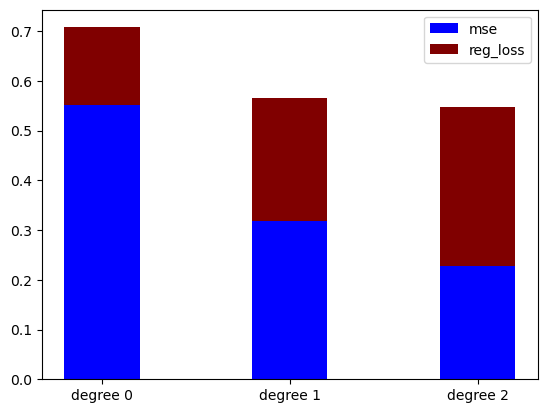

westwood-19
loss [0.06927106538749604, 0.10175523739081381, 0.13327905019979766]
mse [0.1222996715825198, 0.03256185520145577, 0.015206033202891985]


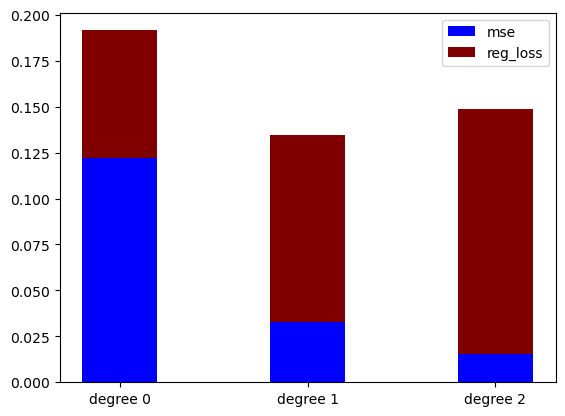

westwood-20
loss [0.1609274244145696, 0.2600321335411224, 0.34144249188085507]
mse [0.6321698770755796, 0.4110496370397238, 0.3158169913226755]


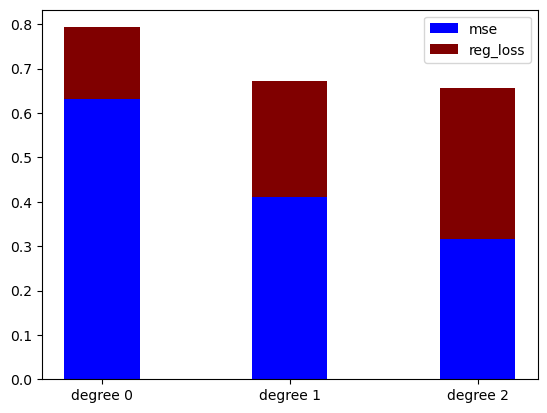

westwood-21
loss [0.1446756190966835, 0.23141430699431018, 0.3056537545123905]
mse [0.5172808290515246, 0.2961464153813095, 0.21599155682536153]


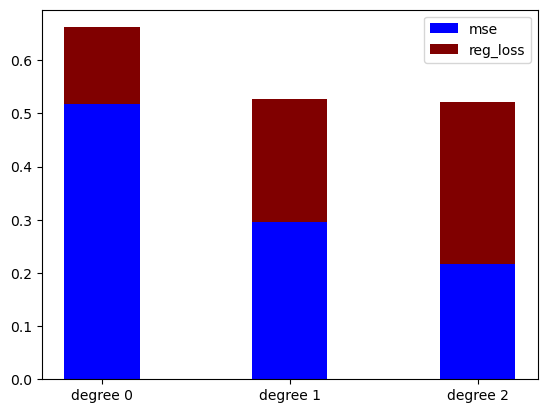

westwood-22
loss [0.1539556310668199, 0.2539968895912563, 0.342510310221879]
mse [0.5429794562109691, 0.3495353499431248, 0.28039556652355974]


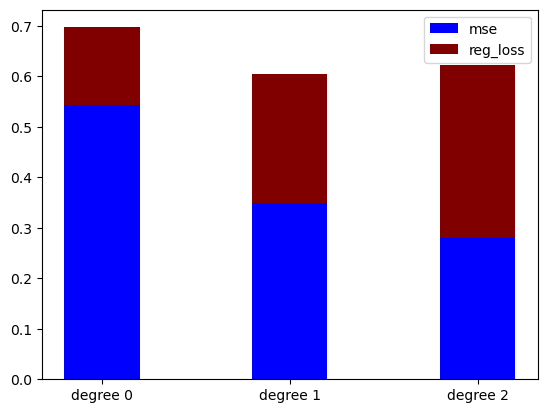

westwood-23
loss [0.14880295358552087, 0.2467392686610198, 0.3390308567185385]
mse [0.3072012022880654, 0.1949389571608899, 0.16859577746624613]


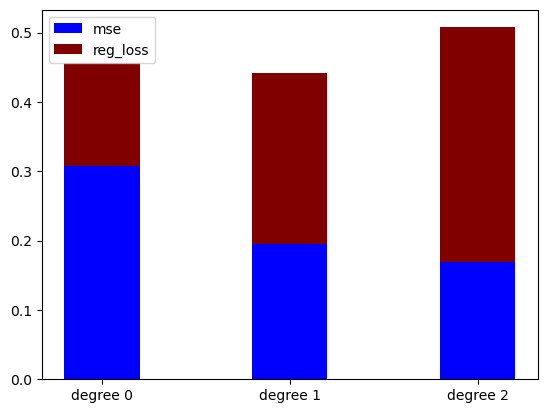

westwood-24
loss [0.1567085423798114, 0.2546123833883671, 0.3334004544885971]
mse [0.4892218754711844, 0.2984977673520625, 0.2166465142828151]


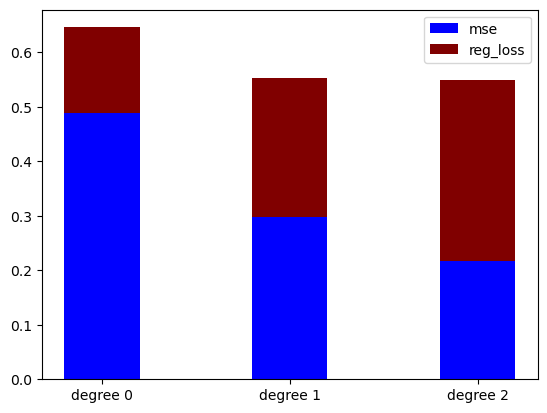

westwood-25
loss [0.14795533119278081, 0.23010583402709908, 0.298021540237158]
mse [0.4377210360322096, 0.21934438989542346, 0.14847035033131945]


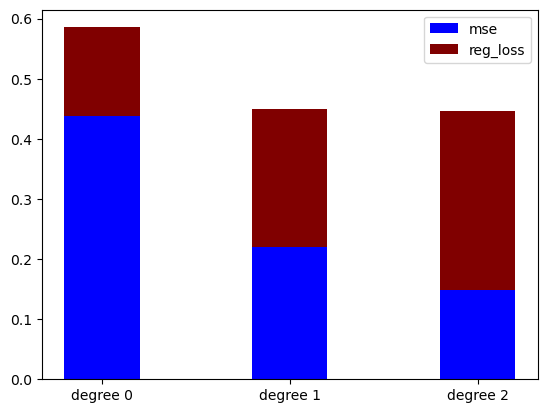

westwood-26
loss [0.1644247161733362, 0.2873346707177582, 0.39436889252672636]
mse [0.5460377612640049, 0.41987181559814085, 0.36639734058714973]


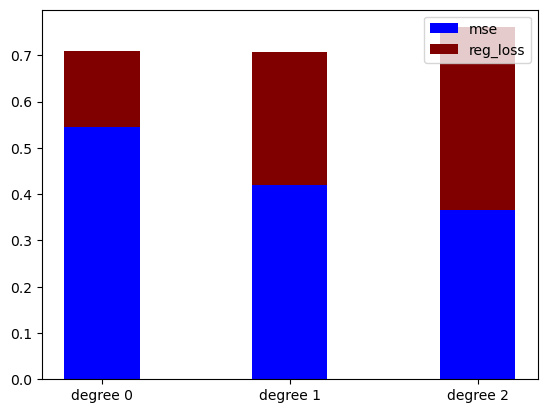

westwood-27
loss [0.15770045892730575, 0.26145225674396316, 0.3476423122999368]
mse [0.3302201277585056, 0.19550381052167337, 0.1459505391900283]


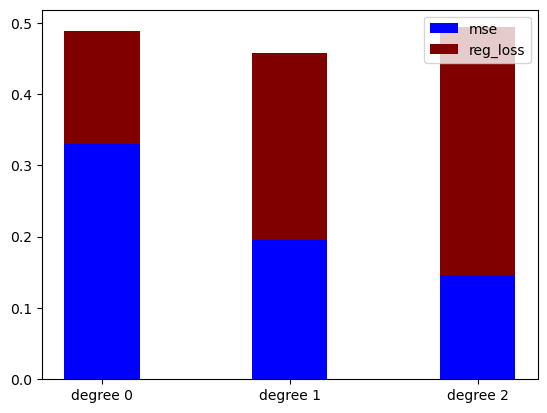

westwood-28
loss [0.1666996591335712, 0.2839981870038909, 0.37805265640691027]
mse [0.4822318508938875, 0.33816652563513816, 0.2706405541419309]


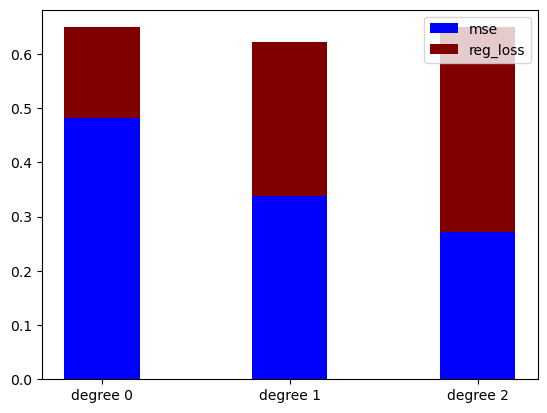

westwood-29
loss [0.15744416701978048, 0.25450456667902815, 0.3283700296572021]
mse [0.6147575612117668, 0.3788676169116393, 0.26944790054307416]


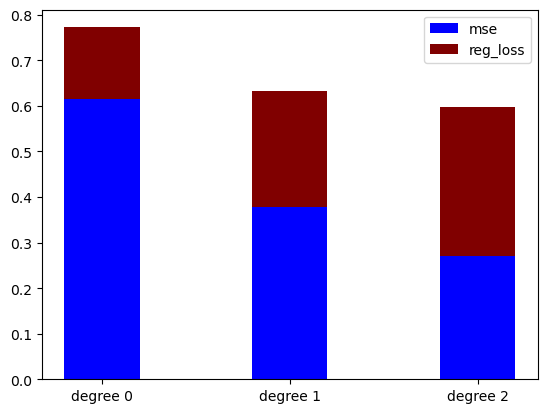

westwood-30
loss [0.13876930350416083, 0.2399581528863602, 0.34764391260307664]
mse [0.20361686487129316, 0.13474200715173715, 0.13067453962718287]


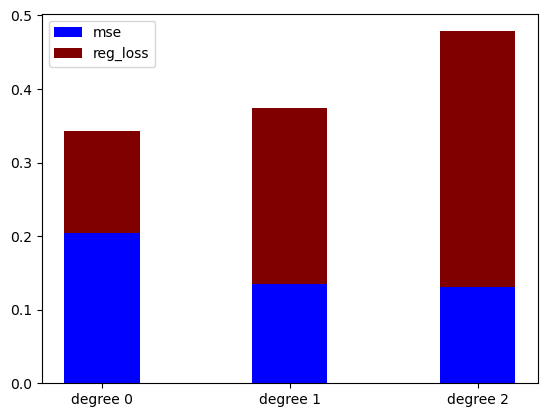

westwood-31
loss [0.15012924079604562, 0.23816391961322966, 0.3135560000287282]
mse [0.5051231068811235, 0.285209209543363, 0.21318909382922824]


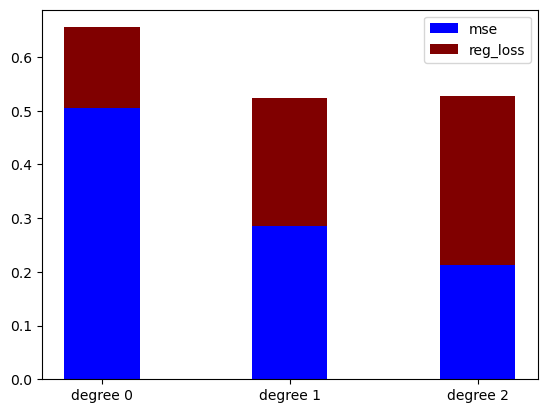

westwood-32
loss [0.15032818774996082, 0.24727608160358971, 0.3325320115428436]
mse [0.273656525613052, 0.1396123140323015, 0.10647672038617051]


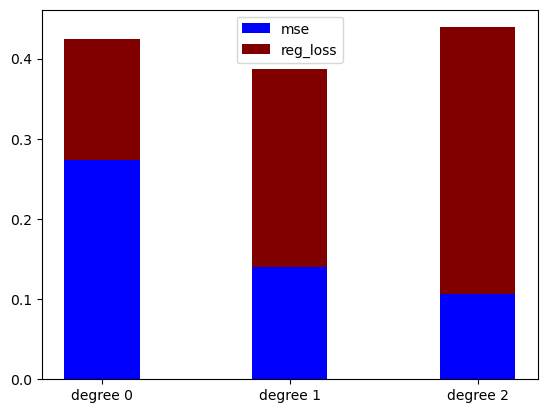

westwood-33
loss [0.16297376269658867, 0.2762896198731694, 0.3836331927027161]
mse [0.45988095934629225, 0.32290556383841834, 0.28922554716822974]


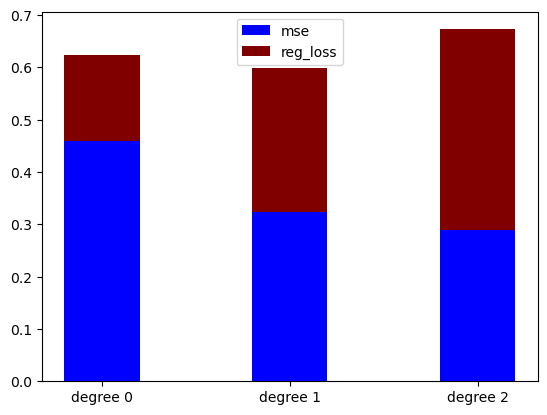

westwood-34
loss [0.13076441412163708, 0.2164254836979851, 0.3029191058610227]
mse [0.16643788835369694, 0.0890602403597356, 0.07972555955238862]


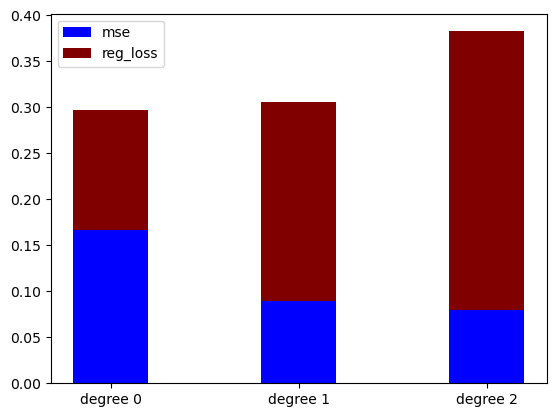

westwood-35
loss [0.15603632410089363, 0.2613856246903324, 0.3504795510193581]
mse [0.5638401456247923, 0.3781851686661063, 0.30861494517492377]


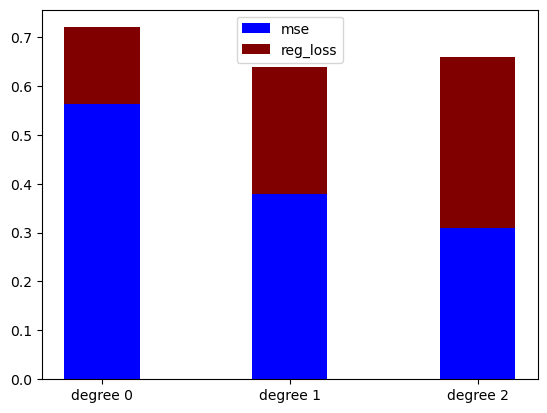

westwood-36
loss [0.14742258440071163, 0.26169828670017, 0.37770399531902016]
mse [0.23652992567299239, 0.17873105406783313, 0.17284994897453693]


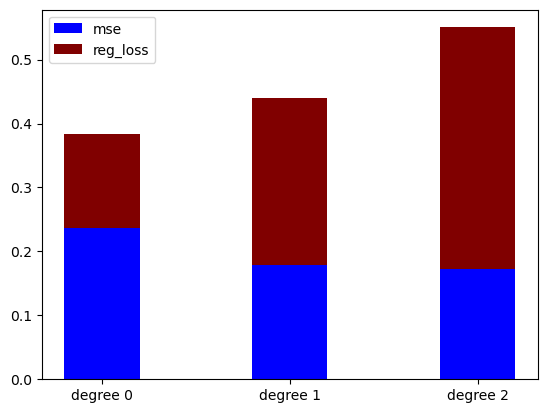

westwood-37
loss [0.14380640883767232, 0.23502781653227853, 0.3187171468404713]
mse [0.22979985823218707, 0.11473251604591517, 0.08947306902915535]


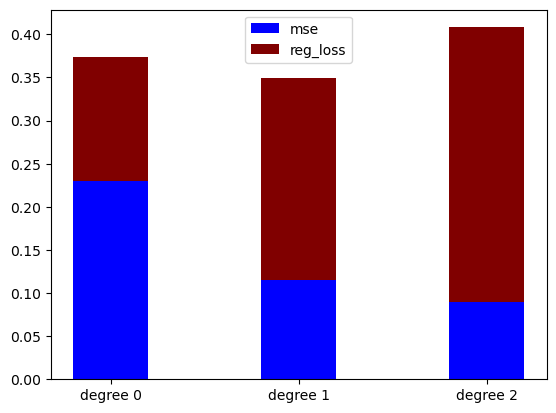

westwood-38
loss [0.14914520107075424, 0.2353936796950047, 0.30206234607809046]
mse [0.5111424425063099, 0.2620634414814154, 0.17451322862712684]


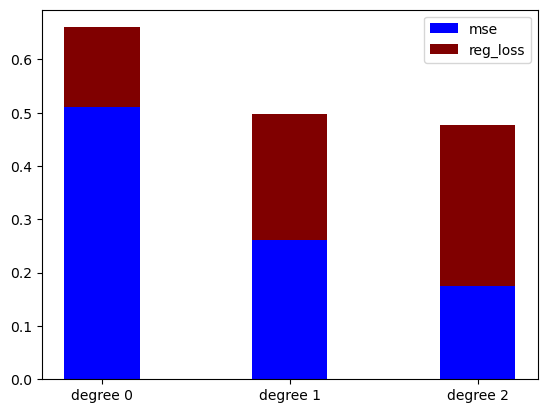

westwood-39
loss [0.15086448588951715, 0.2320991991298601, 0.30012156259236966]
mse [0.4877492109206976, 0.24783533101527608, 0.1706390751550989]


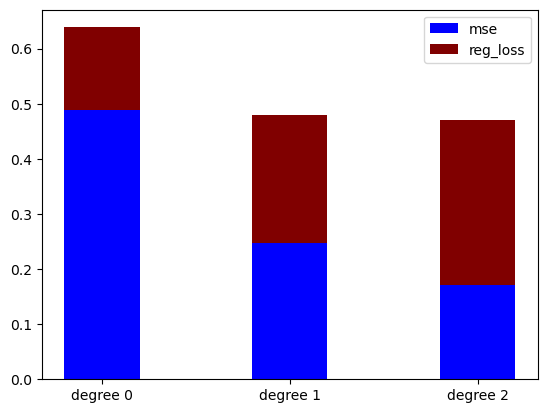

westwood-40
loss [0.12808712251295656, 0.20252244595687513, 0.26624368509771285]
mse [0.4384846260397118, 0.242853859615212, 0.17362202652762015]


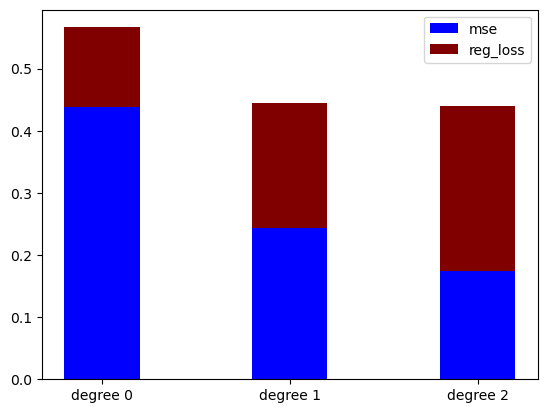

westwood-41
loss [0.15868660209429974, 0.2531744665495148, 0.32377731535472903]
mse [0.46887613595903205, 0.26136202730508273, 0.1798093008037809]


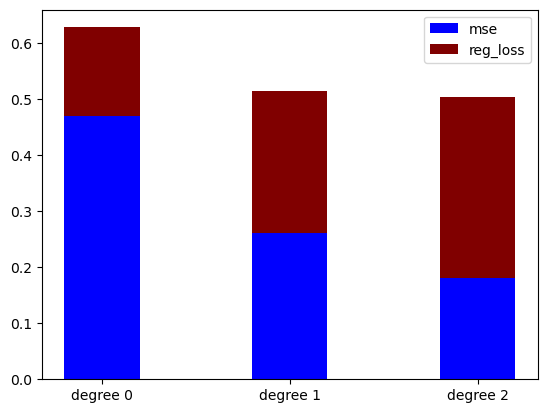

westwood-42
loss [0.14079037541838574, 0.23953563379150108, 0.34180978372705884]
mse [0.223592856357409, 0.1390461383531179, 0.13109874936335922]


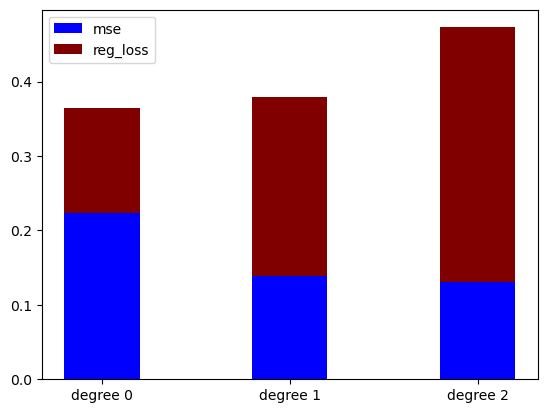

westwood-43
loss [0.148425986409486, 0.23560445689720932, 0.3118651748897879]
mse [0.3628774592389472, 0.18550254301021987, 0.13359508107117754]


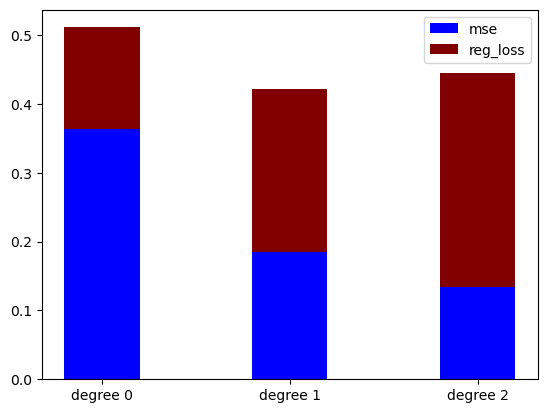

westwood-44
loss [0.15424503857702143, 0.24033830612184326, 0.3066702645317481]
mse [0.33729471383626775, 0.15012815573032054, 0.09072963876148822]


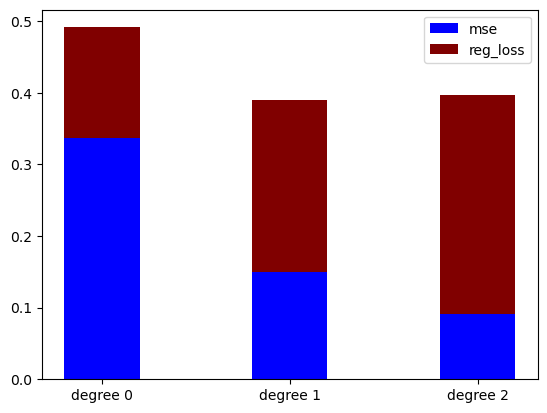

westwood-45
loss [0.16158312484009507, 0.25462104336613706, 0.32793374057281294]
mse [0.6143577778294946, 0.3575376804137271, 0.2514660466918194]


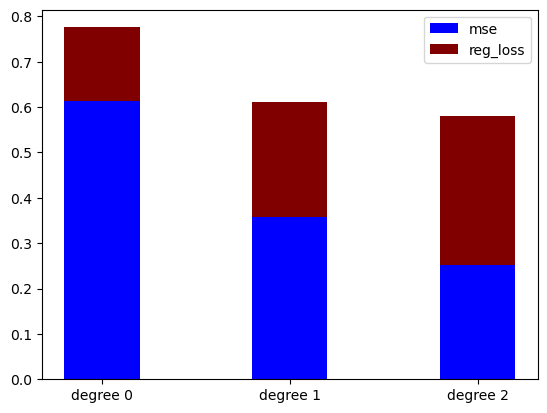

westwood-46
loss [0.13778285339763707, 0.23099580642701306, 0.3181964230969514]
mse [0.20723378272975104, 0.11234696645952791, 0.09391398245704703]


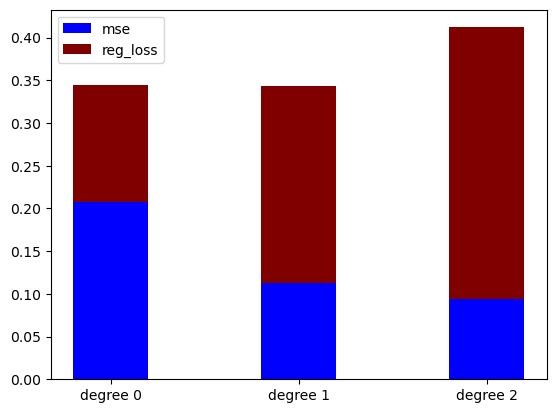

westwood-47
loss [0.14829835435512945, 0.24935709725451824, 0.34780506394386174]
mse [0.24591693321702107, 0.14589992399588506, 0.12923481431776762]


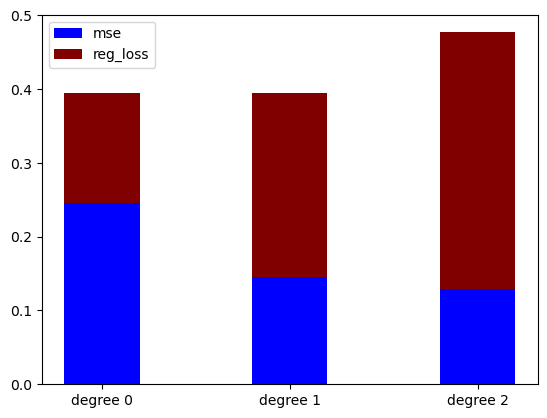

westwood-48
loss [0.15701228239481135, 0.25775114023410534, 0.34591911281912674]
mse [0.4130150422244378, 0.24815724455395935, 0.1971769750618804]


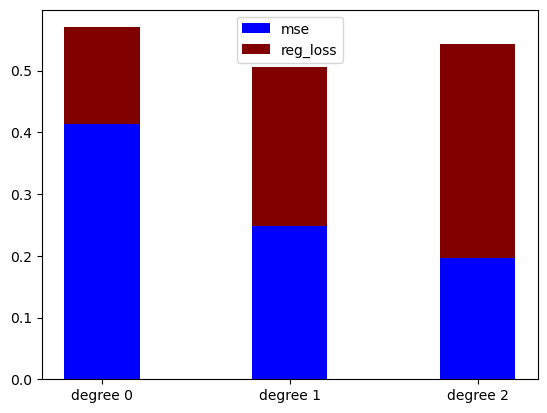

westwood-49
loss [0.14192633530477097, 0.25592480149634417, 0.37530026672838457]
mse [0.20601046258435932, 0.16670296629523204, 0.16484093124485982]


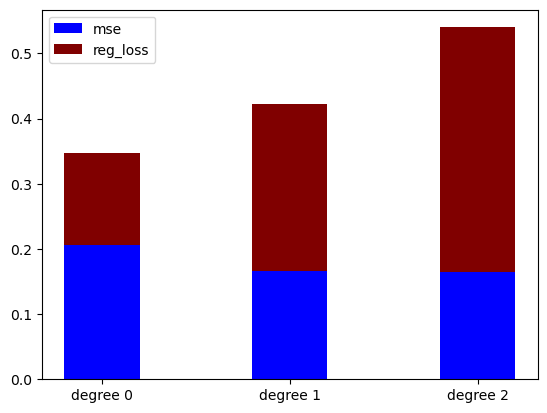

westwood-50
loss [0.1572457375292729, 0.25877267632710005, 0.3391551156174212]
mse [0.39139796500860735, 0.2586195544093256, 0.20236682562331668]


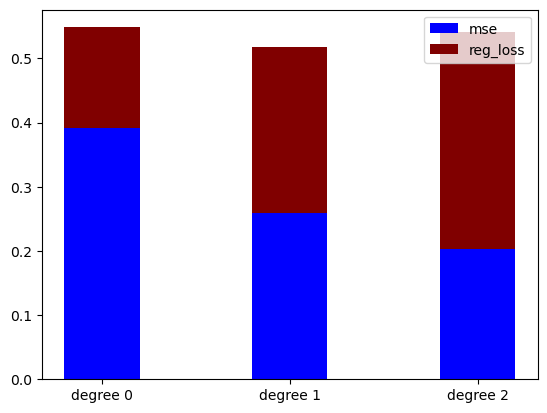

yeah-1
loss [0.10528545924037225, 0.18432675440345214, 0.2612510714761666]
mse [0.21565333699233757, 0.14548111737975705, 0.09946041402242352]


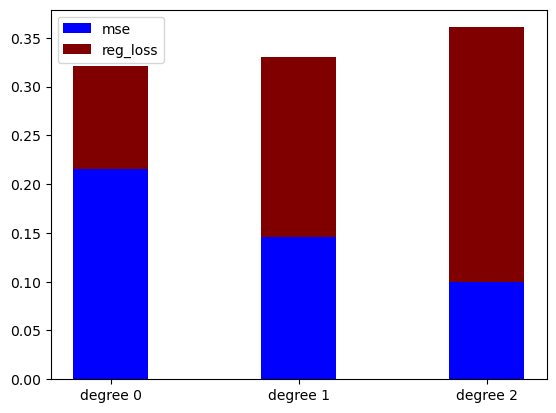

yeah-2
loss [0.0938334163021519, 0.16774591666350114, 0.24089301745370317]
mse [0.1168040814896799, 0.0824879712545861, 0.06903037465460933]


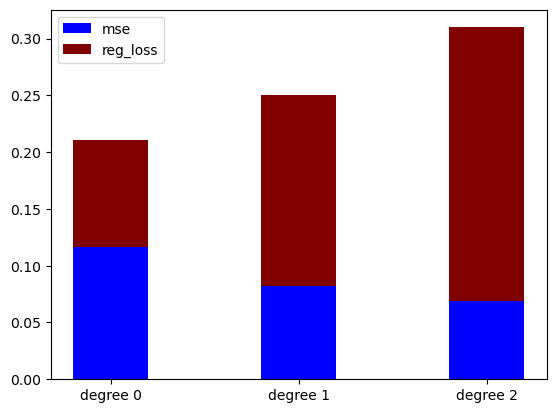

yeah-3
loss [0.1125364099665721, 0.2038323291468669, 0.2890226145364293]
mse [0.18817315533686055, 0.1448483593702077, 0.10413240178343852]


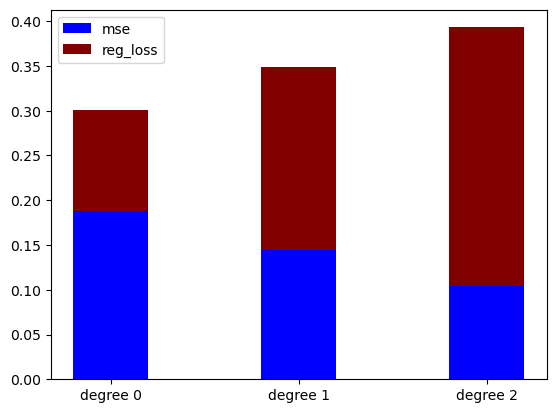

yeah-4
loss [0.10526011141631467, 0.1962407785374445, 0.27775319194531944]
mse [0.0971585974519745, 0.08351259889068924, 0.06178801927547012]


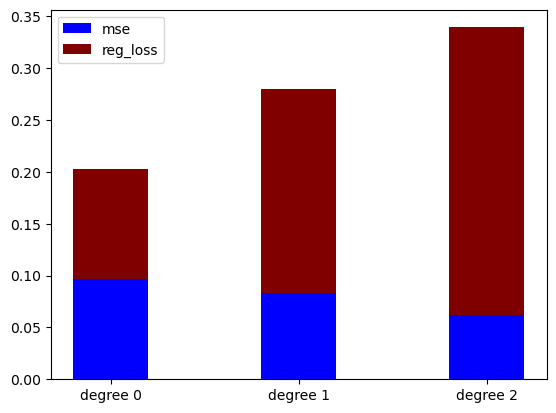

yeah-5
loss [0.0389706988670403, 0.05590889564349442, 0.07762432796032674]
mse [0.036108971878334464, 0.005308236730047361, 0.003005240100454556]


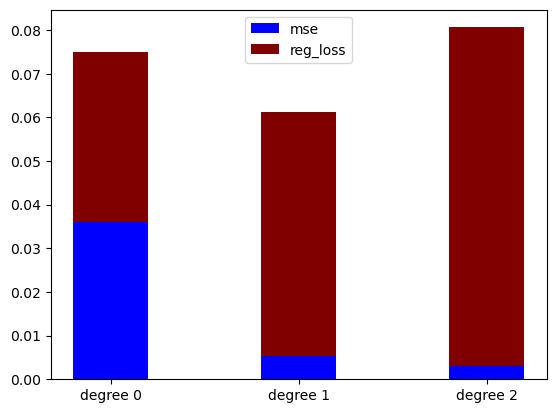

yeah-6
loss [0.10008804039723007, 0.17408818041034363, 0.24739897992342536]
mse [0.15280358140000147, 0.09790060876400047, 0.07316243938765014]


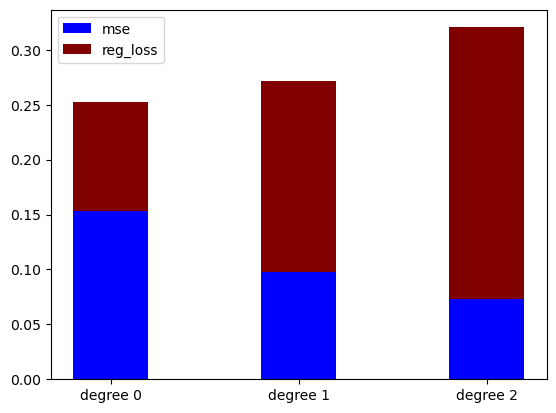

yeah-7
loss [0.10024472967243035, 0.18250804064655995, 0.2630484043440345]
mse [0.22045292096879684, 0.17415045808835716, 0.11297111428181929]


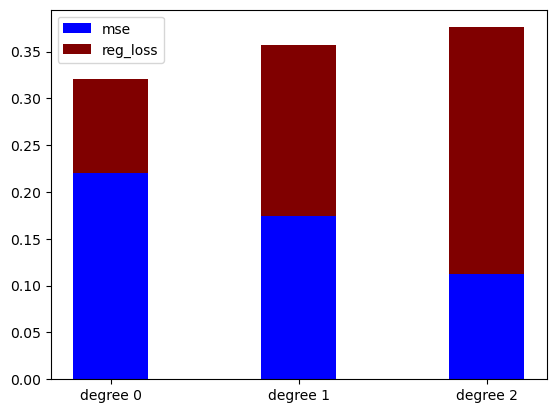

yeah-8
loss [0.10723702144578132, 0.20687277477466456, 0.3003680559666808]
mse [0.11103130766319196, 0.10601654705540065, 0.09252505234286572]


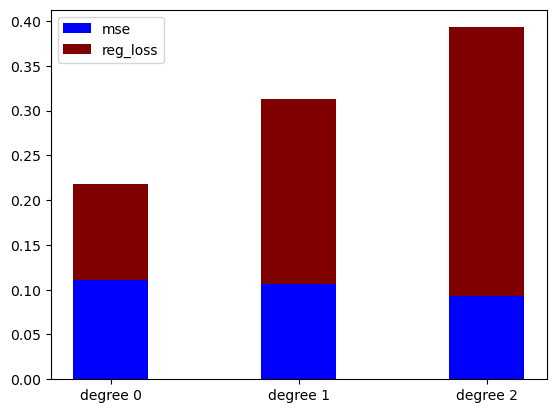

yeah-9
loss [0.10704338977434656, 0.18882262334349892, 0.2709471575267614]
mse [0.11930306017195276, 0.07787636015974948, 0.06414380801811605]


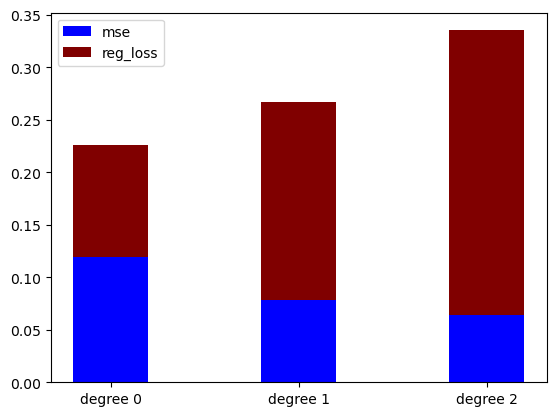

yeah-10
loss [0.10348557565801392, 0.1858819204983022, 0.26712601798717683]
mse [0.10307658287096794, 0.07202303970512838, 0.06128192273390143]


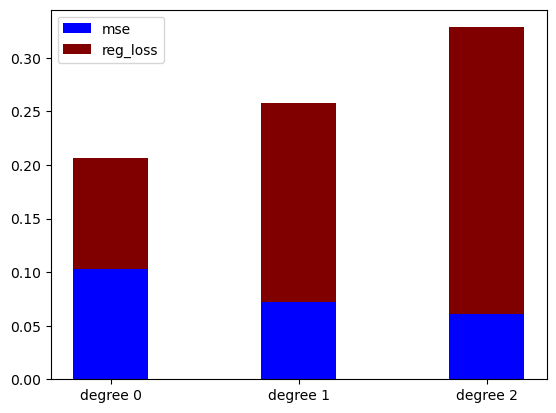

yeah-11
loss [0.10548509652976053, 0.19421809898435308, 0.2710790807929522]
mse [0.10621063545072515, 0.08520203966702738, 0.05883692312251638]


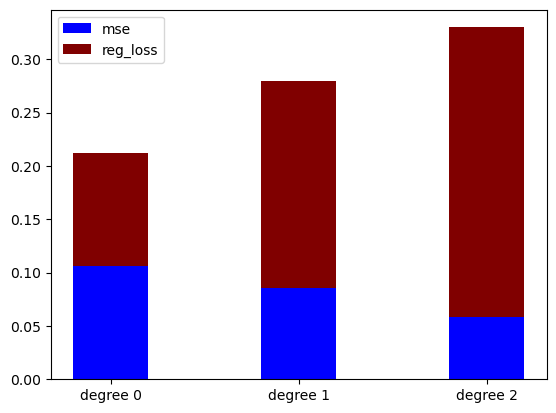

yeah-12
loss [0.06742117635575993, 0.1277926821767905, 0.17809973182328775]
mse [0.08188189948042435, 0.07637467590977703, 0.04269074539553152]


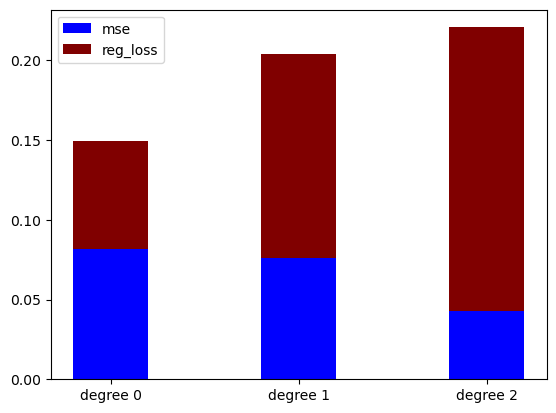

yeah-13
loss [0.11435449491809607, 0.19988468870782566, 0.2813001463739913]
mse [0.2935430266241355, 0.20549772222604168, 0.1368340965103212]


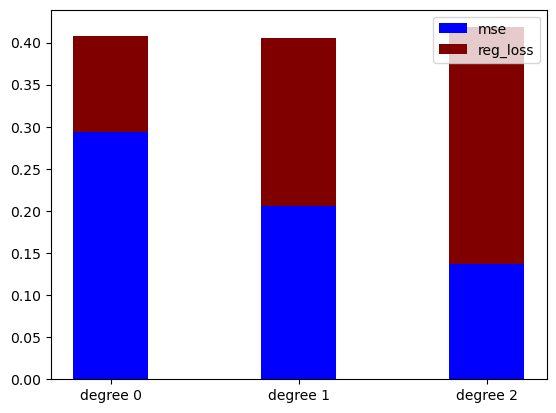

yeah-14
loss [0.1493131084982042, 0.2779246292716903, 0.40395111813766643]
mse [0.44778038123412106, 0.39509879540939974, 0.3507611643171653]


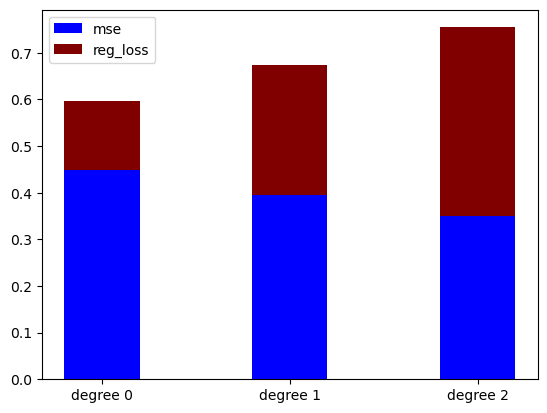

yeah-15
loss [0.10384872538469683, 0.19642516741628177, 0.28359224729630395]
mse [0.10655387701118989, 0.09534908855465882, 0.07676495827023026]


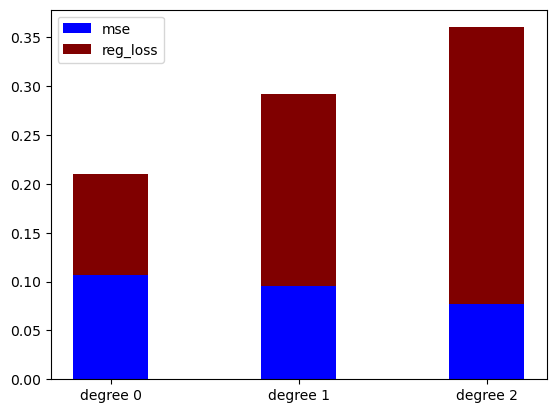

yeah-16
loss [0.10144624208679516, 0.19219465940321845, 0.27653098200890275]
mse [0.11053613110693807, 0.09864666515693883, 0.07444189714657587]


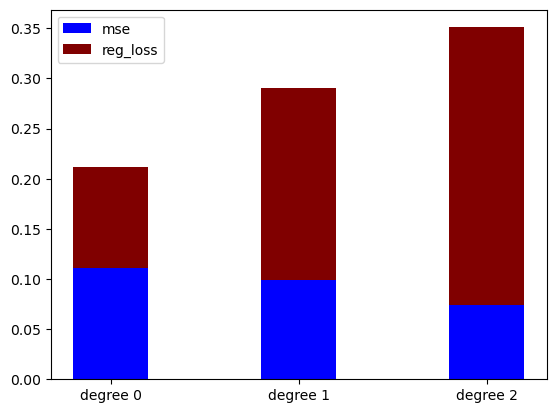

yeah-17
loss [0.0977854245555898, 0.1810998242707742, 0.260801733838008]
mse [0.07927700409536309, 0.06584766200395044, 0.0559203792734306]


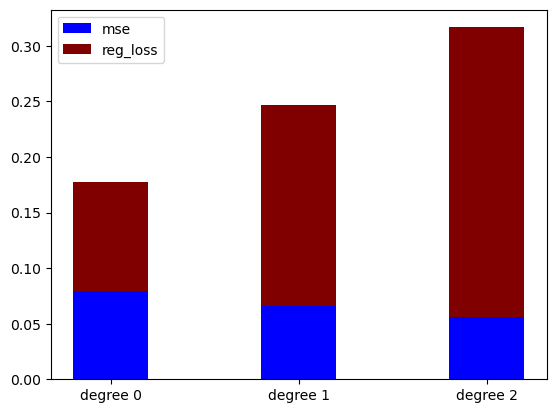

yeah-18
loss [0.09763158482752578, 0.17547359872932639, 0.24173436323957428]
mse [0.12472761060172523, 0.09201892174339697, 0.04788881508089854]


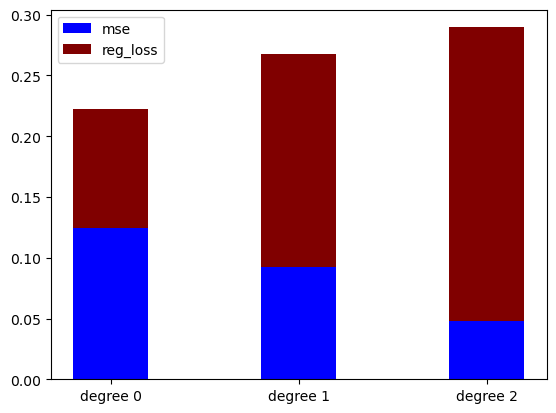

yeah-19
loss [0.17761578102925, 0.33957388693016227, 0.5070072761576735]
mse [0.9008533850549192, 0.8495234768949863, 0.8299666931282982]


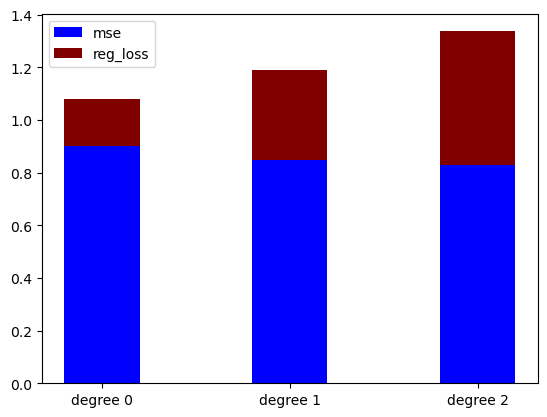

yeah-20
loss [0.10125558443673746, 0.1807891359368943, 0.25346258095060276]
mse [0.09841904200116262, 0.07146816720433792, 0.050779095173723636]


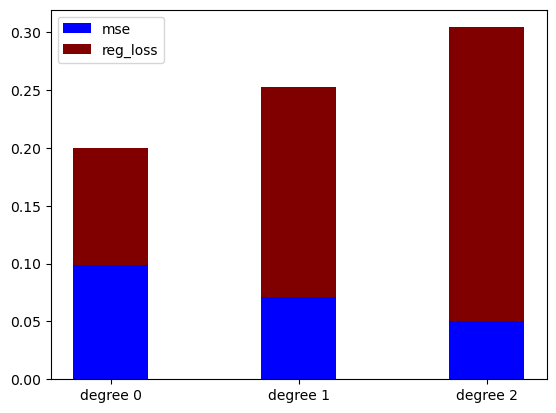

yeah-21
loss [0.05306804739891289, 0.08487889960711062, 0.12018856460553065]
mse [0.053987400782802716, 0.012355717796700557, 0.008013248424800338]


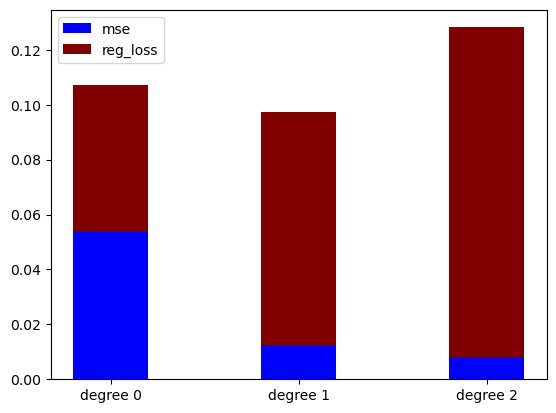

yeah-22
loss [0.10710141607116762, 0.19607928056512147, 0.28093117470615686]
mse [0.12844469428859093, 0.10067730626240623, 0.07387842264566634]


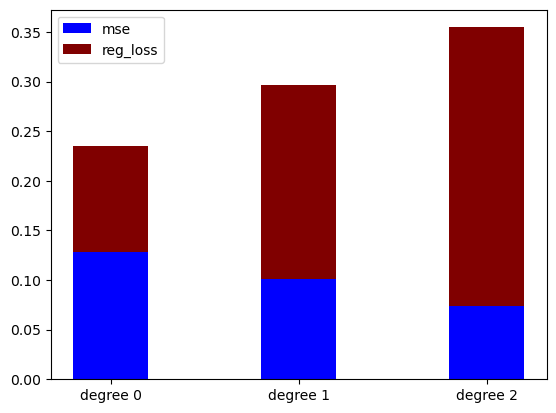

yeah-23
loss [0.11406592622781991, 0.19767990320331918, 0.27710733847087626]
mse [0.2544267899439986, 0.16971570907596337, 0.1061001669077191]


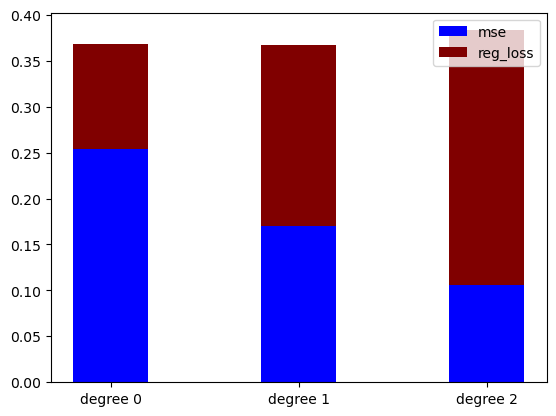

yeah-24
loss [0.10490882224468451, 0.1889347870002921, 0.26766053744841783]
mse [0.10965874650182794, 0.08110714899986551, 0.059891234912445745]


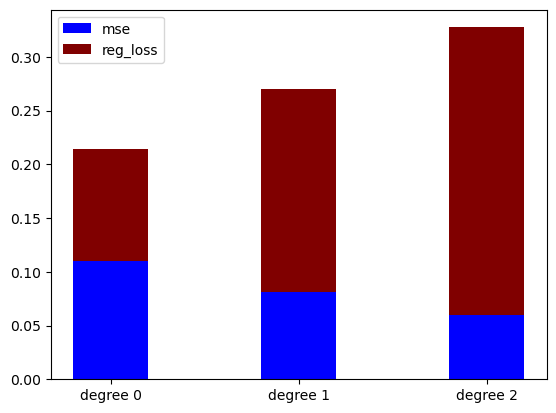

yeah-25
loss [0.09464102750074972, 0.17090463789837035, 0.24084407979193947]
mse [0.068748498605455, 0.04840911578107993, 0.03503832121703406]


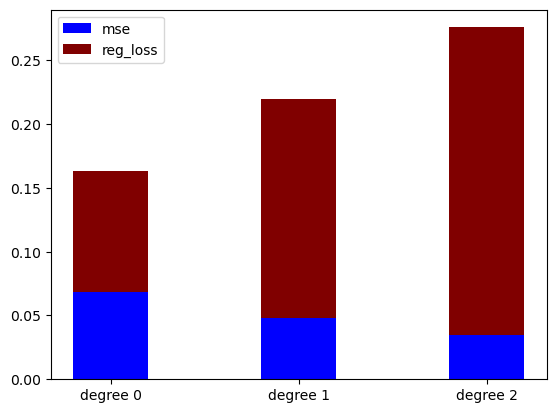

yeah-26
loss [0.10182948033211976, 0.18199914166433334, 0.2547899665296182]
mse [0.1897832087775588, 0.1365213657327897, 0.07772616569152159]


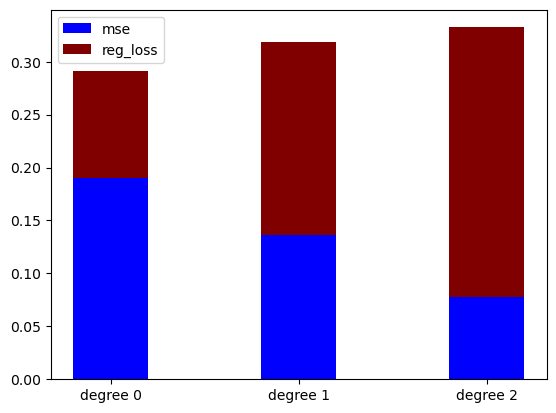

yeah-27
loss [0.09928101015712704, 0.1805291819928347, 0.2612905794526781]
mse [0.0865548381619921, 0.06358939861893995, 0.0563314140152086]


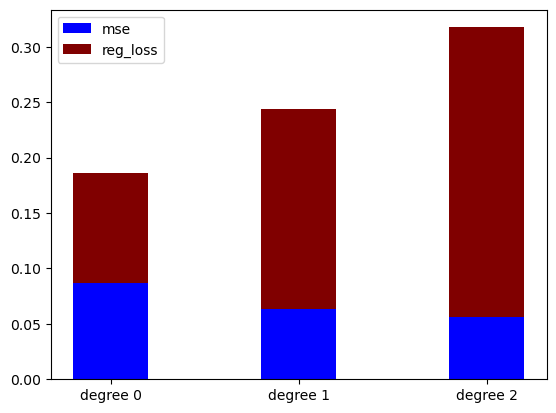

yeah-28
loss [0.11148511542953952, 0.20115329282511346, 0.2885728496974746]
mse [0.16415395277350292, 0.12114056433426512, 0.09375245066966341]


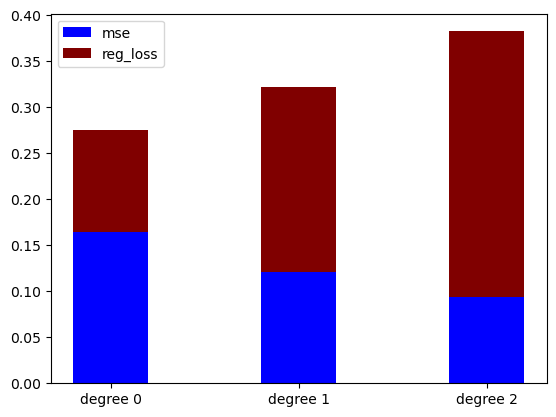

yeah-29
loss [0.10003909933710915, 0.18220288857202482, 0.2564205070676658]
mse [0.16876337532464958, 0.13871846641535027, 0.0884153526053244]


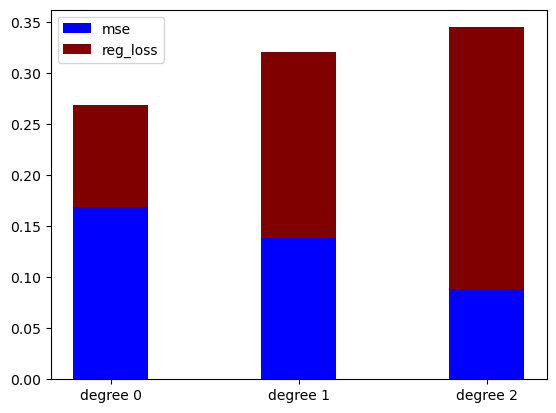

yeah-30
loss [0.09944086200137946, 0.17176191184912226, 0.2476466097648391]
mse [0.19008566425242795, 0.10485647502701569, 0.07690214998585111]


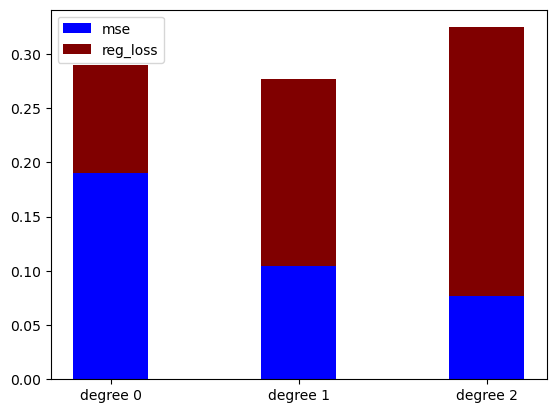

yeah-31
loss [0.10138477312518815, 0.17983361390064037, 0.2520136178638257]
mse [0.18393230790895065, 0.12616047074196726, 0.07289959695359884]


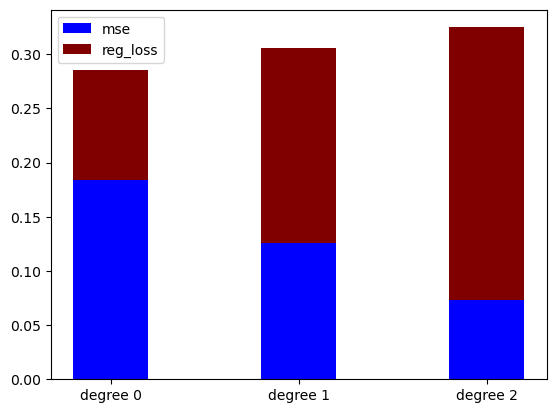

yeah-32
loss [0.09774080553000705, 0.17728576709152333, 0.254705158704872]
mse [0.22249410582186824, 0.17351482946566799, 0.11431078016405956]


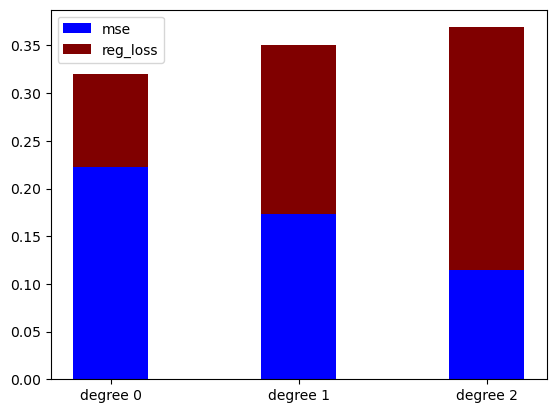

yeah-33
loss [0.18564930419620615, 0.33780798385034255, 0.4684797195438768]
mse [0.572024966894453, 0.4815219378120854, 0.29283723598908773]


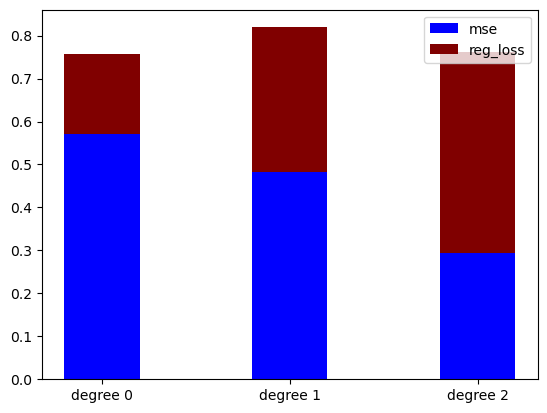

yeah-34
loss [0.06738710878110721, 0.12252866498933837, 0.17049752622897607]
mse [0.09537590953917383, 0.07970218758030519, 0.0385945493018152]


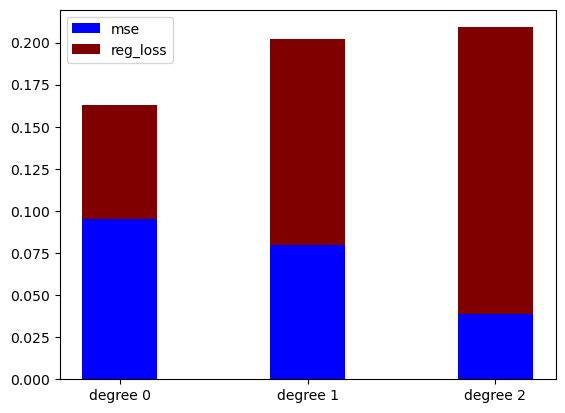

yeah-35
loss [0.1127186323035636, 0.2056973290840078, 0.29162393495361144]
mse [0.1909121838850196, 0.15343544046748142, 0.11454983845928773]


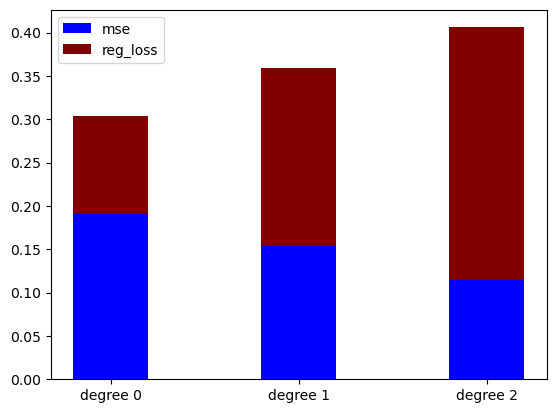

yeah-36
loss [0.10024814067746193, 0.19023152745109248, 0.27443165941031317]
mse [0.10430133927892495, 0.09452004822861605, 0.07966450804994693]


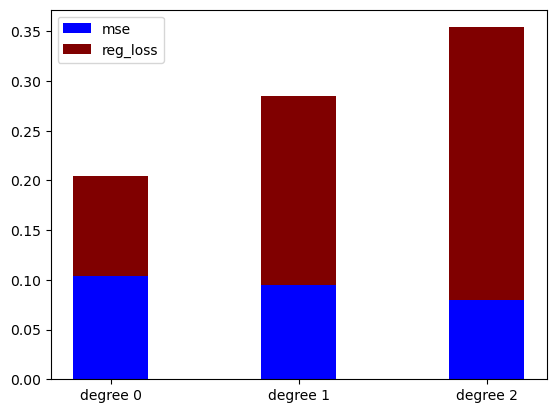

yeah-37
loss [0.11226190258013712, 0.20126974693169608, 0.283626761019666]
mse [0.17417747620380675, 0.1268589750804337, 0.09237552456884059]


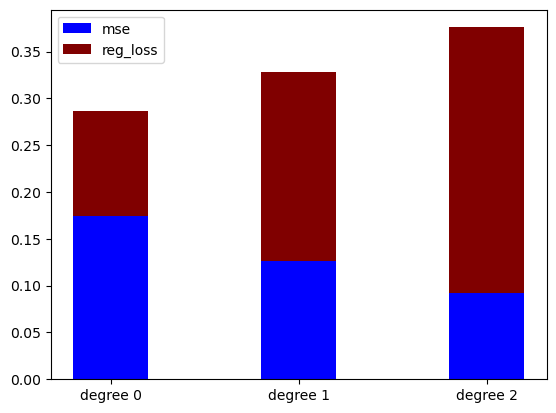

yeah-38
loss [0.10052520783570436, 0.1910531694113204, 0.2714843778897819]
mse [0.09049396634247761, 0.08355635892553076, 0.0614909015166133]


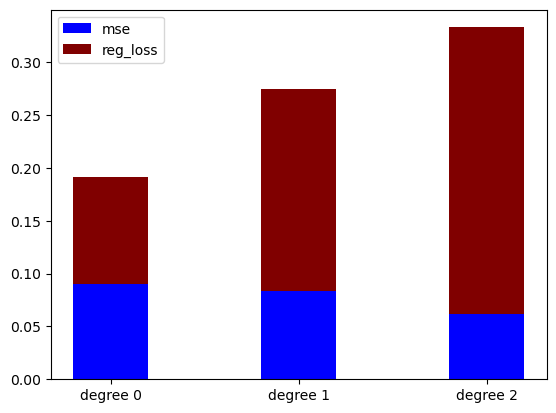

yeah-39
loss [0.10975384047389032, 0.19372585376615745, 0.27344250204489434]
mse [0.19848724027382855, 0.1371779766577771, 0.08977893744984375]


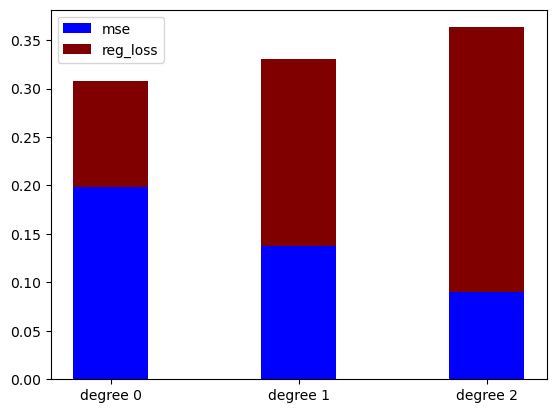

yeah-40
loss [0.09506237955596239, 0.16328911677269464, 0.22438594755610627]
mse [0.14304319399182783, 0.08950396426128836, 0.06097293835109832]


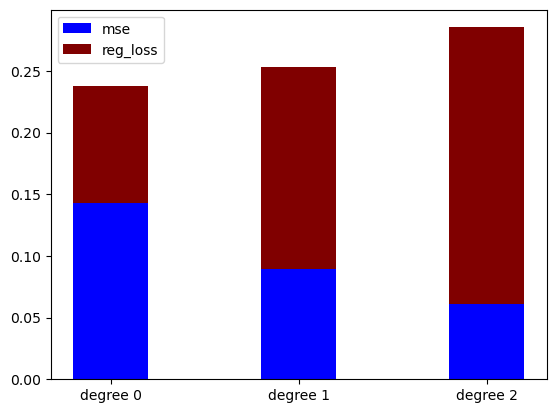

yeah-41
loss [0.10758132636506362, 0.1842385266087715, 0.2601643054939888]
mse [0.2584806313023295, 0.1639812440868601, 0.1148808030925251]


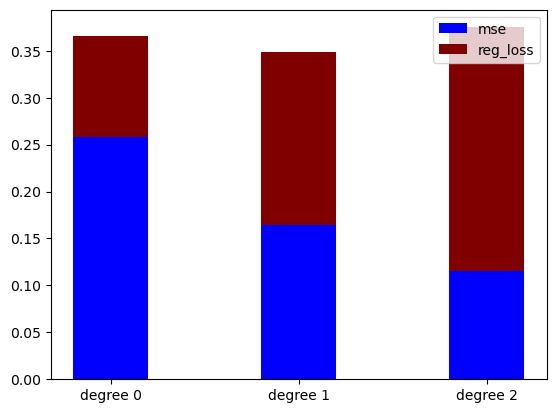

yeah-42
loss [0.10086015753599485, 0.17933430376148463, 0.25469420737190357]
mse [0.11510285962011098, 0.07800138608060314, 0.05383670217576233]


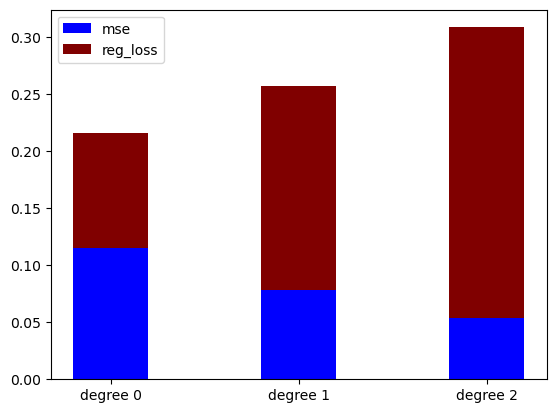

yeah-43
loss [0.10881729655816944, 0.19247079982176807, 0.271148968378217]
mse [0.17201406311690762, 0.11890612561477393, 0.07956555534877313]


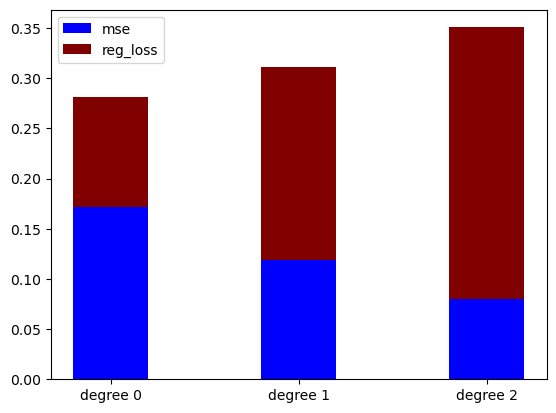

yeah-44
loss [0.10557469211233206, 0.19348193105066547, 0.2782869818913178]
mse [0.24188810245853568, 0.20153390792251194, 0.14925721518142873]


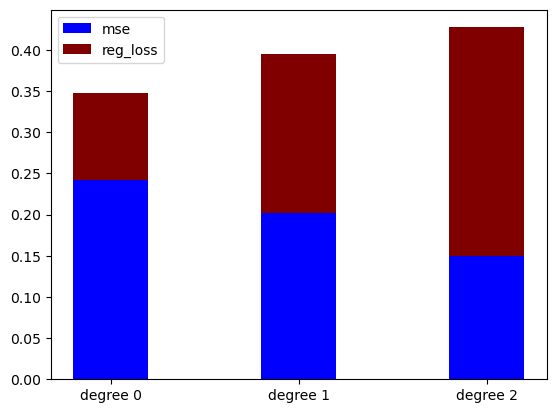

yeah-45
loss [0.06253919240572295, 0.11661396020612398, 0.1622755851466625]
mse [0.07607589302949042, 0.0687285962028965, 0.039741767313066625]


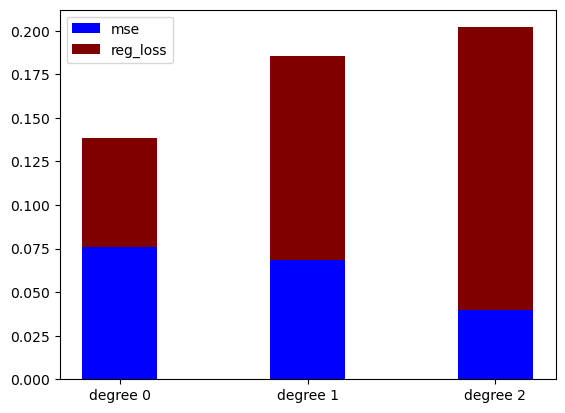

yeah-46
loss [0.09441603589397317, 0.18161627702584338, 0.2586256814118952]
mse [0.06737441972258881, 0.06357891866735312, 0.050868143544711926]


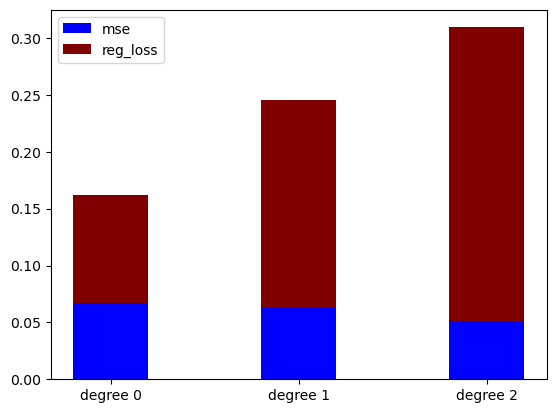

yeah-47
loss [0.12735376471318305, 0.22987117816349253, 0.3244913865289336]
mse [0.22821742431383094, 0.18195530198755494, 0.13264409372174382]


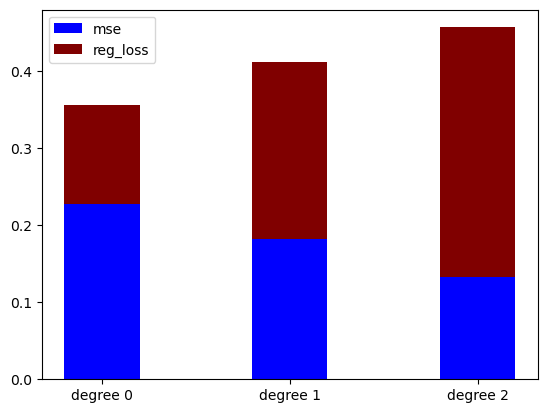

yeah-48
loss [0.050883693680485134, 0.09612200155435784, 0.140529458144042]
mse [0.06544494796937436, 0.059311524334351544, 0.03161511494909646]


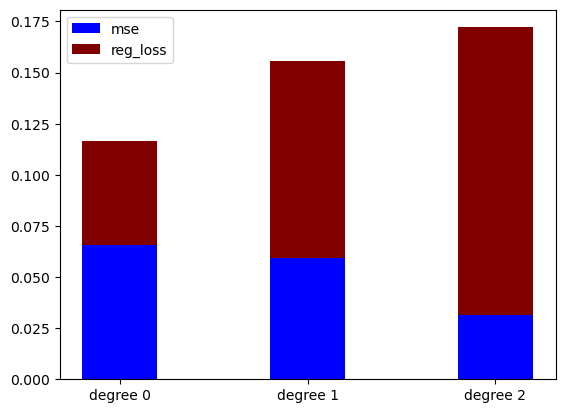

yeah-49
loss [0.10796925355066112, 0.19179916498086175, 0.2702336687410666]
mse [0.175727438641994, 0.12625306619127474, 0.08574725515068601]


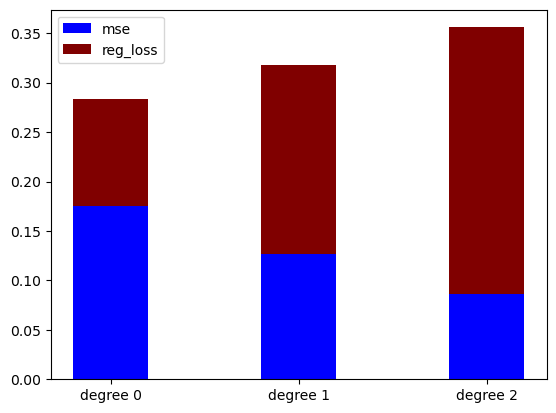

yeah-50
loss [0.04948724258077164, 0.08650441316916001, 0.1214235163834305]
mse [0.02121660262311747, 0.011883061588793417, 0.008695217544685071]


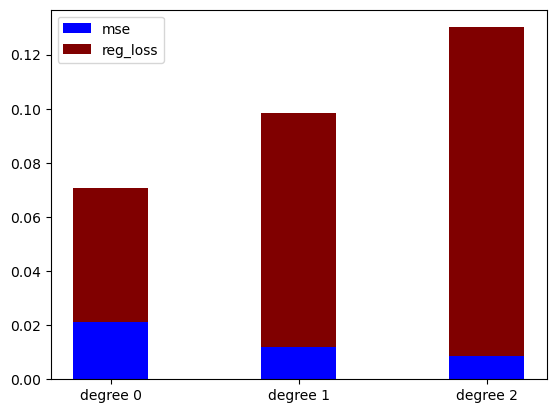

cubic-1
loss [0.07620155440280249, 0.1942132754598882, 0.17636290602717206]
mse [0.5819750488126813, 0.4806065539179265, 0.06986017535749016]


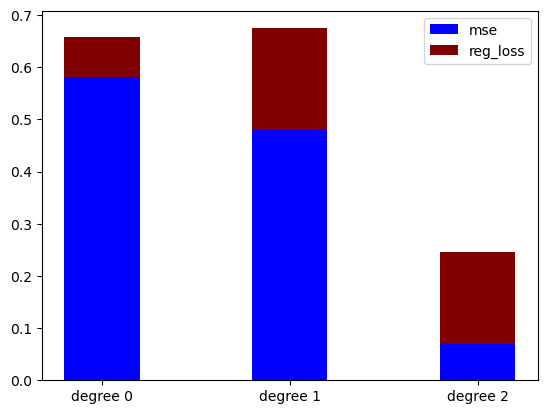

cubic-2
loss [0.07781909753244881, 0.19694771486200222, 0.11311459158851639]
mse [0.885539178347079, 0.8068249216028042, 0.014872185965550438]


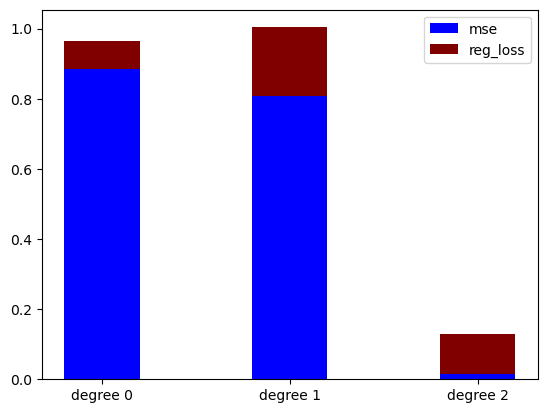

cubic-3
loss [0.05630905424762091, 0.1843144037897889, 0.17710858733542217]
mse [0.6833140441798049, 0.40970950627782576, 0.093715584641883]


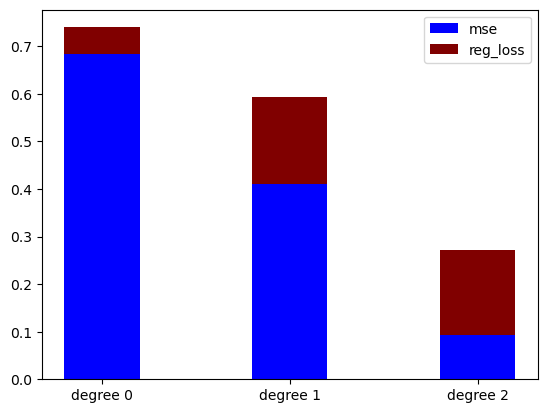

cubic-4
loss [0.059078265185186024, 0.18176931504677313, 0.13328436350078524]
mse [0.6386510536120856, 0.47769449865357977, 0.06406855536135499]


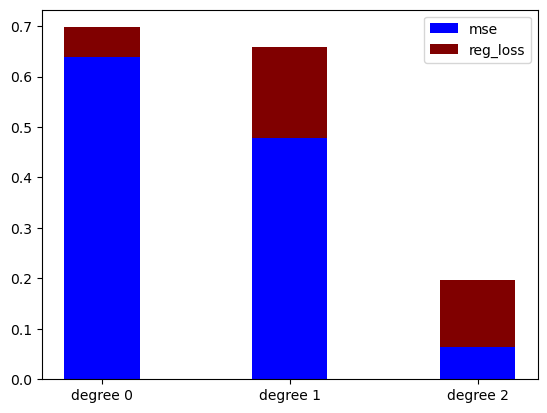

cubic-5
loss [0.056858967435994535, 0.18564475857003782, 0.14597366602086578]
mse [0.7234336593922186, 0.4920365576691485, 0.07449824223843829]


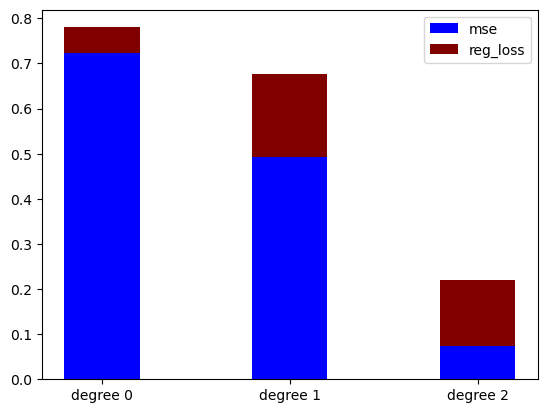

cubic-6
loss [0.09102097618725191, 0.20417488214545246, 0.19467037365298281]
mse [0.6462260106736643, 0.6173802700960765, 0.09658699717846954]


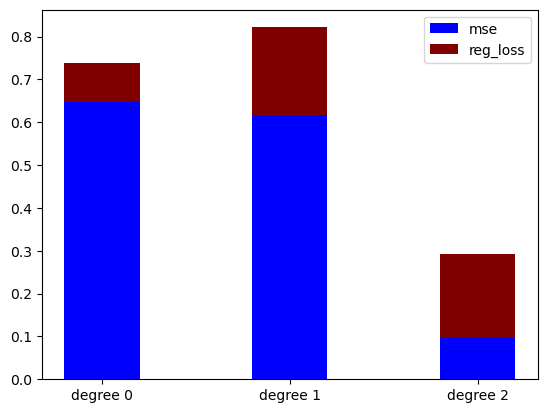

cubic-7
loss [0.13368091055732342, 0.25962315449847684, 0.30334261589075817]
mse [0.5526281564051682, 0.5482267968729346, 0.1395792611777052]


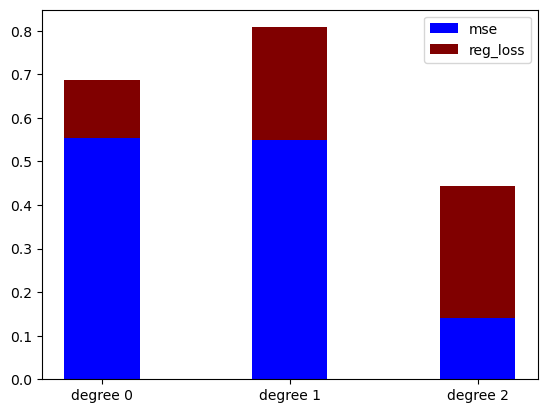

cubic-8
loss [0.05534799370971885, 0.1755558292300898, 0.14779892620794396]
mse [0.5968966884425533, 0.4154091970812073, 0.06912697454187633]


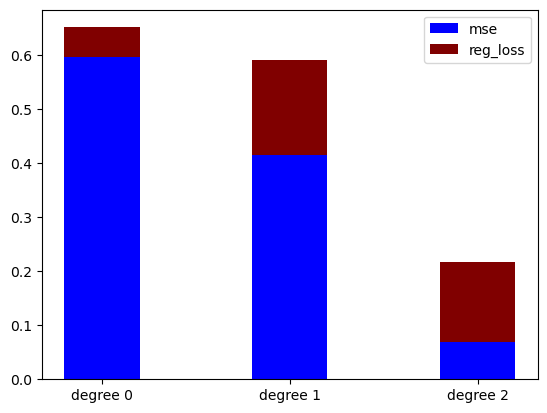

cubic-9
loss [0.10607955357134398, 0.22578380104959295, 0.20469390185012168]
mse [0.5044476008054554, 0.49716869427676563, 0.10037017118500491]


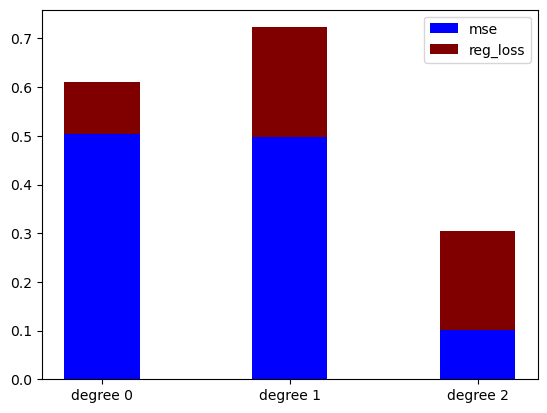

cubic-10
loss [0.13330909424006382, 0.25841048090116225, 0.28457199352369644]
mse [0.6462530091694694, 0.6424692096946301, 0.1498032904984599]


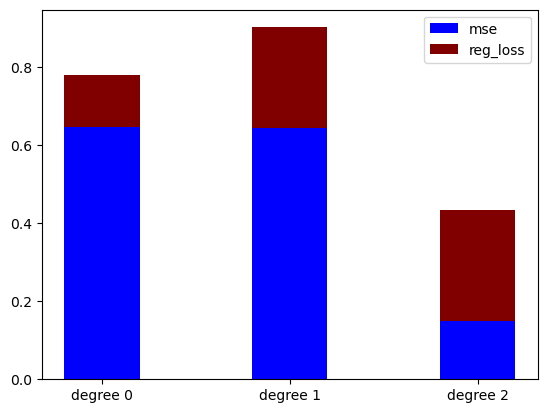

cubic-11
loss [0.10847427869551954, 0.2273041162300236, 0.2332997097973193]
mse [0.4322256098038669, 0.42765993590843504, 0.08536238112976001]


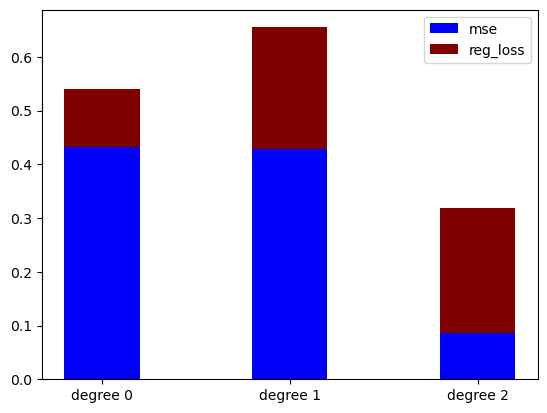

cubic-12
loss [0.12452284516725914, 0.2712403574411711, 0.28100206086375573]
mse [0.5899022557960462, 0.56596460446163, 0.13647054606009726]


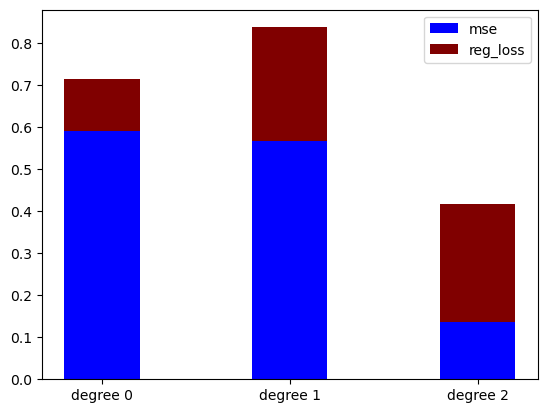

cubic-13
loss [0.12112695587034142, 0.25002295420623527, 0.2680884180543654]
mse [0.5600373783908488, 0.5559998145898397, 0.0985744843624381]


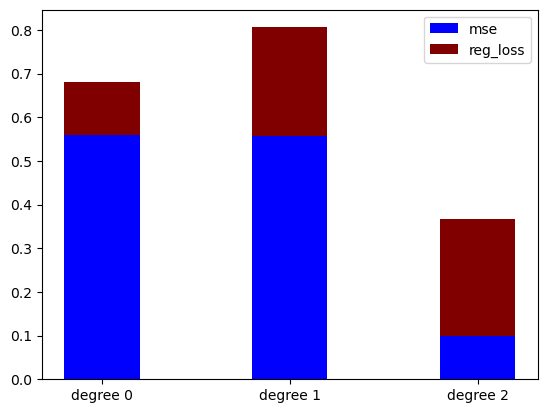

cubic-14
loss [0.12632041777386244, 0.24954680186415035, 0.284006717865854]
mse [0.4253678219798318, 0.4247676631267575, 0.09634482951497333]


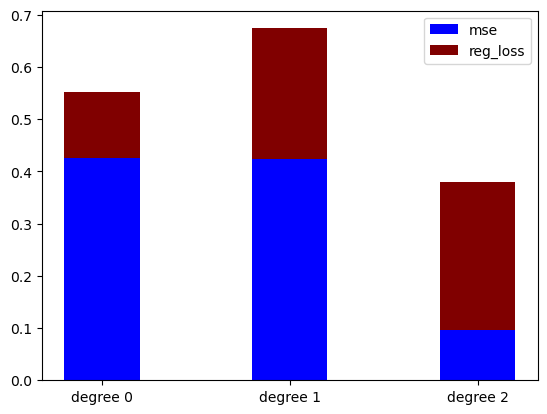

cubic-15
loss [0.0821685972010347, 0.19187142283816458, 0.19067916134032128]
mse [0.5389746875534069, 0.49149899355077276, 0.07382248085198324]


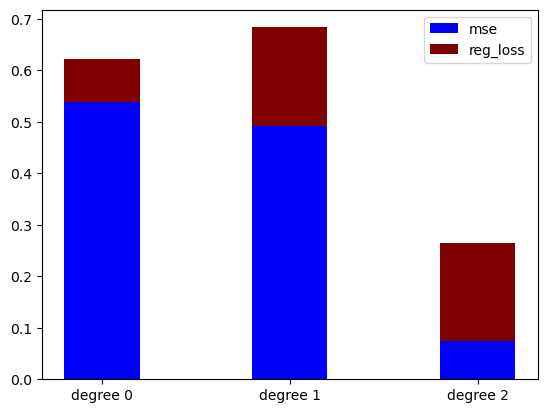

cubic-16
loss [0.07847971581708482, 0.17392453099952798, 0.18079289248188457]
mse [0.5987973475922138, 0.5752338425702659, 0.10486490500774667]


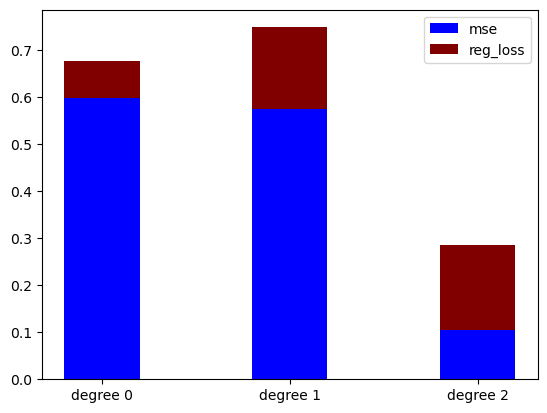

cubic-17
loss [0.07142011277369294, 0.19817798349254404, 0.16211670818429585]
mse [0.6135001467822433, 0.4927960056021175, 0.07969511432779985]


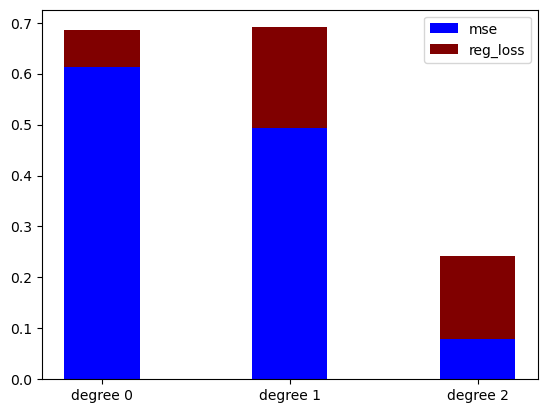

cubic-18
loss [0.09161345283368372, 0.2060126161937641, 0.20377644828879113]
mse [0.5616309650762752, 0.53178051250614, 0.08854206620075798]


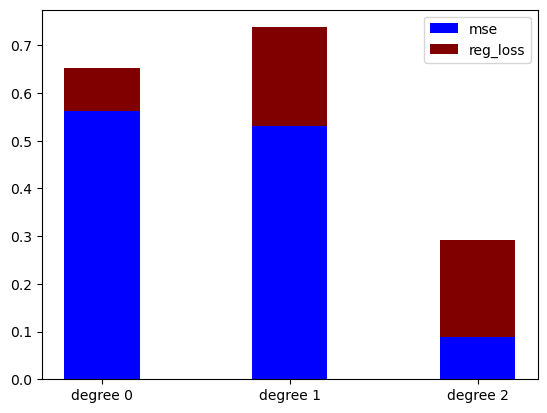

cubic-19
loss [0.09004878128921093, 0.21204930120697885, 0.21463332798201917]
mse [0.5535361374601676, 0.49060272073182987, 0.08058073066488441]


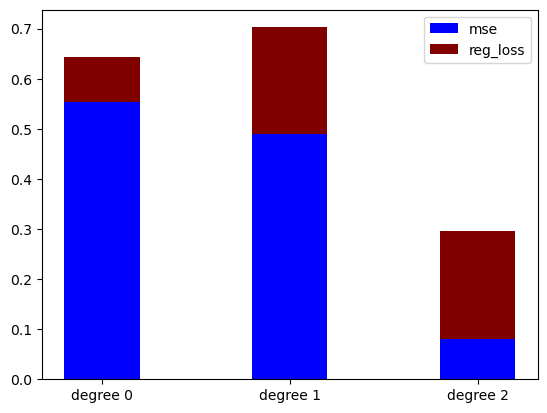

cubic-20
loss [0.0847582917318784, 0.19804324240151627, 0.19581626894513005]
mse [0.6906513906981842, 0.6297984752766901, 0.10668966303663344]


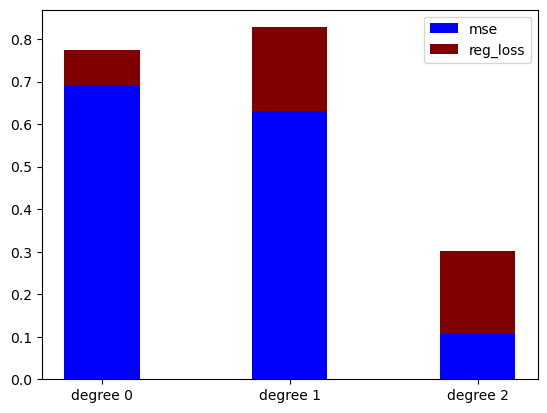

cubic-21
loss [0.08382185005623655, 0.19428774041347566, 0.19013754141713662]
mse [0.5628954232993815, 0.5195464519334219, 0.08328146326142571]


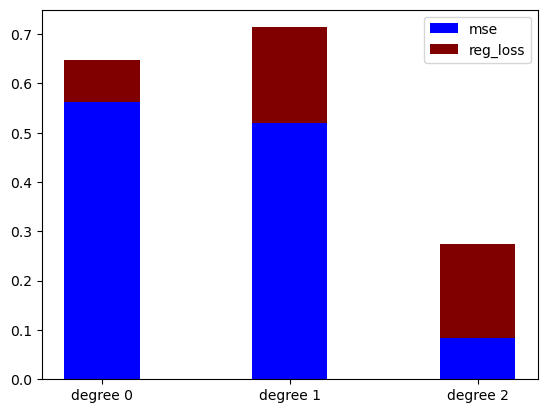

cubic-22
loss [0.07092897593998122, 0.19388133168257704, 0.18885627457546614]
mse [0.5872158917535202, 0.42960281415296003, 0.05811207574428286]


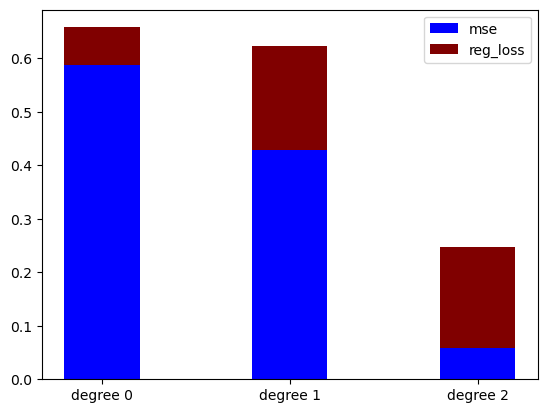

cubic-23
loss [0.08212372157454635, 0.1925070750439051, 0.1783929870595009]
mse [0.5289434234138203, 0.48695926998238354, 0.0681159520089105]


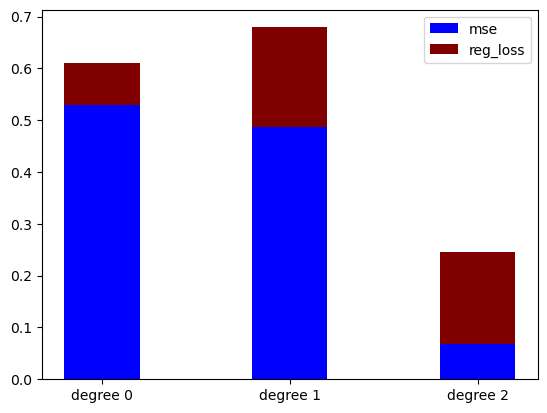

cubic-24
loss [0.07762368382801843, 0.1956784812906608, 0.18895566638301498]
mse [0.5912571715128544, 0.505257509443451, 0.07537277894259492]


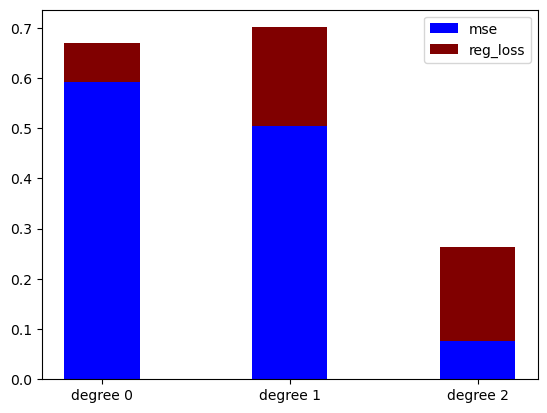

cubic-25
loss [0.08659953420354392, 0.19220378218703746, 0.19855953995071626]
mse [0.5417380270175938, 0.5132940343477085, 0.07821597567715148]


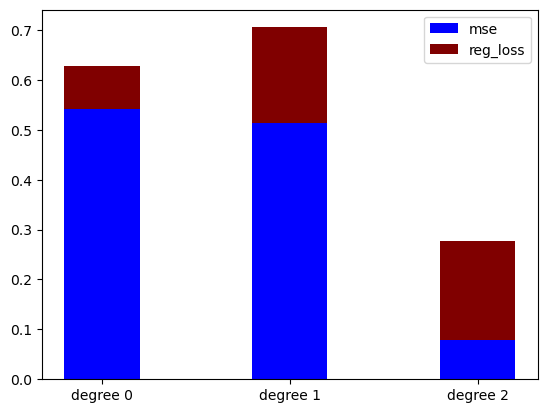

cubic-26
loss [0.09707415831398353, 0.18021501883884897, 0.1596611998981167]
mse [0.5786528648039168, 0.5679002972896662, 0.10756155968646143]


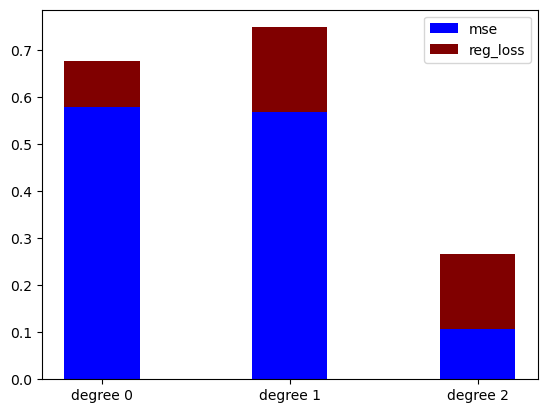

cubic-27
loss [0.0719399524272491, 0.19789134878448744, 0.16268990427831148]
mse [0.6720363057334818, 0.5362159567823707, 0.06676048461432169]


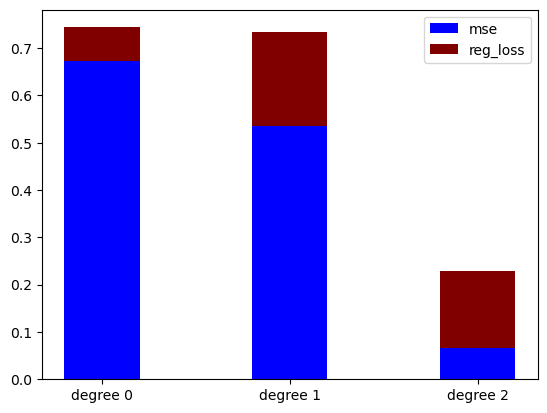

cubic-28
loss [0.10495761397404449, 0.15382786827146544, 0.2180449798991973]
mse [0.43099445709524253, 0.08362862948816117, 0.03629796261569318]


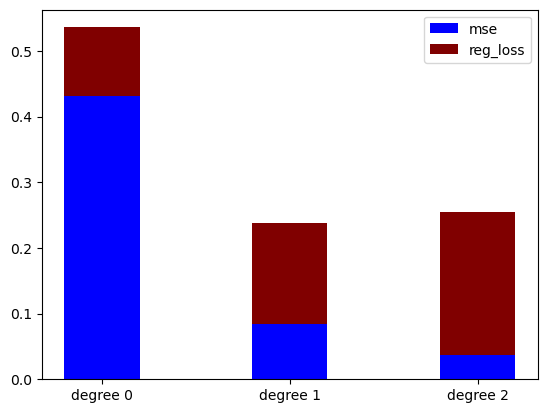

cubic-29
loss [0.07429973541512071, 0.20119645056575242, 0.16298194812888933]
mse [0.6285644324681329, 0.5133835446476709, 0.07968053063097988]


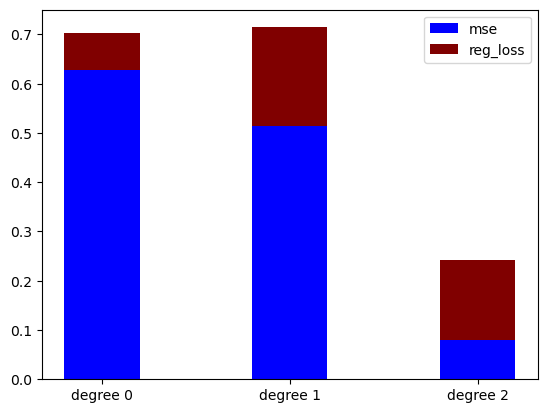

cubic-30
loss [0.08305863805217238, 0.18033373105923295, 0.17549962040030043]
mse [0.6196890365792106, 0.6051532280059121, 0.0890021024355576]


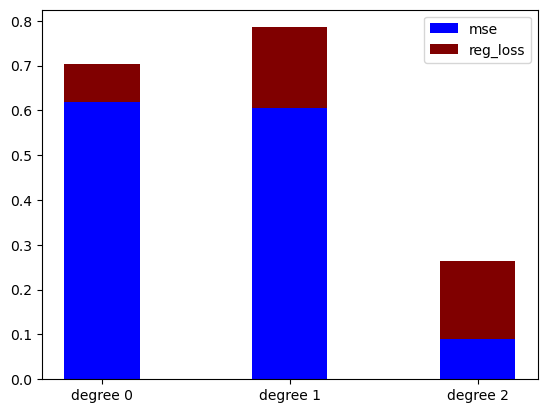

cubic-31
loss [0.06995684342976914, 0.20041232624044825, 0.16271632250509674]
mse [0.6308695061168478, 0.4958670449824134, 0.0893635474772952]


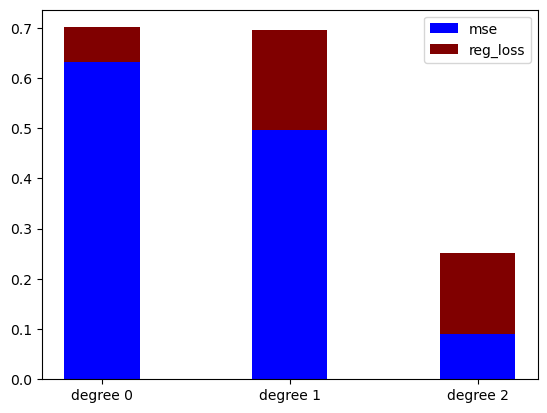

cubic-32
loss [0.08511654694012283, 0.20644344633914052, 0.2182376426523832]
mse [0.5501967742296274, 0.4578550577716897, 0.08704450135476342]


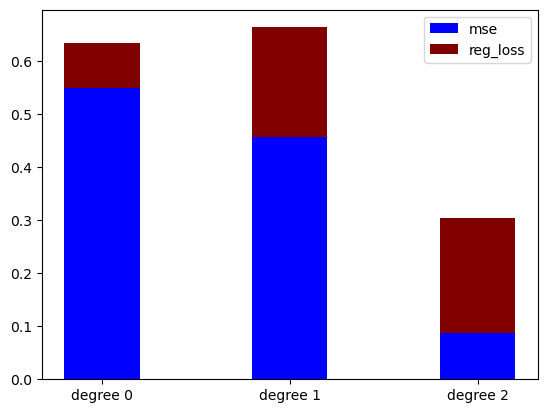

cubic-33
loss [0.08515420453278853, 0.20513719904570196, 0.20847426841521158]
mse [0.5019148254318171, 0.4359932575566491, 0.0726773466186465]


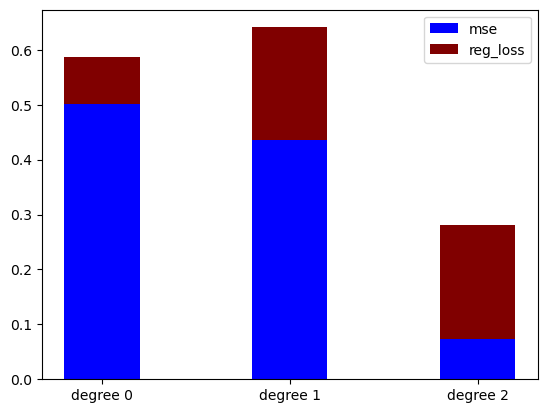

cubic-34
loss [0.08268641652881242, 0.19943469804251124, 0.18250848896366836]
mse [0.5379490231000256, 0.4844028333415274, 0.07126339784090342]


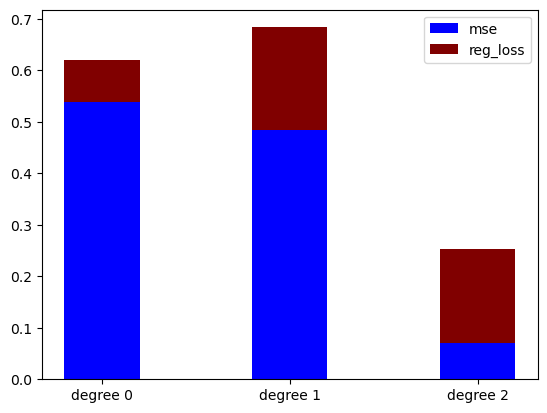

cubic-35
loss [0.07372202577250758, 0.1933259390118335, 0.2013791430057947]
mse [0.5735517406424826, 0.4243199563818678, 0.07021372204833909]


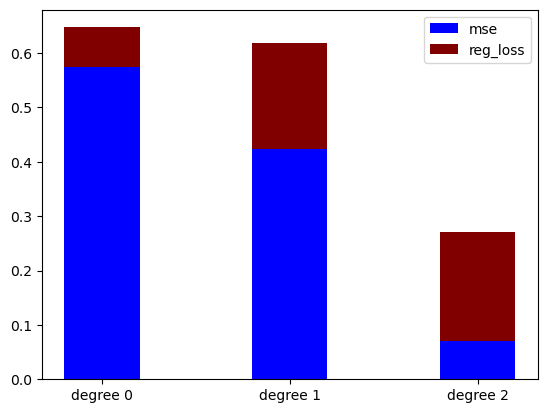

cubic-36
loss [0.07790433634876068, 0.1835191040087974, 0.17749969126951026]
mse [0.6101739296517343, 0.5675327652661611, 0.0913599384673386]


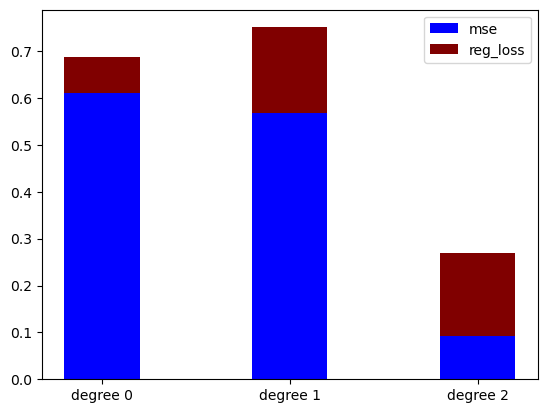

cubic-37
loss [0.13589356638798664, 0.2544568110622422, 0.29334876044324965]
mse [0.5169499265872481, 0.49559683631649104, 0.11092637642732796]


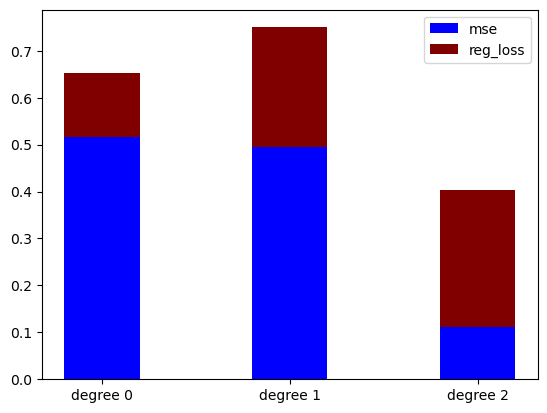

cubic-38
loss [0.08239534273266402, 0.20131161118060192, 0.21138589539939312]
mse [0.5257994959819805, 0.44031005055147326, 0.09049640699858316]


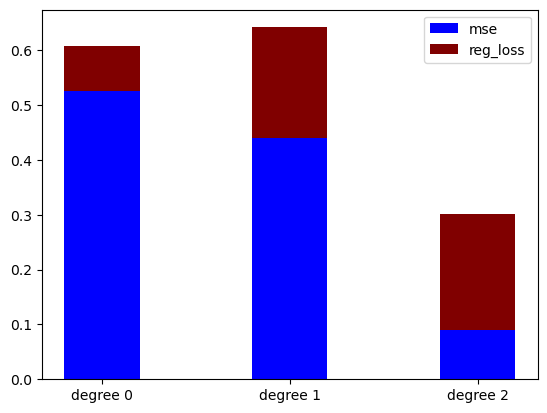

cubic-39
loss [0.12425123465642939, 0.264214575869193, 0.2930450875778618]
mse [0.5181470431752868, 0.5038601622249781, 0.1180504089645653]


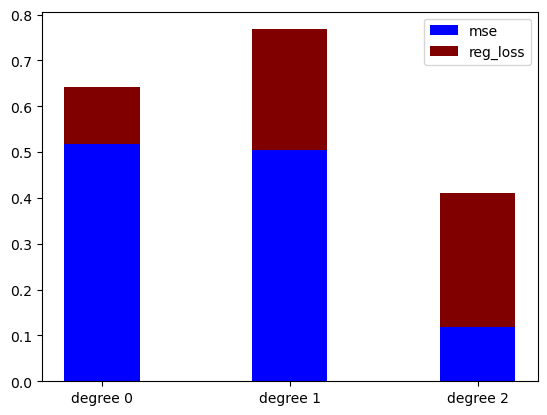

cubic-40
loss [0.13021608155705608, 0.24751082450383294, 0.2701604219215387]
mse [0.587011267768503, 0.576108290799871, 0.12946268751578194]


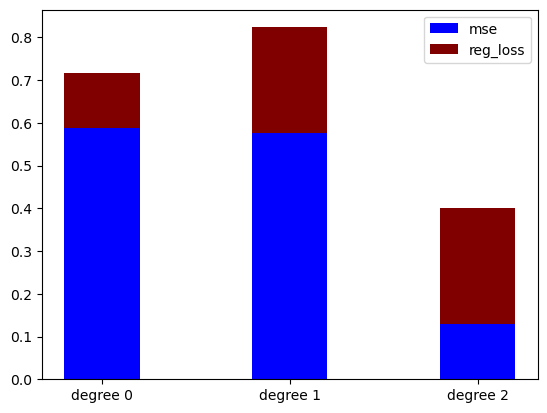

cubic-41
loss [0.0738492098444101, 0.19153232690806818, 0.18287440743642175]
mse [0.5018727428015461, 0.4040408216679775, 0.07168105471214029]


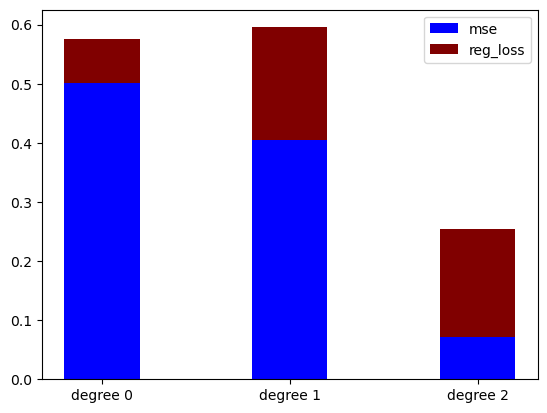

cubic-42
loss [0.07915408543355269, 0.18231354583776402, 0.16885951370987604]
mse [0.6068555752438884, 0.5750007089055581, 0.06197766137665093]


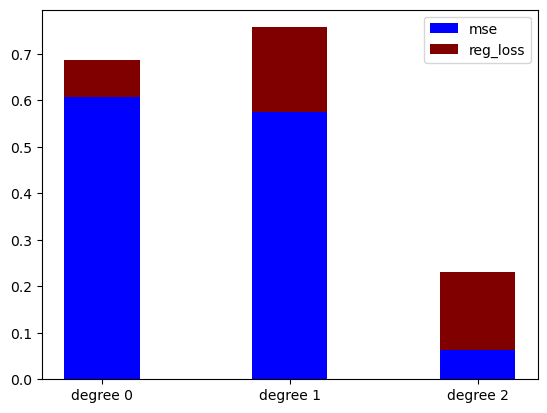

cubic-43
loss [0.07152486672577271, 0.19026688158986532, 0.19367590539065796]
mse [0.6102031366178251, 0.46853627467243264, 0.07744734420155037]


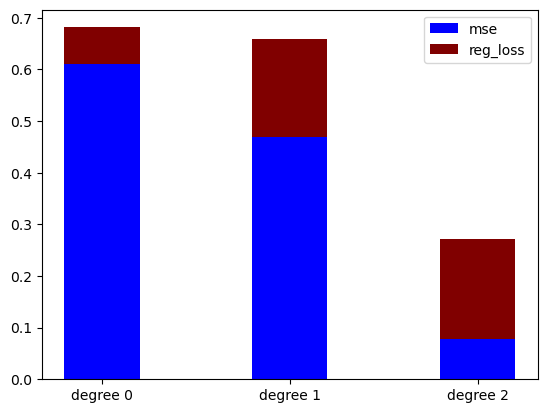

cubic-44
loss [0.08557817831865847, 0.19968527552231413, 0.2022608842333803]
mse [0.5259980810145856, 0.4801487967439237, 0.08449838881490207]


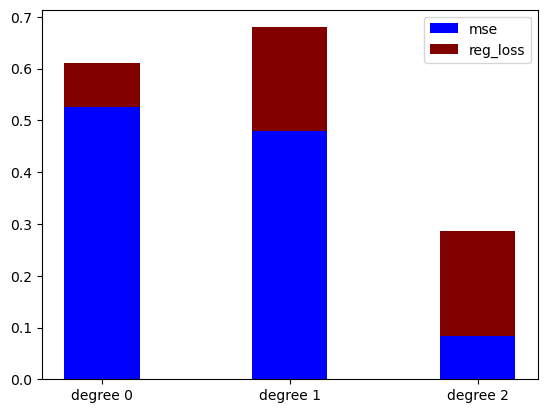

cubic-45
loss [0.12551743891703504, 0.259147380916773, 0.2892728234928537]
mse [0.5209506380956133, 0.5170284691144685, 0.12173821073925366]


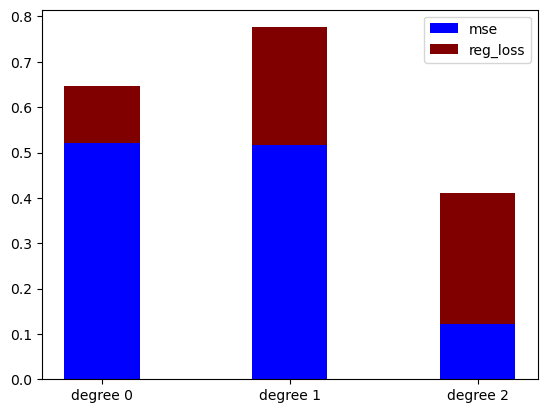

cubic-46
loss [0.09185726925452686, 0.19052684207461365, 0.18188044755488533]
mse [0.6622791101207383, 0.6588449575483675, 0.09940121504222674]


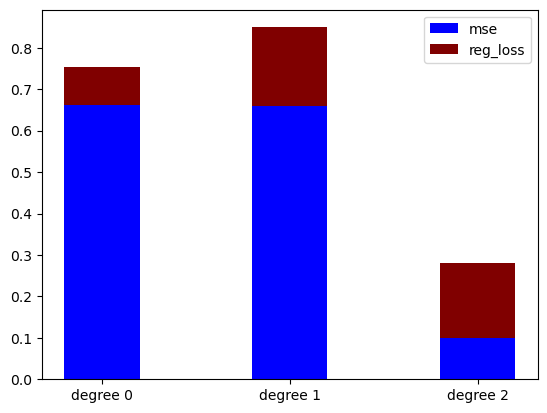

cubic-47
loss [0.12667690394584982, 0.2531173019093044, 0.2989090192025525]
mse [0.5287414624587473, 0.5287367613333, 0.12992290236722073]


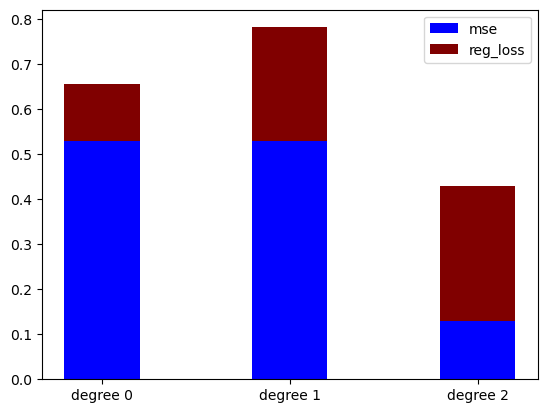

cubic-48
loss [0.08553114608844604, 0.18317767609257418, 0.17961550583593439]
mse [0.5735171018489373, 0.5634115506386617, 0.07819480477159005]


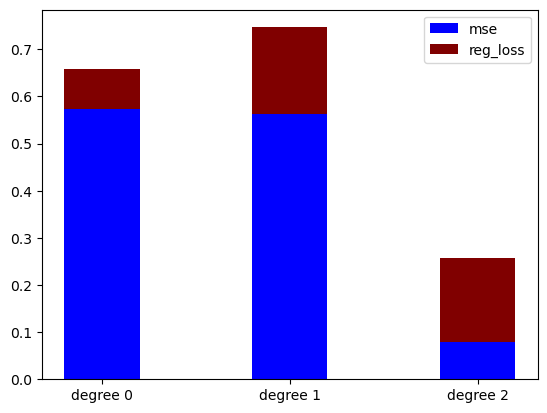

cubic-49
loss [0.1250721334609472, 0.24700879703168932, 0.27535247353064485]
mse [0.6601825429794601, 0.6594306994654612, 0.12129342324300998]


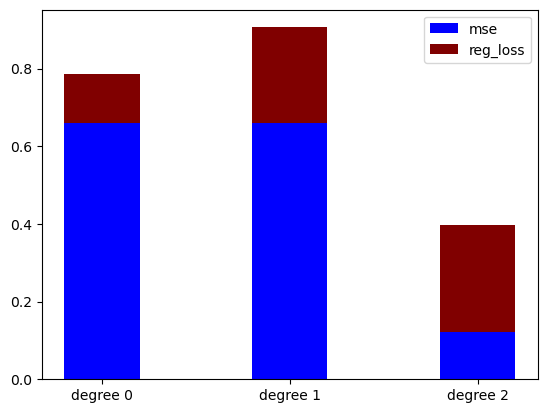

cubic-50
loss [0.07530383742853884, 0.19043774337044228, 0.16876849610428504]
mse [0.5931465910008161, 0.5082251261996069, 0.08116920721126854]


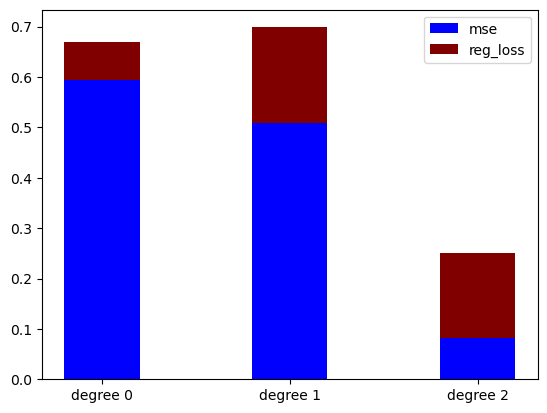

reno-1
loss [0.09431407228968008, 0.14997414823665142, 0.2036431229458162]
mse [0.1870454732919028, 0.07633631420624995, 0.05049753249957781]


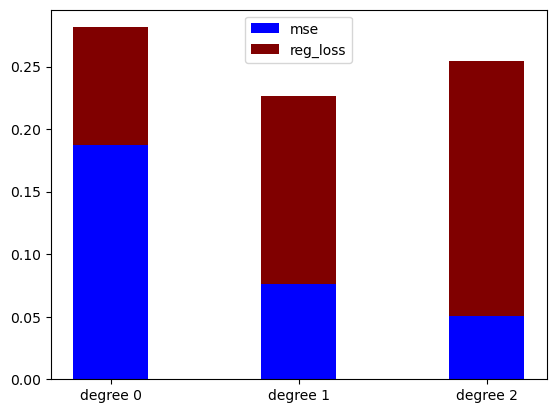

reno-2
loss [0.08870431629052286, 0.1319361678100348, 0.17452192996204663]
mse [0.15458096595469425, 0.04570830062298789, 0.02616384204922479]


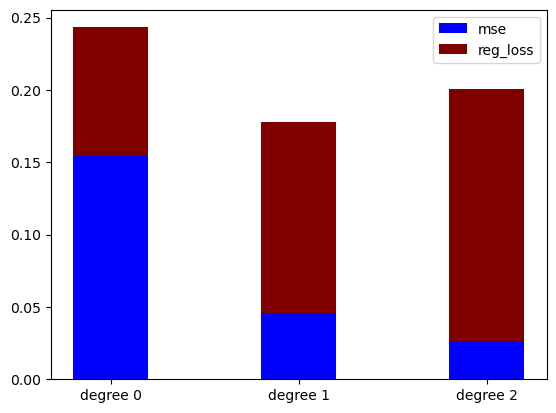

reno-3
loss [0.09900324557805001, 0.1573254778024311, 0.21573838357757255]
mse [0.1740264964493397, 0.07247638574695019, 0.05398457833519351]


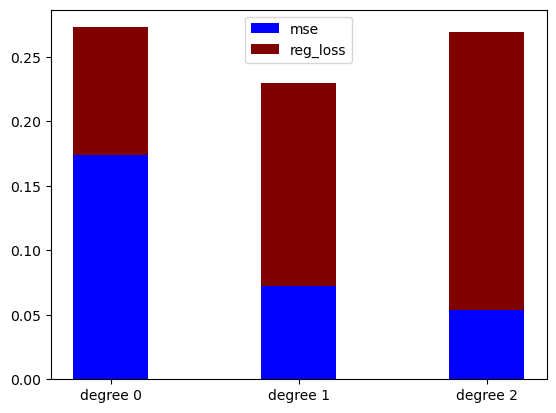

reno-4
loss [0.0800100912414038, 0.12052376848221553, 0.160621709547354]
mse [0.14390915308551772, 0.038165176790043116, 0.019646418587275116]


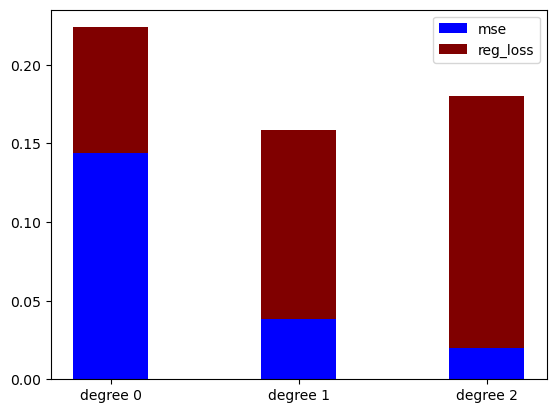

reno-5
loss [0.07781683391211713, 0.11958490502101625, 0.16870359446061853]
mse [0.09982202321834883, 0.02219277447691865, 0.017673163777030286]


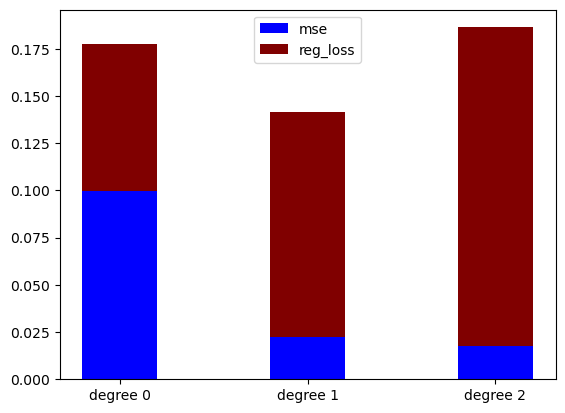

reno-6
loss [0.09239520739736058, 0.14532657727456386, 0.1989657066804978]
mse [0.2617653664744746, 0.11918724597319874, 0.08541632778582774]


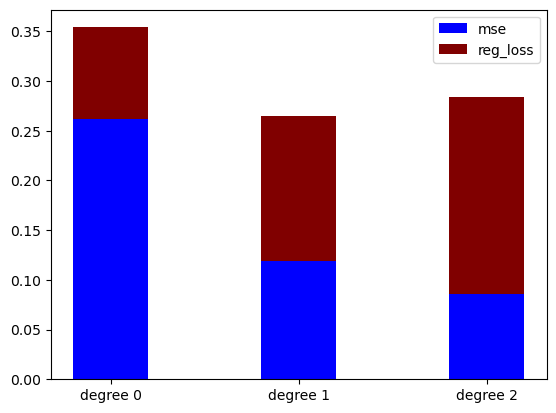

reno-7
loss [0.08858071843308885, 0.13306901048874062, 0.1827140412068465]
mse [0.1344444756232688, 0.0306186070660095, 0.020701373579343856]


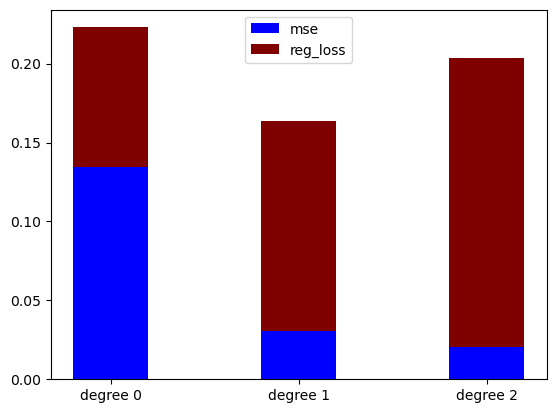

reno-8
loss [0.0922422408059367, 0.14296331955028446, 0.19604251703229958]
mse [0.20161759453253966, 0.0708823276095585, 0.048502471922458906]


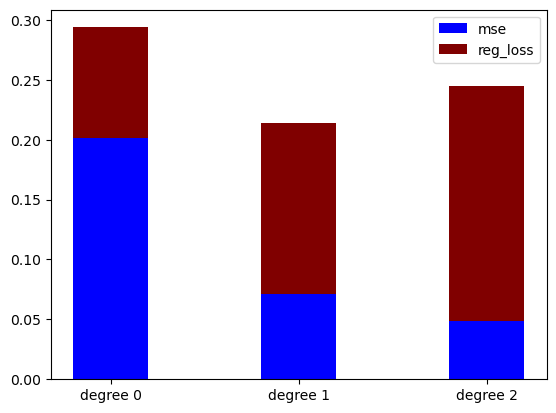

reno-9
loss [0.07407205977303657, 0.11421341783914261, 0.16189059755109772]
mse [0.07939421827850934, 0.017081694032666905, 0.014349877530239861]


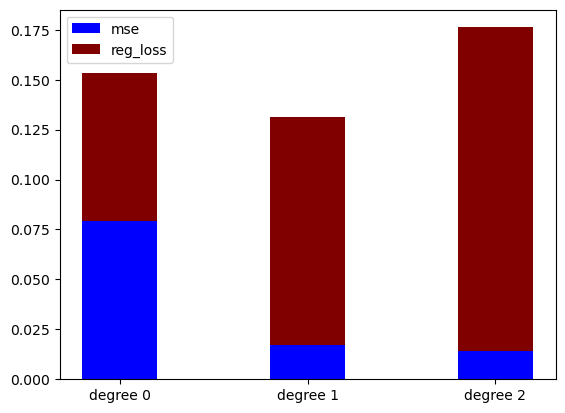

reno-10
loss [0.06745259517459555, 0.09578589185798024, 0.13348654569055474]
mse [0.07708029684408943, 0.013814762411695134, 0.011287645233718842]


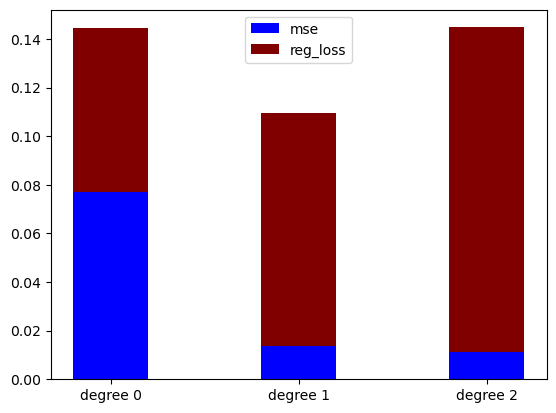

reno-11
loss [0.08484754894389915, 0.13604186362977863, 0.1880328479570391]
mse [0.1450760686414505, 0.05421940697896848, 0.03881691890013505]


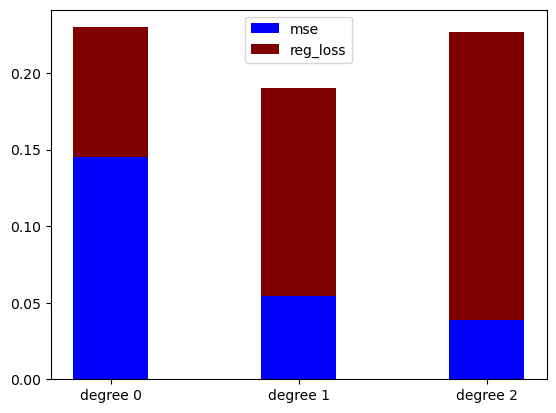

reno-12
loss [0.07904656037843681, 0.12207745614741945, 0.16977862208545533]
mse [0.094637179135992, 0.02426308944582447, 0.016690696494977758]


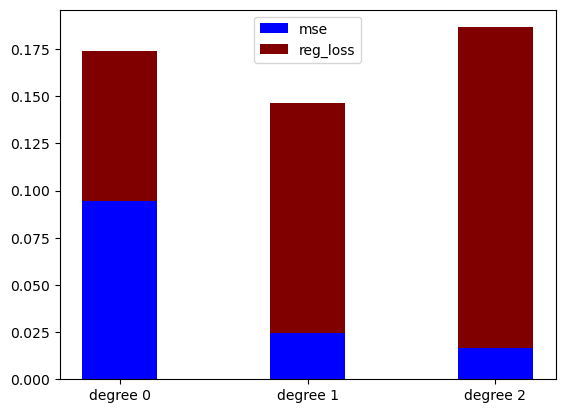

reno-13
loss [0.07570991002000055, 0.11302265107902963, 0.152111698054439]
mse [0.08887476863844841, 0.01870523163472744, 0.010559353600563526]


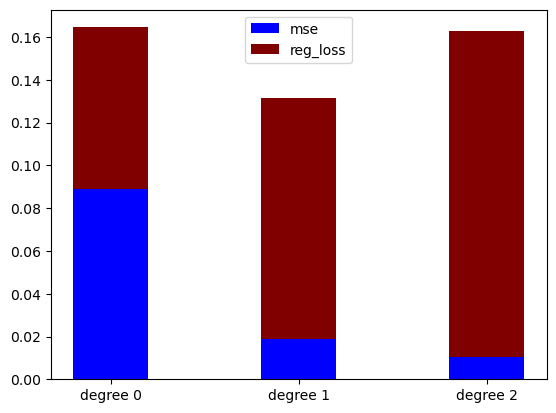

reno-14
loss [0.07892059524289477, 0.12345198209322238, 0.17449047636624623]
mse [0.09794668415416949, 0.02590392093491338, 0.02080857229929563]


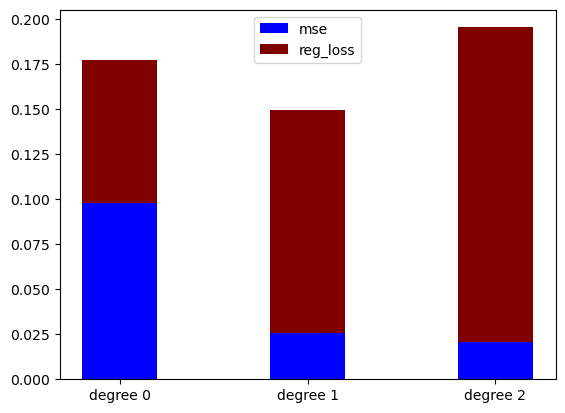

reno-15
loss [0.08369931387680435, 0.12943538731978013, 0.18187704509989452]
mse [0.14343470432899055, 0.038782080592349534, 0.030230702033514557]


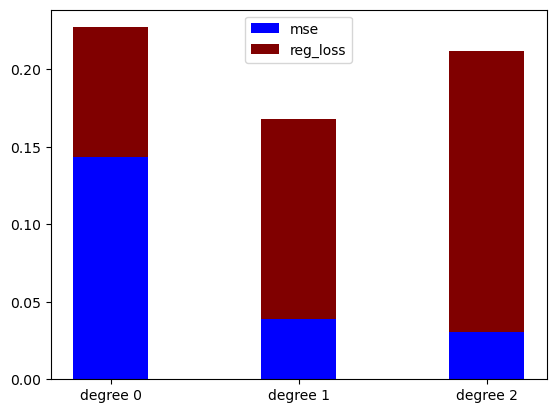

reno-16
loss [0.0954634692739676, 0.15096874125717072, 0.2095870044994162]
mse [0.16594966456472898, 0.06525347264181469, 0.0522178227651723]


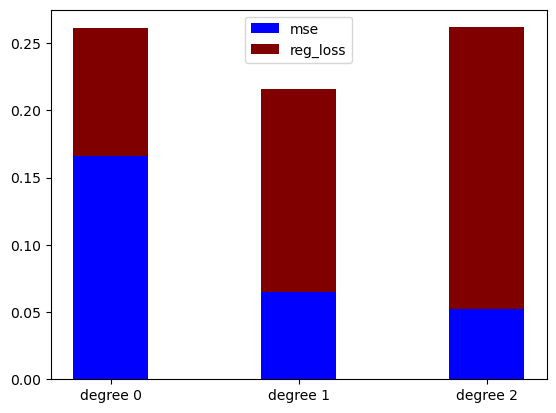

reno-17
loss [0.09514200592080863, 0.15038084763463266, 0.20713797825370595]
mse [0.21153703152594774, 0.08664273004765656, 0.06408842690269721]


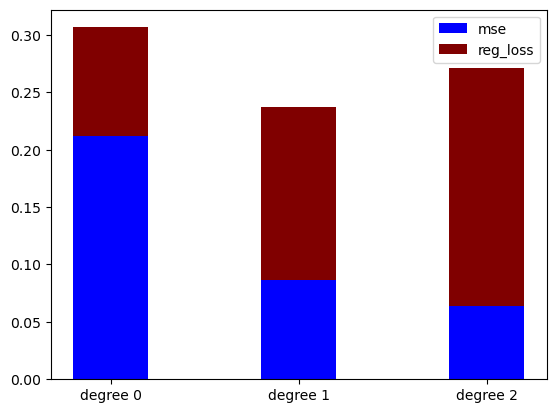

reno-18
loss [0.09513569077697581, 0.15916042509748038, 0.22271831894452454]
mse [0.12777936781510038, 0.056253558333917576, 0.04508250373220546]


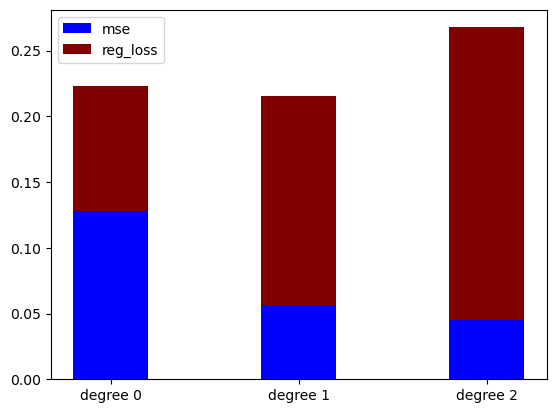

reno-19
loss [0.09626601091072054, 0.14857587717543022, 0.19993276637907098]
mse [0.20024665211688228, 0.07488877570752848, 0.04830259108376652]


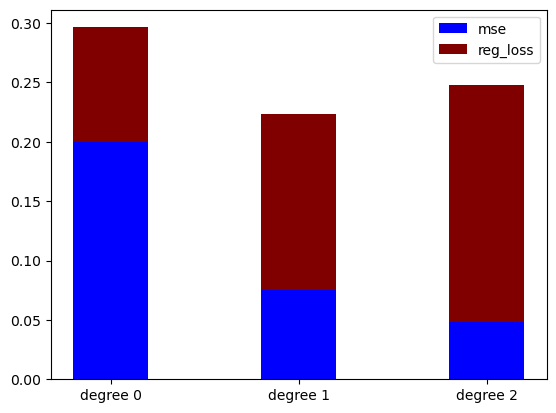

reno-20
loss [0.08597641321601124, 0.1288096698755179, 0.17677931383112389]
mse [0.22025865698996902, 0.0737121894920645, 0.050936663964050416]


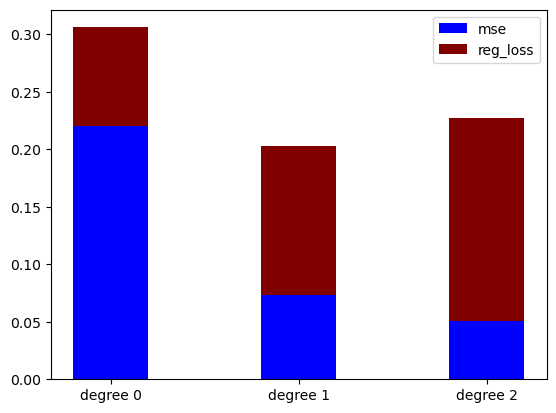

reno-21
loss [0.09339406419162241, 0.13696849047379034, 0.17988163592686915]
mse [0.27184283387129327, 0.09361746616556789, 0.05506605641286916]


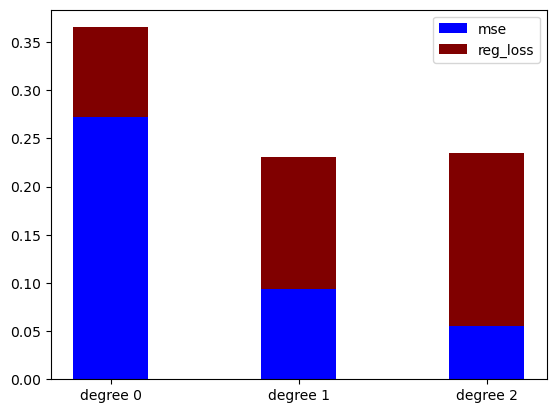

reno-22
loss [0.08703428435957947, 0.1348576201524849, 0.18031269423091667]
mse [0.13253432051220687, 0.03857880350136813, 0.021568615126746394]


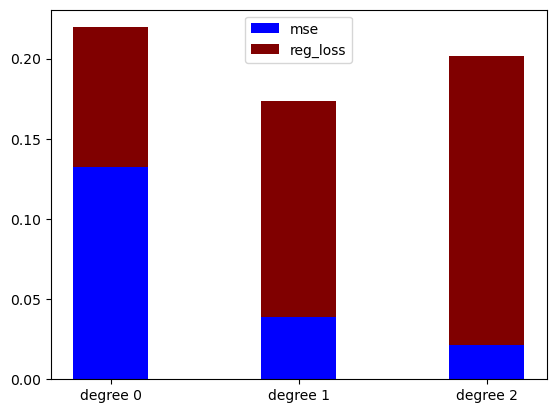

reno-23
loss [0.0791007713668388, 0.12165801863571948, 0.1639670358976354]
mse [0.13394192334986382, 0.045926238485008826, 0.025510509627746744]


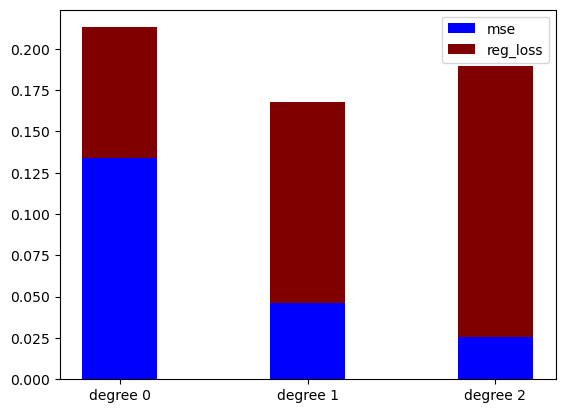

reno-24
loss [0.08571872759999069, 0.14360127107732198, 0.20386541532890978]
mse [0.08961095239278234, 0.03818391872691051, 0.032754495512241834]


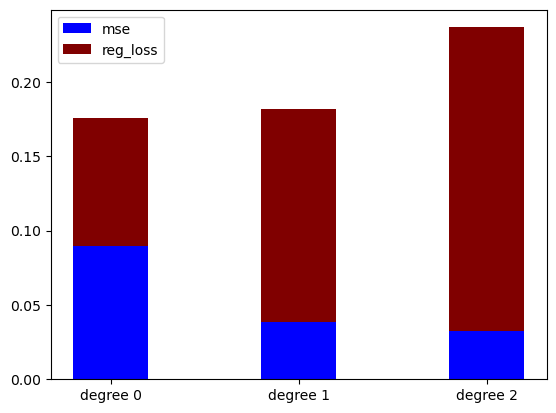

reno-25
loss [0.07215190058054738, 0.10181383702128644, 0.1369381888508619]
mse [0.080195022767337, 0.015254211284968148, 0.010236650877037741]


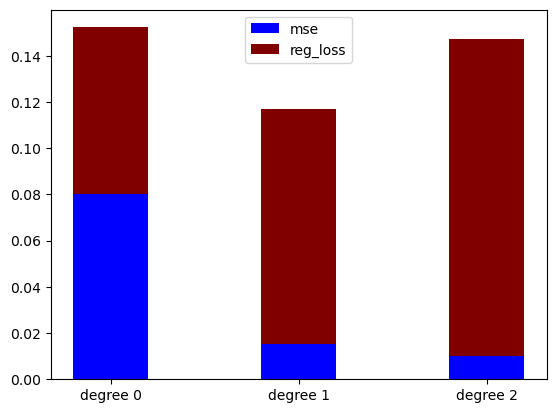

reno-26
loss [0.08388795169285121, 0.13254509272636872, 0.18444913620671358]
mse [0.1223297550848728, 0.035582267573287925, 0.027010960498273364]


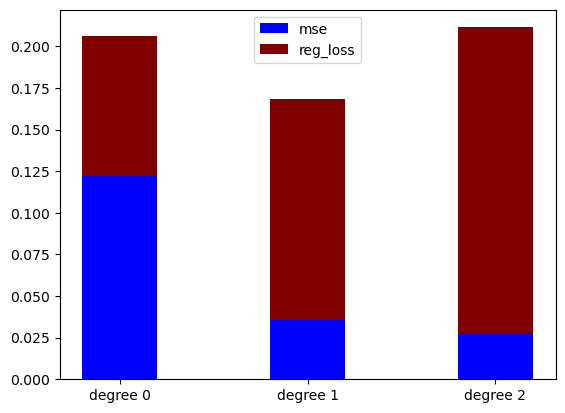

reno-27
loss [0.09543852833121097, 0.1471100628792855, 0.1958109315916925]
mse [0.20468674165544024, 0.07813385968129984, 0.05033303576456158]


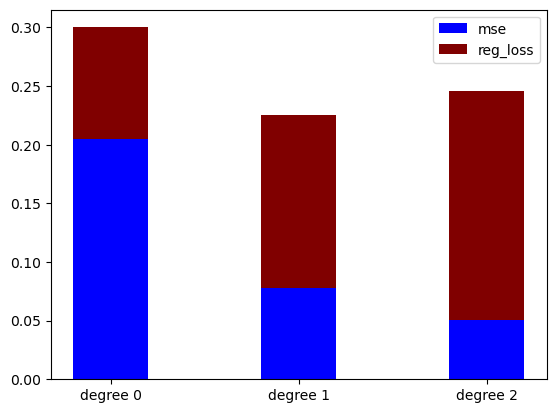

reno-28
loss [0.09852935013024931, 0.14957053791112546, 0.20392267485158683]
mse [0.15277695472733474, 0.04880981471529263, 0.03479470129870847]


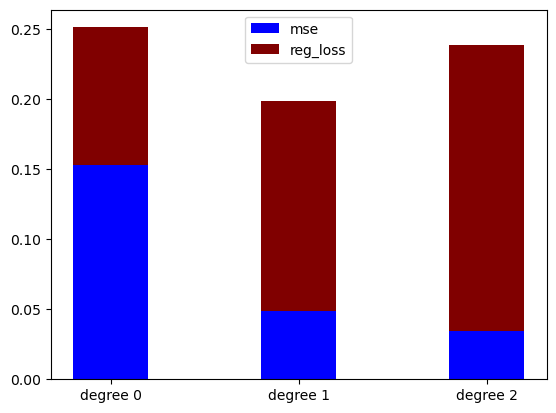

reno-29
loss [0.08351980047582191, 0.12328148446264563, 0.16845717210329597]
mse [0.11873430357259694, 0.031129631165006836, 0.020245908056177438]


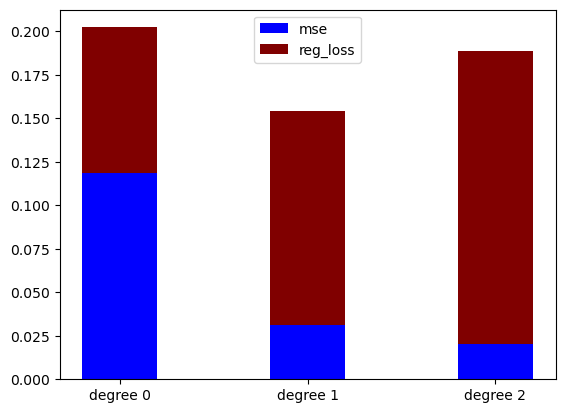

reno-30
loss [0.07730389712682104, 0.11664947060684785, 0.16144873004019927]
mse [0.10610432152685342, 0.021229302724548905, 0.014409146822266822]


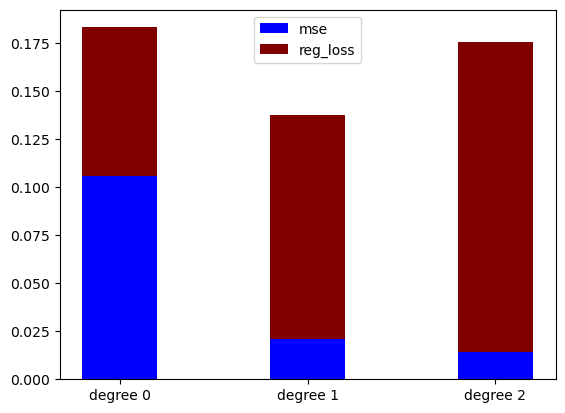

reno-31
loss [0.08768364406294687, 0.13220329363130187, 0.17541161987836065]
mse [0.12814400864567407, 0.03623841933990248, 0.021363864600125435]


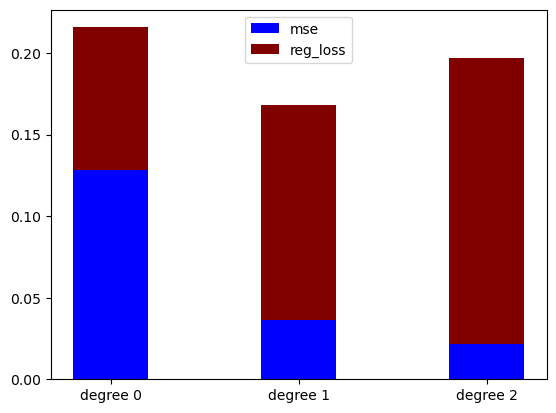

reno-32
loss [0.08998840569425809, 0.14085738327783287, 0.19005904670368134]
mse [0.18007866720061716, 0.06546835140819202, 0.04107084924614283]


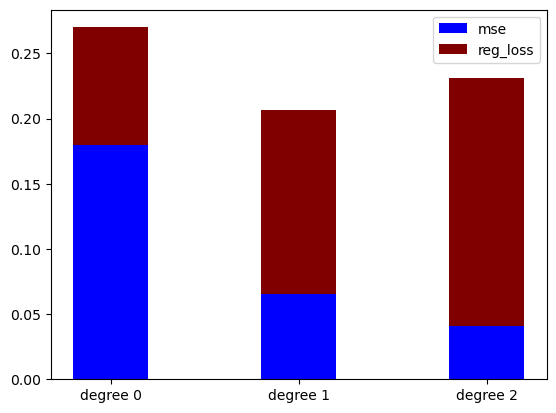

reno-33
loss [0.08155754592098866, 0.12640583134425923, 0.16778016438082508]
mse [0.19315967669572906, 0.07816039636291273, 0.042778374707544774]


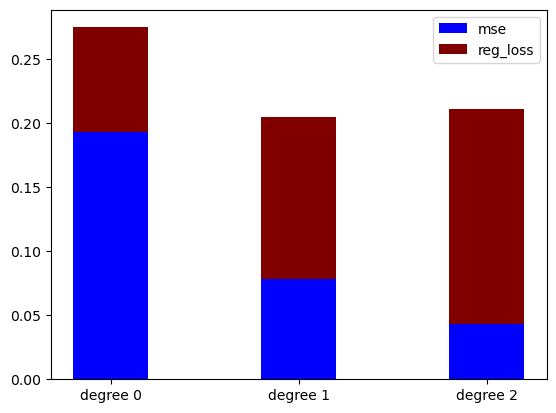

reno-34
loss [0.08449774096055176, 0.13037981202012208, 0.1809018548054928]
mse [0.12673454228140263, 0.03626480195735096, 0.026650984104751054]


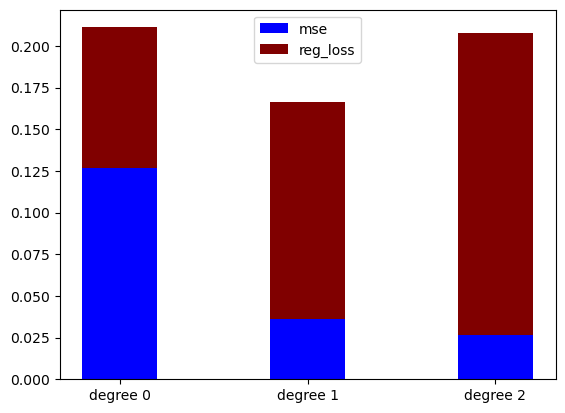

reno-35
loss [0.09254936970137385, 0.13847832548043446, 0.18677287071960463]
mse [0.13959040346554324, 0.03821204304480489, 0.024564508884475166]


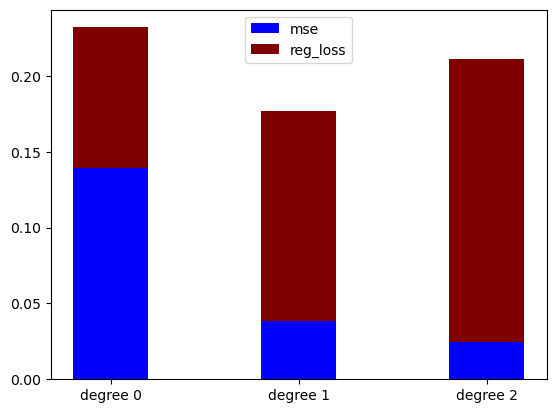

reno-36
loss [0.08071429026121456, 0.12876838053123726, 0.18528392288652717]
mse [0.10281925126916538, 0.031791176989903684, 0.02783825084945172]


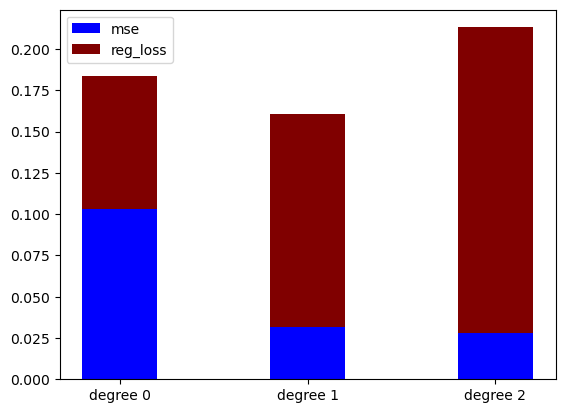

reno-37
loss [0.08315521895107253, 0.13059809762520205, 0.18621880487999964]
mse [0.11610072294035463, 0.03511690283880337, 0.030446278876791875]


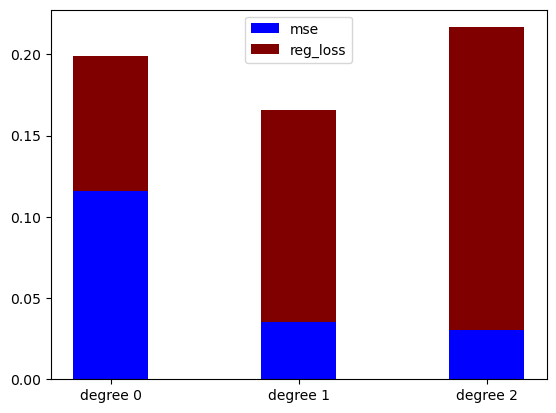

reno-38
loss [0.08779158340637633, 0.1436293890229811, 0.20051737174458562]
mse [0.12166408829900417, 0.04939601036556895, 0.03600490677021007]


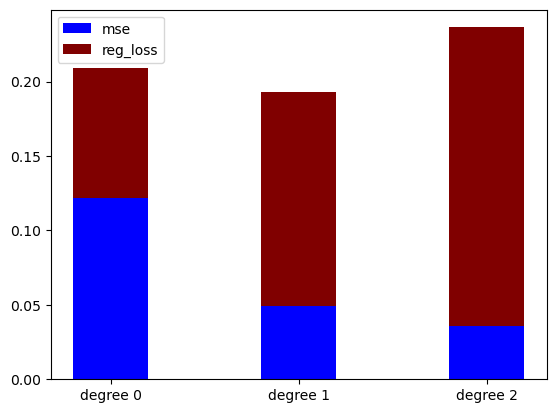

reno-39
loss [0.07445570174906808, 0.11162626763726764, 0.1539874503699116]
mse [0.09154804078502685, 0.01672571351660358, 0.01036478160138731]


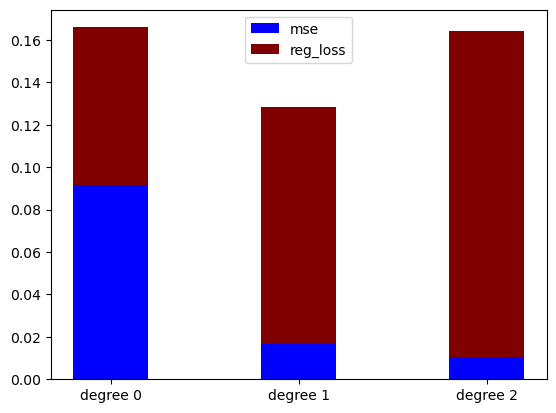

reno-40
loss [0.08813690641494037, 0.1409414393485987, 0.19660457118199773]
mse [0.13332538660426668, 0.04897971610118112, 0.037999060294449875]


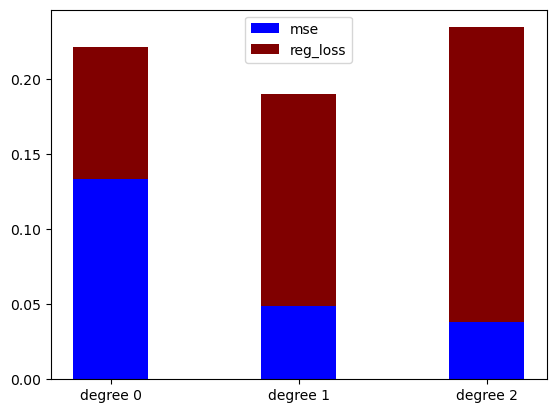

reno-41
loss [0.08785723288367941, 0.14510108838991576, 0.2033838738387234]
mse [0.13234011862602177, 0.059619515741858364, 0.04738136888263198]


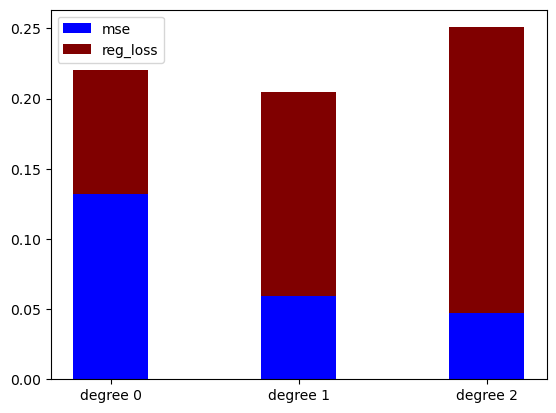

reno-42
loss [0.057708472848309406, 0.07584595371041965, 0.10052361340399402]
mse [0.0849246284669346, 0.009210443786957193, 0.004297555728063947]


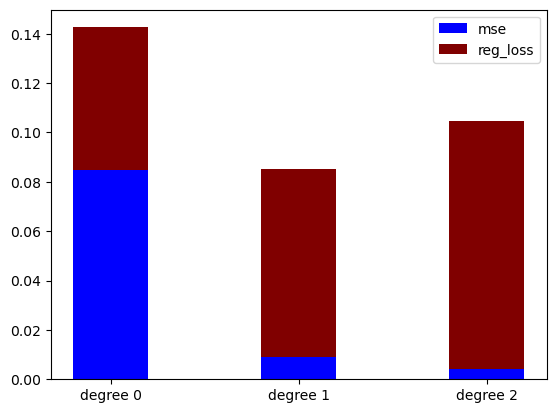

reno-43
loss [0.07778218915384547, 0.12450064437202385, 0.17715461120046463]
mse [0.09278076771932264, 0.027732388675372685, 0.023201816547635402]


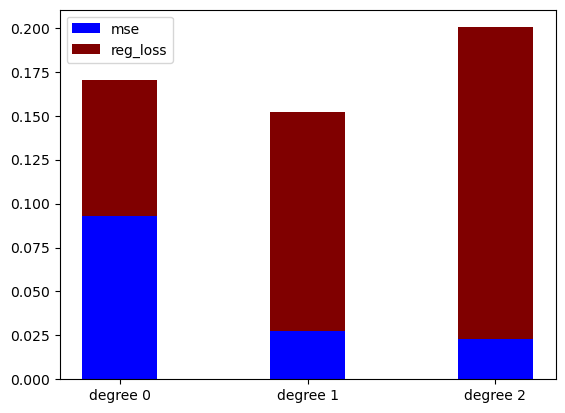

reno-44
loss [0.07290364451034292, 0.11739371838028825, 0.16827925824556386]
mse [0.07739767010813449, 0.026735511224440865, 0.02355991666387566]


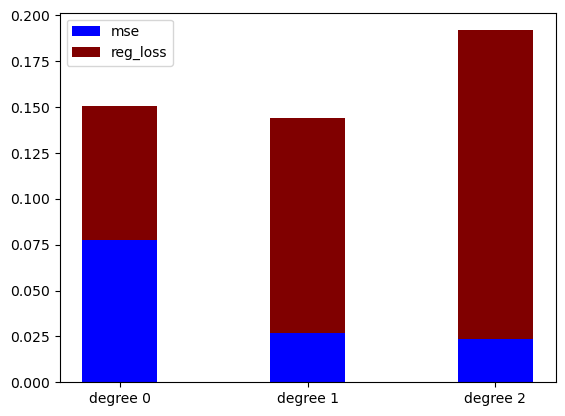

reno-45
loss [0.08855004990303691, 0.13803519548252458, 0.18716953626069405]
mse [0.15623569126993453, 0.05296120746647447, 0.03413101559613931]


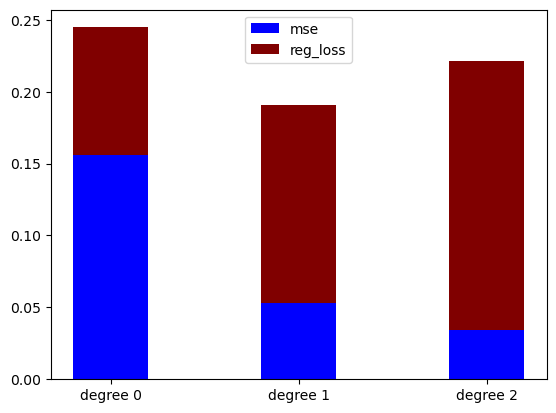

reno-46
loss [0.06961423040262053, 0.10750114646623482, 0.14601036183895708]
mse [0.09358654446845718, 0.0292019963589563, 0.016500193827108444]


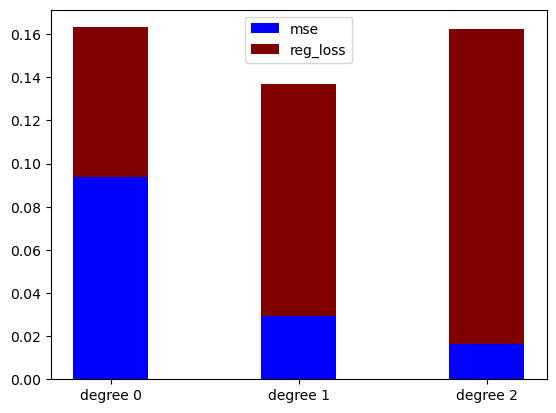

reno-47
loss [0.08324600185793102, 0.12752673751927782, 0.1795323899109955]
mse [0.1152681601553748, 0.025012880232114527, 0.01966050735769191]


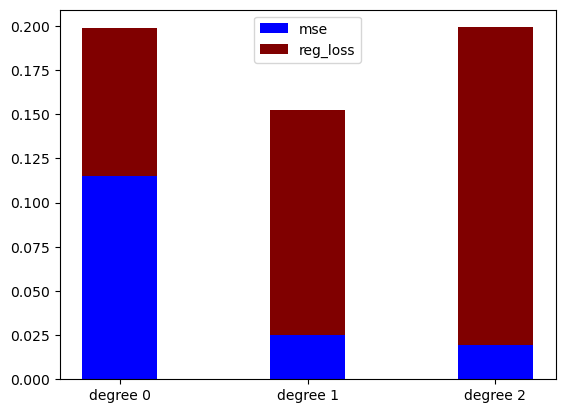

reno-48
loss [0.08249679018997406, 0.1282863588139067, 0.17698346355596942]
mse [0.1129851104884338, 0.030793279340048472, 0.020597724464217575]


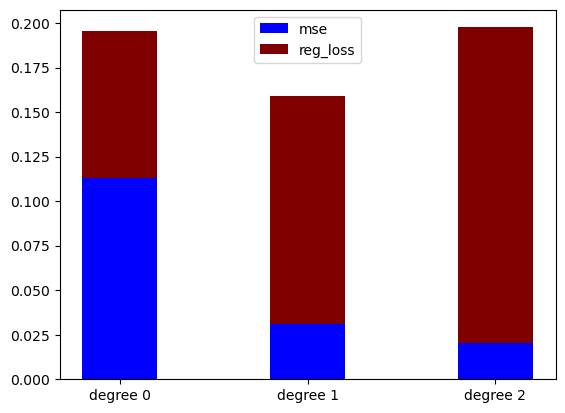

reno-49
loss [0.07590204442524695, 0.11419358761338194, 0.1547837674002577]
mse [0.25498555668098644, 0.08944913879805609, 0.045479767057836816]


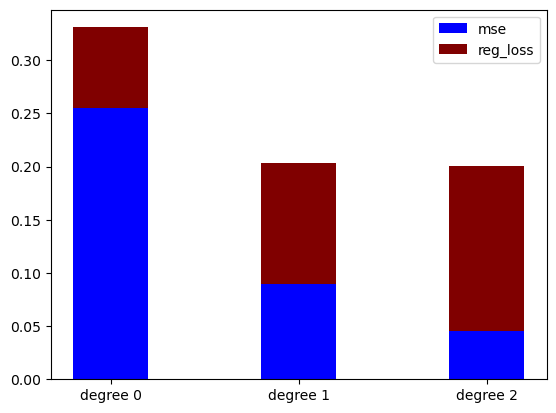

reno-50
loss [0.06189231961507873, 0.08829963322543169, 0.12788612944350916]
mse [0.06507318541708676, 0.007901901499437395, 0.007265689659968272]


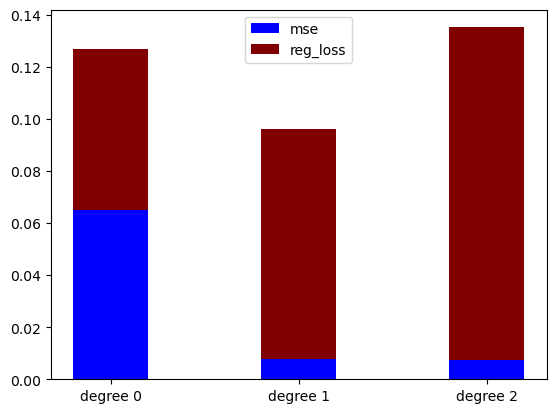

In [75]:
results = {}
for name in nmp.keys():
    print(name)
#     curr_time, curr_data, retrans, rtt = plot_one_bt(name+"-0-50-200-2-aws-88-60",'y',1)
    data = nmp[name]['data']
    time = nmp[name]['time']
    max_deg = nmp[name]['max_deg']
    p_net = nmp[name]['p_net']
    mse_l = nmp[name]['mse_l']
#     plt.plot(time, data,c='k',label='Truth')
#         plt.plot(time, fit_l)
#     for d in range(0, max_deg):
#         plot_label = "degree"+str(d+1)
#         fit_net = np.polyval(p_net[d],time)
#         plt.plot(time, fit_net,label="degree" + str(d+1))
#     plt.legend()
#     plt.show()
    
    names = []
    loss = []
    lambd = 0.05
    for i in range(len(mse_l)):
        loss.append((i+1)*sum(p_net[i])*lambd)
    print("loss", loss)
    print("mse", mse_l)
    for d in range(0, max_deg):
        names.append("degree "+str(d))
    plt.bar(names,mse_l,color='blue',width=0.4,label="mse")
    plt.bar(names,loss,bottom=mse_l,color='maroon',width=0.4,label="reg_loss")
    
    plt.legend()
    plt.show()
    errors = []
    # The code for deciding the categories
    for i in range(0,max_deg):
        errors.append(loss[i]+mse_l[i])
    deg = errors.index(min(errors))+1
#     if deg < 3:
#         deg = mse_l.index(min(mse_l[0:2]))+1
#     print(deg)
    if deg not in results:
        results[deg] = {}
    current_cc = name.split("-")[0]
    if current_cc not in results[deg]:
        results[deg][current_cc] = 0
    results[deg][current_cc] += 1

In [61]:
results

{1: {'bic': 44,
  'dctcp': 27,
  'highspeed': 25,
  'htcp': 3,
  'lp': 29,
  'nv': 30,
  'scalable': 24,
  'vegas': 34,
  'westwood': 27,
  'yeah': 50,
  'reno': 23},
 3: {'bic': 2, 'htcp': 47, 'nv': 12, 'vegas': 15, 'veno': 48, 'cubic': 49},
 2: {'bic': 2,
  'dctcp': 23,
  'highspeed': 25,
  'lp': 21,
  'nv': 8,
  'scalable': 1,
  'vegas': 1,
  'veno': 2,
  'westwood': 23,
  'cubic': 1,
  'reno': 27}}

In [82]:
degrees = [1,2,3]
matrix = []
for d in degrees:
    row = []
    for cc in ccs:
        if cc in results[d]:
            row.append(results[d][cc])
        else:
            row.append(0)
    matrix.append(row)
df = pd.DataFrame(matrix,index=degrees,columns=ccs)
print(df)
cc_degree = {}
for cc in ccs:
    d_list = list(df[cc])
    deg = d_list.index(max(d_list))+1
    print(cc,deg)
    cc_degree[cc] = deg 
    

   bic  dctcp  highspeed  htcp  lp  nv  scalable  vegas  veno  westwood  yeah  \
1   40      0          0     0   3  20        18     14     0         7    44   
2    4     47         48     0  45  12         5      2     0        25     6   
3    4      3          2    50   2  18         2     34    50        18     0   

   cubic  reno  
1      0     1  
2      1    48  
3     49     1  
bic 1
dctcp 2
highspeed 2
htcp 3
lp 2
nv 1
scalable 1
vegas 3
veno 3
westwood 2
yeah 1
cubic 3
reno 2


In [78]:
## Corrected version :
# CUBIC =  HTCP VENO CUBIC
# QUADRATIC = DCTCP HIGHSPEED LP WESTWOOD RENO
# Linear = BIC SCALABLE YEAH 
# Problem with NV - Currently left

### Getting the gaussian paramters according to the cc

In [79]:
def getCCcoeff(ccs,cc_degree,present_files,ss=225,p="n",ft_thresh=1):
    cc_coeff = {}
    for v in ccs: 
        files = []
        for f in present_files:
            curr_cc = f.split("-")[0]
            if v == curr_cc :
                files.append(f)
        degree = cc_degree[v]
        if len(files) > 0 :
            cc_mp = get_feature_degree(files,ss=ss,p=p,ft_thresh=ft_thresh,max_deg=degree)
            coeff = getCC(files, cc_mp,p=p)
#             print(v)
#             print(files)
            cc_coeff[v] = coeff[v]
        #     getRed(files,p="y")
    return cc_coeff 

In [80]:
def getCoeff(cc_coeff):
    vals = {}
    degree = 0
    for cc in cc_coeff:
        coeff = cc_coeff[cc]
        if cc not in vals :
            vals[cc] = {}
        for trace in coeff:
            i = 1
            for feature in trace:
                if i not in vals[cc]:
                    vals[cc][i] = []
                vals[cc][i].append(feature)
                i+=1
    return vals

In [81]:
def getGaussianParams(vals):
    cc_gaussian_params = {}
    for cc in vals :
        # Taking the first feature only
        if len(list(vals[cc].keys()))==0 :
            continue
        data = vals[cc][1]
        n = 0
        cc_coeff_mean = np.mean(data,axis=0)
        # OGb
#         coeff_var = np.cov(data, rowvar=False)
#         iden = np.identity(len(cc_coeff_mean))
#         cc_coeff_var = coeff_var * iden
        #TRY
        cc_coeff_var = np.cov(data,rowvar=False)
        cc_gaussian_params[cc] = {
            'mean' : cc_coeff_mean,
            'covar' : cc_coeff_var
        }
    return cc_gaussian_params

In [107]:
def train(var,cc_degree,present_files,ss=225):
    cc_coeff = getCCcoeff(var,cc_degree,present_files,ss=ss,ft_thresh=1)
    vals = getCoeff(cc_coeff)
    cc_gaussian_params = getGaussianParams(vals)
    return vals, cc_gaussian_params

In [84]:
cc_degree

{'bic': 1,
 'dctcp': 2,
 'highspeed': 2,
 'htcp': 3,
 'lp': 2,
 'nv': 1,
 'scalable': 1,
 'vegas': 3,
 'veno': 3,
 'westwood': 2,
 'yeah': 1,
 'cubic': 3,
 'reno': 2}

In [113]:
# Saving the cc_gaussian_params:
import pickle
with open("cc_degree.txt",'wb') as f:
    pickle.dump(cc_degree,f)

### Getting corrrect training files 


Use mahalonobis distance to det the files that have the features correctly descibed. This reduce undue variance within the model

In [90]:
def is_pos_def(A):
    if np.allclose(A, A.T):
        try:
            np.linalg.cholesky(A)
            return True
        except np.linalg.LinAlgError:
            return False
    else:
        return False 

from scipy.stats import chi2

In [103]:
dont_use_ind = {}
for cc in ccs:
    temp_check = []
    for i in range(1,151):
        temp_check.append(cc+"-"+str(i)+"-0-50-200-2-aws-88-60")
    cc_mp = get_feature_degree(temp_check, ss=225,p="n",ft_thresh=1,max_deg=cc_degree[cc])
    x = []
    for key in cc_mp.keys():
        x.append(cc_mp[key][0]['coeff'])
    x = np.array(x)
    x_mean = x.mean(axis=0)
    if cc_degree[cc] == 1:
        x_covar = np.array([[np.cov(x, rowvar=False)]])
    else :
        x_covar = np.cov(x, rowvar=False)
    x_covar_inv = np.linalg.inv(x_covar)
    print(x_mean)
    print(x_covar)
    print(is_pos_def(x_covar))
    print(is_pos_def(x_covar_inv))
    x_diff = x - x_mean
    md = []
    for i in range(len(x_diff)):
        md.append(x_diff[i].dot(x_covar_inv).dot(x_diff[i]))
    p = 1 - chi2.cdf(md, 4)
    ind = []
    thresh = 0.05
    for i in range(len(md)):
        if p[i] < thresh:
            print(red)
            ind.append(i)
        print(i,md[i],p[i],p[i]<thresh)
        print(black)
    dont_use_ind[cc] = ind


bic-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56518', '56520'])
Port 56520
Feature Length  203
bic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42624', '42626'])
Port 42626
Feature Length  203
bic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58296', '48886'])
Port 48886
Feature Length  203
bic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52340', '52350'])
Port 52350
Feature Length  203
bic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-5-0-50-200-2-aws-88-60-tcp.csv...

All Ports :  dict_keys(['44184', '44188'])
Port 44188
Feature Length  203
bic-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56500', '56510'])
Port 56510
Feature Length  203
bic-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48326', '48330'])
Port 48330
Feature Length  203
bic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58644', '58652'])
Port 58652
Feature Length  203
bic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33766', '33780'])
Port 33780
Feature Length  203
bic-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-44-

Feature Length  203
bic-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53162', '53168'])
Port 53168
Feature Length  203
bic-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36520', '36528'])
Port 36528
Feature Length  203
bic-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51634', '51642'])
Port 51642
Feature Length  203
bic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48870', '48878'])
Port 48878
Feature Length  203
bic-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic

Feature Length  203
bic-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51966', '51978'])
Port 51978
Feature Length  203
bic-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36352', '36362'])
Port 36362
Feature Length  203
bic-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35430', '35440'])
Port 35440
Feature Length  203
bic-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39128', '39136'])
Port 39136
Feature Length  203
bic-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-121-0-50-200-2-aws-88-60
Reading ../../contr

All Ports :  dict_keys(['56526', '56536'])
Port 56536
Feature Length  203
dctcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57982', '57990'])
Port 57990
Feature Length  203
dctcp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50810', '50822'])
Port 50822
Feature Length  203
dctcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48420', '48426'])
Port 48426
Feature Length  203
dctcp-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52374', '52388'])
Port 52388
Feature Length  203
dctcp-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

Feature Length  203
dctcp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42874', '42888'])
Port 42888
Feature Length  203
dctcp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34714', '34724'])
Port 34724
Feature Length  203
dctcp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50234', '50236'])
Port 50236
Feature Length  203
dctcp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37414', '37428'])
Port 37428
Feature Length  203
dctcp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-45-0-50-200-2-aws-88-60
Readi

All Ports :  dict_keys(['42194', '42210'])
Port 42210
Feature Length  203
dctcp-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33586', '33594'])
Port 33594
Feature Length  203
dctcp-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39630', '39640'])
Port 39640
Feature Length  203
dctcp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50134', '50142'])
Port 50142
Feature Length  203
dctcp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35644', '35646'])
Port 35646
Feature Length  203
dctcp-82-0-50-200-2-aws-88-60


All Ports :  dict_keys(['48998', '49014'])
Port 49014
Feature Length  203
dctcp-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51704', '51714'])
Port 51714
Feature Length  203
dctcp-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34646', '34648'])
Port 34648
Feature Length  203
dctcp-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57328', '57334'])
Port 57334
Feature Length  203
dctcp-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40084', '40088'])
Port 40088
Feature Length  203
dctcp-119-0-50-200

Feature Length  203
highspeed-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40538', '40544'])
Port 40544
Feature Length  203
highspeed-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33546', '33558'])
Port 33558
Feature Length  203
highspeed-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37424', '37434'])
Port 37434
Feature Length  203
highspeed-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46360', '46364'])
Port 46364
Feature Length  203
highspeed-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 500

Feature Length  203
highspeed-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33794', '33802'])
Port 33802
Feature Length  203
highspeed-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53878', '57200'])
Port 57200
Feature Length  203
highspeed-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43626', '43630'])
Port 43630
Feature Length  203
highspeed-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52680', '52694'])
Port 52694
Feature Length  203
highspeed-43-0-50-200-2-aws-88-60
RT

All Ports :  dict_keys(['34486', '34498'])
Port 34498
Feature Length  203
highspeed-75-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51446', '51454'])
Port 51454
Feature Length  203
highspeed-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51722', '51734'])
Port 51734
Feature Length  203
highspeed-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34922', '43226'])
Port 43226
Feature Length  203
highspeed-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46748', '46752'])
Port 46752
Fe

All Ports :  dict_keys(['60766', '60768'])
Port 60768
Feature Length  203
highspeed-112-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-112-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-112-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60466', '60472'])
Port 60472
Feature Length  203
highspeed-113-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-113-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-113-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33780', '33784'])
Port 33784
Feature Length  203
highspeed-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54756', '54764'])
Port 54764
Feature Length  203
highspeed-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37730', '37744'])
P

All Ports :  dict_keys(['54218', '54220'])
Port 54220
Feature Length  203
highspeed-148-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54852', '54856'])
Port 54856
Feature Length  203
highspeed-149-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43878', '43882'])
Port 43882
Feature Length  203
highspeed-150-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-150-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-150-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54270', '51280'])
Port 51280
Feature Length  203
Name : highspeed-11
Degree to fit 2
Name : highspeed-21
Degree to fit 2
Name : highspeed-31
Degree to fit 2
Name : highspeed-41
Degree to fit 2
Name : highspeed-51
Degree to fit 2
Name : highspeed-61
Degree to

Feature Length  203
htcp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58010', '58012'])
Port 58012
Feature Length  203
htcp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36498', '36502'])
Port 36502
Feature Length  203
htcp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51246', '51252'])
Port 51252
Feature Length  203
htcp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33750', '33762'])
Port 33762
Feature Length  203
htcp-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htc

All Ports :  dict_keys(['43944', '43952'])
Port 43952
Feature Length  203
htcp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39388', '39404'])
Port 39404
Feature Length  203
htcp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40406', '40408'])
Port 40408
Feature Length  203
htcp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54078'])
Port 54078
Feature Length  203
htcp-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53034', '53036'])
Port 53036
Feature Length  203
htcp-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['53178', '53180'])
Port 53180
Feature Length  203
htcp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60390', '60392'])
Port 60392
Feature Length  203
htcp-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59780', '59784'])
Port 59784
Feature Length  203
htcp-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33152', '33166'])
Port 33166
Feature Length  203
htcp-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53892', '53904'])
Port 53904
Feature Length  203
htcp-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['50206', '50208'])
Port 50208
Feature Length  203
htcp-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53036', '53046'])
Port 53046
Feature Length  203
htcp-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46030', '55418'])
Port 55418
Feature Length  203
htcp-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37344', '37358'])
Port 37358
Feature Length  203
htcp-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47394', '47406'])
Port 47406
Feature Length  203
htcp-122-0-50-200-2-aws-88-60


All Ports :  dict_keys(['52074', '53888'])
Port 53888
Feature Length  203
lp-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40290', '40302'])
Port 40302
Feature Length  203
lp-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42098', '42106'])
Port 42106
Feature Length  203
lp-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37930', '41328'])
Port 41328
Feature Length  203
lp-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42846', '42858'])
Port 42858
Feature Length  203
lp-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-6-0-50-200-2-aws-88-60
Reading

All Ports :  dict_keys(['53056', '53058'])
Port 53058
Feature Length  203
lp-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42304', '42320'])
Port 42320
Feature Length  203
lp-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40006', '40008'])
Port 40008
Feature Length  203
lp-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40040', '40044'])
Port 40044
Feature Length  203
lp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39958', '39974'])
Port 39974
Feature Length  203
lp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-45-0-50-200-2-aws

All Ports :  dict_keys(['49406', '49414'])
Port 49414
Feature Length  203
lp-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39370', '39384'])
Port 39384
Feature Length  203
lp-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36970', '36978'])
Port 36978
Feature Length  203
lp-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40490', '40504'])
Port 40504
Feature Length  203
lp-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38952', '38956'])
Port 38956
Feature Length  203
lp-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-84-0-50-200-2-aws

All Ports :  dict_keys(['43356', '43366'])
Port 43366
Feature Length  203
lp-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40884', '40898'])
Port 40898
Feature Length  203
lp-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43728', '43742'])
Port 43742
Feature Length  203
lp-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54092'])
Port 54092
Feature Length  203
lp-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57062', '57066'])
Port 57066
Feature Length  203
lp-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-122-

All Ports :  dict_keys(['43298', '43308'])
Port 43308
Feature Length  203
nv-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44606', '36648'])
Port 36648
Feature Length  203
nv-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46792', '46798'])
Port 46798
Feature Length  203
nv-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35556', '35568'])
Port 35568
Feature Length  203
nv-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41912', '52042'])
Port 52042
Feature Length  203
nv-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-7-0-50-200-2-aws-88-60
Reading

Feature Length  203
nv-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53338', '53354'])
Port 53354
Feature Length  203
nv-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52056', '52072'])
Port 52072
Feature Length  203
nv-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42428', '42436'])
Port 42436
Feature Length  203
nv-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37124', '37138'])
Port 37138
Feature Length  203
nv-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-48-0-50-200-2-

Feature Length  203
nv-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-85-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55012', '55016'])
Port 55016
Feature Length  203
nv-86-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35794', '35796'])
Port 35796
Feature Length  203
nv-87-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47114', '47124'])
Port 47124
Feature Length  203
nv-88-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36834', '36850'])
Port 36850
Feature Length  203
nv-89-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-89-0-50-200-2-

All Ports :  dict_keys(['37178', '37192'])
Port 37192
Feature Length  203
nv-126-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-126-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-126-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43580', '43582'])
Port 43582
Feature Length  203
nv-127-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57478', '57492'])
Port 57492
Feature Length  203
nv-128-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48762', '48776'])
Port 48776
Feature Length  203
nv-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37278', '37292'])
Port 37292
Feature Length  203
nv-130-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-130-

Feature Length  203
scalable-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49106', '49110'])
Port 49110
Feature Length  203
scalable-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50910', '50914'])
Port 50914
Feature Length  203
scalable-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38722', '38736'])
Port 38736
scalable-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58562', '58564'])
Port 58564
Feature Length  203
scalable-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-6-0-50-200-2-aws-88-

Feature Length  203
scalable-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41066', '41072'])
Port 41072
Feature Length  203
scalable-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35672', '35680'])
Port 35680
scalable-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38092', '38100'])
Port 38100
Feature Length  203
scalable-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43462', '43470'])
Port 43470
scalable-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-46-0-50-200-2-aws-88-60
Rea

scalable-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35308', '35316'])
Port 35316
scalable-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35902', '35908'])
Port 35908
scalable-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51896', '51910'])
Port 51910
scalable-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35116', '35130'])
Port 35130
scalable-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-85-0-50-200-2-aws-88-60-

All Ports :  dict_keys(['44864', '44866'])
Port 44866
Feature Length  203
scalable-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44944', '44952'])
Port 44952
scalable-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43636', '43640'])
Port 43640
scalable-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44536', '44538'])
Port 44538
Feature Length  203
scalable-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38568', '38576'])
Port 38576
scalable-123-0-50-200-2-aws-88-60
RTT 0.1 

Feature Length  203
vegas-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35616', '35630'])
Port 35630
Feature Length  203
vegas-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54766', '54770'])
Port 54770
Feature Length  203
vegas-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45432', '45438'])
Port 45438
Feature Length  203
vegas-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38818', '38828'])
Port 38828
Feature Length  203
vegas-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-8-0-50-200-2-aws-88-60
Reading ../../contr

Feature Length  203
vegas-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43182', '44090'])
Port 44090
Feature Length  203
vegas-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48704', '48714'])
Port 48714
Feature Length  203
vegas-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59532', '59534'])
Port 59534
Feature Length  203
vegas-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-46-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-46-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54846', '54852'])
Port 54852
Feature Length  203
vegas-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-47-0-50-200-2-aws-88-60
Readi

All Ports :  dict_keys(['35028', '35032'])
Port 35032
Feature Length  203
vegas-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37778', '37786'])
Port 37786
Feature Length  203
vegas-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37330', '37344'])
Port 37344
Feature Length  203
vegas-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36364', '36372'])
Port 36372
Feature Length  203
vegas-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-85-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-85-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39818', '39830'])
Port 39830
Feature Length  203
vegas-86-0-50-200-2-aws-88-60


All Ports :  dict_keys(['57902', '57904'])
Port 57904
Feature Length  203
vegas-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47698', '47710'])
Port 47710
Feature Length  203
vegas-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39382', '39398'])
Port 39398
Feature Length  203
vegas-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41062', '41066'])
Port 41066
Feature Length  203
vegas-123-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45070', '45072'])
Port 45072
Feature Length  203
vegas-124-0-50-200

All Ports :  dict_keys(['44420', '44426'])
Port 44426
Feature Length  203
veno-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54516', '54532'])
Port 54532
Feature Length  203
veno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39626', '39636'])
Port 39636
Feature Length  203
veno-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36424', '36430'])
Port 36430
Feature Length  203
veno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42562', '42568'])
Port 42568
Feature Length  203
veno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-6-

Feature Length  203
veno-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49960', '49964'])
Port 49964
Feature Length  203
veno-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60824', '60834'])
Port 60834
Feature Length  203
veno-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58480', '58482'])
Port 58482
Feature Length  203
veno-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44344', '44356'])
Port 44356
Feature Length  203
veno-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-45-0-50-200-2-aws-88-60
Reading ../../contr

All Ports :  dict_keys(['50910', '50926'])
Port 50926
Feature Length  203
veno-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47988', '47992'])
Port 47992
Feature Length  203
veno-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40242', '40248'])
Port 40248
Feature Length  203
veno-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41200', '58698'])
Port 58698
Feature Length  203
veno-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50290', '50292'])
Port 50292
Feature Length  203
veno-85-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['51806', '51810'])
Port 51810
Feature Length  203
veno-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50220', '50236'])
Port 50236
Feature Length  203
veno-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41910', '41924'])
Port 41924
Feature Length  203
veno-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32864', '32878'])
Port 32878
Feature Length  203
veno-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36850', '60206'])
Port 60206
Feature Length  203
veno-123-0-50-200-2-aws-88-60


Name : veno-391
Degree to fit 3
Name : veno-401
Degree to fit 3
Name : veno-411
Degree to fit 3
Name : veno-421
Degree to fit 3
Name : veno-431
Degree to fit 3
Name : veno-441
Degree to fit 3
Name : veno-451
Degree to fit 3
Name : veno-461
Degree to fit 3
Name : veno-471
Degree to fit 3
Name : veno-481
Degree to fit 3
Name : veno-491
Degree to fit 3
Name : veno-501
Degree to fit 3
Name : veno-511
Degree to fit 3
Name : veno-521
Degree to fit 3
Name : veno-531
Degree to fit 3
Name : veno-541
Degree to fit 3
Name : veno-551
Degree to fit 3
Name : veno-561
Degree to fit 3
Name : veno-571
Degree to fit 3
Name : veno-581
Degree to fit 3
Name : veno-591
Degree to fit 3
Name : veno-601
Degree to fit 3
Name : veno-611
Degree to fit 3
Name : veno-621
Degree to fit 3
Name : veno-631
Degree to fit 3
Name : veno-641
Degree to fit 3
Name : veno-651
Degree to fit 3
Name : veno-661
Degree to fit 3
Name : veno-671
Degree to fit 3
Name : veno-681
Degree to fit 3
Name : veno-691
Degree to fit 3
Name : v

All Ports :  dict_keys(['39046', '39058'])
Port 39058
Feature Length  203
westwood-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58702', '58706'])
Port 58706
Feature Length  203
westwood-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54182', '54196'])
Port 54196
Feature Length  203
westwood-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40682', '41768'])
Port 41768
Feature Length  203
westwood-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58868', '58872'])
Port 58872
Feature Length  203
westwo

Feature Length  203
westwood-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48210', '48214'])
Port 48214
Feature Length  203
westwood-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60006', '60016'])
Port 60016
Feature Length  203
westwood-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33752', '34216'])
Port 34216
Feature Length  203
westwood-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33490', '33500'])
Port 33500
Feature Length  203
westwood-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 500

All Ports :  dict_keys(['33580', '33592'])
Port 33592
Feature Length  203
westwood-76-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34330', '34336'])
Port 34336
Feature Length  203
westwood-77-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38816', '38826'])
Port 38826
Feature Length  203
westwood-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38282', '38284'])
Port 38284
Feature Length  203
westwood-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39504', '40906'])
Port 40906
Feature Length

All Ports :  dict_keys(['55928', '55944'])
Port 55944
Feature Length  203
westwood-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36568', '36580'])
Port 36580
Feature Length  203
westwood-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35914', '35918'])
Port 35918
Feature Length  203
westwood-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40210', '40214'])
Port 40214
Feature Length  203
westwood-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48264', '48270'])
Port 48270
Fe

All Ports :  dict_keys(['41974', '41976'])
Port 41976
Feature Length  203
westwood-150-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-150-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-150-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44706', '44712'])
Port 44712
Feature Length  203
Name : westwood-11
Degree to fit 2
Name : westwood-21
Degree to fit 2
Name : westwood-31
Degree to fit 2
Name : westwood-41
Degree to fit 2
Name : westwood-51
Degree to fit 2
Name : westwood-61
Degree to fit 2
Name : westwood-71
Degree to fit 2
Name : westwood-81
Degree to fit 2
Name : westwood-91
Degree to fit 2
Name : westwood-101
Degree to fit 2
Name : westwood-111
Degree to fit 2
Name : westwood-121
Degree to fit 2
Name : westwood-131
Degree to fit 2
Name : westwood-141
Degree to fit 2
Name : westwood-151
Degree to fit 2
Name : westwood-161
Degree to fit 2
Name : westwood-171
Degree to fit 2
Name : westwood-181
Degree to fit 2
Name : westwood-191
Degree to fit 2
Name : westwood

All Ports :  dict_keys(['48162', '48172'])
Port 48172
Feature Length  203
yeah-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45944', '45954'])
Port 45954
Feature Length  203
yeah-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51876', '51890'])
Port 51890
Feature Length  203
yeah-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42720', '42722'])
Port 42722
Feature Length  203
yeah-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50372', '50376'])
Port 50376
Feature Length  203
yeah-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-6-

Feature Length  203
yeah-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58376', '58392'])
Port 58392
Feature Length  203
yeah-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43586', '43588'])
Port 43588
Feature Length  203
yeah-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58090', '58094'])
Port 58094
Feature Length  203
yeah-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60284', '60300'])
Port 60300
Feature Length  203
yeah-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-45-0-50-200-2-aws-88-60
Reading ../../contr

All Ports :  dict_keys(['48904', '48908'])
Port 48908
Feature Length  203
yeah-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40784', '40792'])
Port 40792
Feature Length  203
yeah-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58490', '42868'])
Port 42868
Feature Length  203
yeah-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55918', '55922'])
Port 55922
Feature Length  203
yeah-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57480', '57488'])
Port 57488
Feature Length  203
yeah-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

Feature Length  203
yeah-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40934', '40938'])
Port 40938
Feature Length  203
yeah-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43400', '43402'])
Port 43402
Feature Length  203
yeah-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54684', '54690'])
Port 54690
Feature Length  203
yeah-121-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36074', '33036'])
Port 33036
Feature Length  203
yeah-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-122-0-50-200-2-aws-88-60
Readi

Name : yeah-531
Degree to fit 1
Name : yeah-541
Degree to fit 1
Name : yeah-551
Degree to fit 1
Name : yeah-561
Degree to fit 1
Name : yeah-571
Degree to fit 1
Name : yeah-581
Degree to fit 1
Name : yeah-591
Degree to fit 1
Name : yeah-601
Degree to fit 1
Name : yeah-611
Degree to fit 1
Name : yeah-621
Degree to fit 1
Name : yeah-631
Degree to fit 1
Name : yeah-641
Degree to fit 1
Name : yeah-651
Degree to fit 1
Name : yeah-661
Degree to fit 1
Name : yeah-671
Degree to fit 1
Name : yeah-681
Degree to fit 1
Name : yeah-691
Degree to fit 1
Name : yeah-701
Degree to fit 1
Name : yeah-711
Degree to fit 1
Name : yeah-721
Degree to fit 1
Name : yeah-731
Degree to fit 1
Name : yeah-741
Degree to fit 1
Name : yeah-751
Degree to fit 1
Name : yeah-761
Degree to fit 1
Name : yeah-771
Degree to fit 1
Name : yeah-781
Degree to fit 1
Name : yeah-791
Degree to fit 1
Name : yeah-801
Degree to fit 1
Name : yeah-811
Degree to fit 1
Name : yeah-821
Degree to fit 1
Name : yeah-831
Degree to fit 1
Name : y

All Ports :  dict_keys(['57896', '57912'])
Port 57912
Feature Length  203
cubic-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51890', '51898'])
Port 51898
Feature Length  203
cubic-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56316', '56326'])
Port 56326
Feature Length  203
cubic-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54340', '54346'])
Port 54346
Feature Length  203
cubic-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46046', '46060'])
Port 46060
Feature Length  203
cubic-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

Feature Length  203
cubic-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37312', '37314'])
Port 37314
Feature Length  203
cubic-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37440', '37456'])
Port 37456
Feature Length  203
cubic-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60646', '60658'])
Port 60658
Feature Length  203
cubic-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48716', '48728'])
Port 48728
Feature Length  203
cubic-46-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-46-0-50-200-2-aws-88-60
Readi

Feature Length  203
cubic-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56240', '56256'])
Port 56256
Feature Length  203
cubic-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55272', '55274'])
Port 55274
Feature Length  203
cubic-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46206', '46222'])
Port 46222
Feature Length  203
cubic-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39102', '39112'])
Port 39112
Feature Length  203
cubic-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-84-0-50-200-2-aws-88-60
Readi

All Ports :  dict_keys(['39288', '58088'])
Port 58088
Feature Length  203
cubic-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56756', '56768'])
Port 56768
Feature Length  203
cubic-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42332', '42334'])
Port 42334
Feature Length  203
cubic-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56868', '56876'])
Port 56876
Feature Length  203
cubic-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58512', '58514'])
Port 58514
Feature Length  203
cubic-121-0-50-200

Name : cubic-791
Degree to fit 3
Name : cubic-801
Degree to fit 3
Name : cubic-811
Degree to fit 3
Name : cubic-821
Degree to fit 3
Name : cubic-831
Degree to fit 3
Name : cubic-841
Degree to fit 3
Name : cubic-851
Degree to fit 3
Name : cubic-861
Degree to fit 3
Name : cubic-871
Degree to fit 3
Name : cubic-881
Degree to fit 3
Name : cubic-891
Degree to fit 3
Name : cubic-901
Degree to fit 3
Name : cubic-911
Degree to fit 3
Name : cubic-921
Degree to fit 3
Name : cubic-931
Degree to fit 3
Name : cubic-941
Degree to fit 3
Name : cubic-951
Degree to fit 3
Name : cubic-961
Degree to fit 3
Name : cubic-971
Degree to fit 3
Name : cubic-981
Degree to fit 3
Name : cubic-991
Degree to fit 3
Name : cubic-1001
Degree to fit 3
Name : cubic-1011
Degree to fit 3
Name : cubic-1021
Degree to fit 3
Name : cubic-1031
Degree to fit 3
Name : cubic-1041
Degree to fit 3
Name : cubic-1051
Degree to fit 3
Name : cubic-1061
Degree to fit 3
Name : cubic-1071
Degree to fit 3
Name : cubic-1081
Degree to fit 3
N

Reading ../../control_tests_n/reno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33176', '33186'])
Port 33186
Feature Length  203
reno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59970', '59982'])
Port 59982
Feature Length  203
reno-4-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-4-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-4-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42216', '42224'])
Port 42224
Feature Length  203
reno-5-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-5-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-5-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35136', '35150'])
Port 35150
Feature Length  203
reno-6-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34520', '34526'])
Port 34526
Featu

All Ports :  dict_keys(['55690', '55706'])
Port 55706
Feature Length  203
reno-40-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-40-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-40-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58358', '58372'])
Port 58372
Feature Length  203
reno-41-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55294', '55302'])
Port 55302
Feature Length  203
reno-42-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41356', '41358'])
Port 41358
Feature Length  203
reno-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53130', '46564'])
Port 46564
Feature Length  203
reno-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['43096', '43108'])
Port 43108
Feature Length  203
reno-78-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-78-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-78-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54774', '54790'])
Port 54790
Feature Length  203
reno-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37780', '37792'])
Port 37792
Feature Length  203
reno-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38700', '38712'])
Port 38712
Feature Length  203
reno-81-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-81-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-81-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47666', '47674'])
Port 47674
Feature Length  203
reno-82-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['57880', '57892'])
Port 57892
Feature Length  203
reno-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60972', '60986'])
Port 60986
Feature Length  203
reno-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53796', '35486'])
Port 35486
Feature Length  203
reno-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42056', '42060'])
Port 42060
Feature Length  203
reno-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45208', '45212'])
Port 45212
Feature Length  203
reno-120-0-50-200-2-aws-88-60


Name : reno-131
Degree to fit 2
Name : reno-141
Degree to fit 2
Name : reno-151
Degree to fit 2
Name : reno-161
Degree to fit 2
Name : reno-171
Degree to fit 2
Name : reno-181
Degree to fit 2
Name : reno-191
Degree to fit 2
Name : reno-201
Degree to fit 2
Name : reno-211
Degree to fit 2
Name : reno-221
Degree to fit 2
Name : reno-231
Degree to fit 2
Name : reno-241
Degree to fit 2
Name : reno-251
Degree to fit 2
Name : reno-261
Degree to fit 2
Name : reno-271
Degree to fit 2
Name : reno-281
Degree to fit 2
Name : reno-291
Degree to fit 2
Name : reno-301
Degree to fit 2
Name : reno-311
Degree to fit 2
Name : reno-321
Degree to fit 2
Name : reno-331
Degree to fit 2
Name : reno-341
Degree to fit 2
Name : reno-351
Degree to fit 2
Name : reno-361
Degree to fit 2
Name : reno-371
Degree to fit 2
Name : reno-381
Degree to fit 2
Name : reno-391
Degree to fit 2
Name : reno-401
Degree to fit 2
Name : reno-411
Degree to fit 2
Name : reno-421
Degree to fit 2
Name : reno-431
Degree to fit 2
Name : r

In [104]:
usable_ind = {}
for cc in dont_use_ind.keys():
    temp = []
    for i in range(0,150):
        if i not in dont_use_ind[cc]:
            temp.append(i+1)
    usable_ind[cc] = temp
    print(cc, len(temp), len(dont_use_ind[cc]))

bic 149 1
dctcp 146 4
highspeed 147 3
htcp 136 14
lp 144 6
nv 150 0
scalable 149 1
vegas 146 4
veno 140 10
westwood 139 11
yeah 150 0
cubic 139 11
reno 146 4


In [108]:
# Above indicates that for cubic 139 files are usable, but 11 are not

In [98]:
import random

def generate_unique_natural_numbers(start_range, end_range, count):
    # If the range is smaller than the required count, adjust the count
    count = min(count, end_range - start_range + 1)

    # Create a list of numbers in the given range
    numbers = list(range(start_range, end_range + 1))

    # Generate unique random numbers using random.sample
    unique_random_numbers = random.sample(numbers, count)

    return unique_random_numbers

# Define the range and the count of unique natural numbers
start_range = 1
end_range = 100
count_of_unique_numbers = 10

# Generate the unique natural numbers
unique_natural_numbers = generate_unique_natural_numbers(start_range, end_range, count_of_unique_numbers)

# Print the result
print(unique_natural_numbers)


[82, 27, 64, 44, 98, 19, 65, 66, 48, 68]


In [105]:
train_files = []
# test_files = []
for cc in ccs:
    temp_i = generate_unique_natural_numbers(0,len(usable_ind[cc])-1,100)
#     test_i = []
#     for i in range(0,len(usable_ind[cc])-1):
#         if i not in temp_i:
#             test_i.append(i)
#     test_actual_i = [usable_ind[cc][x] for x in test_i] 
    actual_i = [usable_ind[cc][x] for x in temp_i]
    for i in actual_i:
        file = cc+"-"+str(i)+"-0-50-200-2-aws-88-60"
        train_files.append(file)
#     for i in test_actual_i:
#         file = cc+"-"+str(i)+"-0-50-200-2-aws-88-60"
#         test_files.append(file)
#     print(len(usable_ind[cc]),len(train_files),len(test_files))

In [106]:
train_files

['bic-48-0-50-200-2-aws-88-60',
 'bic-149-0-50-200-2-aws-88-60',
 'bic-32-0-50-200-2-aws-88-60',
 'bic-56-0-50-200-2-aws-88-60',
 'bic-129-0-50-200-2-aws-88-60',
 'bic-89-0-50-200-2-aws-88-60',
 'bic-35-0-50-200-2-aws-88-60',
 'bic-28-0-50-200-2-aws-88-60',
 'bic-136-0-50-200-2-aws-88-60',
 'bic-63-0-50-200-2-aws-88-60',
 'bic-133-0-50-200-2-aws-88-60',
 'bic-11-0-50-200-2-aws-88-60',
 'bic-44-0-50-200-2-aws-88-60',
 'bic-99-0-50-200-2-aws-88-60',
 'bic-125-0-50-200-2-aws-88-60',
 'bic-10-0-50-200-2-aws-88-60',
 'bic-96-0-50-200-2-aws-88-60',
 'bic-19-0-50-200-2-aws-88-60',
 'bic-1-0-50-200-2-aws-88-60',
 'bic-74-0-50-200-2-aws-88-60',
 'bic-106-0-50-200-2-aws-88-60',
 'bic-113-0-50-200-2-aws-88-60',
 'bic-42-0-50-200-2-aws-88-60',
 'bic-33-0-50-200-2-aws-88-60',
 'bic-57-0-50-200-2-aws-88-60',
 'bic-127-0-50-200-2-aws-88-60',
 'bic-15-0-50-200-2-aws-88-60',
 'bic-83-0-50-200-2-aws-88-60',
 'bic-108-0-50-200-2-aws-88-60',
 'bic-75-0-50-200-2-aws-88-60',
 'bic-41-0-50-200-2-aws-88-60',


In [109]:
len(train_files)

1300

### Training Files

In [110]:
vals, cc_gaussian_params = train(ccs,cc_degree,train_files,ss=225)

bic-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48094', '48106'])
Port 48106
Feature Length  203
bic-149-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45708', '45722'])
Port 45722
Feature Length  203
bic-32-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-32-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-32-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41718', '41726'])
Port 41726
Feature Length  203
bic-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57236', '57240'])
Port 57240
Feature Length  203
bic-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-129-0-50-200-2

All Ports :  dict_keys(['38214', '38226'])
Port 38226
Feature Length  203
bic-25-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45014', '45024'])
Port 45024
Feature Length  203
bic-104-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-104-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-104-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41830', '41836'])
Port 41836
Feature Length  203
bic-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44844', '44848'])
Port 44848
Feature Length  203
bic-31-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-31-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-31-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34404', '34414'])
Port 34414
Feature Length  203
bic-110-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic

All Ports :  dict_keys(['48234', '48238'])
Port 48238
Feature Length  203
bic-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50460', '43030'])
Port 43030
Feature Length  203
bic-87-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37156', '37160'])
Port 37160
Feature Length  203
bic-111-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48784', '48796'])
Port 48796
Feature Length  203
bic-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
bic-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46820', '46826'])
Port 46826
Feature Length  203
bic-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
b

64
bic-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57236', '57240'])
Port 57240
64
bic-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36520', '36528'])
Port 36528
64
bic-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39938', '39940'])
Port 39940
64
bic-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49822', '49830'])
Port 49830
64
bic-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48694', '48696'])
Port 48696
64
bic-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36832', '36836'])
Port 36836
64
bic-63-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-63-0-50

64
bic-107-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-107-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57668', '57670'])
Port 57670
64
bic-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58634', '58642'])
Port 58642
64
bic-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41714', '41728'])
Port 41728
64
bic-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33536', '33550'])
Port 33550
64
bic-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35986', '35994'])
Port 35994
64
bic-130-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-130-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51634', '51642'])
Port 51642
64
bic-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/bic-29-0-50

Feature Length  203
dctcp-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55300', '55314'])
Port 55314
Feature Length  203
dctcp-45-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-45-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-45-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49250', '36476'])
Port 36476
Feature Length  203
dctcp-138-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-138-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-138-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41330', '41334'])
Port 41334
Feature Length  203
dctcp-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37414', '37428'])
Port 37428
Feature Length  203
dctcp-140-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-140-0-50-200-2-aws-88-

All Ports :  dict_keys(['45042', '45054'])
Port 45054
Feature Length  203
dctcp-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34646', '34648'])
Port 34648
Feature Length  203
dctcp-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38778', '38780'])
Port 38780
Feature Length  203
dctcp-124-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-124-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-124-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60624', '60640'])
Port 60640
Feature Length  203
dctcp-131-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-131-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-131-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35644', '35646'])
Port 35646
Feature Length  203
dctcp-35-0-50-200-2-aws-

All Ports :  dict_keys(['51336', '51346'])
Port 51346
Feature Length  203
dctcp-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40644', '40650'])
Port 40650
Feature Length  203
dctcp-123-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34510', '34518'])
Port 34518
Feature Length  203
dctcp-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60742', '60754'])
Port 60754
Feature Length  203
dctcp-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
dctcp-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37874', '37890'])
Port 37890
Feature Length  203
dctcp-36-0-50-200-2-aws-88-

64
dctcp-138-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-138-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41330', '41334'])
Port 41334
64
dctcp-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37414', '37428'])
Port 37428
64
dctcp-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45740', '45748'])
Port 45748
64
dctcp-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51420', '48454'])
Port 48454
64
dctcp-106-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-106-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43126', '43040'])
Port 43040
64
dctcp-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33496', '33504'])
Port 33504
64
dctcp-87-0-50-200-2-aws-88-60
Reading ../

64
dctcp-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37862', '37870'])
Port 37870
64
dctcp-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39630', '39640'])
Port 39640
64
dctcp-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42194', '42210'])
Port 42210
64
dctcp-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50134', '50142'])
Port 50142
64
dctcp-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45022', '45036'])
Port 45036
64
dctcp-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/dctcp-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55544', '36682'])
Port 36682
64
dctcp-77-0-50-200-2-aws-88-60
Reading ../..

All Ports :  dict_keys(['35474', '35484'])
Port 35484
Feature Length  203
highspeed-23-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-23-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-23-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42264', '42266'])
Port 42266
Feature Length  203
highspeed-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53482', '53486'])
Port 53486
Feature Length  203
highspeed-53-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48172', '48186'])
Port 48186
Feature Length  203
highspeed-132-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-132-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-132-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58706', '58716'])
Port 58

All Ports :  dict_keys(['58204', '58206'])
Port 58206
Feature Length  203
highspeed-147-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-147-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-147-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54218', '54220'])
Port 54220
Feature Length  203
highspeed-61-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60766', '60768'])
Port 60768
Feature Length  203
highspeed-44-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-44-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-44-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51402', '51414'])
Port 51414
Feature Length  203
highspeed-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34934', '34946'])
Port 34946

All Ports :  dict_keys(['46748', '46752'])
Port 46752
Feature Length  203
highspeed-15-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60192', '44704'])
Port 44704
Feature Length  203
highspeed-35-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56808', '56822'])
Port 56822
Feature Length  203
highspeed-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-55-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-55-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42830', '42844'])
Port 42844
Feature Length  203
highspeed-141-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
highspeed-141-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-141-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35474', '35484'])
Port 35484

All Ports :  dict_keys(['56916', '56918'])
Port 56918
64
highspeed-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60766', '60768'])
Port 60768
64
highspeed-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39436', '39442'])
Port 39442
64
highspeed-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37730', '37746'])
Port 37746
64
highspeed-76-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-76-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51722', '51734'])
Port 51734
64
highspeed-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38898', '38914'])
Port 38914
64
highspeed-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-91-0-50-200-2-aws-88-60-tcp.csv...
Al

64
highspeed-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38366', '38374'])
Port 38374
64
highspeed-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40502', '40510'])
Port 40510
64
highspeed-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35354', '35368'])
Port 35368
64
highspeed-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52568', '52572'])
Port 52572
64
highspeed-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37502', '37514'])
Port 37514
64
highspeed-27-0-50-200-2-aws-88-60
Reading ../../control_tests_n/highspeed-27-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59412', '59414'])
Port 59414
64
h

All Ports :  dict_keys(['35512', '35514'])
Port 35514
Feature Length  203
htcp-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40180', '40182'])
Port 40182
Feature Length  203
htcp-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46030', '55418'])
Port 55418
Feature Length  203
htcp-79-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55684', '55692'])
Port 55692
Feature Length  203
htcp-116-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39080', '39088'])
Port 39088
Feature Length  203
htcp-125-0-50-200-2-aws-88-60
RTT 0.

All Ports :  dict_keys(['40270', '40282'])
Port 40282
Feature Length  203
htcp-60-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-60-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52406', '52422'])
Port 52422
Feature Length  203
htcp-134-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-134-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-134-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53892', '53904'])
Port 53904
Feature Length  203
htcp-28-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-28-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-28-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47626', '47642'])
Port 47642
Feature Length  203
htcp-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-84-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-84-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53892', '53904'])
Port 53904
Feature Length  203
htcp-123-0-50-200-2-aws-88-60
RTT 0.1 B

All Ports :  dict_keys(['41540', '41544'])
Port 41544
Feature Length  203
htcp-7-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51136', '51140'])
Port 51140
Feature Length  203
htcp-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40828', '40842'])
Port 40842
Feature Length  203
htcp-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57560', '57562'])
Port 57562
Feature Length  203
htcp-63-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
htcp-63-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-63-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49046', '49056'])
Port 49056
Feature Length  203
htcp-34-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0


32
htcp-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40180', '40182'])
Port 40182
32
htcp-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46030', '55418'])
Port 55418
32
htcp-79-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-79-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55684', '55692'])
Port 55692
32
htcp-116-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-116-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39080', '39088'])
Port 39088
32
htcp-125-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-125-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59412', '59424'])
Port 59424
32
htcp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53036', '53046'])
Port 53046
32
htcp-78-0-50-200-2-aws-88-60
Reading ../../control_te

32
htcp-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51140', '51154'])
Port 51154
32
htcp-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50206', '50208'])
Port 50208
32
htcp-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59008', '59022'])
Port 59022
32
htcp-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57680', '57684'])
Port 57684
32
htcp-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41868', '41876'])
Port 41876
32
htcp-114-0-50-200-2-aws-88-60
Reading ../../control_tests_n/htcp-114-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48530', '48542'])
Port 48542
32
htcp-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/

All Ports :  dict_keys(['48672', '45014'])
Port 45014
Feature Length  203
lp-120-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54092'])
Port 54092
Feature Length  203
lp-25-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52316', '52328'])
Port 52328
Feature Length  203
lp-140-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36580', '36592'])
Port 36592
Feature Length  203
lp-96-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54998', '55004'])
Port 55004
Feature Length  203
lp-26-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-26-0-50-200

Feature Length  203
lp-104-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-104-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-104-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56052', '56058'])
Port 56058
Feature Length  203
lp-129-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49406', '49414'])
Port 49414
Feature Length  203
lp-71-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57062', '57066'])
Port 57066
Feature Length  203
lp-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41730', '41734'])
Port 41734
Feature Length  203
lp-63-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-63-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-63-0-50-

All Ports :  dict_keys(['54848', '54862'])
Port 54862
Feature Length  203
lp-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50642', '50646'])
Port 50646
Feature Length  203
lp-143-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36158', '36162'])
Port 36162
Feature Length  203
lp-57-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49794', '49800'])
Port 49800
Feature Length  203
lp-102-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-102-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-102-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38368', '38372'])
Port 38372
Feature Length  203
lp-55-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
lp-55-0-50-200

All Ports :  dict_keys(['59846', '59854'])
Port 59854
64
lp-118-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-118-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40884', '40898'])
Port 40898
64
lp-105-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-105-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33226', '33230'])
Port 33230
64
lp-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52980', '52988'])
Port 52988
64
lp-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52980', '52988'])
Port 52988
64
lp-70-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-70-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54076', '54092'])
Port 54092
64
lp-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-65-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45426', '45432'])
Port 45432
64
lp-135-0-50-200-2-aws-88-

All Ports :  dict_keys(['39370', '39384'])
Port 39384
64
lp-42-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-42-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40006', '40008'])
Port 40008
64
lp-88-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-88-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51554', '51566'])
Port 51566
64
lp-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45426', '45432'])
Port 45432
64
lp-7-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-7-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49094', '49098'])
Port 49098
64
lp-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52074', '53888'])
Port 53888
64
lp-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/lp-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45572', '45588'])
Port 45588
64
lp-116-0-50-200-2-aws-88-60
Rea

All Ports :  dict_keys(['45922', '45926'])
Port 45926
Feature Length  203
nv-61-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-61-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-61-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41782', '41784'])
Port 41784
Feature Length  203
nv-136-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35794', '35796'])
Port 35796
Feature Length  203
nv-71-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-71-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-71-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55214', '55226'])
Port 55226
Feature Length  203
nv-139-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-139-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-139-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35148', '35156'])
Port 35156
Feature Length  203
nv-118-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-118-0-50-2

All Ports :  dict_keys(['42878', '42892'])
Port 42892
Feature Length  203
nv-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57644', '57656'])
Port 57656
Feature Length  203
nv-132-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-132-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-132-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60192', '60198'])
Port 60198
Feature Length  203
nv-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48468', '48480'])
Port 48480
Feature Length  203
nv-144-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-144-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-144-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60008', '60014'])
Port 60014
Feature Length  203
nv-23-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
nv-23-0-50-

All Ports :  dict_keys(['48138', '48140'])
Port 48140
Feature Length  203
Name : nv-951
Degree to fit 1
Name : nv-931
Degree to fit 1
Name : nv-1291
Degree to fit 1
Name : nv-1381
Degree to fit 1
Name : nv-571
Degree to fit 1
Name : nv-1071
Degree to fit 1
Name : nv-691
Degree to fit 1
Name : nv-851
Degree to fit 1
Name : nv-821
Degree to fit 1
Name : nv-471
Degree to fit 1
Name : nv-881
Degree to fit 1
Name : nv-831
Degree to fit 1
Name : nv-1211
Degree to fit 1
Name : nv-1031
Degree to fit 1
Name : nv-1171
Degree to fit 1
Name : nv-1141
Degree to fit 1
Name : nv-1011
Degree to fit 1
Name : nv-51
Degree to fit 1
Name : nv-591
Degree to fit 1
Name : nv-1431
Degree to fit 1
Name : nv-1311
Degree to fit 1
Name : nv-1331
Degree to fit 1
Name : nv-611
Degree to fit 1
Name : nv-1361
Degree to fit 1
Name : nv-711
Degree to fit 1
Name : nv-1391
Degree to fit 1
Name : nv-1181
Degree to fit 1
Name : nv-971
Degree to fit 1
Name : nv-741
Degree to fit 1
Name : nv-781
Degree to fit 1
Name : nv-147

32
nv-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54310', '54320'])
Port 54320
64
nv-62-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-62-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35118', '35126'])
Port 35126
32
nv-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57478', '57492'])
Port 57492
32
nv-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-94-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60008', '60014'])
Port 60014
32
nv-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35148', '35156'])
Port 35156
64
nv-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50396', '50406'])
Port 50406
128
nv-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-110-0-50-200-2-aws-

All Ports :  dict_keys(['35924', '35930'])
Port 35930
32
nv-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50024', '50034'])
Port 50034
32
nv-6-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-6-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41912', '52042'])
Port 52042
64
nv-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37178', '37192'])
Port 37192
32
nv-134-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-134-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49354', '49360'])
Port 49360
32
nv-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39666', '39670'])
Port 39670
32
nv-35-0-50-200-2-aws-88-60
Reading ../../control_tests_n/nv-35-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47024', '47026'])
Port 47026
32
nv-99-0-50-200-2-aws-88-60
Readin

Feature Length  203
scalable-38-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40976', '40978'])
Port 40978
scalable-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33642', '33658'])
Port 33658
scalable-132-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-132-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-132-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35902', '35908'])
Port 35908
scalable-30-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57598', '57614'])
Port 57614
scalable-94-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-94-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-9

All Ports :  dict_keys(['44488', '44504'])
Port 44504
scalable-18-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-18-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-18-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54916', '54924'])
Port 54924
scalable-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57588', '57596'])
Port 57596
Feature Length  203
scalable-130-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-130-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-130-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49758', '49772'])
Port 49772
scalable-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51896', '51910'])
Port 51910
scalable-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
scalable-12-0-50-20

All Ports :  dict_keys(['43180', '43196'])
Port 43196
32
scalable-129-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-129-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57010', '34624'])
Port 34624
32
scalable-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39428', '39436'])
Port 39436
scalable-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38040', '50758'])
Port 50758
32
scalable-106-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-106-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39990', '40004'])
Port 40004
32
scalable-51-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-51-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47330', '47346'])
Port 47346
scalable-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  d

All Ports :  dict_keys(['35706', '35714'])
Port 35714
32
scalable-15-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-15-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41850', '41852'])
Port 41852
32
scalable-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58528', '58530'])
Port 58530
32
scalable-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56220', '56228'])
Port 56228
scalable-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44864', '44866'])
Port 44866
32
scalable-22-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-22-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42188', '42192'])
Port 42192
16
scalable-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/scalable-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict

All Ports :  dict_keys(['52156', '52164'])
Port 52164
Feature Length  203
vegas-24-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58638', '58640'])
Port 58640
Feature Length  203
vegas-48-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45354', '45370'])
Port 45370
Feature Length  203
vegas-112-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-112-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-112-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49742', '49754'])
Port 49754
Feature Length  203
vegas-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56090', '56092'])
Port 56092
Feature Length  203
vegas-28-0-50-200-2-aws-88-

All Ports :  dict_keys(['56734', '56740'])
Port 56740
Feature Length  203
vegas-148-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35714', '35728'])
Port 35728
Feature Length  203
vegas-136-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53760', '53770'])
Port 53770
Feature Length  203
vegas-16-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33022', '33024'])
Port 33024
Feature Length  203
vegas-37-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53978', '53984'])
Port 53984
Feature Length  203
vegas-36-0-50-200-2-aws-

All Ports :  dict_keys(['42068', '42084'])
Port 42084
Feature Length  203
vegas-25-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-25-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-25-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38712', '38714'])
Port 38714
Feature Length  203
vegas-132-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-132-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-132-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37778', '37786'])
Port 37786
Feature Length  203
vegas-80-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-80-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-80-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52816', '52830'])
Port 52830
Feature Length  203
vegas-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
vegas-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53170', '53176'])
Port 53176
Feature Length  203
vegas-19-0-50-200-2-aws-

All Ports :  dict_keys(['42562', '42568'])
Port 42568
512
vegas-30-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-30-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53092', '53104'])
Port 53104
512
vegas-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52156', '52164'])
Port 52164
512
vegas-24-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-24-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58638', '58640'])
Port 58640
256
vegas-48-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-48-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45354', '45370'])
Port 45370
512
vegas-112-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-112-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49742', '49754'])
Port 49754
1024
vegas-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56090', '56092'])


512
vegas-73-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-73-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45070', '45072'])
Port 45072
512
vegas-38-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-38-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55852', '55862'])
Port 55862
512
vegas-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46786', '46798'])
Port 46798
1024
vegas-82-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-82-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37778', '37786'])
Port 37786
256
vegas-106-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-106-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36924', '36938'])
Port 36938
1024
vegas-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/vegas-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34784', '34798'])
Port 34798
512
vegas-45-0-50-200-2-aws-88-60
Readin

All Ports :  dict_keys(['44448', '44460'])
Port 44460
Feature Length  203
veno-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47656', '47672'])
Port 47672
Feature Length  203
veno-100-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32944', '32960'])
Port 32960
Feature Length  203
veno-136-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52354', '52356'])
Port 52356
Feature Length  203
veno-47-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42108', '42124'])
Port 42124
Feature Length  203
veno-111-0-50-200-2-aws-88-60
RTT 0.

All Ports :  dict_keys(['51806', '51810'])
Port 51810
Feature Length  203
veno-110-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-110-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-110-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57476', '57482'])
Port 57482
Feature Length  203
veno-69-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-69-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-69-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50220', '50236'])
Port 50236
Feature Length  203
veno-92-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-92-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-92-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37644', '40650'])
Port 40650
Feature Length  203
veno-29-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-29-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-29-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34506', '34510'])
Port 34510
Feature Length  203
veno-116-0-50-200-2-aws-88-60
RTT 0.1 B

All Ports :  dict_keys(['54416', '54420'])
Port 54420
Feature Length  203
veno-128-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-128-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-128-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54788', '54800'])
Port 54800
Feature Length  203
veno-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45402', '45412'])
Port 45412
Feature Length  203
veno-1-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-1-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-1-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44420', '44426'])
Port 44426
Feature Length  203
veno-122-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
veno-122-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-122-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36850', '60206'])
Port 60206
Feature Length  203
veno-117-0-50-200-2-aws-88-60
RTT 0.1 B

64
veno-77-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-77-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43566', '43580'])
Port 43580
64
veno-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44448', '44460'])
Port 44460
64
veno-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47656', '47672'])
Port 47672
64
veno-100-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-100-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['32944', '32960'])
Port 32960
64
veno-136-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-136-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52354', '52356'])
Port 52356
64
veno-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42108', '42124'])
Port 42124
64
veno-111-0-50-200-2-aws-88-60
Reading ../../control_tes

64
veno-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36552', '36568'])
Port 36568
64
veno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39626', '39636'])
Port 39636
64
veno-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57626', '57640'])
Port 57640
64
veno-10-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-10-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41242', '41254'])
Port 41254
64
veno-124-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-124-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50772', '50774'])
Port 50774
64
veno-59-0-50-200-2-aws-88-60
Reading ../../control_tests_n/veno-59-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54934', '54942'])
Port 54942
64
veno-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/ve

Feature Length  203
westwood-52-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['43318', '43326'])
Port 43326
Feature Length  203
westwood-138-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-138-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-138-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51312', '51324'])
Port 51324
Feature Length  203
westwood-98-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-98-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-98-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46134', '46138'])
Port 46138
Feature Length  203
westwood-86-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-86-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-86-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60184', '60190'])
Port 60190
Feature Length  203
westwood-130-0-50-200-2-aws-88-60
RTT 0.1 BDP

Feature Length  203
westwood-143-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57736', '57738'])
Port 57738
Feature Length  203
westwood-68-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38700', '38716'])
Port 38716
Feature Length  203
westwood-127-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-127-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-127-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38816', '38826'])
Port 38826
Feature Length  203
westwood-33-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-33-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-33-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33424', '33434'])
Port 33434
Feature Length  203
westwood-66-0-50-200-2-aws-88-60
RTT 0.1 B

All Ports :  dict_keys(['42864', '42880'])
Port 42880
Feature Length  203
westwood-134-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-134-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-134-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33754', '33764'])
Port 33764
Feature Length  203
westwood-149-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41974', '41976'])
Port 41976
Feature Length  203
westwood-117-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-117-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-117-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48264', '48270'])
Port 48270
Feature Length  203
westwood-56-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
westwood-56-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-56-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58164', '58168'])
Port 58168
Featu

All Ports :  dict_keys(['33580', '33592'])
Port 33592
64
westwood-123-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-123-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33794', '33808'])
Port 33808
64
westwood-67-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-67-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48264', '48270'])
Port 48270
64
westwood-126-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-126-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34330', '34336'])
Port 34336
64
westwood-103-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-103-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56184', '56200'])
Port 56200
64
westwood-96-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-96-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56650', '56656'])
Port 56656
64
westwood-52-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-52-0-50-200-2-aws-88-60-tcp.csv...
All Ports 

All Ports :  dict_keys(['55274', '55284'])
Port 55284
64
westwood-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57736', '57738'])
Port 57738
64
westwood-109-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-109-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57690', '57692'])
Port 57692
64
westwood-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58250', '41992'])
Port 41992
64
westwood-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60608', '60612'])
Port 60612
64
westwood-57-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-57-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60610', '60626'])
Port 60626
64
westwood-105-0-50-200-2-aws-88-60
Reading ../../control_tests_n/westwood-105-0-50-200-2-aws-88-60-tcp.csv...
All Ports 

All Ports :  dict_keys(['47132', '47146'])
Port 47146
Feature Length  203
yeah-43-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58090', '58094'])
Port 58094
Feature Length  203
yeah-107-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-107-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-107-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41218', '41226'])
Port 41226
Feature Length  203
yeah-89-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57294', '57308'])
Port 57308
Feature Length  203
yeah-63-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-63-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-63-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34510', '34520'])
Port 34520
Feature Length  203
yeah-53-0-50-200-2-aws-88-60
RTT 0.1 BD

All Ports :  dict_keys(['36456', '36472'])
Port 36472
Feature Length  203
yeah-87-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-87-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-87-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33374', '33390'])
Port 33390
Feature Length  203
yeah-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57480', '57488'])
Port 57488
Feature Length  203
yeah-68-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-68-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-68-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40934', '40938'])
Port 40938
Feature Length  203
yeah-14-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-14-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-14-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51322', '51334'])
Port 51334
Feature Length  203
yeah-84-0-50-200-2-aws-88-60
RTT 0.1 BDP 5

All Ports :  dict_keys(['46364', '46368'])
Port 46368
Feature Length  203
yeah-95-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-95-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-95-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53824', '53832'])
Port 53832
Feature Length  203
yeah-149-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39474', '39484'])
Port 39484
Feature Length  203
yeah-39-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-39-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-39-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['60944', '60946'])
Port 60946
Feature Length  203
yeah-66-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
yeah-66-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-66-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39778', '39786'])
Port 39786
Feature Length  203
yeah-20-0-50-200-2-aws-88-60
RTT 0.1 BD

32
yeah-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-60-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47132', '47146'])
Port 47146
32
yeah-43-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-43-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58090', '58094'])
Port 58094
32
yeah-107-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-107-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41218', '41226'])
Port 41226
32
yeah-89-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-89-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57294', '57308'])
Port 57308
32
yeah-63-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-63-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34510', '34520'])
Port 34520
32
yeah-53-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-53-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['41696', '41708'])
Port 41708
32
yeah-65-0-50-200-2-aws-88-60
Reading ../../control_tests_n/

32
yeah-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45944', '45954'])
Port 45954
32
yeah-37-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-37-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['35500', '35512'])
Port 35512
32
yeah-121-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-121-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['36074', '33036'])
Port 33036
32
yeah-104-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-104-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['42250', '42262'])
Port 42262
32
yeah-70-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-70-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54684', '54690'])
Port 54690
32
yeah-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/yeah-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48954', '43264'])
Port 43264
32
yeah-19-0-50-200-2-aws-88-60
Reading ../../control_tests_n/

Feature Length  203
cubic-125-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-125-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-125-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33060', '33062'])
Port 33062
Feature Length  203
cubic-119-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56868', '56876'])
Port 56876
Feature Length  203
cubic-148-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45776', '45788'])
Port 45788
Feature Length  203
cubic-75-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33060', '33062'])
Port 33062
Feature Length  203
cubic-83-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-83-0-50-200-2-aws-88

All Ports :  dict_keys(['42590', '42600'])
Port 42600
Feature Length  203
cubic-72-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40910', '40912'])
Port 40912
Feature Length  203
cubic-147-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-147-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-147-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49864', '49880'])
Port 49880
Feature Length  203
cubic-17-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-17-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-17-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['55770', '55782'])
Port 55782
Feature Length  203
cubic-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57896', '57912'])
Port 57912
Feature Length  203
cubic-142-0-50-200-2-aws-88-60

All Ports :  dict_keys(['60538', '60548'])
Port 60548
Feature Length  203
cubic-58-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-58-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-58-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56048', '56056'])
Port 56056
Feature Length  203
cubic-139-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-139-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-139-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['50292', '50300'])
Port 50300
Feature Length  203
cubic-101-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-101-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-101-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40602', '40606'])
Port 40606
Feature Length  203
cubic-8-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
cubic-8-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-8-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53330', '53336'])
Port 53336
Feature Length  203
cubic-136-0-50-200-2-aws-88

All Ports :  dict_keys(['55182', '55194'])
Port 55194
64
cubic-149-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-149-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57648', '57662'])
Port 57662
64
cubic-125-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-125-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33060', '33062'])
Port 33062
64
cubic-119-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-119-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56868', '56876'])
Port 56876
64
cubic-148-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-148-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45776', '45788'])
Port 45788
64
cubic-75-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-75-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33060', '33062'])
Port 33062
64
cubic-83-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-83-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39102', '39112'])
P

64
cubic-104-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-104-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['51392', '51406'])
Port 51406
64
cubic-20-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-20-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47560', '47572'])
Port 47572
64
cubic-98-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-98-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45776', '45788'])
Port 45788
64
cubic-41-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-41-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['37964', '37966'])
Port 37966
64
cubic-13-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-13-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45286', '45294'])
Port 45294
64
cubic-120-0-50-200-2-aws-88-60
Reading ../../control_tests_n/cubic-120-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['58512', '58514'])
Port 58514
64
cubic-44-0-50-200-2-aws-88-60
Reading ../../c

Reading ../../control_tests_n/reno-142-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['40336', '40338'])
Port 40338
Feature Length  203
reno-72-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-72-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-72-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['53578', '33386'])
Port 33386
Feature Length  203
reno-12-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-12-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-12-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['48536', '48550'])
Port 48550
Feature Length  203
reno-3-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59970', '59982'])
Port 59982
Feature Length  203
reno-102-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-102-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-102-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38184', '38200'])
Po

Feature Length  203
reno-140-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-140-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-140-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['45168', '45180'])
Port 45180
Feature Length  203
reno-91-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-91-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-91-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['39710', '39716'])
Port 39716
Feature Length  203
reno-131-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-131-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-131-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['47666', '47674'])
Port 47674
Feature Length  203
reno-111-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-111-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-111-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['54022', '34846'])
Port 34846
Feature Length  203
reno-10-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-10-0-50-200-2-aws-88-60
Reading ..

All Ports :  dict_keys(['53360', '53362'])
Port 53362
Feature Length  203
reno-115-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-115-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-115-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['57880', '57892'])
Port 57892
Feature Length  203
reno-50-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-50-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-50-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44310', '44316'])
Port 44316
Feature Length  203
reno-36-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-36-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-36-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56714', '56716'])
Port 56716
Feature Length  203
reno-2-0-50-200-2-aws-88-60
RTT 0.1 BDP 5000.0
reno-2-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-2-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['33176', '33186'])
Port 33186
Feature Length  203
reno-114-0-50-200-2-aws-88-60
RTT 0.1 BDP 

All Ports :  dict_keys(['48536', '48550'])
Port 48550
64
reno-3-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-3-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59970', '59982'])
Port 59982
64
reno-102-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-102-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['38184', '38200'])
Port 38200
64
reno-124-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-124-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59030', '59040'])
Port 59040
64
reno-143-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-143-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34198', '34208'])
Port 34208
64
reno-16-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-16-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['56626', '56632'])
Port 56632
64
reno-34-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-34-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['49726', '49738'])
Port 49738
64
ren

64
reno-62-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-62-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34464', '34480'])
Port 34480
64
reno-74-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-74-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['59030', '59040'])
Port 59040
64
reno-47-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-47-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['46028', '46044'])
Port 46044
64
reno-93-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-93-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['34198', '34208'])
Port 34208
64
reno-11-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-11-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['44478', '51098'])
Port 51098
64
reno-133-0-50-200-2-aws-88-60
Reading ../../control_tests_n/reno-133-0-50-200-2-aws-88-60-tcp.csv...
All Ports :  dict_keys(['52566', '52574'])
Port 52574
64
reno-60-0-50-200-2-aws-88-60
Reading ../../control_tests_n/

In [111]:
cc_gaussian_params

{'bic': {'mean': array([0.17247678]), 'covar': array(0.00015149)},
 'dctcp': {'mean': array([-0.00263003,  0.34022997]),
  'covar': array([[ 1.98584418e-07, -8.16134371e-06],
         [-8.16134371e-06,  3.79829475e-04]])},
 'highspeed': {'mean': array([-0.00261203,  0.33692858]),
  'covar': array([[ 1.42782007e-07, -5.25557883e-06],
         [-5.25557883e-06,  2.28803143e-04]])},
 'htcp': {'mean': array([ 0.00515238, -0.11944827,  1.03966524]),
  'covar': array([[ 6.33716335e-07, -1.68116607e-05,  1.25047764e-04],
         [-1.68116607e-05,  4.51640127e-04, -3.40354595e-03],
         [ 1.25047764e-04, -3.40354595e-03,  2.62206290e-02]])},
 'lp': {'mean': array([-0.00262558,  0.33836758]),
  'covar': array([[ 1.84069828e-07, -7.03156668e-06],
         [-7.03156668e-06,  3.07305340e-04]])},
 'nv': {'mean': array([0.34999727]), 'covar': array(0.05381706)},
 'scalable': {'mean': array([0.38280008]), 'covar': array(0.0803832)},
 'vegas': {'mean': array([ 6.32155713e-07, -3.53457533e-04,  6.

In [112]:
# Saving the cc_gaussian_params:
import pickle
with open("cc_gp.txt",'wb') as f:
    pickle.dump(cc_gaussian_params,f)